In [16]:
from os import path
import requests
from requests.auth import HTTPBasicAuth
import pandas as pd

import numpy as np

from scipy import stats

from datetime import datetime, timezone
from dateutil import tz
import pytz

import pandas as pd
from pandas.api.types import CategoricalDtype

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import linear_model as lm

import warnings
warnings.filterwarnings("ignore")

import zipfile
import os

In [22]:
res = pd.read_csv("alameda-county-2018-amy-aggregate-restock.csv")
# res["Timestamp (PST)"] = pd.DatetimeIndex(res['Timestamp (EST)']).tz_convert("America/Los_Angeles")
res.insert(0, "date", pd.DatetimeIndex(res['Timestamp (EST)']).tz_convert("America/Los_Angeles"))
res.insert(1, "year", [t.year for t in res["date"]])
# res.insert(2, "month", [t.month for t in res["date"]])
# res.insert(3, "day", [t.day for t in res["date"]])
# res.insert(4, "hour", [t.hour for t in res["date"]])
# res.insert(1, "date", [t.date for t in res["Timestamp (PST)"]])
res = res.drop(columns="Timestamp (EST)")
res = res[res["year"] == 2018]

In [23]:
res_electricity = res[[col for col in res.columns if "baseline.out.electricity" in col]]
res_electricity = res_electricity.rename(columns=dict(zip(res_electricity.columns, [c[25:-23] for c in res_electricity.columns])))
res_electricity["date"] = res["date"]

In [24]:
all_data = pd.read_csv("wattime_data.csv")
df = all_data
df["date"] = [datetime.fromisoformat(s[:-1]) for s in df["point_time"]]
df["date"] = [timestamp.tz_localize("America/Los_Angeles", ambiguous=0, nonexistent="shift_forward") for timestamp in df["date"]]
df["time"] = pd.DatetimeIndex(df['date']).time
df["year"] = [d.year for d in df["date"]]
df["month"] = [d.month for d in df["date"]]
df["day_of_month"] = pd.DatetimeIndex(df['date']).day
df["day_of_week"] = [datetime.weekday(d) for d in df["date"]]
df["day_of_week"] = df["day_of_week"].replace({0 : "Mon", 1 : "Tue", 2 : "Wed", 3 : "Thurs", 4 : "Fri", 5 : "Sat", 6 : "Sun"})
df["hour"] = [d.hour for d in df["time"]]
df["minute"] = [d.minute for d in df["time"]]
df = df.rename(columns = {"value" : "MOER"})
df = df.drop("point_time", axis=1)
data18 = df[df['year'] == 2018]
data18 = data18.sort_values("date")
data18 = data18[data18["minute"] % 15 == 0]
data18 = data18.drop(["frequency", "market", "ba", "datatype", "version"], axis= 1)
data18 = data18.drop_duplicates()

In [25]:
all18 = data18.merge(res_electricity, on= "date")
all18 = all18.drop(['Unnamed: 0'], axis= 1)
# all18 = all18.sort_values(by=['MOER'], ascending= False)
all18

,MOER,date,time,year,month,day_of_month,day_of_week,hour,minute,ceiling_fan,...,lighting_garage,lighting_interior,mech_vent,plug_loads,pool_heater,pool_pump,range_oven,refrigerator,well_pump,total
0,1022.0,2018-01-01 00:00:00-08:00,00:00:00,2018,1,1,Mon,0,0,697.337317,...,205.811361,5519.376435,290.799346,35332.483770,4.600489,313.075399,621.792441,8153.519723,1421.066914,92691.141506
1,1021.0,2018-01-01 00:15:00-08:00,00:15:00,2018,1,1,Mon,0,15,589.346885,...,178.692687,3875.306859,217.917911,34428.608700,4.600489,313.075399,552.300840,8096.376804,961.502252,70483.369281
2,1018.0,2018-01-01 00:30:00-08:00,00:30:00,2018,1,1,Mon,0,30,578.935251,...,178.692687,3843.345565,217.917911,34297.373691,4.600489,313.075399,470.218427,8096.376804,961.502252,72527.197159
3,1006.0,2018-01-01 00:45:00-08:00,00:45:00,2018,1,1,Mon,0,45,563.196736,...,178.692687,3747.703815,217.917911,34041.199079,4.600489,313.075399,288.862298,8096.376804,961.502252,71186.759873
4,1007.0,2018-01-01 01:00:00-08:00,01:00:00,2018,1,1,Mon,1,0,555.690674,...,178.692687,3724.217107,217.917911,33964.443548,4.600489,313.075399,196.368251,8096.376804,961.502252,72163.032116
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35044,984.0,2018-12-31 20:00:00-08:00,20:00:00,2018,12,31,Mon,20,0,1654.965472,...,260.048708,44433.704277,468.765641,56089.649098,12.348682,851.816903,3204.361822,9681.850675,1662.471533,155724.865918
35045,968.0,2018-12-31 20:15:00-08:00,20:15:00,2018,12,31,Mon,20,15,1698.549054,...,301.695242,36532.485069,415.254687,53318.701789,5.811144,418.644521,2690.559813,9587.903842,1769.251310,140017.100730
35046,961.0,2018-12-31 20:30:00-08:00,20:30:00,2018,12,31,Mon,20,30,1703.391675,...,301.695242,36826.189988,415.254687,53556.474443,5.811144,418.644521,2224.699745,9587.903842,1769.251310,141611.533449
35047,960.0,2018-12-31 20:45:00-08:00,20:45:00,2018,12,31,Mon,20,45,1688.621683,...,301.695242,36507.545575,415.254687,53342.672759,5.811144,418.644521,2183.779604,9587.903842,1769.251310,140597.730898


In [35]:
# Import packages.
import cvxpy as cp
import numpy as np

def load_shift(emissions, load, proportion_shiftable, shiftable_window_length):
    '''
    Use this function to get the optimal load curve that minimizes emissions

    Input:
        emissions: time series (length T) of MOER readings
        load: time series (length T) of baseline energy consumption for a specific end use
        proportion_shiftable: the proportion of load (at peak MOER time) that can be shifted
        shiftable_window_length: the amount of time by which it can be shifted (in number of timesteps)
    
    Returns:
        new_load: new load curve as time series (length T)
    '''
    
    T = len(load)
    
    peak_MOER_timestep = np.argmax(emissions)
    peak_MOER_load = load[peak_MOER_timestep]
    
    shiftable_load = proportion_shiftable * peak_MOER_load

    new_load_lower = np.array(load) - \
                        shiftable_load * np.array([1 if i == peak_MOER_timestep else 0 for i in range(T)])
    
    load_delta_times = [1 if ((i <= peak_MOER_timestep + shiftable_window_length) \
                        and (i >= peak_MOER_timestep - shiftable_window_length)) \
                  else 0 for i in range(T)]
    load_delta = np.array(load_delta_times) * shiftable_load
    new_load_upper = np.array(load) + np.array(load_delta)

    new_load = cp.Variable(T)
    
    constraints = [new_load_lower <= new_load, new_load <= new_load_upper, cp.sum(new_load) == cp.sum(load)]
    prob = cp.Problem(cp.Minimize(emissions@new_load), constraints)
    prob.solve()
    return new_load.value

In [36]:
def get_extreme_peaks_by_percentile(percentile, waking_hours_only=False, value = "MOER"):  
    """
    Returns all extreme peaks where the peak MOER is in the specified percentile of all MOER data
    
    percentile - int in [0, 100] that determines the threshold for an extreme peak
    waking_hours_only - allows for the option to exclude peaks in the early morning hours and only consider 
        peaks between 8am and midnight
    """
    if waking_hours_only:
        data = all18[~all18["hour"].isin([0, 1, 2, 3, 4, 5, 6, 7])]
    else:
        data = all18
    
    data = data.reset_index(drop=True)
    
    moers = data[value]

    cutoff = np.percentile(moers, percentile)
    peak_indices = []
    for i in range(1, len(moers)):
        if moers[i] >= cutoff and moers[i-1] < moers[i] and moers[i+1] < moers[i]:
            peak_indices.append(i)
    
    return data.iloc[peak_indices]

In [37]:
def get_extreme_peaks_by_value(cutoff, waking_hours_only=False, value = "MOER"):  
    """
    Returns all extreme peaks where the peak MOER is in the specified cutoff of all MOER data
    
    cutoff - MOER cutoff that determines the threshold for an extreme peak
    waking_hours_only - allows for the option to exclude peaks in the early morning hours and only consider 
        peaks between 8am and midnight
    """
    if waking_hours_only:
        data = all18[~all18["hour"].isin([0, 1, 2, 3, 4, 5, 6, 7])]
    else:
        data = all18
    
    data = data.reset_index(drop=True)
    
    moers = data[value]
    
    peak_indices = []
    for i in range(1, len(moers)):
        if moers[i] >= cutoff and moers[i-1] < moers[i] and moers[i+1] < moers[i]:
            peak_indices.append(i)
            
    return data.iloc[peak_indices]

In [38]:
def get_top_n_peaks(n, waking_hours_only=False, value = "MOER"):  
    """
    Returns all extreme peaks where the peak MOER is in the specified cutoff of all MOER data
    
    n - number of peaks to return
    waking_hours_only - allows for the option to exclude peaks in the early morning hours and only consider 
        peaks between 8am and midnight
    """
    return get_extreme_peaks_by_percentile(99, waking_hours_only).sort_values(by=[value], ascending=False).head(n)

# Testing on a toy problem

In [39]:
emissions = [1, 1, 10, 1, 1]
load = [0, 0, 5, 0, 0]
percent_shiftable = 0.8
shiftable_window_length = 3
new_load = load_shift(emissions, load, percent_shiftable, shiftable_window_length)
new_load

array([1., 1., 1., 1., 1.])

# Getting Days on which We will Perform Load Shift (Top 100 MOER peak)

In [40]:
top_100_MOER_peaks = get_top_n_peaks(100, waking_hours_only=True, value = "MOER").sort_values("date")
top_100_MOER_peaks

,MOER,date,time,year,month,day_of_month,day_of_week,hour,minute,ceiling_fan,...,lighting_interior,mech_vent,plug_loads,pool_heater,pool_pump,range_oven,refrigerator,well_pump,total,Load Shift
57,1121.0,2018-01-01 22:00:00-08:00,22:00:00,2018,1,1,Mon,22,0,1518.887843,...,27362.257224,343.099645,49181.167043,4.600489,313.075399,1355.933671,9219.138310,1876.999611,125246.382560,True
125,1096.0,2018-01-02 23:00:00-08:00,23:00:00,2018,1,2,Tue,23,0,1020.340088,...,15840.210853,306.537862,40289.631994,4.600489,313.075399,718.402715,8876.522927,1640.195480,106380.502573,True
256,1110.0,2018-01-04 23:45:00-08:00,23:45:00,2018,1,4,Thurs,23,45,729.782872,...,5751.337945,290.799346,35821.588416,4.600489,313.075399,604.359008,8153.519723,1421.066914,72634.945460,True
319,1144.0,2018-01-05 23:30:00-08:00,23:30:00,2018,1,5,Fri,23,30,785.715136,...,6587.658463,290.799346,36523.041960,4.600489,313.075399,636.804563,8153.519723,1421.066914,90764.020776,True
507,1093.0,2018-01-08 22:30:00-08:00,22:30:00,2018,1,8,Mon,22,30,1152.785752,...,19411.885421,306.537862,42440.966042,4.600489,313.075399,1251.090943,8876.522927,1640.195480,109048.786333,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22859,1121.0,2018-12-23 23:45:00-08:00,23:45:00,2018,12,23,Sun,23,45,781.356778,...,6324.946314,290.799346,36348.223369,4.600489,313.075399,222.760532,8153.519723,1421.066914,79584.347656,True
22864,1094.0,2018-12-24 09:00:00-08:00,09:00:00,2018,12,24,Mon,9,0,757.627939,...,14335.850871,284.261809,42715.542610,128.087306,8798.556740,3386.686475,8153.519723,718.402715,121984.635688,True
22866,1094.0,2018-12-24 09:30:00-08:00,09:30:00,2018,12,24,Mon,9,30,689.346993,...,14933.672341,303.148028,42913.847910,184.988094,12689.602115,2466.830758,8153.519723,699.032234,122323.861237,True
22986,1094.0,2018-12-25 23:30:00-08:00,23:30:00,2018,12,25,Tue,23,30,786.925791,...,6434.631663,290.799346,36329.095019,4.600489,313.075399,675.303394,8153.519723,1421.066914,87211.716688,True


In [41]:
load_shift_dates = [d.date() for d in top_100_MOER_peaks["date"]]
all18["Load Shift"] = [d.date() in load_shift_dates for d in all18["date"]]
all18

,MOER,date,time,year,month,day_of_month,day_of_week,hour,minute,ceiling_fan,...,lighting_interior,mech_vent,plug_loads,pool_heater,pool_pump,range_oven,refrigerator,well_pump,total,Load Shift
0,1022.0,2018-01-01 00:00:00-08:00,00:00:00,2018,1,1,Mon,0,0,697.337317,...,5519.376435,290.799346,35332.483770,4.600489,313.075399,621.792441,8153.519723,1421.066914,92691.141506,True
1,1021.0,2018-01-01 00:15:00-08:00,00:15:00,2018,1,1,Mon,0,15,589.346885,...,3875.306859,217.917911,34428.608700,4.600489,313.075399,552.300840,8096.376804,961.502252,70483.369281,True
2,1018.0,2018-01-01 00:30:00-08:00,00:30:00,2018,1,1,Mon,0,30,578.935251,...,3843.345565,217.917911,34297.373691,4.600489,313.075399,470.218427,8096.376804,961.502252,72527.197159,True
3,1006.0,2018-01-01 00:45:00-08:00,00:45:00,2018,1,1,Mon,0,45,563.196736,...,3747.703815,217.917911,34041.199079,4.600489,313.075399,288.862298,8096.376804,961.502252,71186.759873,True
4,1007.0,2018-01-01 01:00:00-08:00,01:00:00,2018,1,1,Mon,1,0,555.690674,...,3724.217107,217.917911,33964.443548,4.600489,313.075399,196.368251,8096.376804,961.502252,72163.032116,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35044,984.0,2018-12-31 20:00:00-08:00,20:00:00,2018,12,31,Mon,20,0,1654.965472,...,44433.704277,468.765641,56089.649098,12.348682,851.816903,3204.361822,9681.850675,1662.471533,155724.865918,False
35045,968.0,2018-12-31 20:15:00-08:00,20:15:00,2018,12,31,Mon,20,15,1698.549054,...,36532.485069,415.254687,53318.701789,5.811144,418.644521,2690.559813,9587.903842,1769.251310,140017.100730,False
35046,961.0,2018-12-31 20:30:00-08:00,20:30:00,2018,12,31,Mon,20,30,1703.391675,...,36826.189988,415.254687,53556.474443,5.811144,418.644521,2224.699745,9587.903842,1769.251310,141611.533449,False
35047,960.0,2018-12-31 20:45:00-08:00,20:45:00,2018,12,31,Mon,20,45,1688.621683,...,36507.545575,415.254687,53342.672759,5.811144,418.644521,2183.779604,9587.903842,1769.251310,140597.730898,False


# Plug Loads

-------------------------
Date: 2018-01-01
Emissions Savings Using Low Estimates: 2478.7306266920073 lb. CO2
Emissions Savings Using Med Estimates: 6059.119037356748 lb. CO2
Emissions Savings Using High Estimates: 9088.677656891316 lb. CO2


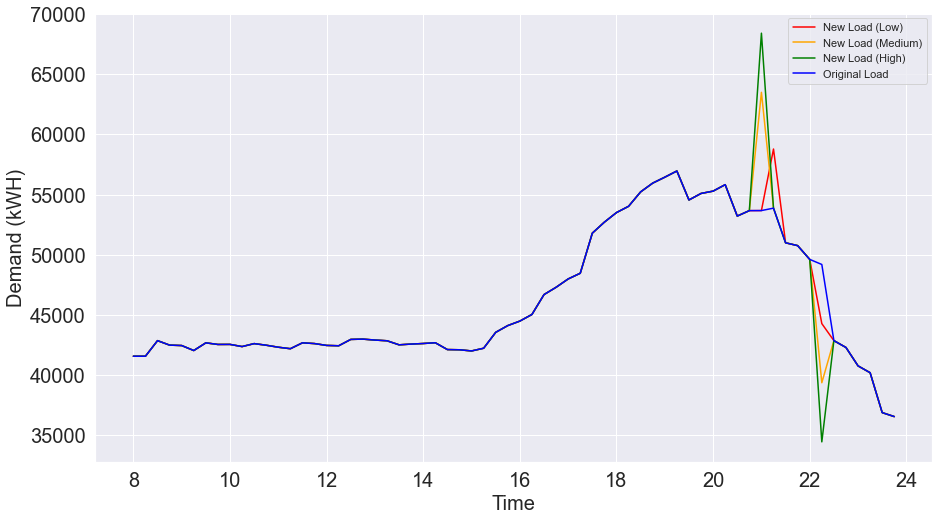

-------------------------
Date: 2018-01-02
Emissions Savings Using Low Estimates: 249.7956857802302 lb. CO2
Emissions Savings Using Med Estimates: 1111.9937275468305 lb. CO2
Emissions Savings Using High Estimates: 1667.9900987195567 lb. CO2


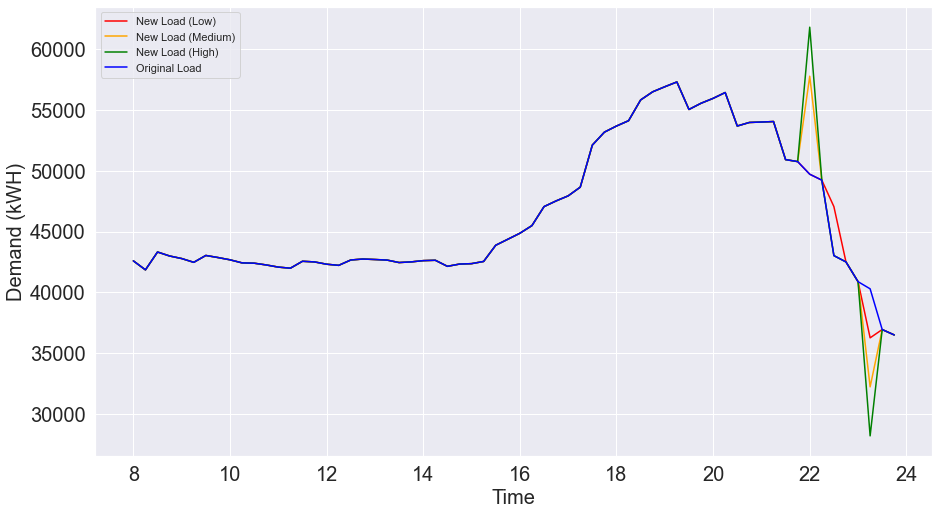

-------------------------
Date: 2018-01-04
Emissions Savings Using Low Estimates: 1289.1392745983694 lb. CO2
Emissions Savings Using Med Estimates: 2578.278910559563 lb. CO2
Emissions Savings Using High Estimates: 3867.4183775131432 lb. CO2


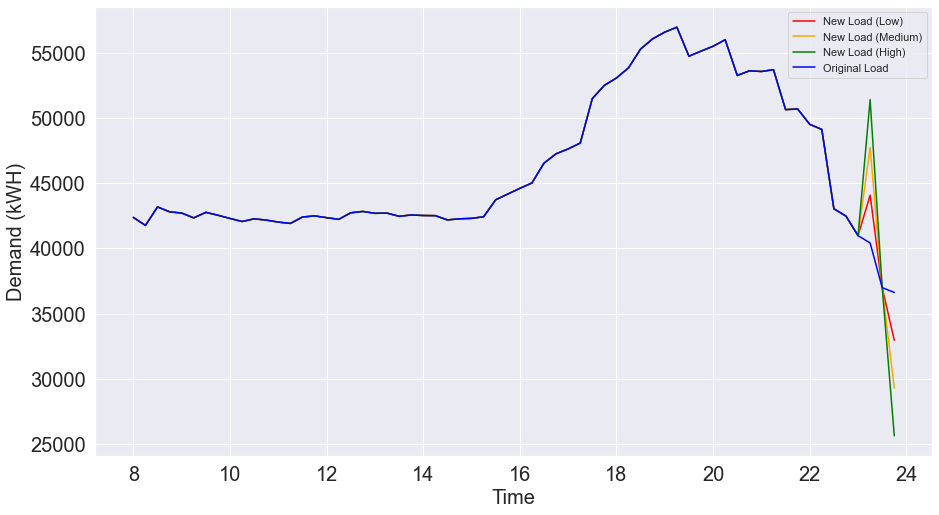

-------------------------
Date: 2018-01-05
Emissions Savings Using Low Estimates: 3977.3591337422167 lb. CO2
Emissions Savings Using Med Estimates: 7954.716868353322 lb. CO2
Emissions Savings Using High Estimates: 11932.075394302985 lb. CO2


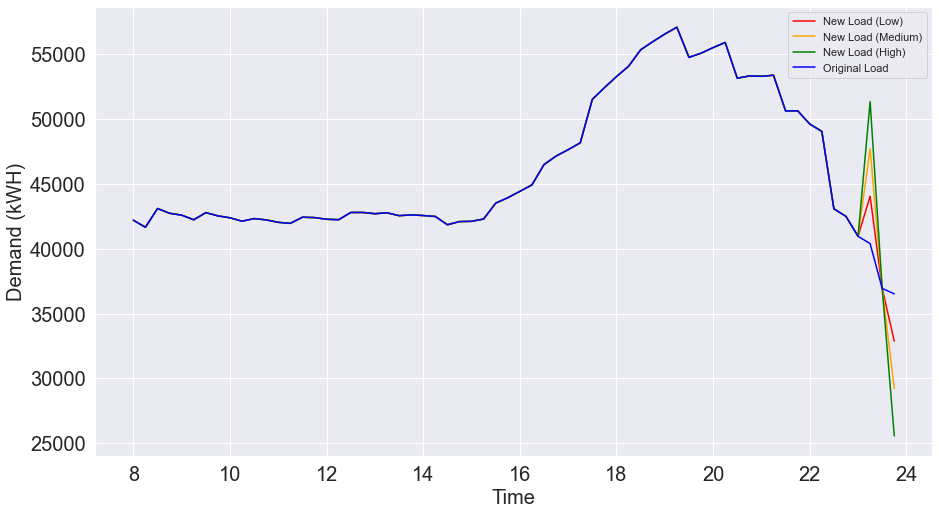

-------------------------
Date: 2018-01-08
Emissions Savings Using Low Estimates: 168.46557193036844 lb. CO2
Emissions Savings Using Med Estimates: 996.1466595258107 lb. CO2
Emissions Savings Using High Estimates: 1494.2190637299045 lb. CO2


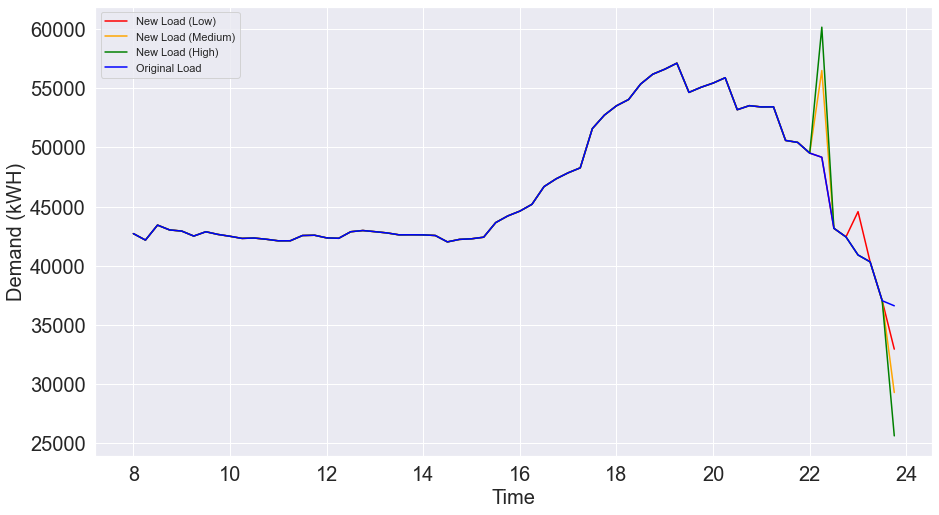

-------------------------
Date: 2018-01-09
Emissions Savings Using Low Estimates: 229.45397592481925 lb. CO2
Emissions Savings Using Med Estimates: 925.0998829145748 lb. CO2
Emissions Savings Using High Estimates: 1682.6617659374122 lb. CO2


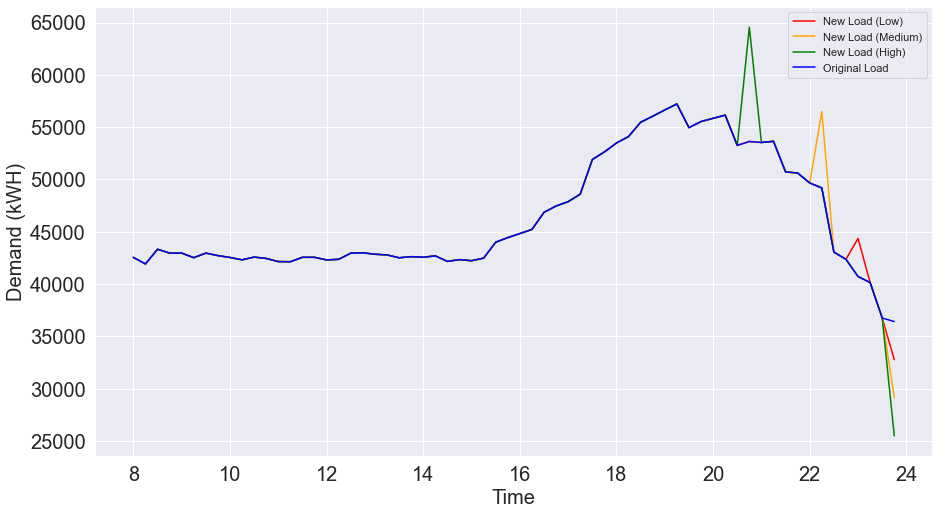

-------------------------
Date: 2018-01-14
Emissions Savings Using Low Estimates: 4057.906945063037 lb. CO2
Emissions Savings Using Med Estimates: 8115.816043134573 lb. CO2
Emissions Savings Using High Estimates: 13543.926938207209 lb. CO2


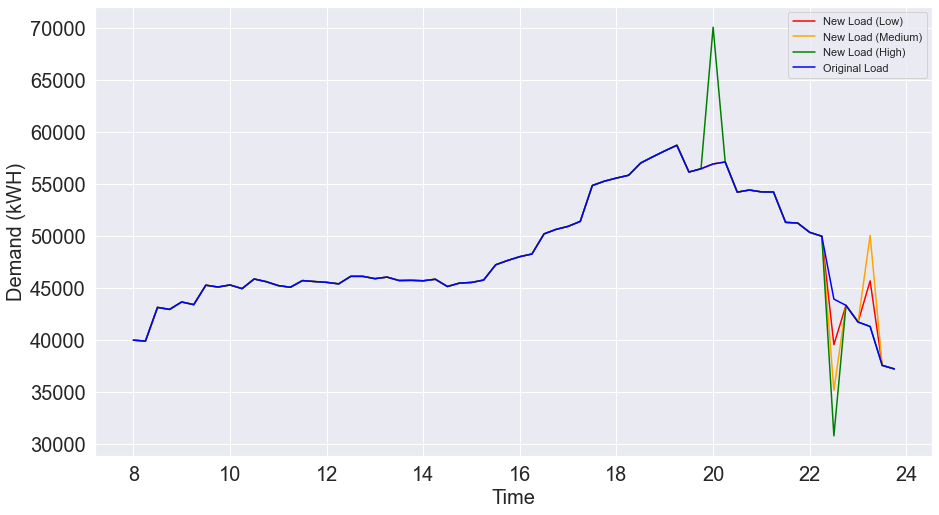

-------------------------
Date: 2018-01-15
Emissions Savings Using Low Estimates: 669.5165669061264 lb. CO2
Emissions Savings Using Med Estimates: 1491.3791468595862 lb. CO2
Emissions Savings Using High Estimates: 3127.085380308043 lb. CO2


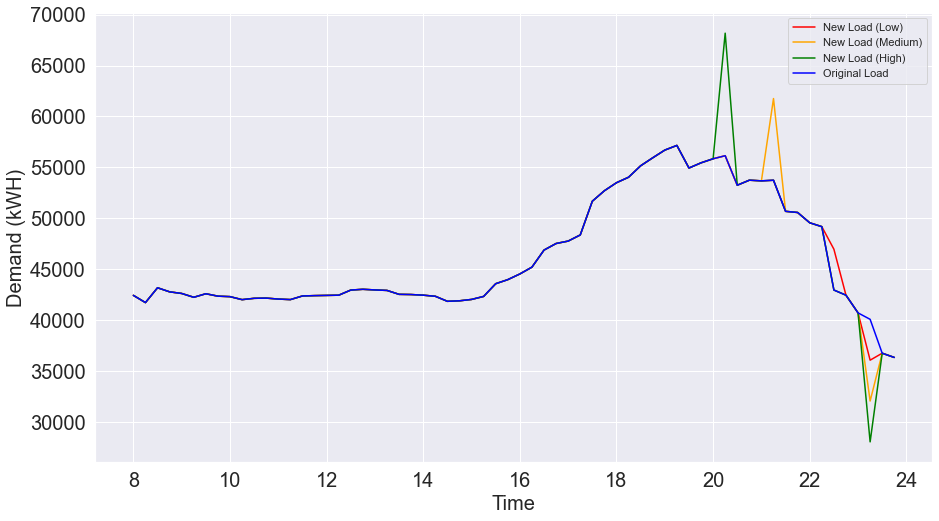

-------------------------
Date: 2018-01-16
Emissions Savings Using Low Estimates: 134.7920096674096 lb. CO2
Emissions Savings Using Med Estimates: 437.18342091756125 lb. CO2
Emissions Savings Using High Estimates: 4317.191728115735 lb. CO2


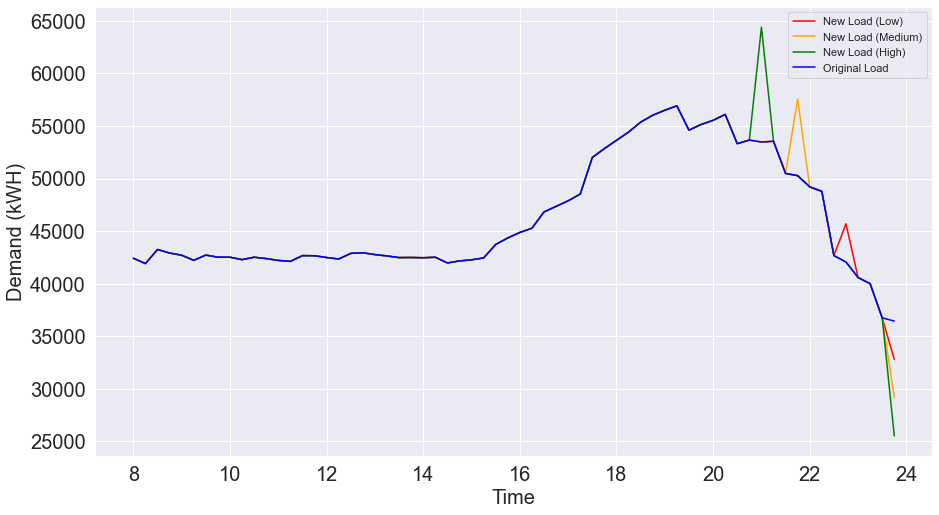

-------------------------
Date: 2018-01-17
Emissions Savings Using Low Estimates: 1197.902137063518 lb. CO2
Emissions Savings Using Med Estimates: 2808.602424946743 lb. CO2
Emissions Savings Using High Estimates: 4212.903735278862 lb. CO2


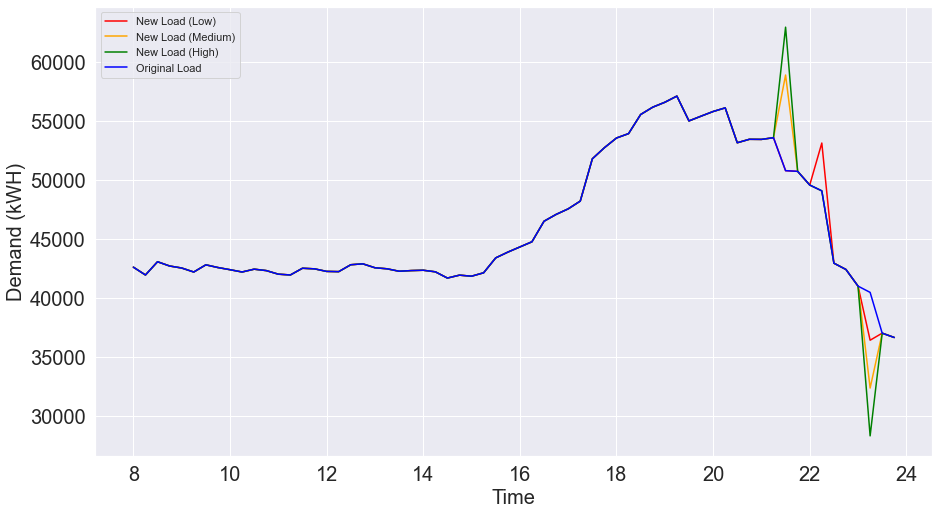

-------------------------
Date: 2018-01-18
Emissions Savings Using Low Estimates: 4113.800822876937 lb. CO2
Emissions Savings Using Med Estimates: 8227.603927412027 lb. CO2
Emissions Savings Using High Estimates: 12341.406000457748 lb. CO2


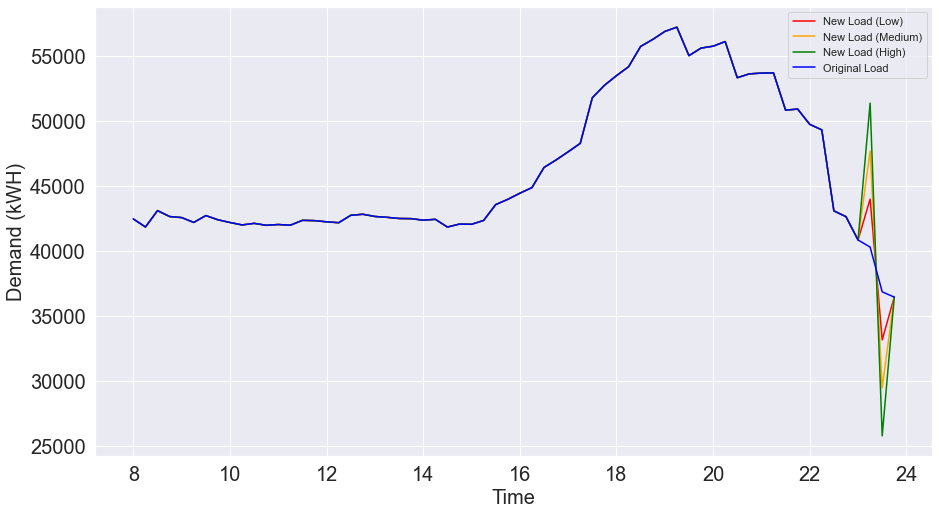

-------------------------
Date: 2018-01-19
Emissions Savings Using Low Estimates: 459.56854382750083 lb. CO2
Emissions Savings Using Med Estimates: 1070.993552486311 lb. CO2
Emissions Savings Using High Estimates: 8739.801392699299 lb. CO2


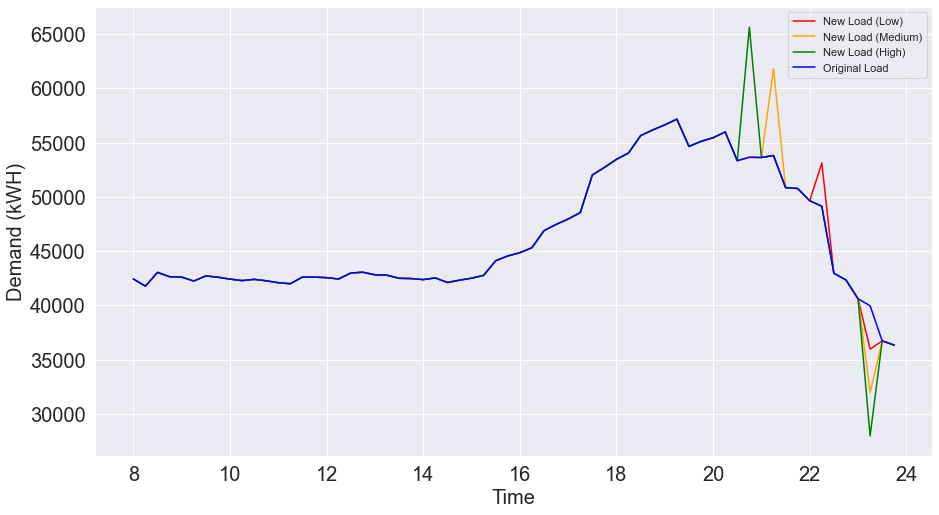

-------------------------
Date: 2018-01-21
Emissions Savings Using Low Estimates: 3877.0270572574796 lb. CO2
Emissions Savings Using Med Estimates: 7754.0557642302665 lb. CO2
Emissions Savings Using High Estimates: 11776.894104240748 lb. CO2


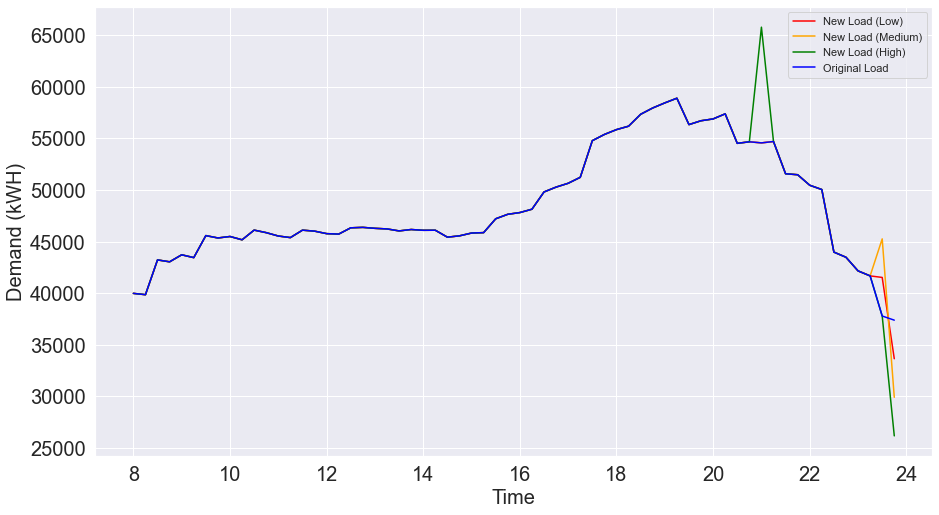

-------------------------
Date: 2018-01-23
Emissions Savings Using Low Estimates: 332.0979869978259 lb. CO2
Emissions Savings Using Med Estimates: 723.049495785372 lb. CO2
Emissions Savings Using High Estimates: 1362.0197173287374 lb. CO2


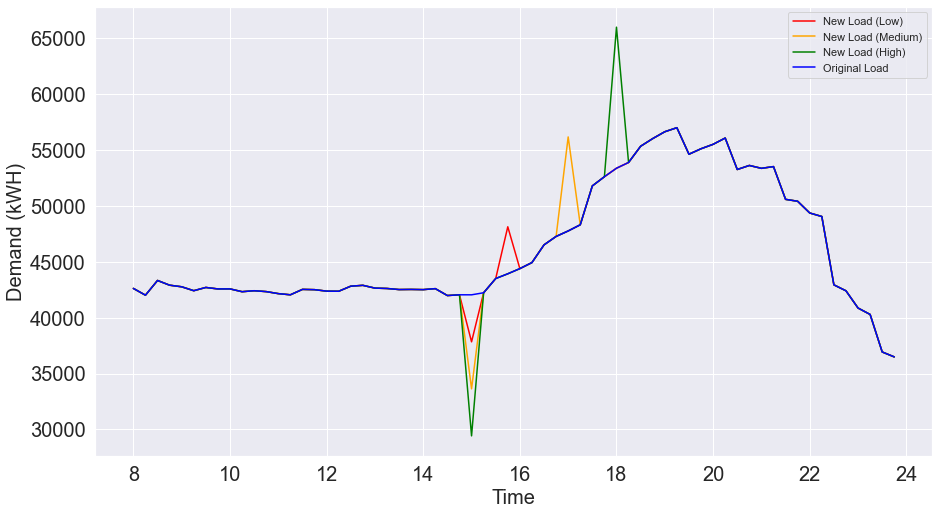

-------------------------
Date: 2018-01-25
Emissions Savings Using Low Estimates: 4281.818766171078 lb. CO2
Emissions Savings Using Med Estimates: 8571.686127340756 lb. CO2
Emissions Savings Using High Estimates: 12857.528970237001 lb. CO2


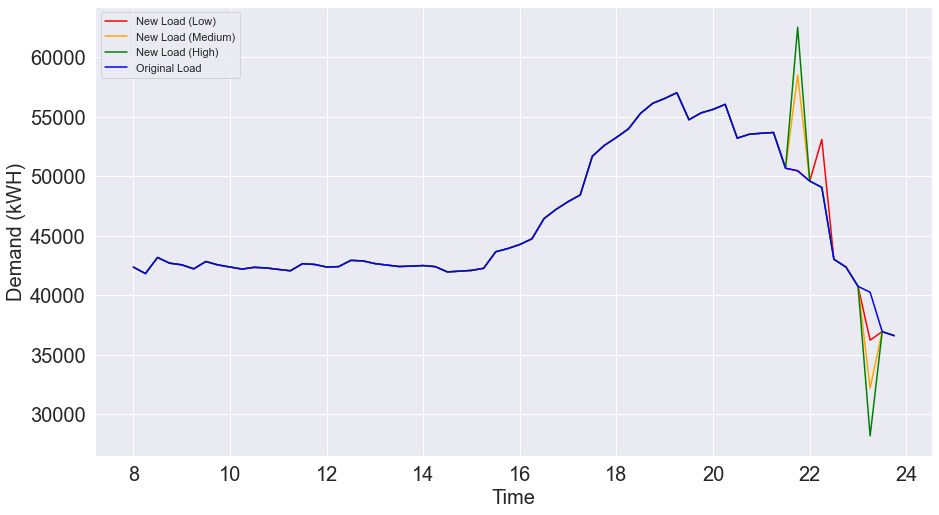

-------------------------
Date: 2018-01-26
Emissions Savings Using Low Estimates: 289.6743643892001 lb. CO2
Emissions Savings Using Med Estimates: 688.5022863525876 lb. CO2
Emissions Savings Using High Estimates: 1120.915471864908 lb. CO2


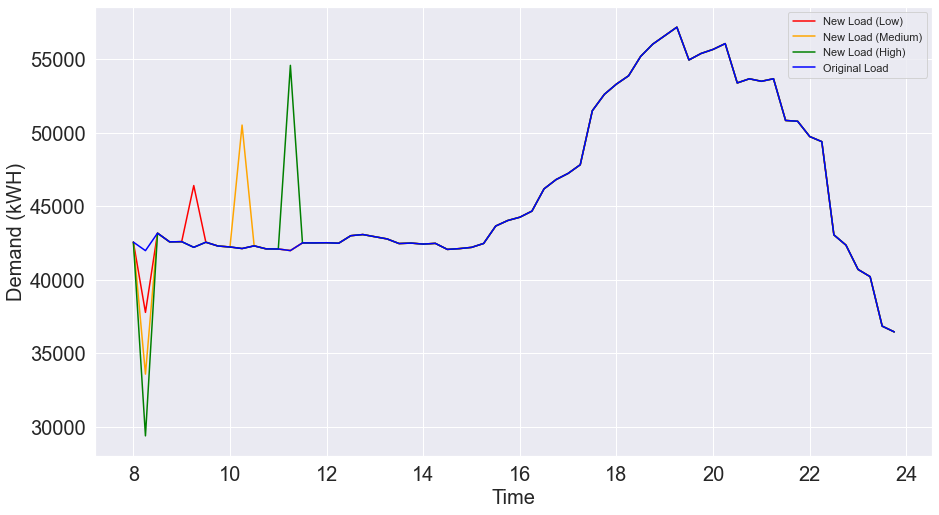

-------------------------
Date: 2018-01-29
Emissions Savings Using Low Estimates: 2024.629867902652 lb. CO2
Emissions Savings Using Med Estimates: 4049.2597413163544 lb. CO2
Emissions Savings Using High Estimates: 6073.889720520091 lb. CO2


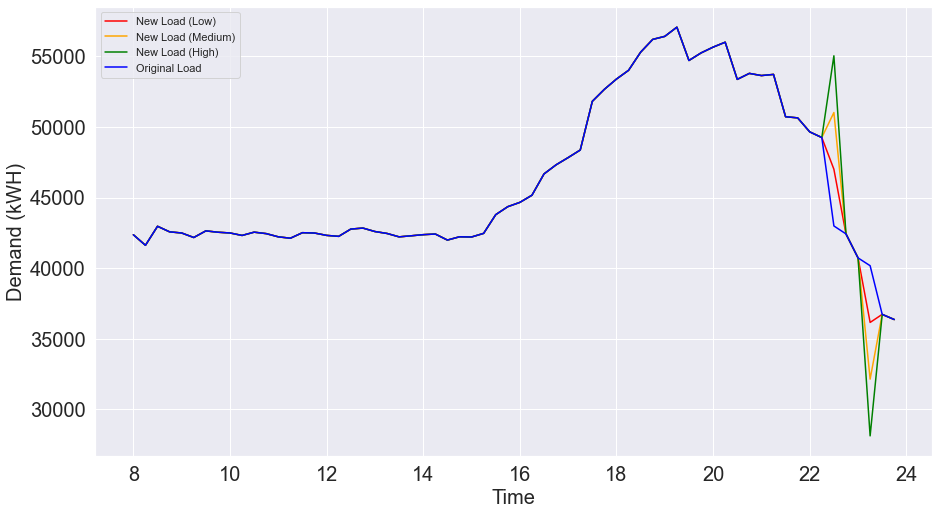

-------------------------
Date: 2018-02-01
Emissions Savings Using Low Estimates: 5067.406835722486 lb. CO2
Emissions Savings Using Med Estimates: 10134.813892908169 lb. CO2
Emissions Savings Using High Estimates: 15202.220854734624 lb. CO2


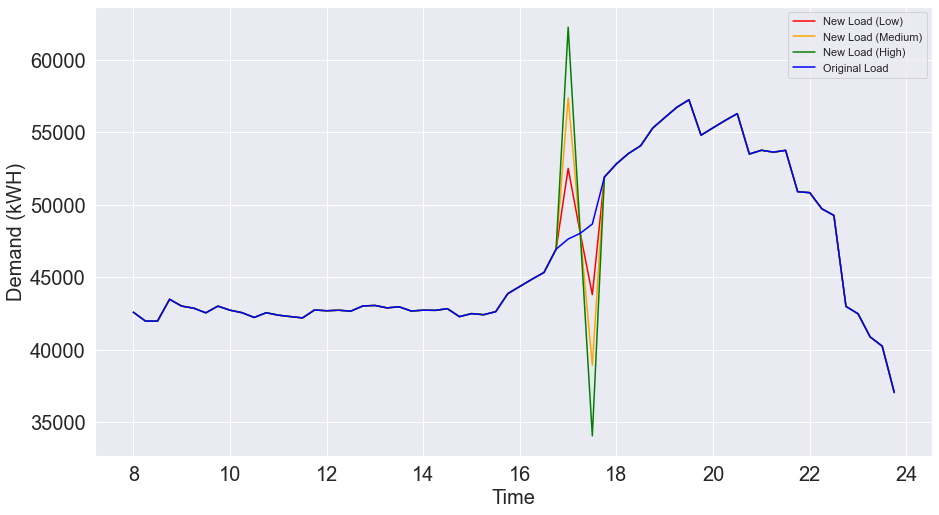

-------------------------
Date: 2018-02-05
Emissions Savings Using Low Estimates: 288.8651230358766 lb. CO2
Emissions Savings Using Med Estimates: 849.6008208340247 lb. CO2
Emissions Savings Using High Estimates: 12947.962595183275 lb. CO2


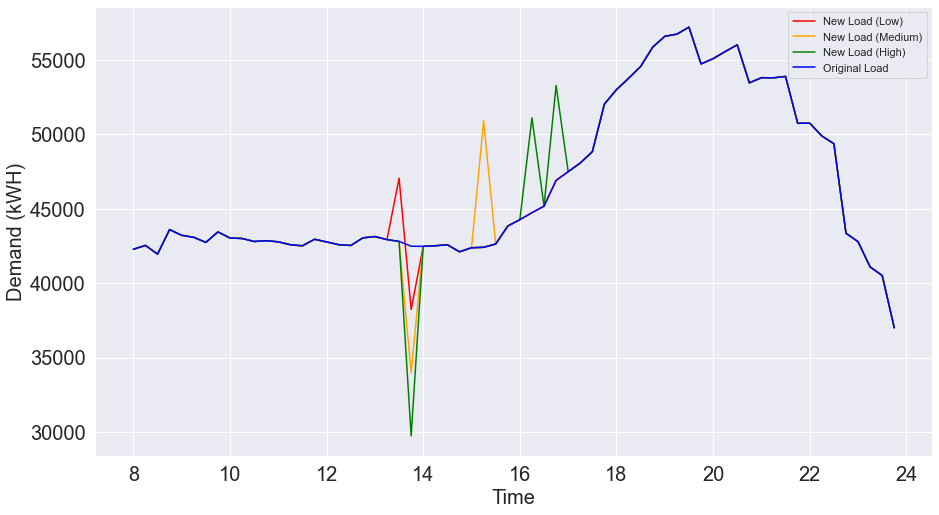

-------------------------
Date: 2018-02-09
Emissions Savings Using Low Estimates: 4585.0401155517175 lb. CO2
Emissions Savings Using Med Estimates: 9170.081490193306 lb. CO2
Emissions Savings Using High Estimates: 13755.122709261055 lb. CO2


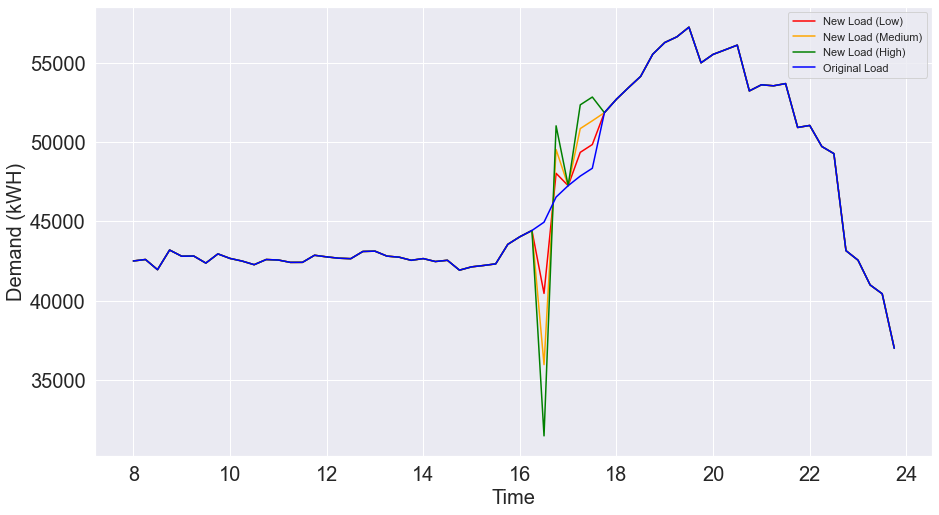

-------------------------
Date: 2018-02-12
Emissions Savings Using Low Estimates: 1327.5066077255606 lb. CO2
Emissions Savings Using Med Estimates: 5641.94294021868 lb. CO2
Emissions Savings Using High Estimates: 12975.398821743636 lb. CO2


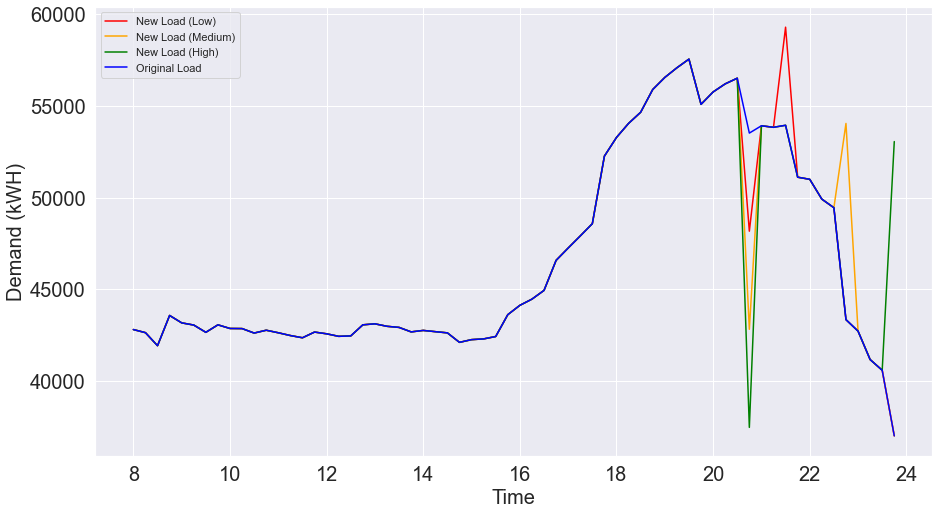

-------------------------
Date: 2018-02-13
Emissions Savings Using Low Estimates: 3549.4990636819048 lb. CO2
Emissions Savings Using Med Estimates: 7098.994219073362 lb. CO2
Emissions Savings Using High Estimates: 11063.21590675686 lb. CO2


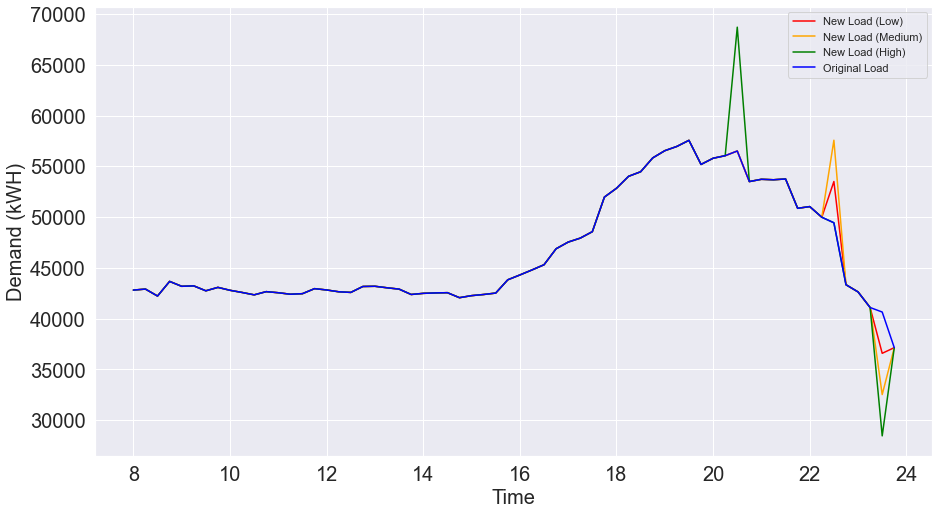

-------------------------
Date: 2018-02-14
Emissions Savings Using Low Estimates: 428.1988238461204 lb. CO2
Emissions Savings Using Med Estimates: 1442.843264226783 lb. CO2
Emissions Savings Using High Estimates: 6422.987961282518 lb. CO2


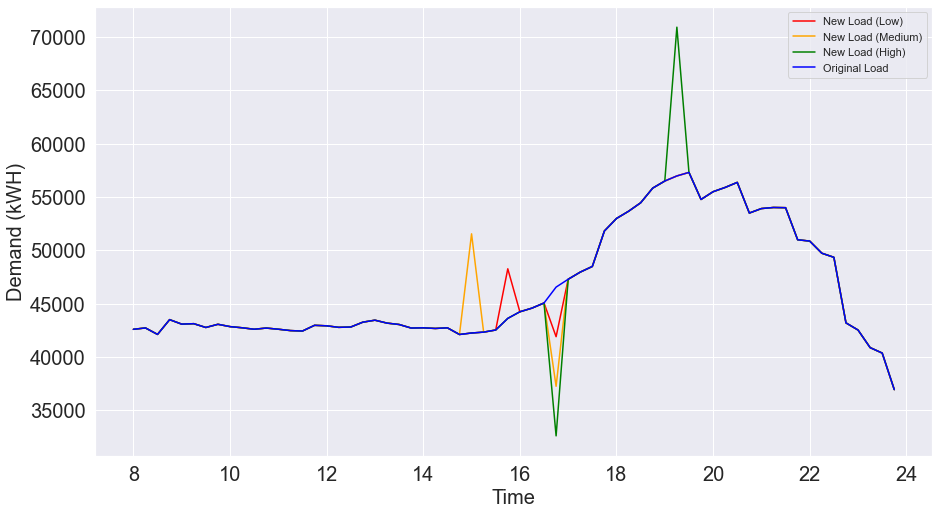

-------------------------
Date: 2018-02-19
Emissions Savings Using Low Estimates: 2758.6959963303207 lb. CO2
Emissions Savings Using Med Estimates: 7907.451467513604 lb. CO2
Emissions Savings Using High Estimates: 12310.832789765727 lb. CO2


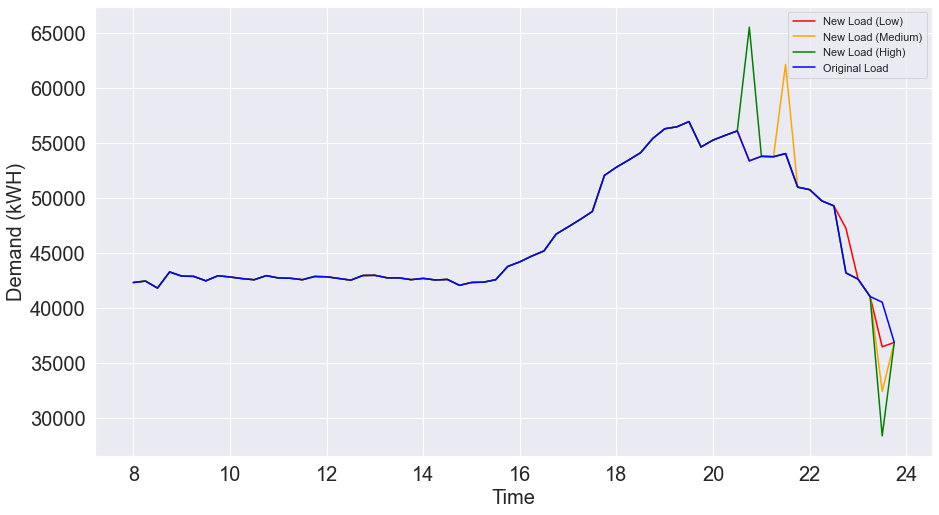

-------------------------
Date: 2018-02-21
Emissions Savings Using Low Estimates: 1293.2810311778233 lb. CO2
Emissions Savings Using Med Estimates: 9169.727087006611 lb. CO2
Emissions Savings Using High Estimates: 13754.590314657997 lb. CO2


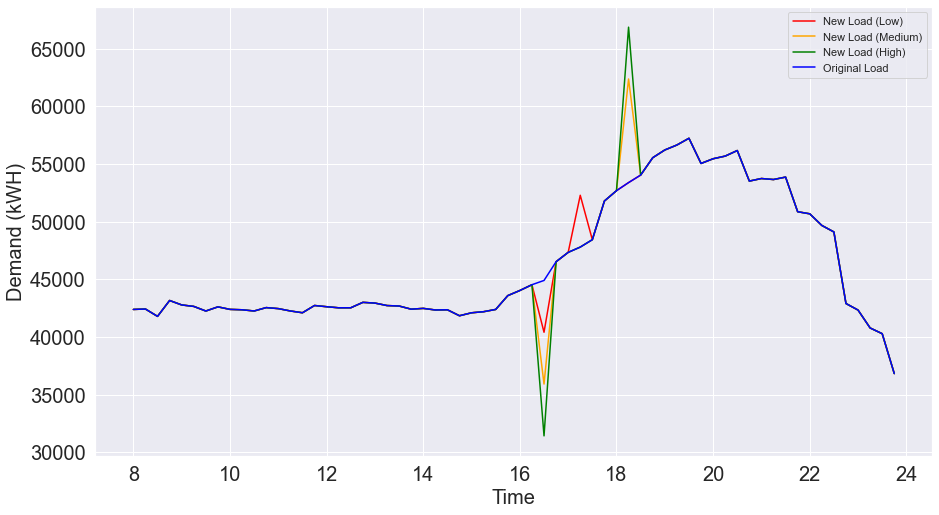

-------------------------
Date: 2018-02-26
Emissions Savings Using Low Estimates: 5156.135985774565 lb. CO2
Emissions Savings Using Med Estimates: 11329.578159267658 lb. CO2
Emissions Savings Using High Estimates: 16994.367151854283 lb. CO2


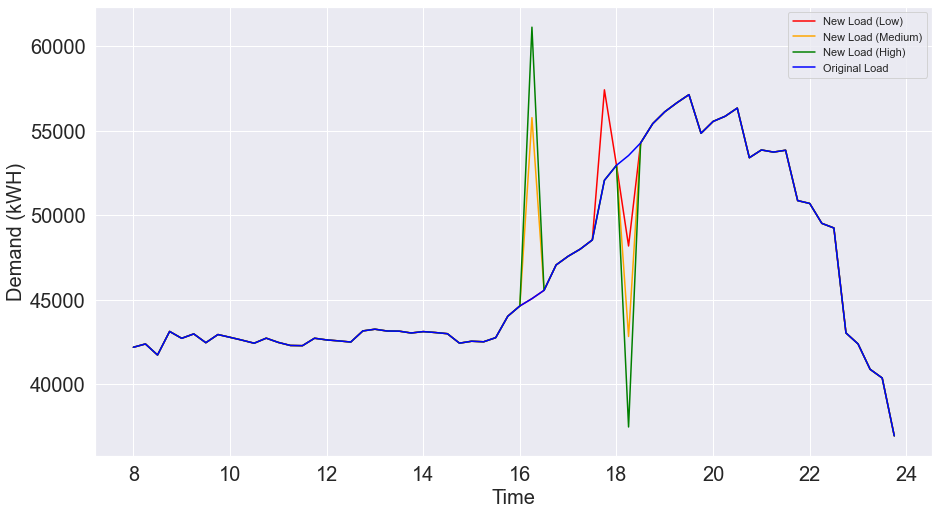

-------------------------
Date: 2018-02-27
Emissions Savings Using Low Estimates: 2450.27972170785 lb. CO2
Emissions Savings Using Med Estimates: 7423.619836787487 lb. CO2
Emissions Savings Using High Estimates: 12154.356684343404 lb. CO2


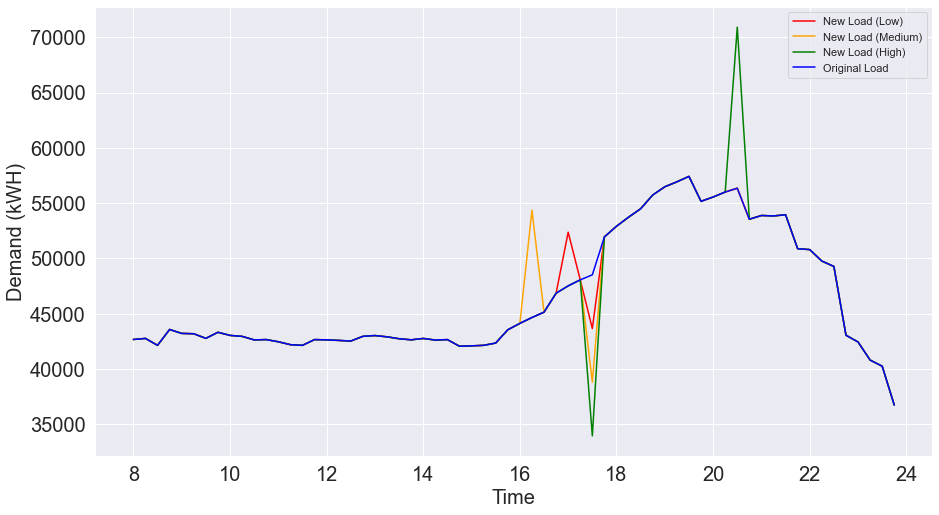

-------------------------
Date: 2018-02-28
Emissions Savings Using Low Estimates: 1922.142781744116 lb. CO2
Emissions Savings Using Med Estimates: 4627.680548900096 lb. CO2
Emissions Savings Using High Estimates: 6941.520860469296 lb. CO2


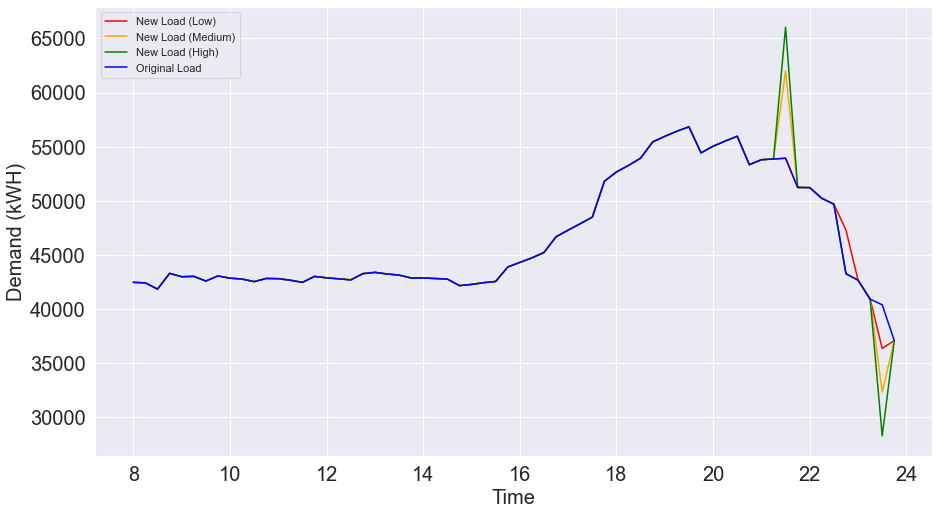

-------------------------
Date: 2018-03-01
Emissions Savings Using Low Estimates: 1761.007081486693 lb. CO2
Emissions Savings Using Med Estimates: 3748.2725350989876 lb. CO2
Emissions Savings Using High Estimates: 5622.410985649175 lb. CO2


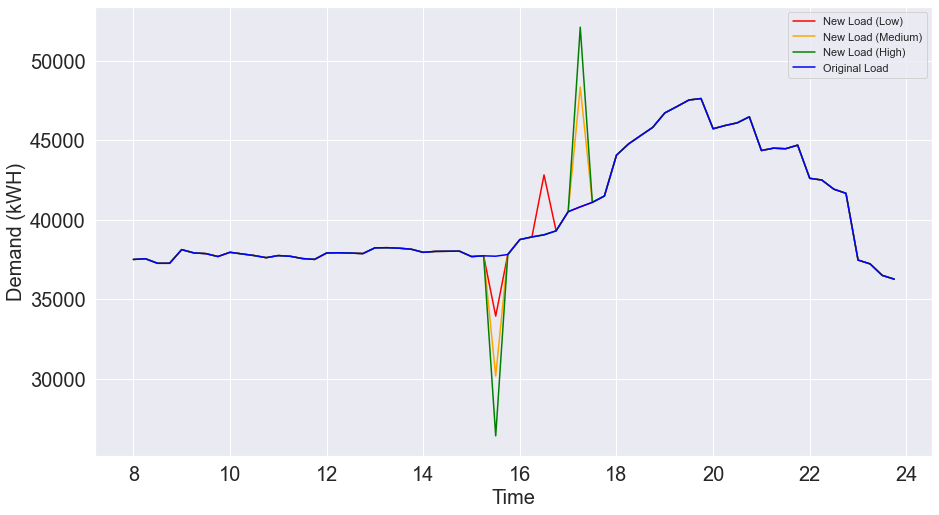

-------------------------
Date: 2018-03-11
Emissions Savings Using Low Estimates: 2807.655439602742 lb. CO2
Emissions Savings Using Med Estimates: 6229.74692999262 lb. CO2
Emissions Savings Using High Estimates: 13095.280709378063 lb. CO2


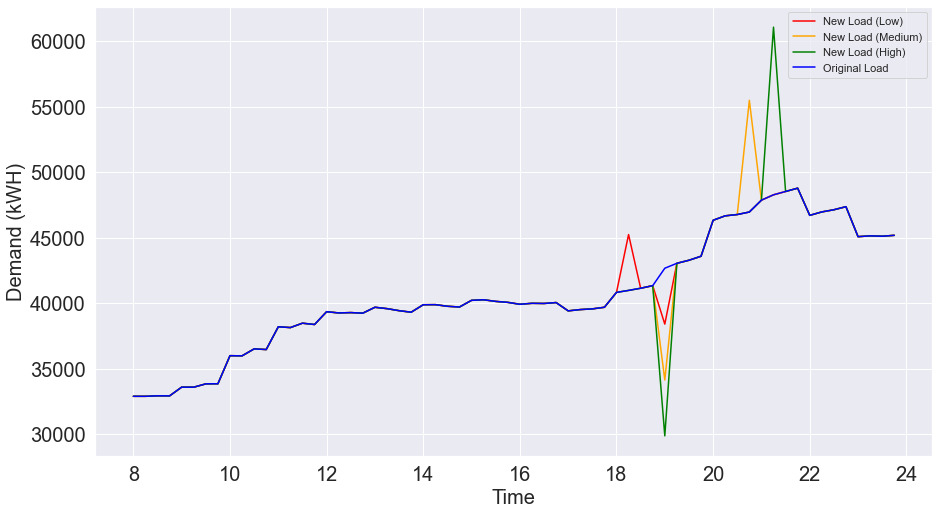

-------------------------
Date: 2018-03-12
Emissions Savings Using Low Estimates: 585.0922714272389 lb. CO2
Emissions Savings Using Med Estimates: 1170.1840919013298 lb. CO2
Emissions Savings Using High Estimates: 1755.2750512899252 lb. CO2


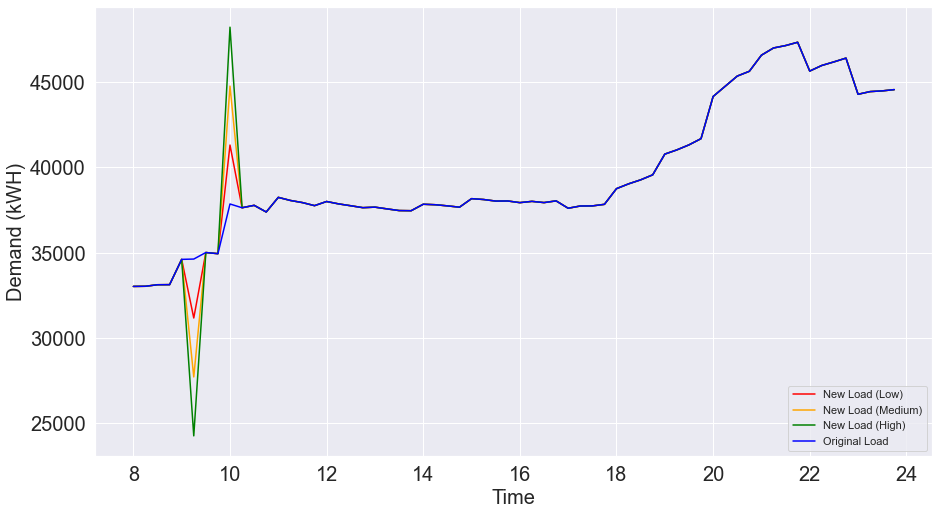

-------------------------
Date: 2018-03-15
Emissions Savings Using Low Estimates: 2965.620852235033 lb. CO2
Emissions Savings Using Med Estimates: 8378.18955028693 lb. CO2
Emissions Savings Using High Estimates: 12567.285972486074 lb. CO2


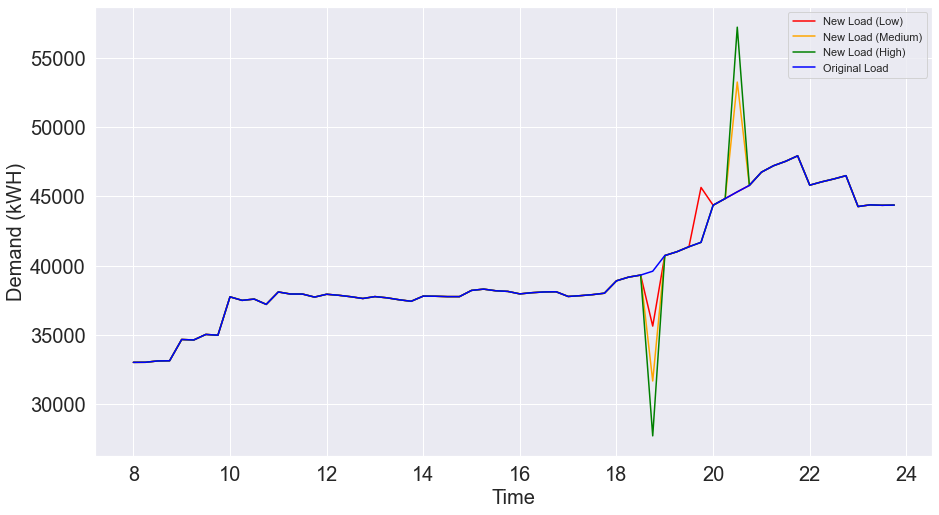

-------------------------
Date: 2018-03-20
Emissions Savings Using Low Estimates: 2028.6066962689695 lb. CO2
Emissions Savings Using Med Estimates: 4057.210938299343 lb. CO2
Emissions Savings Using High Estimates: 7937.493140315413 lb. CO2


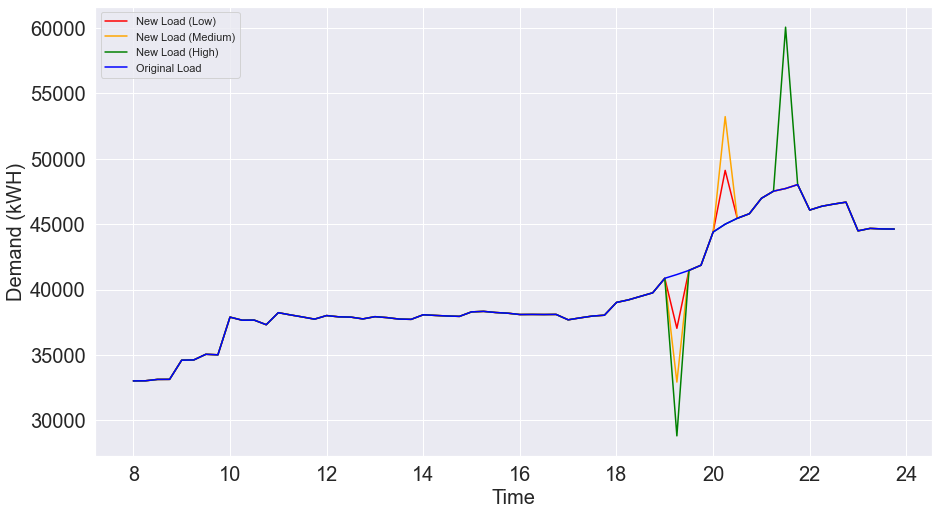

-------------------------
Date: 2018-03-23
Emissions Savings Using Low Estimates: 610.7206573286751 lb. CO2
Emissions Savings Using Med Estimates: 1729.7426407813814 lb. CO2
Emissions Savings Using High Estimates: 2594.6108136246976 lb. CO2


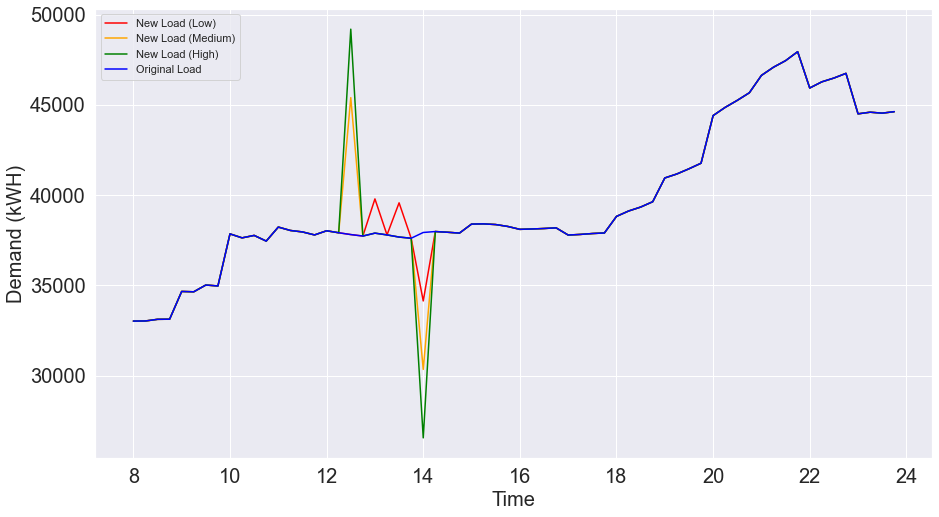

-------------------------
Date: 2018-04-19
Emissions Savings Using Low Estimates: 640.2872287975081 lb. CO2
Emissions Savings Using Med Estimates: 1499.0241769077606 lb. CO2
Emissions Savings Using High Estimates: 2372.82597785167 lb. CO2


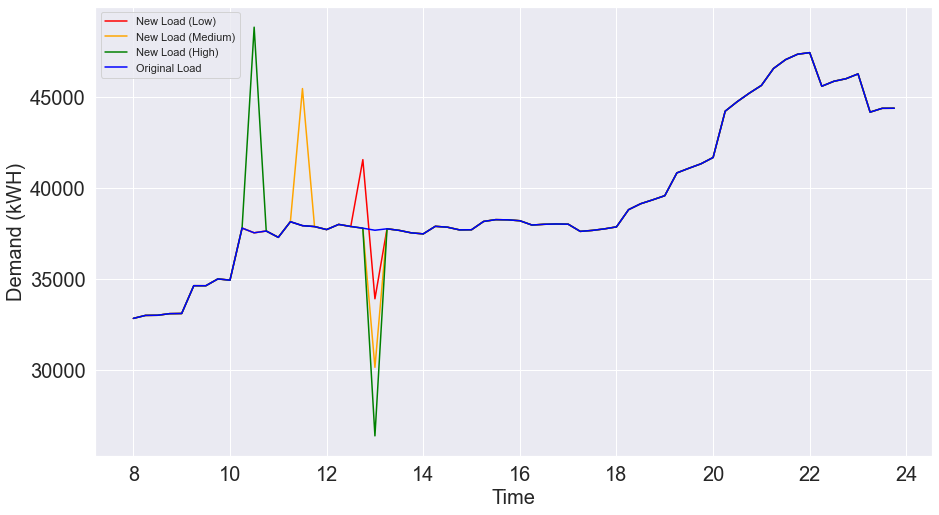

-------------------------
Date: 2018-04-20
Emissions Savings Using Low Estimates: 733.3388060117932 lb. CO2
Emissions Savings Using Med Estimates: 1701.0434220409788 lb. CO2
Emissions Savings Using High Estimates: 2551.5675532923997 lb. CO2


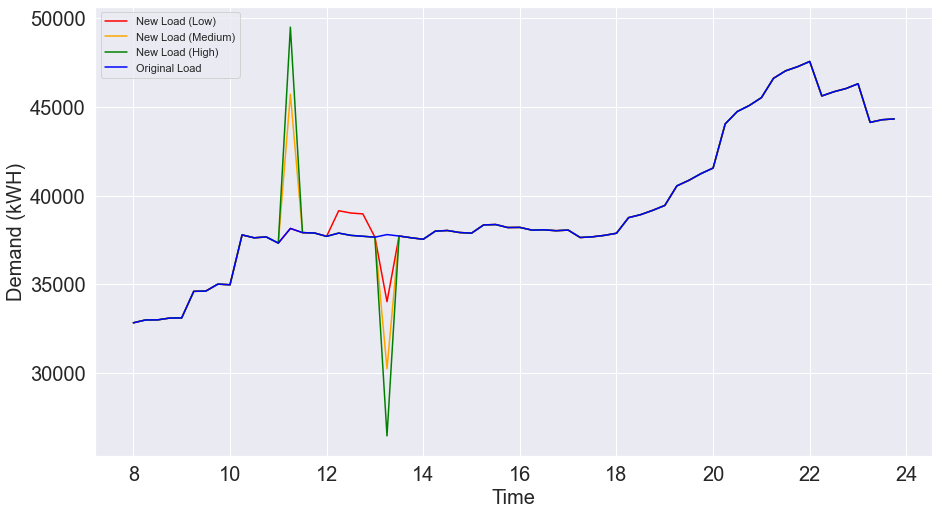

-------------------------
Date: 2018-04-21
Emissions Savings Using Low Estimates: 651.9921259526411 lb. CO2
Emissions Savings Using Med Estimates: 1694.398625704503 lb. CO2
Emissions Savings Using High Estimates: 2541.598156811864 lb. CO2


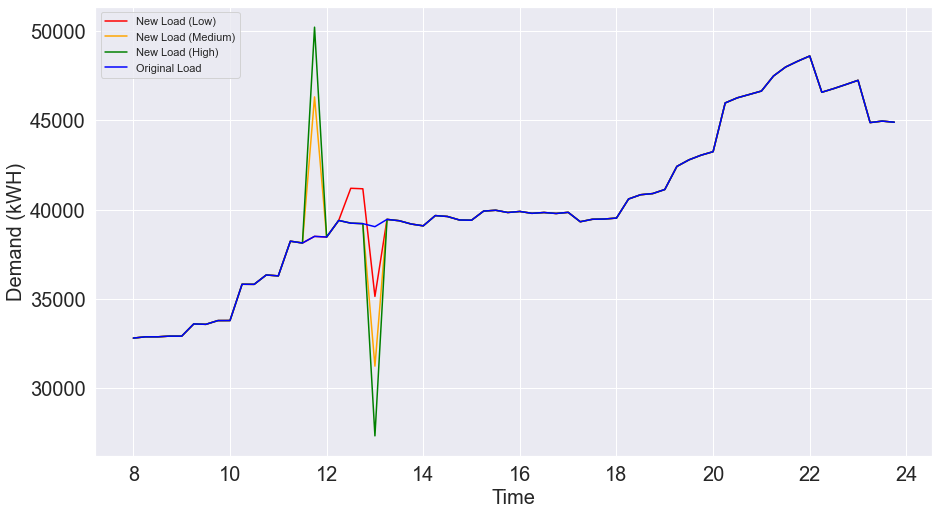

-------------------------
Date: 2018-04-22
Emissions Savings Using Low Estimates: 658.1901980341703 lb. CO2
Emissions Savings Using Med Estimates: 1449.581668988775 lb. CO2
Emissions Savings Using High Estimates: 2397.693924314461 lb. CO2


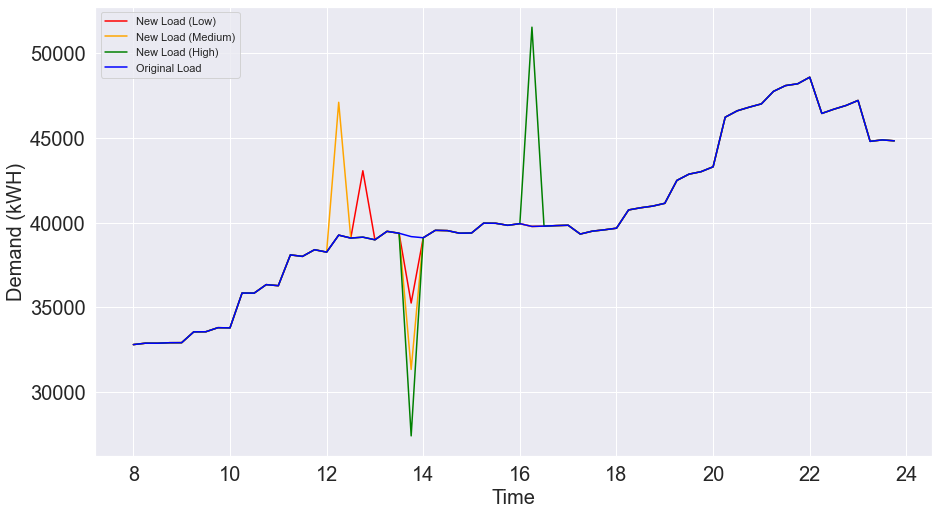

-------------------------
Date: 2018-04-23
Emissions Savings Using Low Estimates: 647.0369474312901 lb. CO2
Emissions Savings Using Med Estimates: 1294.0734172127197 lb. CO2
Emissions Savings Using High Estimates: 1941.111616541662 lb. CO2


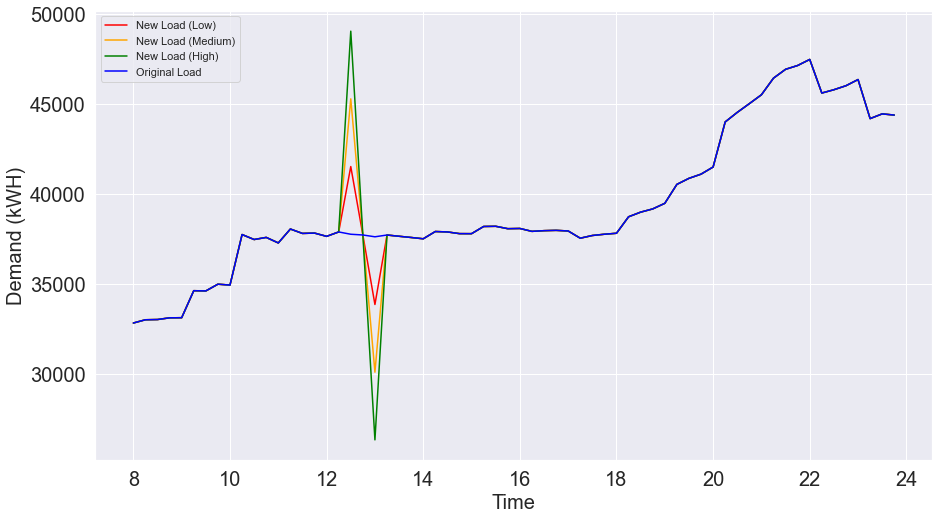

-------------------------
Date: 2018-04-24
Emissions Savings Using Low Estimates: 736.156104849925 lb. CO2
Emissions Savings Using Med Estimates: 1570.4657863881828 lb. CO2
Emissions Savings Using High Estimates: 2355.7003397020426 lb. CO2


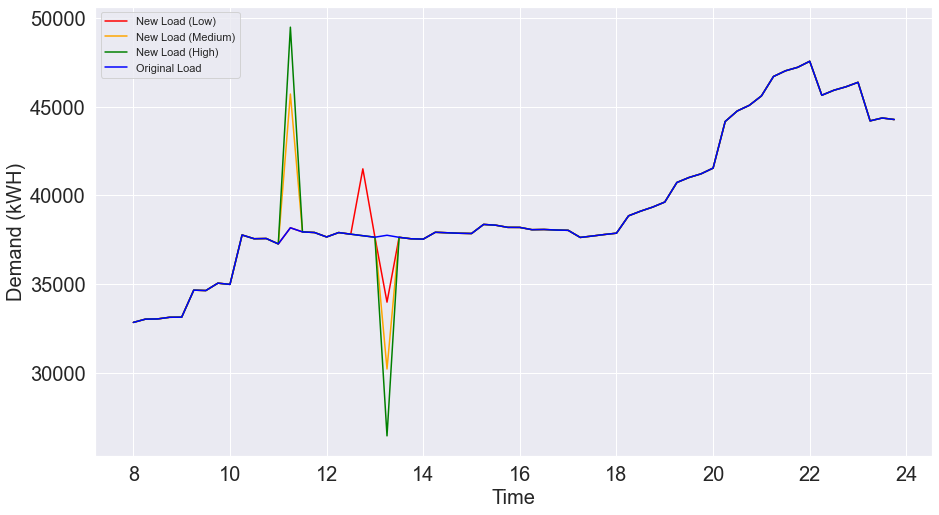

-------------------------
Date: 2018-12-02
Emissions Savings Using Low Estimates: 5943.995081663303 lb. CO2
Emissions Savings Using Med Estimates: 11887.990347456484 lb. CO2
Emissions Savings Using High Estimates: 17831.985580601897 lb. CO2


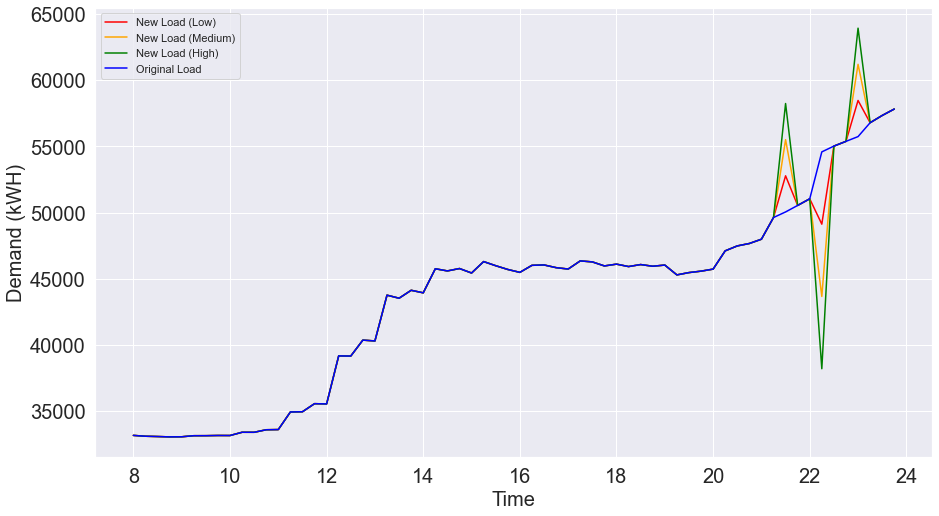

-------------------------
Date: 2018-12-03
Emissions Savings Using Low Estimates: 511.143499409023 lb. CO2
Emissions Savings Using Med Estimates: 2646.486275021133 lb. CO2
Emissions Savings Using High Estimates: 3969.729504698582 lb. CO2


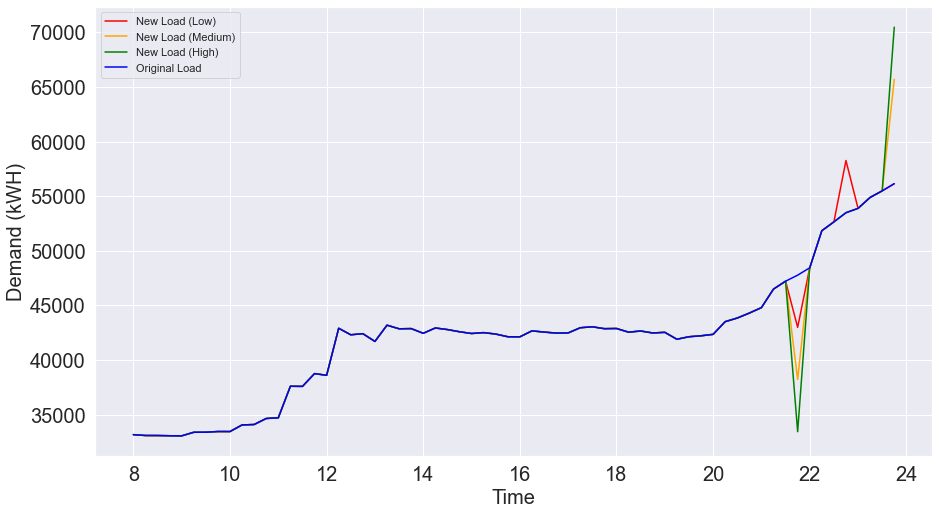

-------------------------
Date: 2018-12-04
Emissions Savings Using Low Estimates: 143.70472292052483 lb. CO2
Emissions Savings Using Med Estimates: 763.432322724494 lb. CO2
Emissions Savings Using High Estimates: 1145.1473956374284 lb. CO2


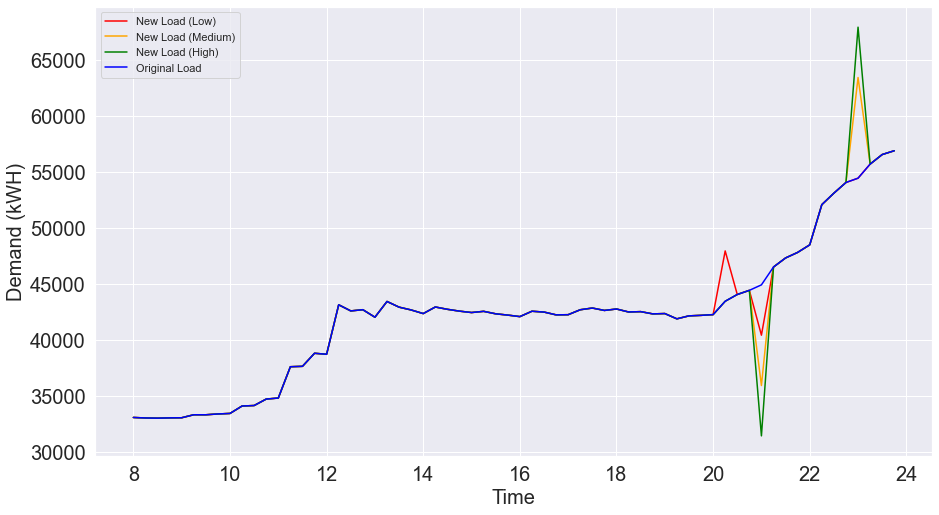

-------------------------
Date: 2018-12-06
Emissions Savings Using Low Estimates: 245.91261897048187 lb. CO2
Emissions Savings Using Med Estimates: 549.6871232628973 lb. CO2
Emissions Savings Using High Estimates: 824.5314111044314 lb. CO2


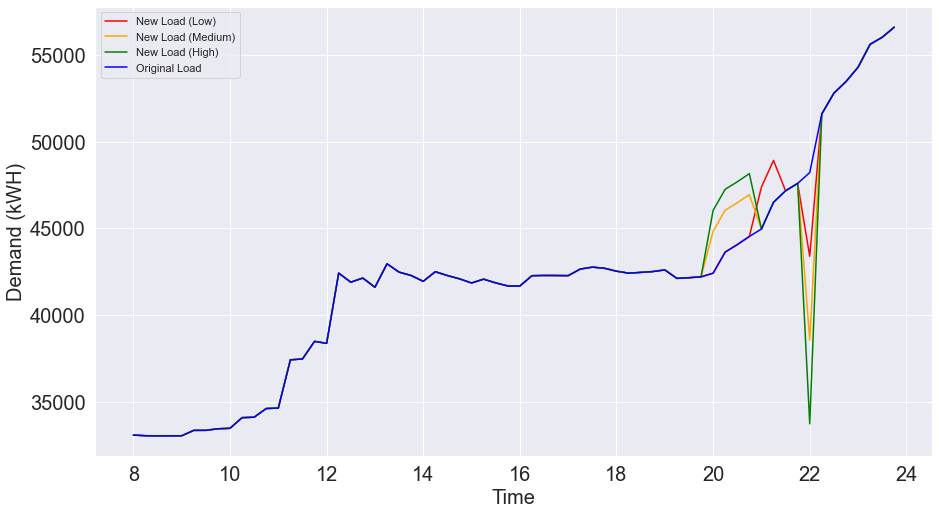

-------------------------
Date: 2018-12-07
Emissions Savings Using Low Estimates: 264.7055351801967 lb. CO2
Emissions Savings Using Med Estimates: 596.6378819676253 lb. CO2
Emissions Savings Using High Estimates: 894.9568148131792 lb. CO2


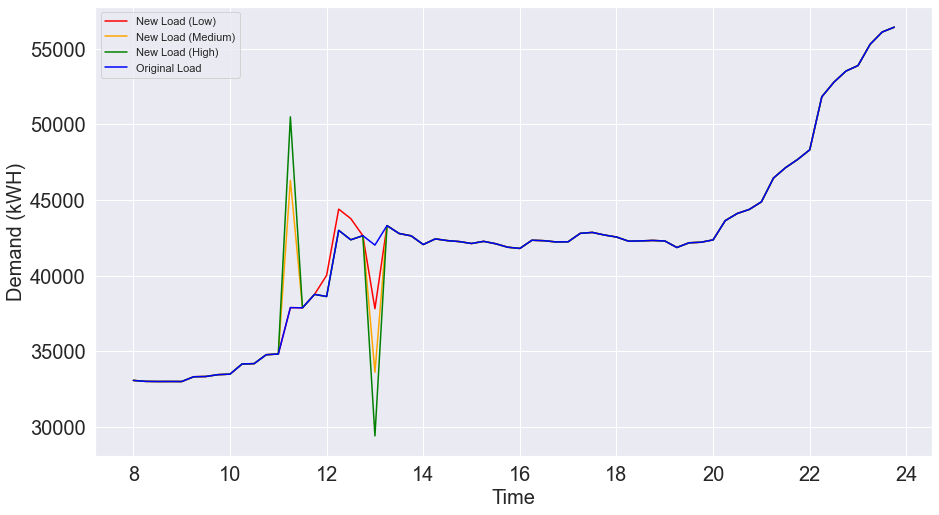

-------------------------
Date: 2018-12-08
Emissions Savings Using Low Estimates: 140.55449477086245 lb. CO2
Emissions Savings Using Med Estimates: 770.7835461000204 lb. CO2
Emissions Savings Using High Estimates: 1169.777628826363 lb. CO2


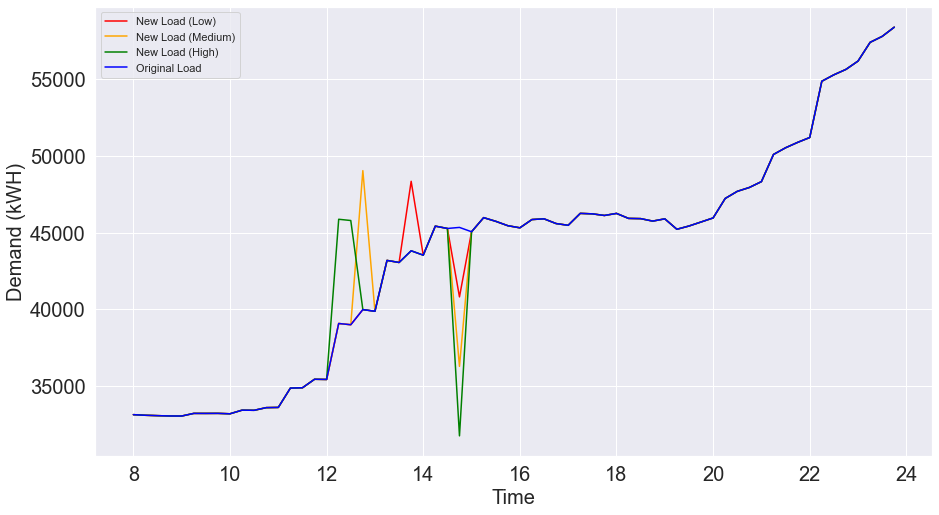

-------------------------
Date: 2018-12-10
Emissions Savings Using Low Estimates: 577.5790647160445 lb. CO2
Emissions Savings Using Med Estimates: 1155.1587224301227 lb. CO2
Emissions Savings Using High Estimates: 1732.73730362158 lb. CO2


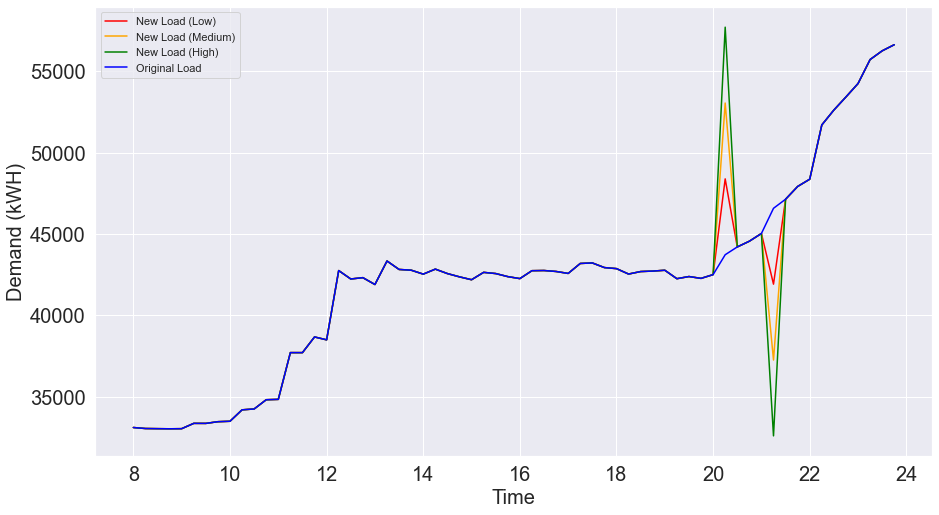

-------------------------
Date: 2018-12-11
Emissions Savings Using Low Estimates: 3698.6448889858407 lb. CO2
Emissions Savings Using Med Estimates: 7397.28982107165 lb. CO2
Emissions Savings Using High Estimates: 11095.934838505906 lb. CO2


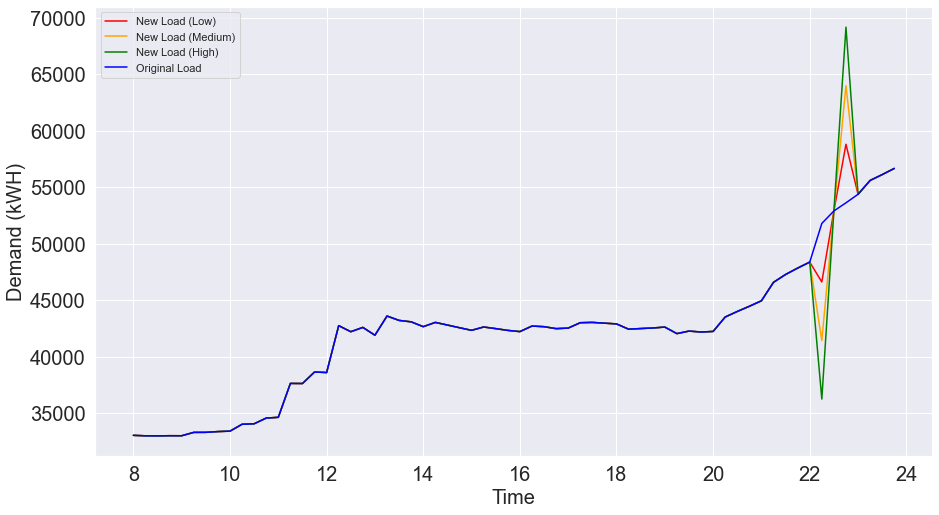

-------------------------
Date: 2018-12-12
Emissions Savings Using Low Estimates: 362.0101273836964 lb. CO2
Emissions Savings Using Med Estimates: 10988.137618539526 lb. CO2
Emissions Savings Using High Estimates: 16482.206857040364 lb. CO2


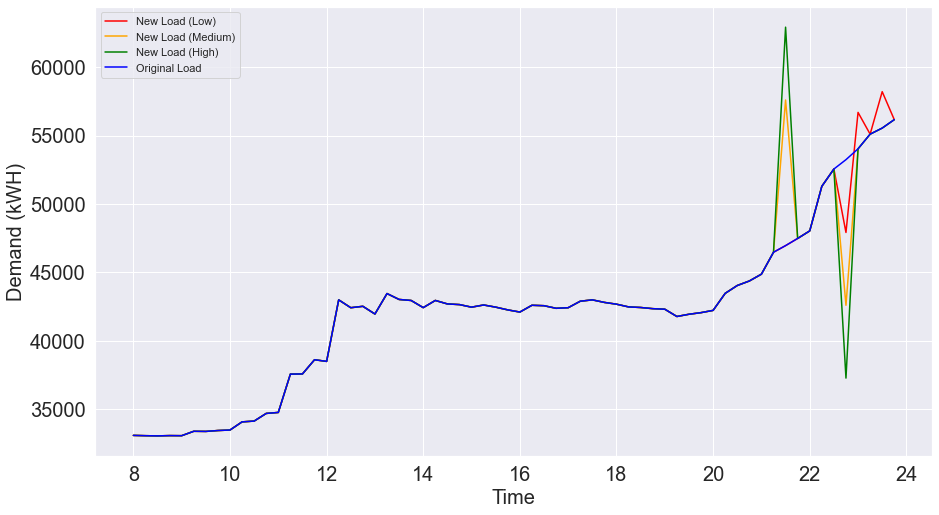

-------------------------
Date: 2018-12-13
Emissions Savings Using Low Estimates: 317.3135233795048 lb. CO2
Emissions Savings Using Med Estimates: 1308.9177809658752 lb. CO2
Emissions Savings Using High Estimates: 1963.3804906850096 lb. CO2


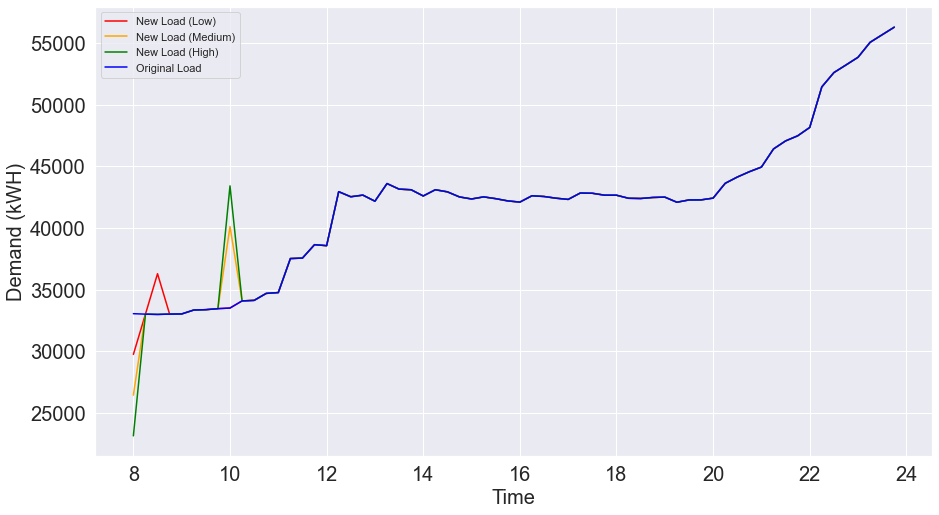

-------------------------
Date: 2018-12-14
Emissions Savings Using Low Estimates: 479.0780796358022 lb. CO2
Emissions Savings Using Med Estimates: 958.1591849899206 lb. CO2
Emissions Savings Using High Estimates: 1437.2393555929923 lb. CO2


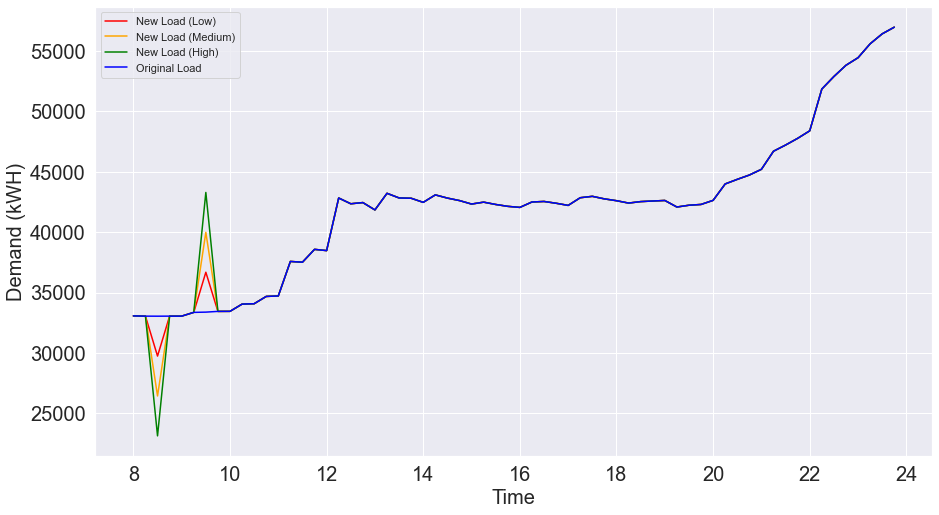

-------------------------
Date: 2018-12-15
Emissions Savings Using Low Estimates: 571.491157189759 lb. CO2
Emissions Savings Using Med Estimates: 1213.1654105506009 lb. CO2
Emissions Savings Using High Estimates: 5729.950839816162 lb. CO2


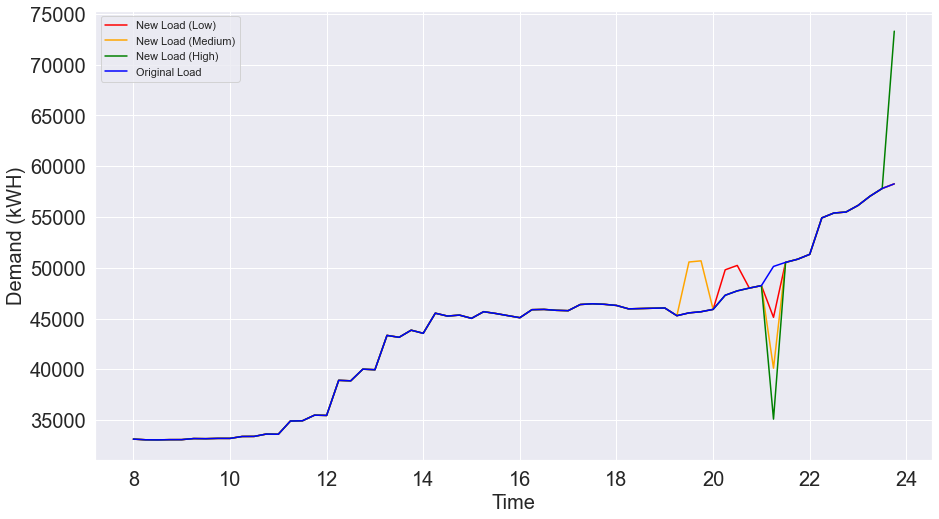

-------------------------
Date: 2018-12-16
Emissions Savings Using Low Estimates: 273.16557833393557 lb. CO2
Emissions Savings Using Med Estimates: 865.0252691155869 lb. CO2
Emissions Savings Using High Estimates: 1516.0706883516652 lb. CO2


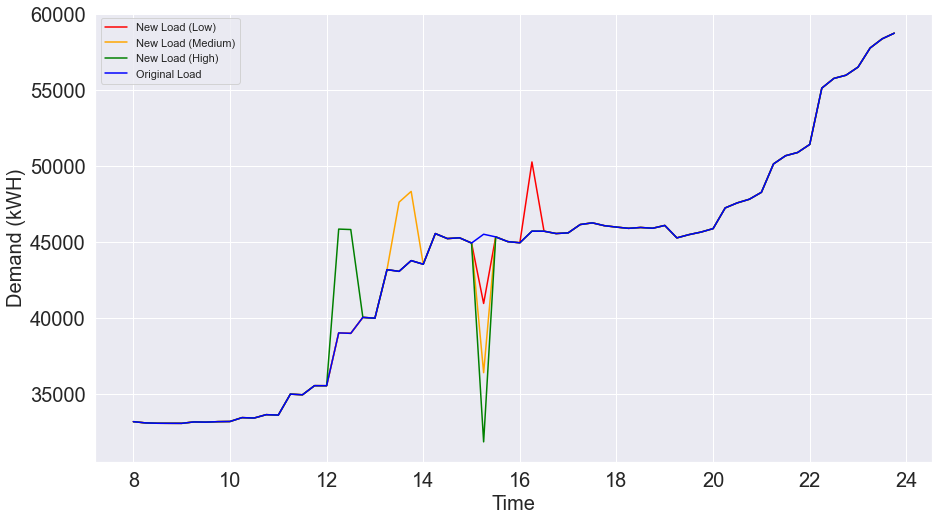

-------------------------
Date: 2018-12-17
Emissions Savings Using Low Estimates: 560.9245444727228 lb. CO2
Emissions Savings Using Med Estimates: 1121.849858967287 lb. CO2
Emissions Savings Using High Estimates: 1845.623702157993 lb. CO2


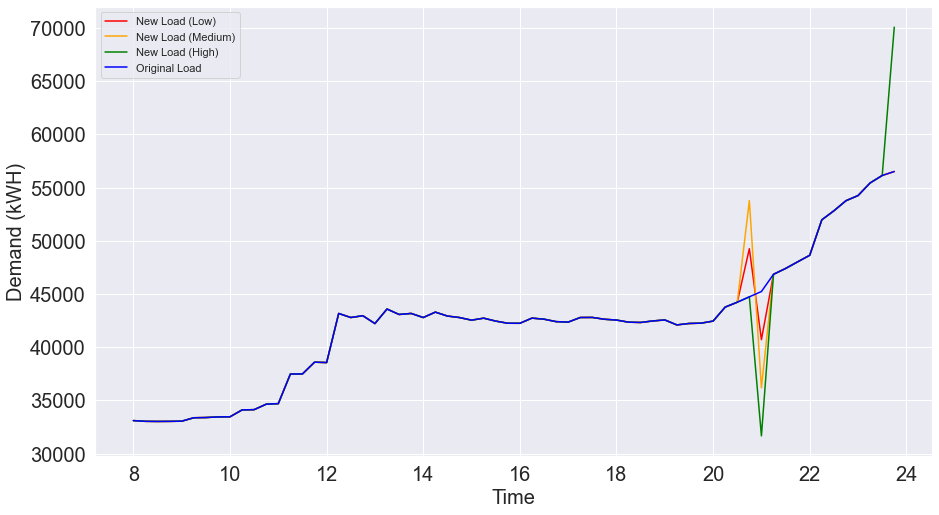

-------------------------
Date: 2018-12-18
Emissions Savings Using Low Estimates: 234.7671592933944 lb. CO2
Emissions Savings Using Med Estimates: 687.7696655196374 lb. CO2
Emissions Savings Using High Estimates: 1368.927828171592 lb. CO2


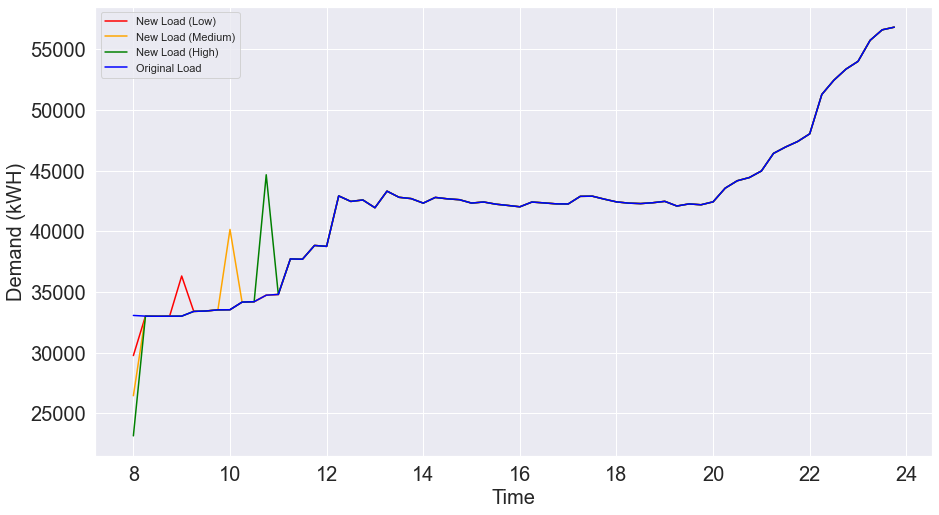

-------------------------
Date: 2018-12-19
Emissions Savings Using Low Estimates: 4552.632824078556 lb. CO2
Emissions Savings Using Med Estimates: 9105.265821814924 lb. CO2
Emissions Savings Using High Estimates: 13657.898850348269 lb. CO2


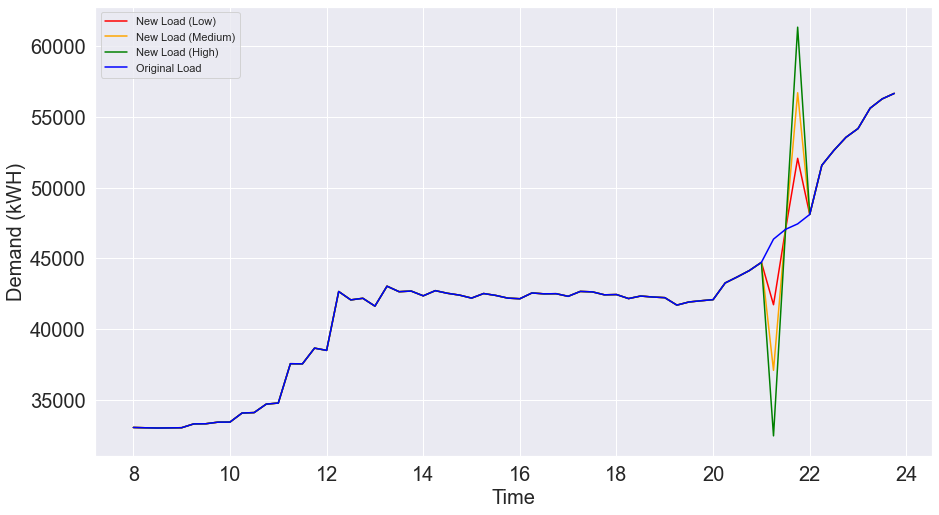

-------------------------
Date: 2018-12-20
Emissions Savings Using Low Estimates: 649.2854317159822 lb. CO2
Emissions Savings Using Med Estimates: 1298.5708457260064 lb. CO2
Emissions Savings Using High Estimates: 1947.8562848773272 lb. CO2


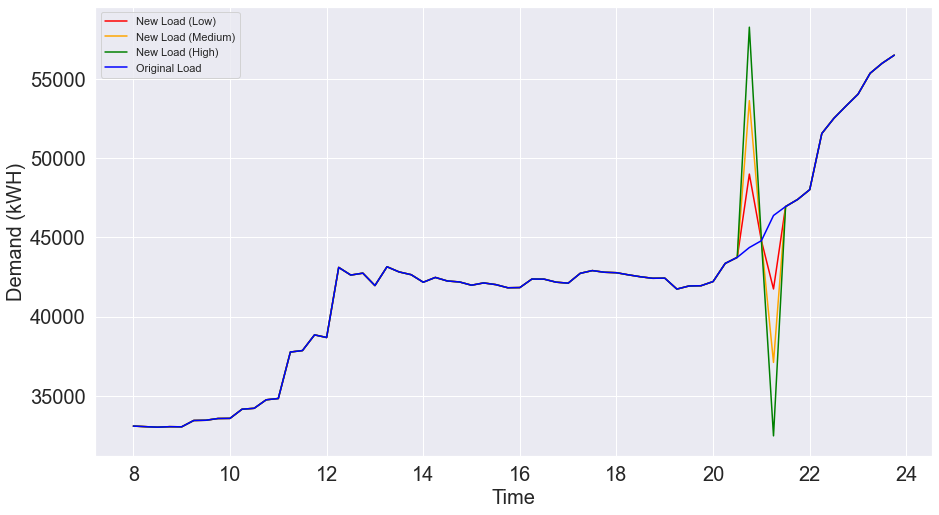

-------------------------
Date: 2018-12-21
Emissions Savings Using Low Estimates: 646.8929832272743 lb. CO2
Emissions Savings Using Med Estimates: 1303.298542711093 lb. CO2
Emissions Savings Using High Estimates: 1954.948971238078 lb. CO2


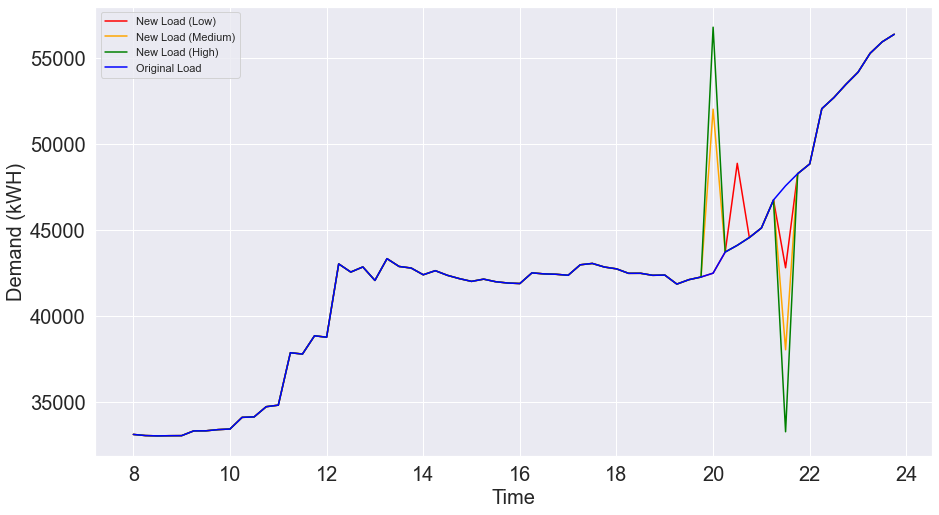

-------------------------
Date: 2018-12-23
Emissions Savings Using Low Estimates: 762.7030333948444 lb. CO2
Emissions Savings Using Med Estimates: 1525.4061928437484 lb. CO2
Emissions Savings Using High Estimates: 2288.1092874304013 lb. CO2


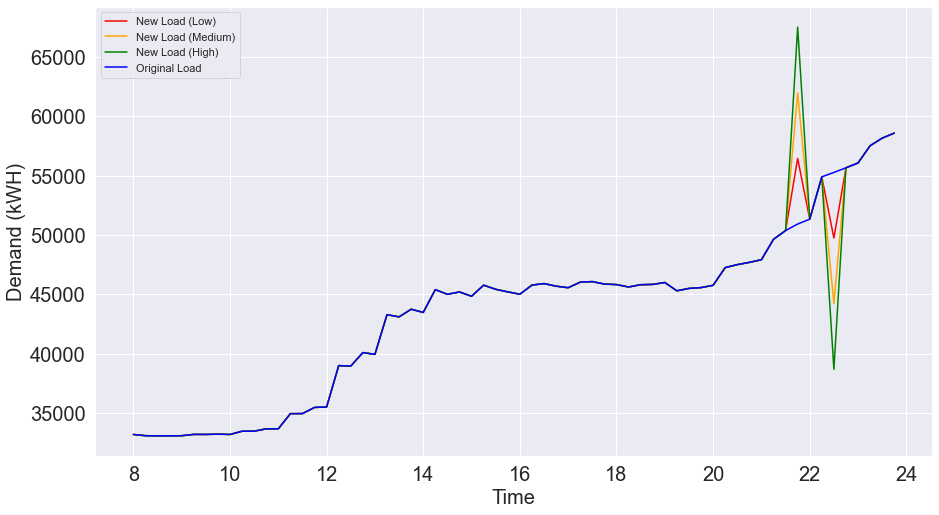

-------------------------
Date: 2018-12-24
Emissions Savings Using Low Estimates: 267.86315337112535 lb. CO2
Emissions Savings Using Med Estimates: 720.9156051737797 lb. CO2
Emissions Savings Using High Estimates: 1240.1070312919883 lb. CO2


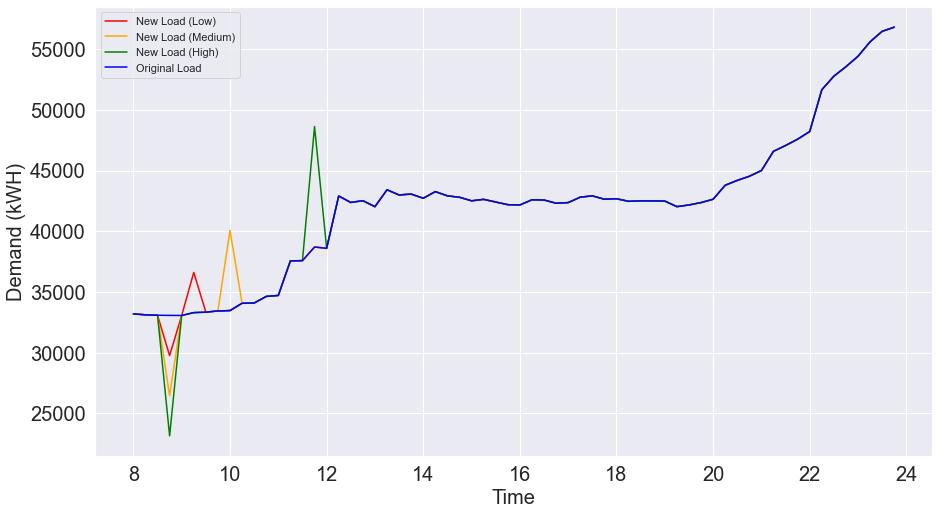

-------------------------
Date: 2018-12-25
Emissions Savings Using Low Estimates: 258.08117295356504 lb. CO2
Emissions Savings Using Med Estimates: 536.0238521621076 lb. CO2
Emissions Savings Using High Estimates: 1568.3642626707276 lb. CO2


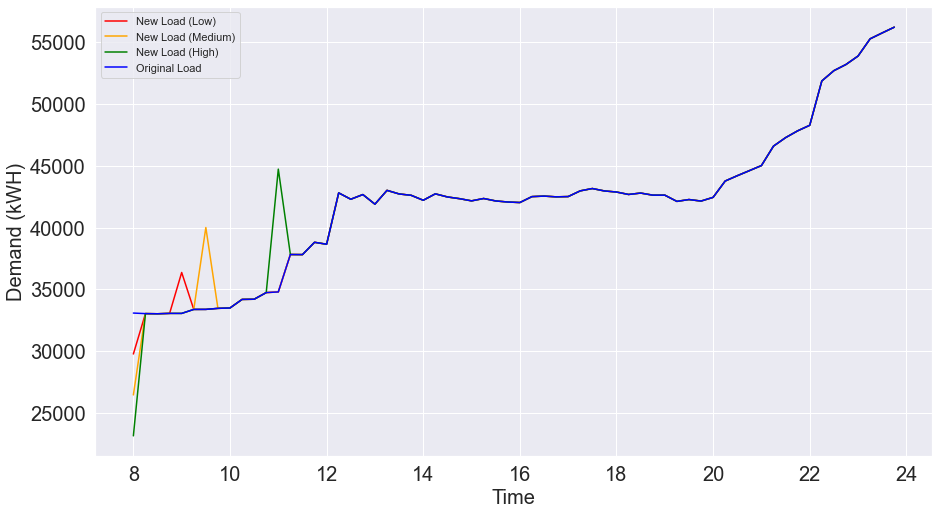

-------------------------
Date: 2018-12-26
Emissions Savings Using Low Estimates: 163.66491033372887 lb. CO2
Emissions Savings Using Med Estimates: 654.659099113208 lb. CO2
Emissions Savings Using High Estimates: 981.9895222732713 lb. CO2


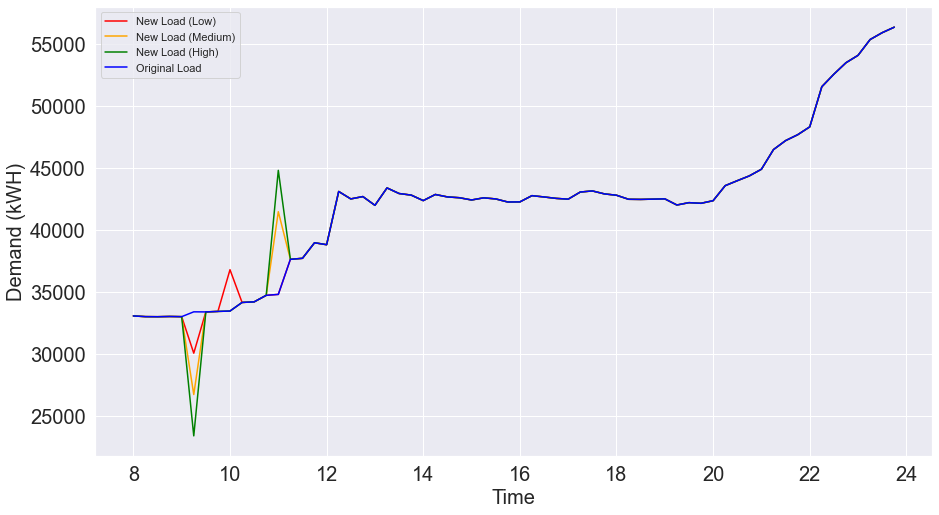

-------------------------
Total Emissions Savings Using Low Estimates: 95110.54941789595 lb. CO2
Total Emissions Savings Using Med Estimates: 230936.38531579994 lb. CO2
Total Emissions Savings Using High Estimates: 394109.5108574181 lb. CO2


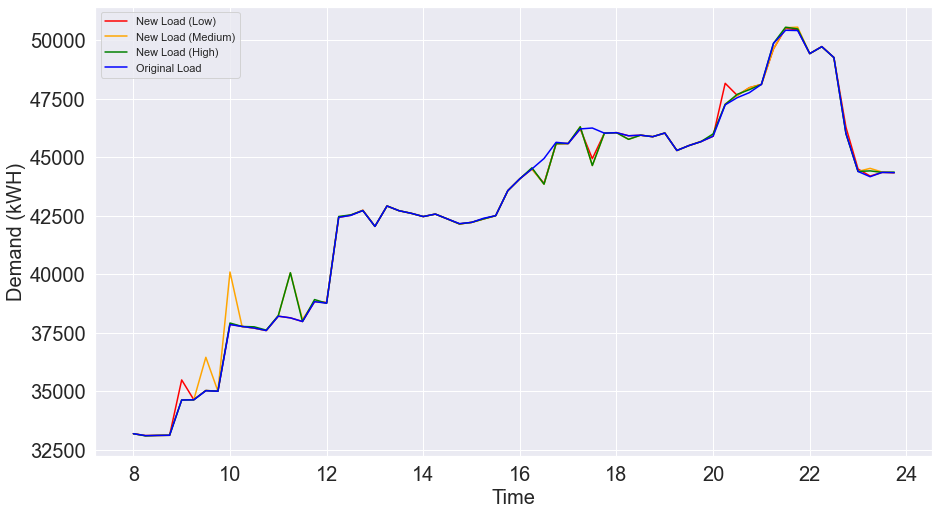

In [105]:
proportion_shiftable_low = 0.1
proportion_shiftable_med = 0.2
proportion_shiftable_high = 0.3

window_length_low = 4 # 1 hour * 4 readings per hour
window_length_med = 8
window_length_high = 12

load_savings_low_total = 0
load_savings_med_total = 0
load_savings_high_total = 0

df_original_loads = pd.DataFrame(columns = range(64))
df_loads_low = pd.DataFrame(columns = range(64))
df_loads_med = pd.DataFrame(columns = range(64))
df_loads_high = pd.DataFrame(columns = range(64))

for i in range(32, 35049, 96):
    
    if all18["Load Shift"][i]:
        emissions_time_series = list(all18["MOER"][i:i + 64]) # 64 since we are working with waking hours. 4 readings per hour * 16 waking hours = 64
        load_time_series = list(all18["plug_loads"][i:i+ 64])
        
        new_load_low = load_shift(emissions_time_series, load_time_series, proportion_shiftable_low, window_length_low)
        new_load_med = load_shift(emissions_time_series, load_time_series, proportion_shiftable_med, window_length_med)
        new_load_high = load_shift(emissions_time_series, load_time_series, proportion_shiftable_high, window_length_high)
        
        load_savings_low = sum(emissions_time_series * (load_time_series - new_load_low)) / 1000  # Division by 1000 to cancel units. MOER is in (lb. CO2 / MWh) and load is in kwH
        load_savings_med = sum(emissions_time_series * (load_time_series - new_load_med)) / 1000
        load_savings_high = sum(emissions_time_series * (load_time_series - new_load_high)) / 1000
        
        load_savings_low_total += load_savings_low
        load_savings_med_total += load_savings_med
        load_savings_high_total += load_savings_high
        
        df_original_loads.loc[len(df_original_loads)] = load_time_series
        df_loads_low.loc[len(df_loads_low)] = new_load_low
        df_loads_med.loc[len(df_loads_med)] = new_load_med
        df_loads_high.loc[len(df_loads_high)] = new_load_high


        print("-------------------------")
        print(f"Date: {all18['date'][i].date()}")
        print(f"Emissions Savings Using Low Estimates: {load_savings_low} lb. CO2") 
        print(f"Emissions Savings Using Med Estimates: {load_savings_med} lb. CO2") 
        print(f"Emissions Savings Using High Estimates: {load_savings_high} lb. CO2") 
        
        sns.lineplot(x=np.arange(8, 24, 0.25), y=new_load_low, color='red', label = 'New Load (Low)')
        sns.lineplot(x=np.arange(8, 24, 0.25), y=new_load_med, color='orange', label = 'New Load (Medium)')
        sns.lineplot(x=np.arange(8, 24, 0.25), y=new_load_high, color='green', label = 'New Load (High)')
        sns.lineplot(x=np.arange(8, 24, 0.25), y=load_time_series, color='blue', label='Original Load')

        
        sns.set(rc={'figure.figsize':(15,8.27)})
        plt.xlabel("Time", fontsize=20)
        plt.ylabel("Demand (kWH)", fontsize=20)
        plt.xticks(fontsize=20)
        plt.yticks(fontsize=20)
        plt.legend()
        plt.show()
        plt.close()
 

print("-------------------------")
print(f"Total Emissions Savings Using Low Estimates: {load_savings_low_total} lb. CO2") 
print(f"Total Emissions Savings Using Med Estimates: {load_savings_med_total} lb. CO2") 
print(f"Total Emissions Savings Using High Estimates: {load_savings_high_total} lb. CO2")


sns.lineplot(x=np.arange(8, 24, 0.25), y=df_loads_low.median(), color='red', label='New Load (Low)')
sns.lineplot(x=np.arange(8, 24, 0.25), y=df_loads_med.median(), color='orange', label='New Load (Medium)')
sns.lineplot(x=np.arange(8, 24, 0.25), y=df_loads_high.median(), color='green', label='New Load (High)')
sns.lineplot(x=np.arange(8, 24, 0.25), y=df_original_loads.median(), color='blue', label='Original Load')
plt.xlabel("Time", fontsize=20)
plt.ylabel("Demand (kWH)", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend()
plt.show()

# Heating

-------------------------
Date: 2018-01-01
Emissions Savings Using Low Estimates: 1147.6811626213146 lb. CO2
Emissions Savings Using Med Estimates: 3506.8033664440595 lb. CO2
Emissions Savings Using High Estimates: 4909.524712086155 lb. CO2


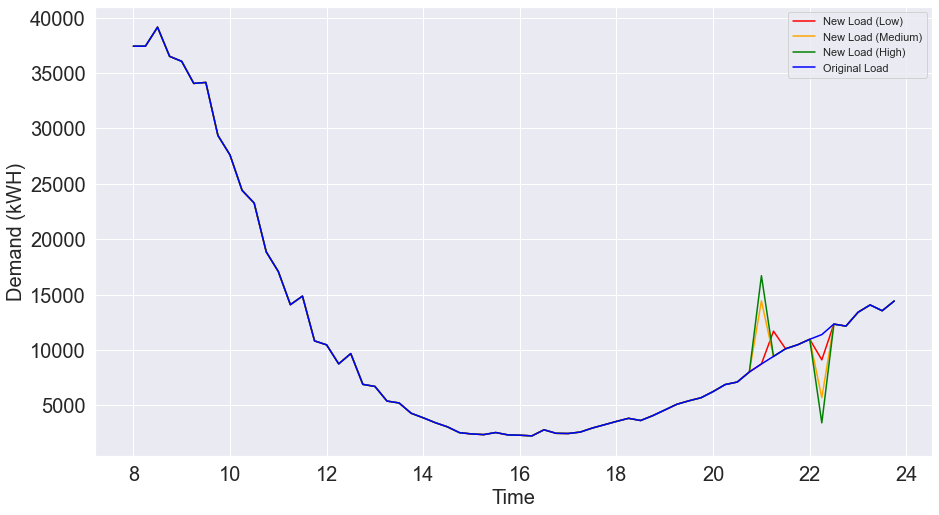

-------------------------
Date: 2018-01-02
Emissions Savings Using Low Estimates: 220.42597071481646 lb. CO2
Emissions Savings Using Med Estimates: 1226.5639091020507 lb. CO2
Emissions Savings Using High Estimates: 1717.1894718092467 lb. CO2


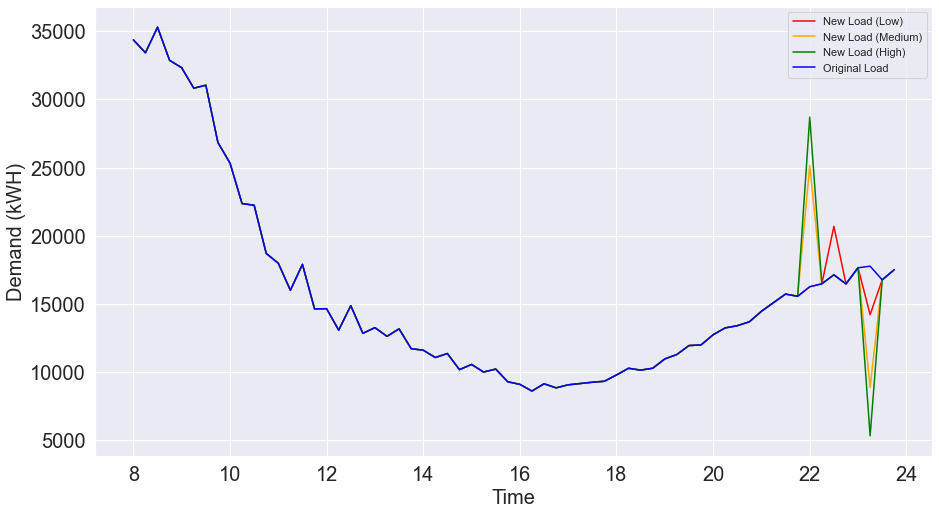

-------------------------
Date: 2018-01-04
Emissions Savings Using Low Estimates: 388.7856802307846 lb. CO2
Emissions Savings Using Med Estimates: 971.9641327160008 lb. CO2
Emissions Savings Using High Estimates: 1360.7497851931146 lb. CO2


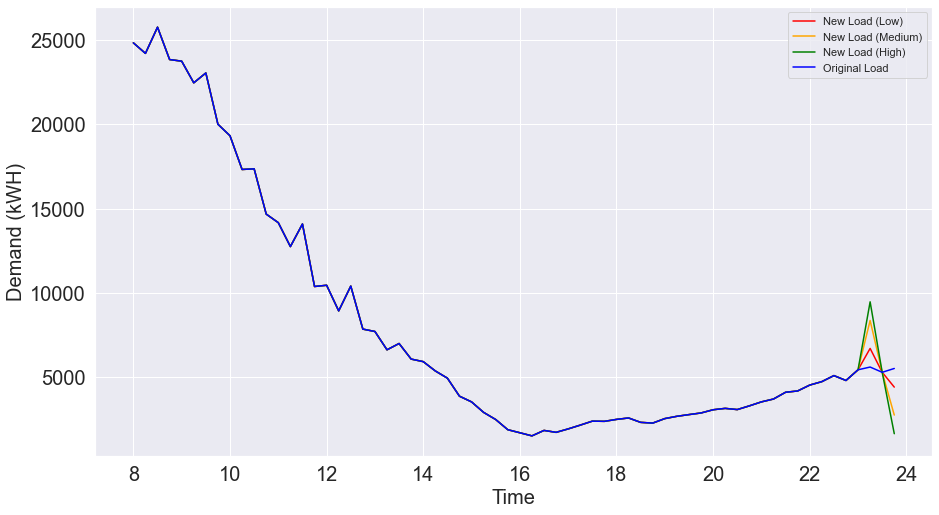

-------------------------
Date: 2018-01-05
Emissions Savings Using Low Estimates: 3913.759356780893 lb. CO2
Emissions Savings Using Med Estimates: 9784.398700979824 lb. CO2
Emissions Savings Using High Estimates: 13698.15817662327 lb. CO2


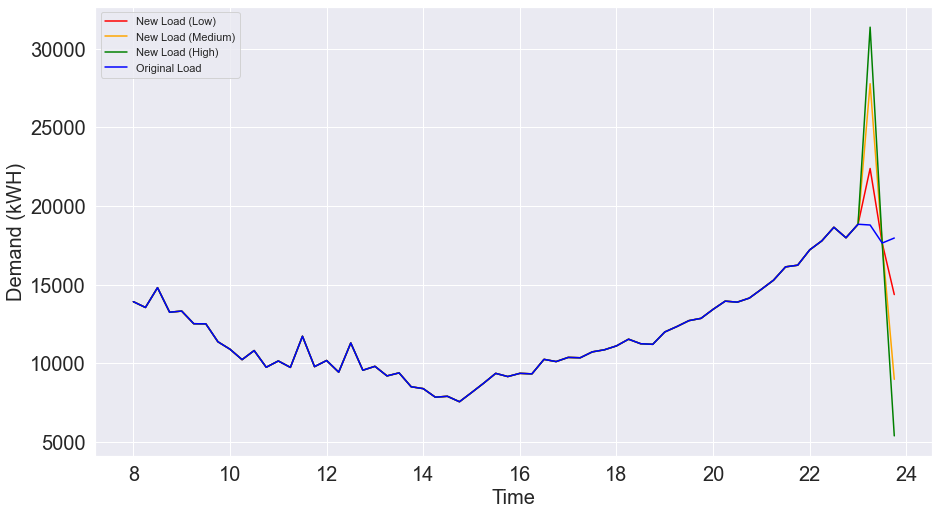

-------------------------
Date: 2018-01-08
Emissions Savings Using Low Estimates: 120.11220408955123 lb. CO2
Emissions Savings Using Med Estimates: 887.7878088192502 lb. CO2
Emissions Savings Using High Estimates: 1242.9029337688312 lb. CO2


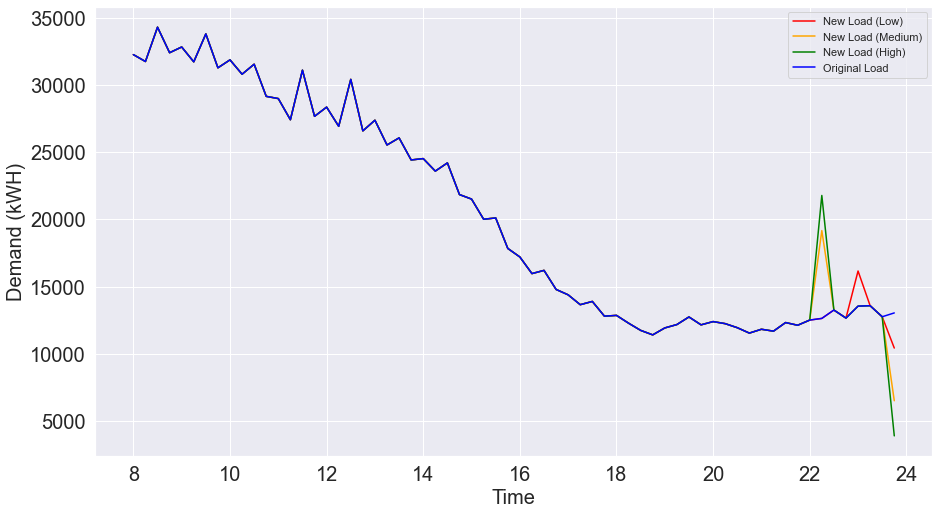

-------------------------
Date: 2018-01-09
Emissions Savings Using Low Estimates: 283.8779538218062 lb. CO2
Emissions Savings Using Med Estimates: 1430.6580478730668 lb. CO2
Emissions Savings Using High Estimates: 2002.921260236103 lb. CO2


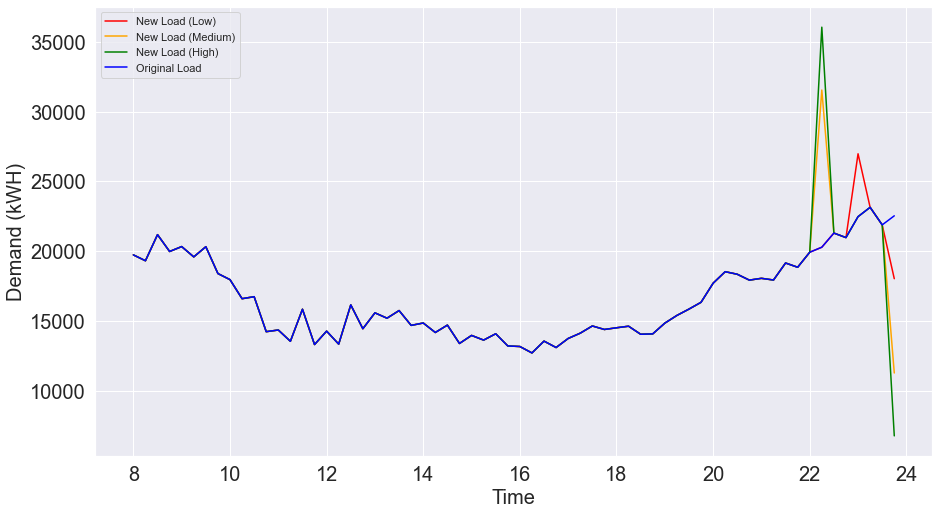

-------------------------
Date: 2018-01-14
Emissions Savings Using Low Estimates: 2790.124740525232 lb. CO2
Emissions Savings Using Med Estimates: 6975.312465396868 lb. CO2
Emissions Savings Using High Estimates: 9765.437445598034 lb. CO2


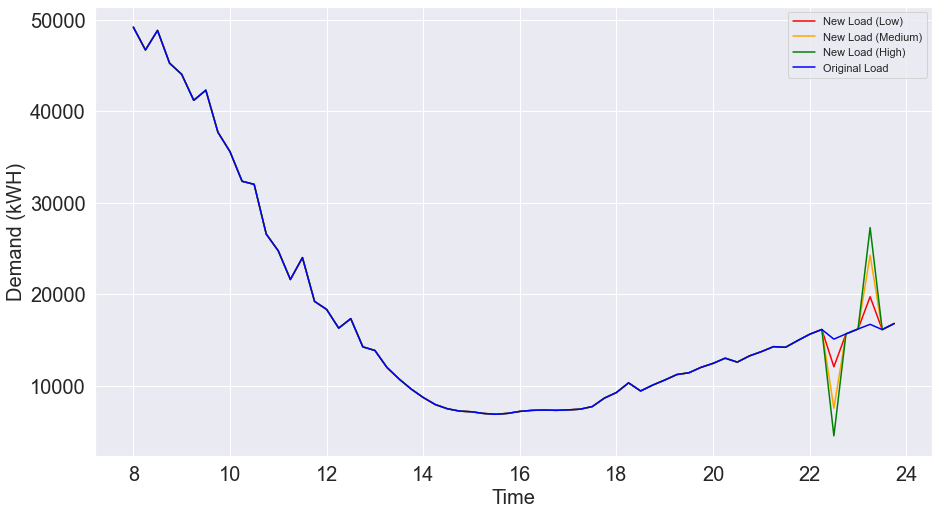

-------------------------
Date: 2018-01-15
Emissions Savings Using Low Estimates: 394.41941754409453 lb. CO2
Emissions Savings Using Med Estimates: 1098.2342941782747 lb. CO2
Emissions Savings Using High Estimates: 1537.5278942978555 lb. CO2


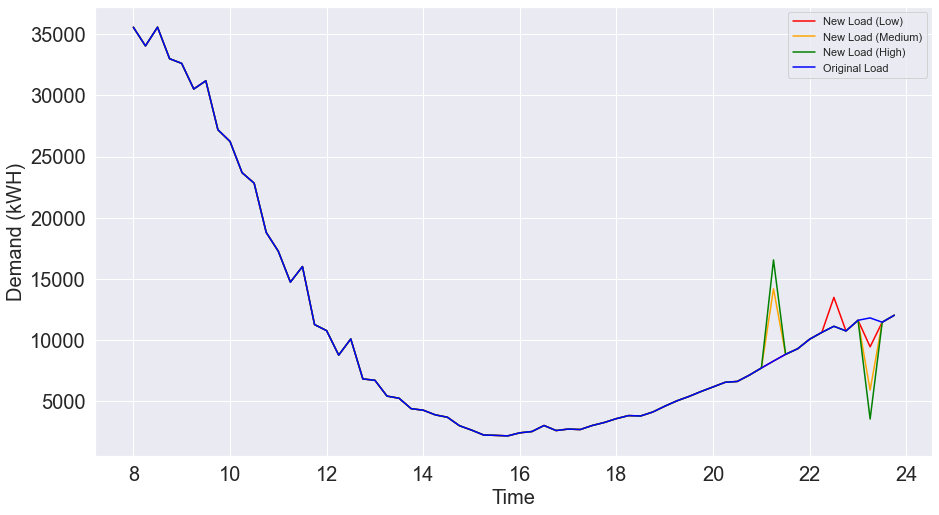

-------------------------
Date: 2018-01-16
Emissions Savings Using Low Estimates: 81.1760314400047 lb. CO2
Emissions Savings Using Med Estimates: 329.0920065050926 lb. CO2
Emissions Savings Using High Estimates: 460.7286522561275 lb. CO2


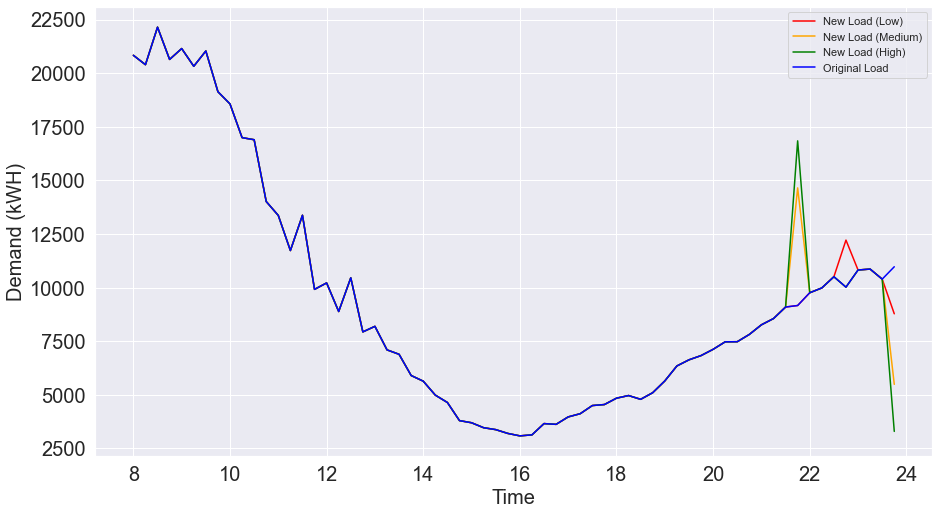

-------------------------
Date: 2018-01-17
Emissions Savings Using Low Estimates: 729.8370021869017 lb. CO2
Emissions Savings Using Med Estimates: 2138.967350688488 lb. CO2
Emissions Savings Using High Estimates: 2994.554285391013 lb. CO2


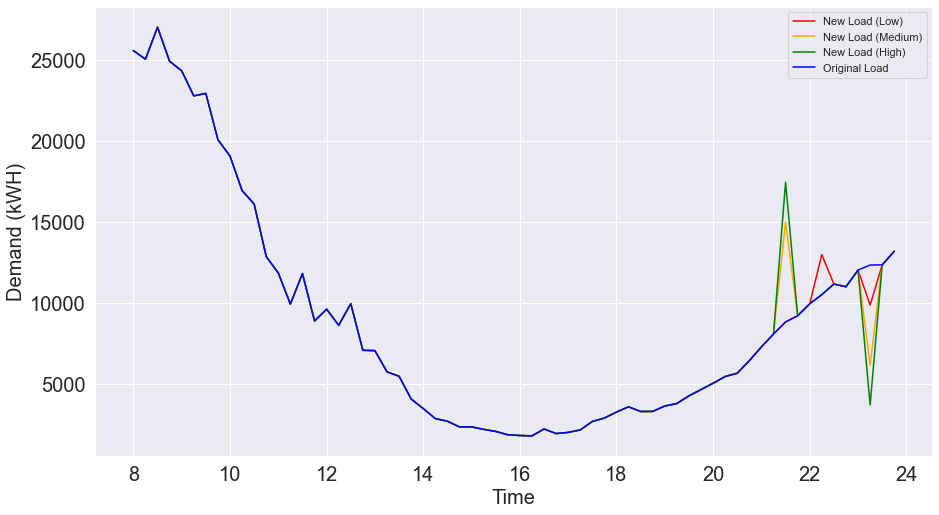

-------------------------
Date: 2018-01-18
Emissions Savings Using Low Estimates: 4783.995803532339 lb. CO2
Emissions Savings Using Med Estimates: 11959.992965171694 lb. CO2
Emissions Savings Using High Estimates: 16743.990219840172 lb. CO2


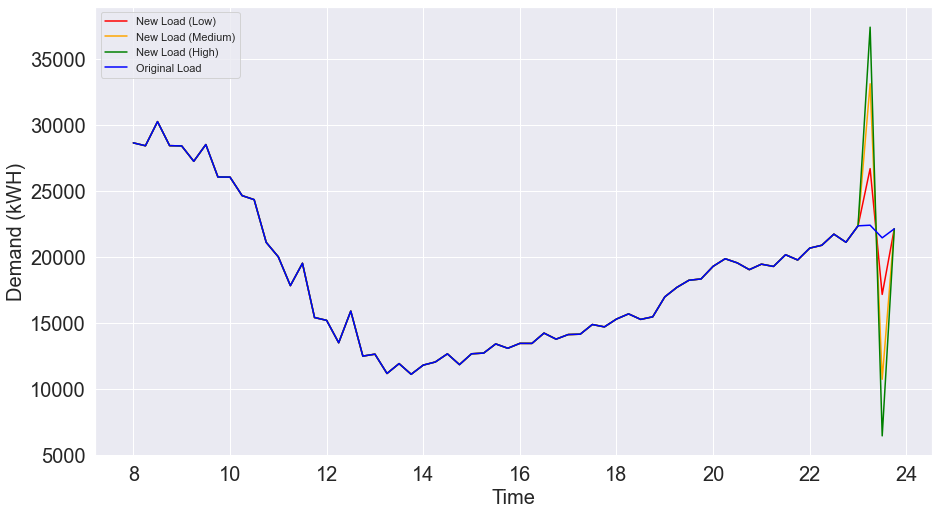

-------------------------
Date: 2018-01-19
Emissions Savings Using Low Estimates: 685.7232053325445 lb. CO2
Emissions Savings Using Med Estimates: 1997.5395861435159 lb. CO2
Emissions Savings Using High Estimates: 2796.5553604616193 lb. CO2


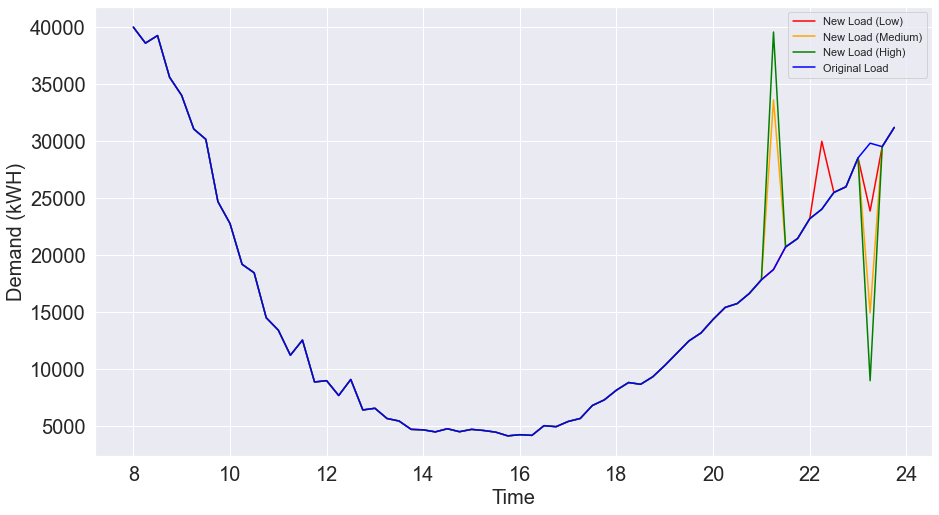

-------------------------
Date: 2018-01-21
Emissions Savings Using Low Estimates: 3364.252040110617 lb. CO2
Emissions Savings Using Med Estimates: 8410.630481978946 lb. CO2
Emissions Savings Using High Estimates: 11774.88408823678 lb. CO2


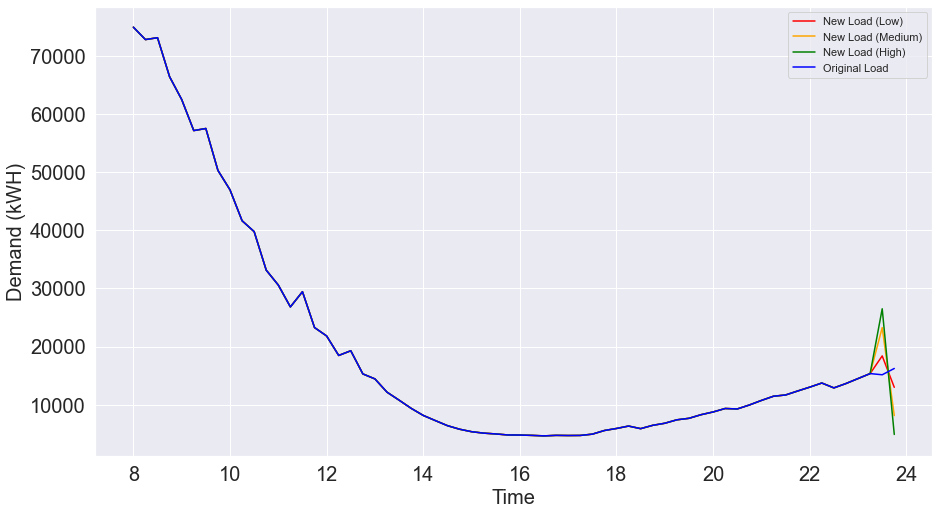

-------------------------
Date: 2018-01-23
Emissions Savings Using Low Estimates: 40.2536762808825 lb. CO2
Emissions Savings Using Med Estimates: 109.55087057985406 lb. CO2
Emissions Savings Using High Estimates: 153.37129204615863 lb. CO2


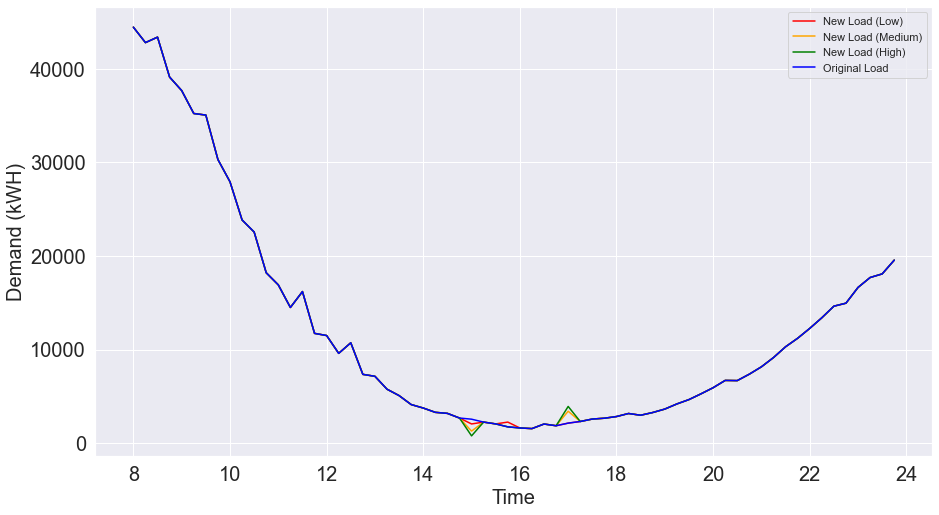

-------------------------
Date: 2018-01-25
Emissions Savings Using Low Estimates: 5612.15485769699 lb. CO2
Emissions Savings Using Med Estimates: 14043.57423594579 lb. CO2
Emissions Savings Using High Estimates: 19661.00392190773 lb. CO2


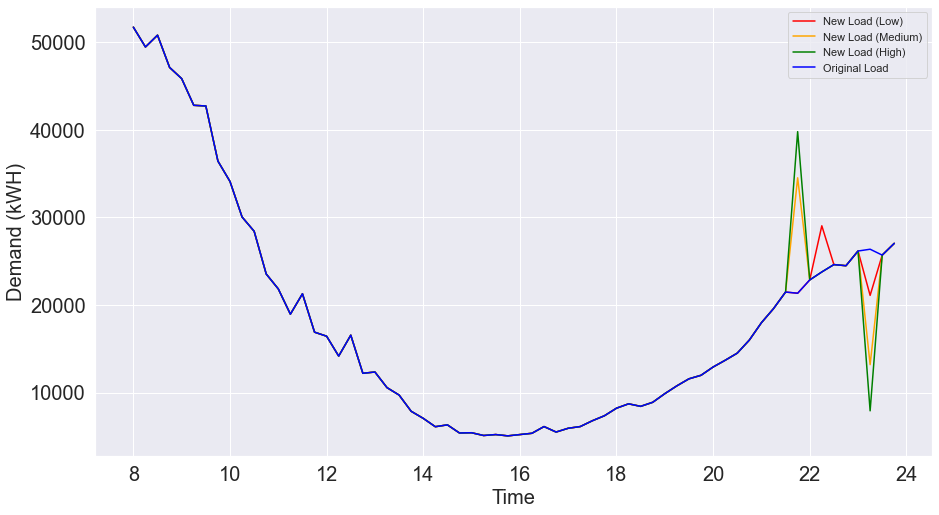

-------------------------
Date: 2018-01-26
Emissions Savings Using Low Estimates: 738.0769770536381 lb. CO2
Emissions Savings Using Med Estimates: 2192.8450435186824 lb. CO2
Emissions Savings Using High Estimates: 3069.9830477054734 lb. CO2


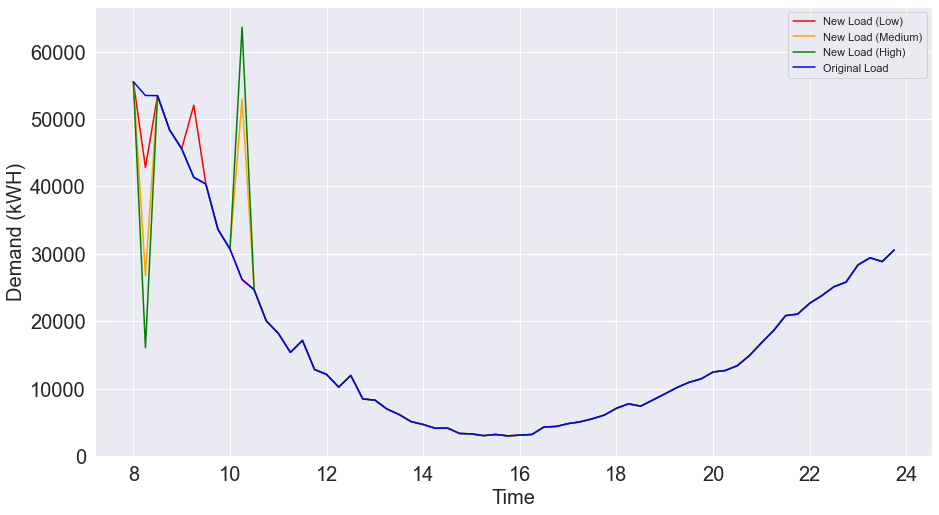

-------------------------
Date: 2018-01-29
Emissions Savings Using Low Estimates: 1314.3308798824376 lb. CO2
Emissions Savings Using Med Estimates: 3285.827102997789 lb. CO2
Emissions Savings Using High Estimates: 4600.157924985325 lb. CO2


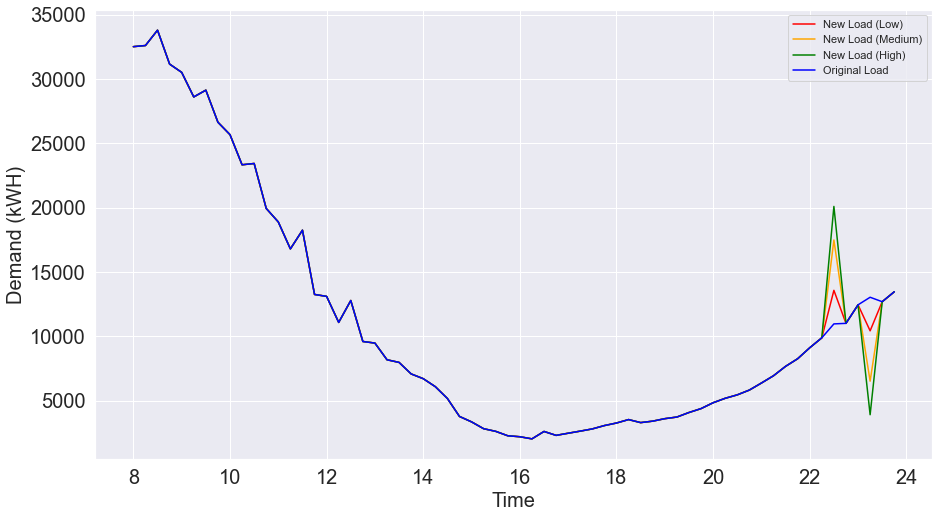

-------------------------
Date: 2018-02-01
Emissions Savings Using Low Estimates: 20.87035841786513 lb. CO2
Emissions Savings Using Med Estimates: 52.17608158258986 lb. CO2
Emissions Savings Using High Estimates: 73.04651113926651 lb. CO2


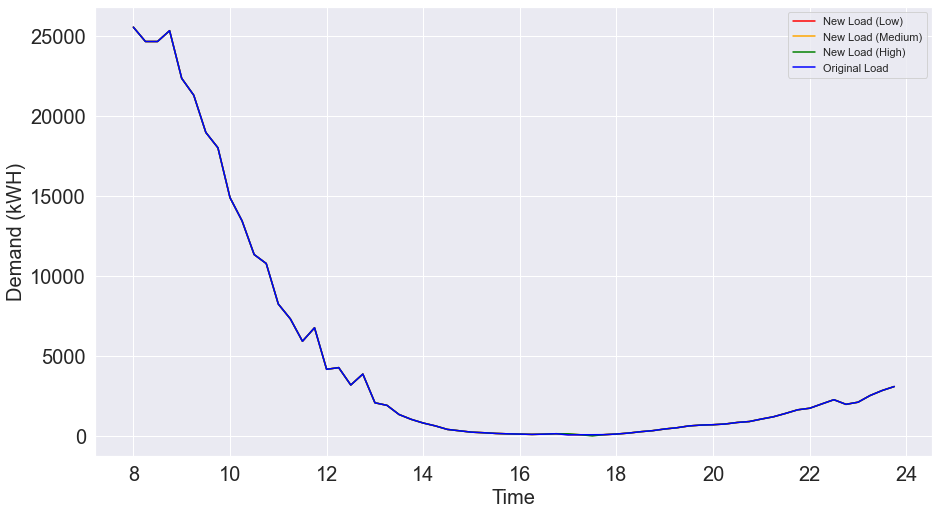

-------------------------
Date: 2018-02-05
Emissions Savings Using Low Estimates: 0.5599616648154957 lb. CO2
Emissions Savings Using Med Estimates: 2.058112312482965 lb. CO2
Emissions Savings Using High Estimates: 2.8813514642474845 lb. CO2


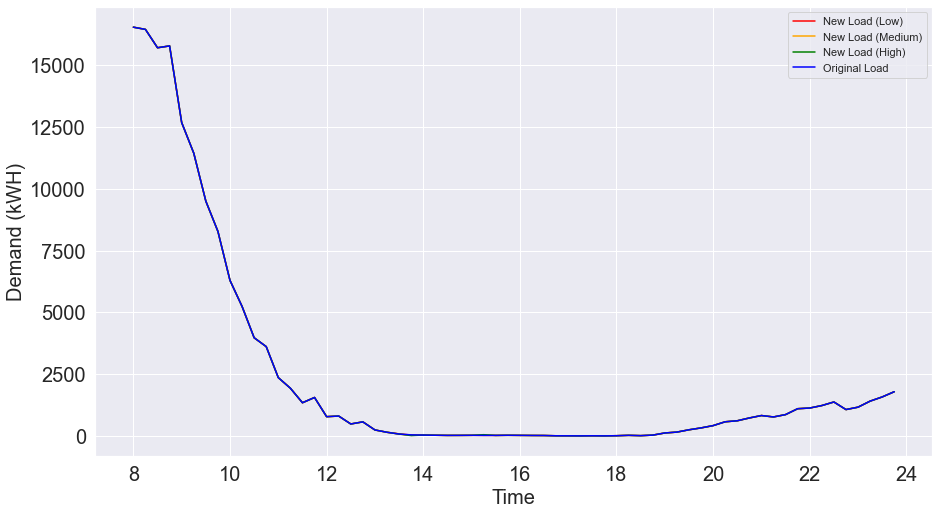

-------------------------
Date: 2018-02-09
Emissions Savings Using Low Estimates: 2.2722929382158945 lb. CO2
Emissions Savings Using Med Estimates: 5.68051708171109 lb. CO2
Emissions Savings Using High Estimates: 7.952558387871828 lb. CO2


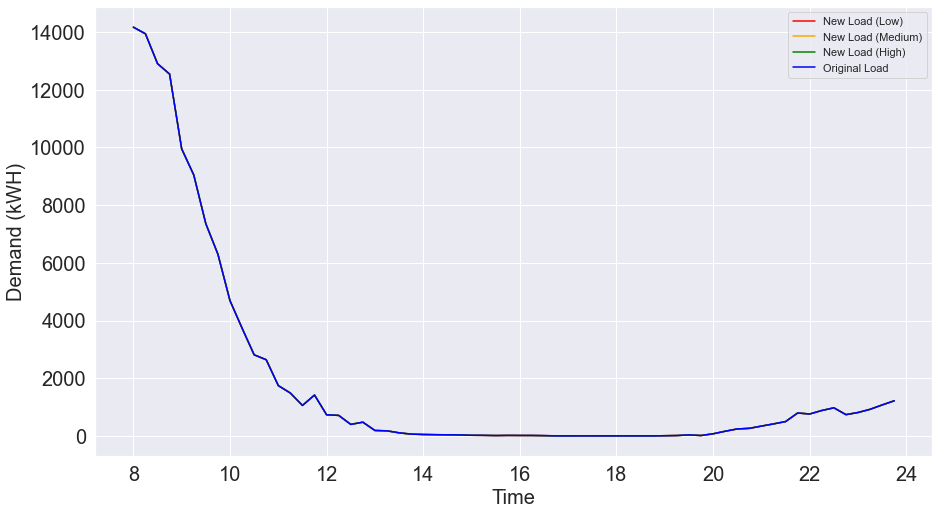

-------------------------
Date: 2018-02-12
Emissions Savings Using Low Estimates: 251.2422443961701 lb. CO2
Emissions Savings Using Med Estimates: 1334.727805921587 lb. CO2
Emissions Savings Using High Estimates: 1868.6189357426088 lb. CO2


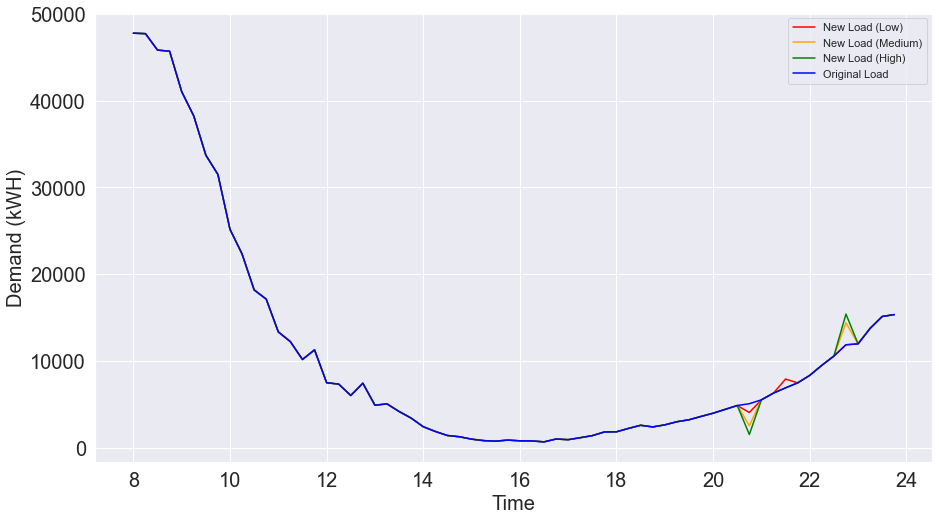

-------------------------
Date: 2018-02-13
Emissions Savings Using Low Estimates: 1396.1673384107244 lb. CO2
Emissions Savings Using Med Estimates: 3490.417153373637 lb. CO2
Emissions Savings Using High Estimates: 4886.585771143507 lb. CO2


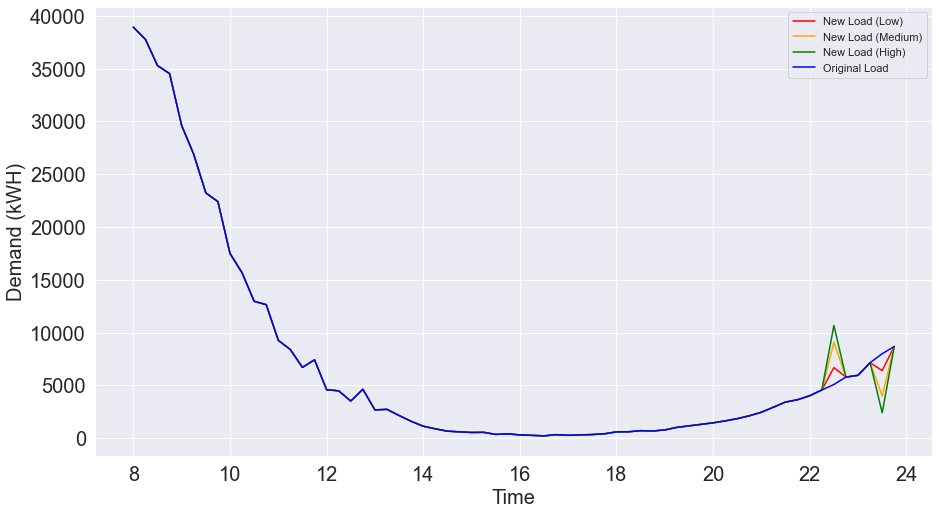

-------------------------
Date: 2018-02-14
Emissions Savings Using Low Estimates: 29.00338497137158 lb. CO2
Emissions Savings Using Med Estimates: 122.16101962157477 lb. CO2
Emissions Savings Using High Estimates: 171.02539874975128 lb. CO2


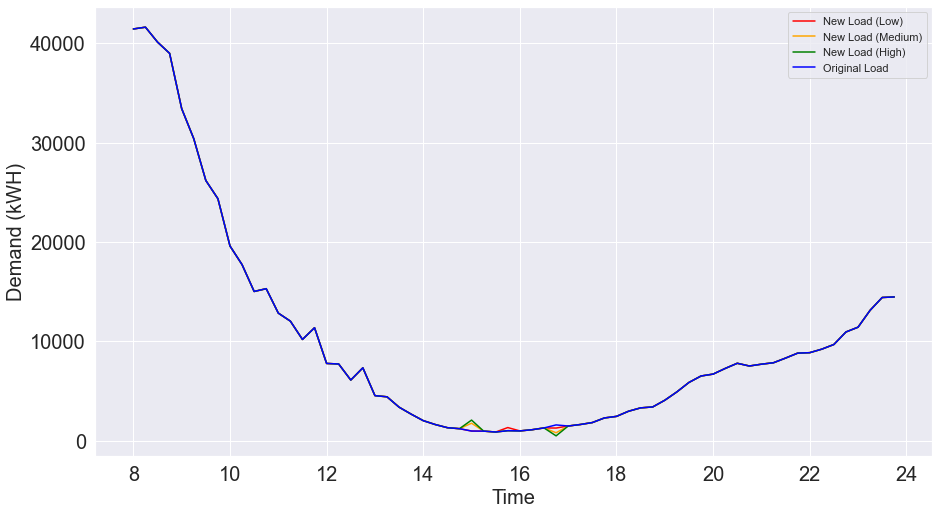

-------------------------
Date: 2018-02-19
Emissions Savings Using Low Estimates: 4474.125226125946 lb. CO2
Emissions Savings Using Med Estimates: 16030.637745894604 lb. CO2
Emissions Savings Using High Estimates: 22442.896101262348 lb. CO2


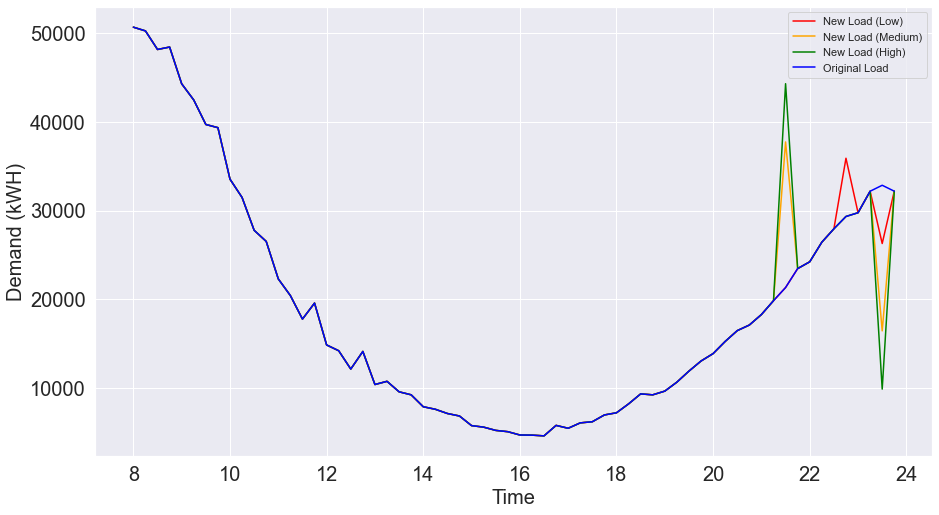

-------------------------
Date: 2018-02-21
Emissions Savings Using Low Estimates: 121.60150121534875 lb. CO2
Emissions Savings Using Med Estimates: 1077.7368154196097 lb. CO2
Emissions Savings Using High Estimates: 1508.8315327034704 lb. CO2


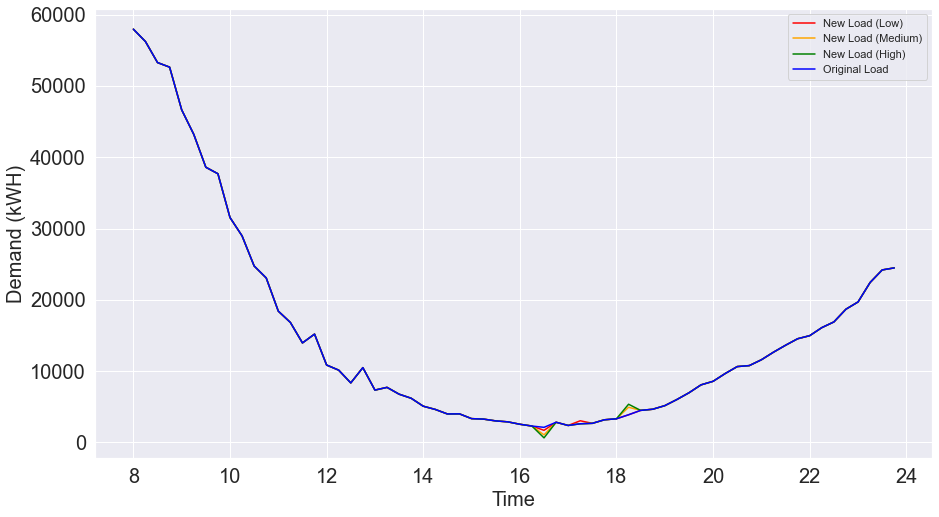

-------------------------
Date: 2018-02-26
Emissions Savings Using Low Estimates: 1923.6208000255751 lb. CO2
Emissions Savings Using Med Estimates: 5283.473176396884 lb. CO2
Emissions Savings Using High Estimates: 7396.86244714564 lb. CO2


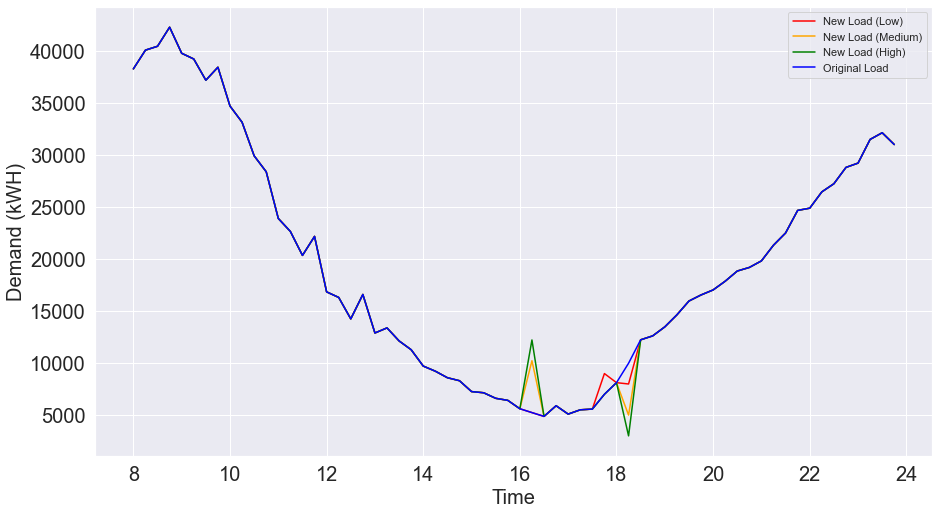

-------------------------
Date: 2018-02-27
Emissions Savings Using Low Estimates: 173.63183319443633 lb. CO2
Emissions Savings Using Med Estimates: 657.5670218046816 lb. CO2
Emissions Savings Using High Estimates: 920.5938837049506 lb. CO2


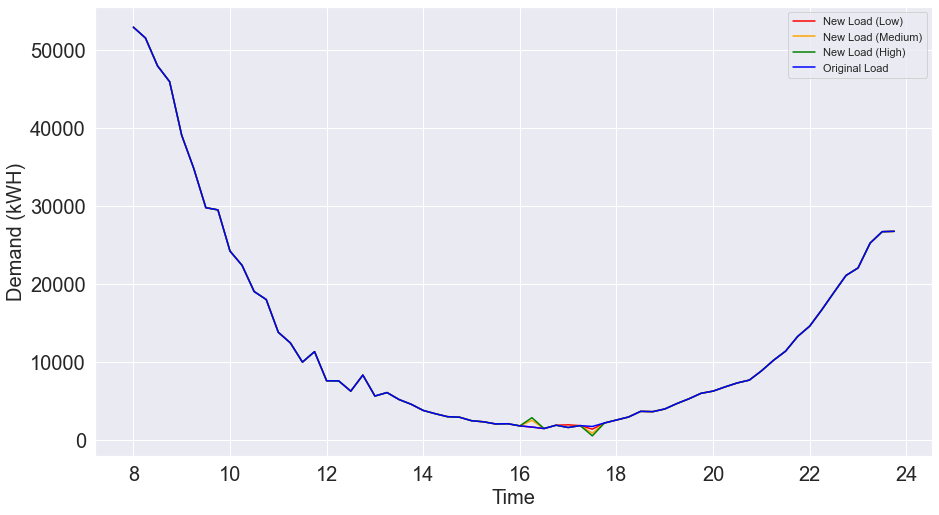

-------------------------
Date: 2018-02-28
Emissions Savings Using Low Estimates: 1915.8959948090808 lb. CO2
Emissions Savings Using Med Estimates: 5765.801272008215 lb. CO2
Emissions Savings Using High Estimates: 8072.121782271245 lb. CO2


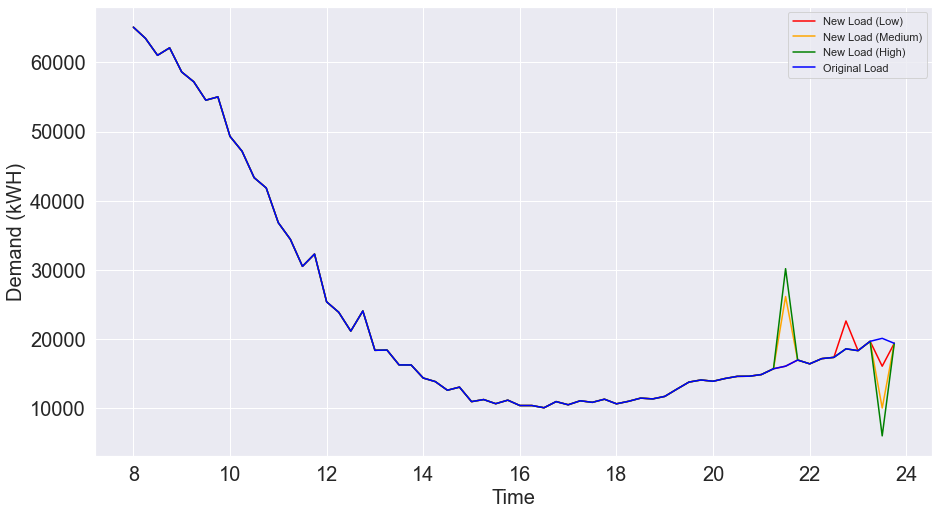

-------------------------
Date: 2018-03-01
Emissions Savings Using Low Estimates: 697.1303703517865 lb. CO2
Emissions Savings Using Med Estimates: 1854.7859591538904 lb. CO2
Emissions Savings Using High Estimates: 2596.70017730024 lb. CO2


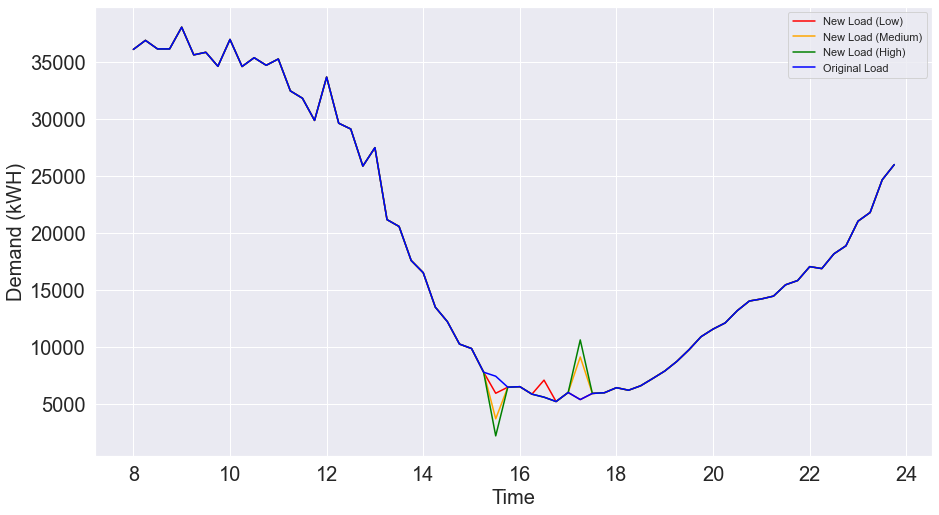

-------------------------
Date: 2018-03-11
Emissions Savings Using Low Estimates: 10.929424992618328 lb. CO2
Emissions Savings Using Med Estimates: 30.313539253131196 lb. CO2
Emissions Savings Using High Estimates: 42.438774703678135 lb. CO2


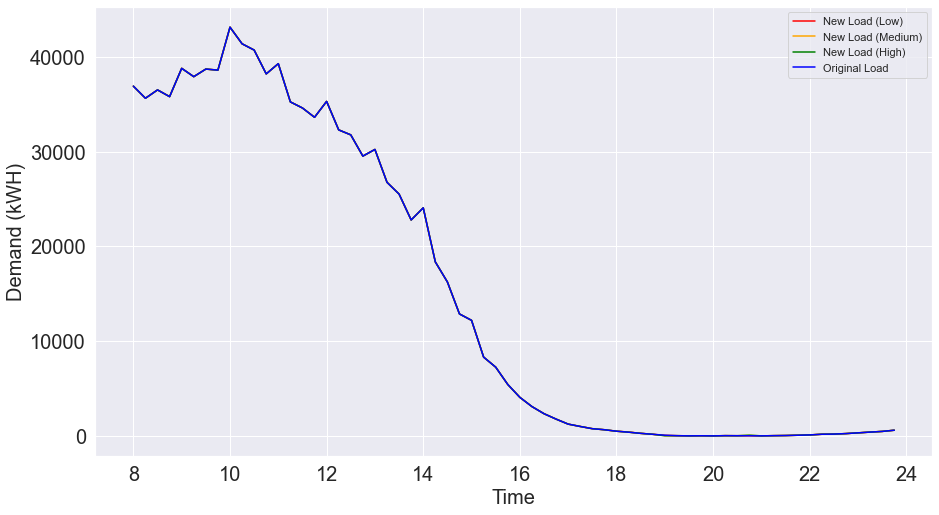

-------------------------
Date: 2018-03-12
Emissions Savings Using Low Estimates: 501.90165950308017 lb. CO2
Emissions Savings Using Med Estimates: 1254.75366543789 lb. CO2
Emissions Savings Using High Estimates: 1756.6566300996094 lb. CO2


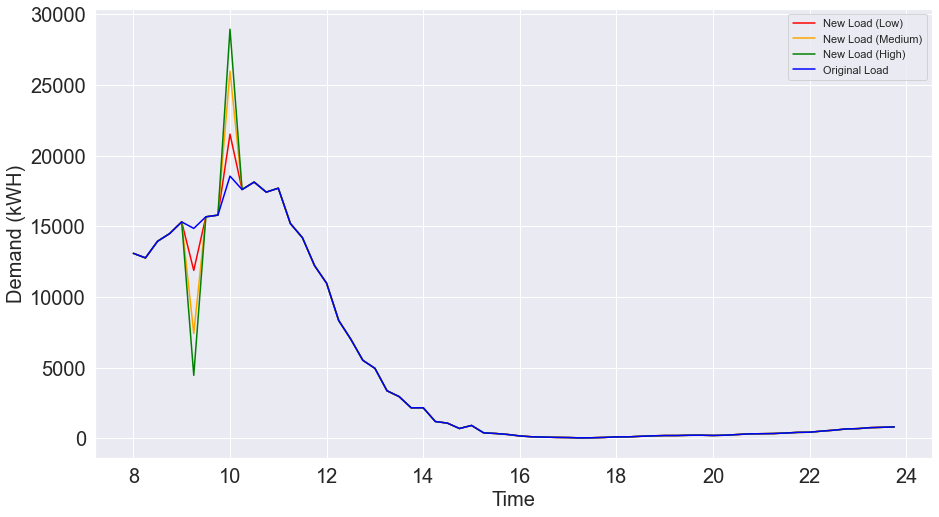

-------------------------
Date: 2018-03-15
Emissions Savings Using Low Estimates: 967.0608424581454 lb. CO2
Emissions Savings Using Med Estimates: 3415.063293314567 lb. CO2
Emissions Savings Using High Estimates: 4781.0886079654165 lb. CO2


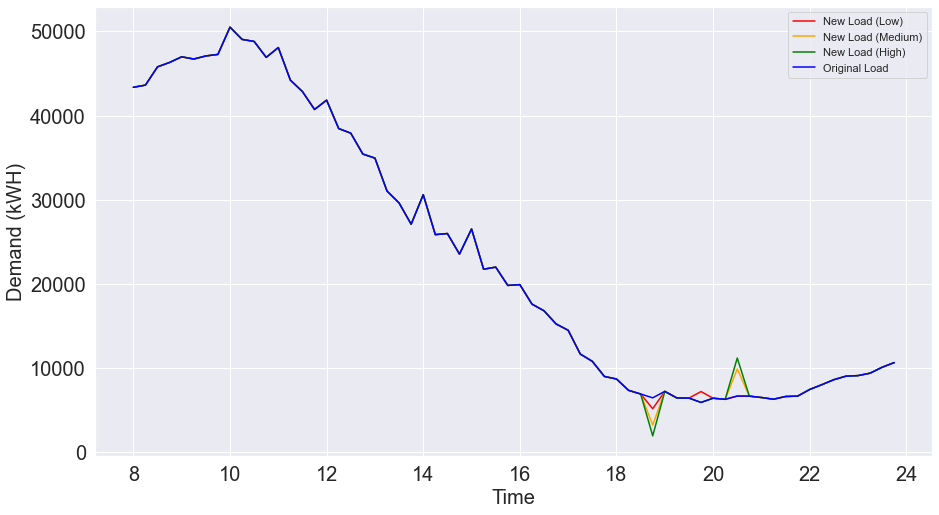

-------------------------
Date: 2018-03-20
Emissions Savings Using Low Estimates: 1236.702801246286 lb. CO2
Emissions Savings Using Med Estimates: 3091.757910428095 lb. CO2
Emissions Savings Using High Estimates: 4328.461074545782 lb. CO2


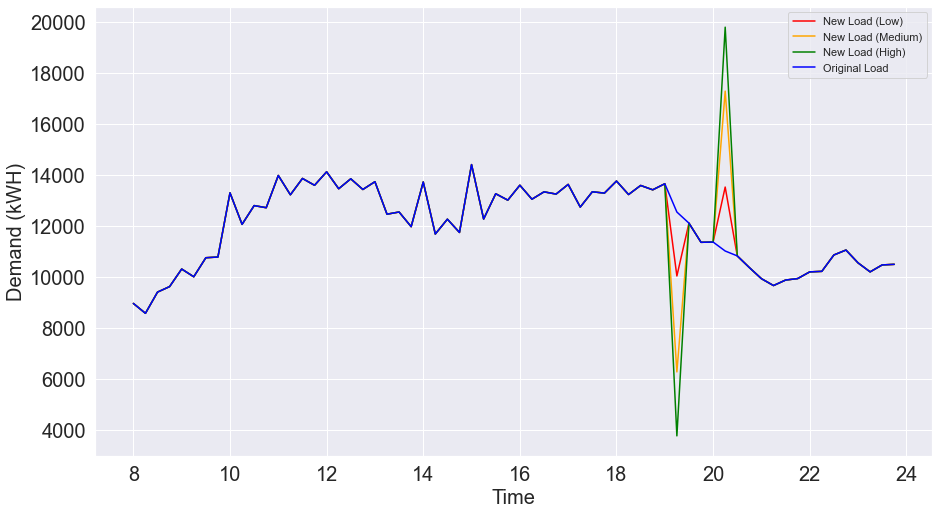

-------------------------
Date: 2018-03-23
Emissions Savings Using Low Estimates: 379.6094537837758 lb. CO2
Emissions Savings Using Med Estimates: 1343.9586779730919 lb. CO2
Emissions Savings Using High Estimates: 1881.5421518589342 lb. CO2


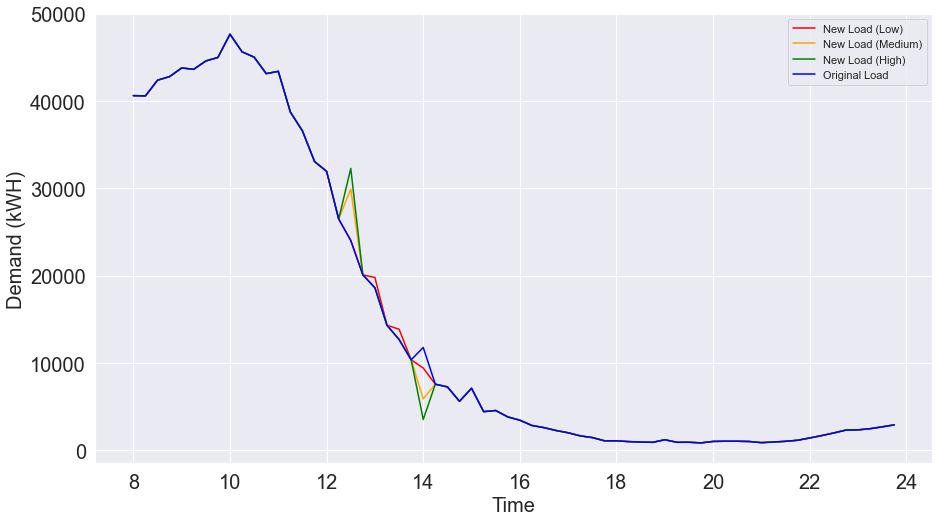

-------------------------
Date: 2018-04-19
Emissions Savings Using Low Estimates: 265.57790706247516 lb. CO2
Emissions Savings Using Med Estimates: 777.2082409294266 lb. CO2
Emissions Savings Using High Estimates: 1088.0914126032962 lb. CO2


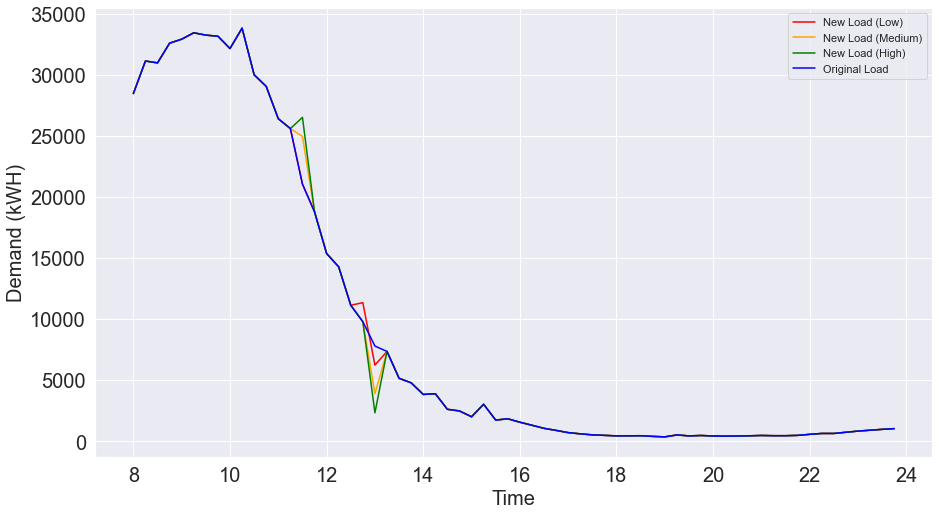

-------------------------
Date: 2018-04-20
Emissions Savings Using Low Estimates: 138.63727924438246 lb. CO2
Emissions Savings Using Med Estimates: 401.9763283177743 lb. CO2
Emissions Savings Using High Estimates: 562.7668898285565 lb. CO2


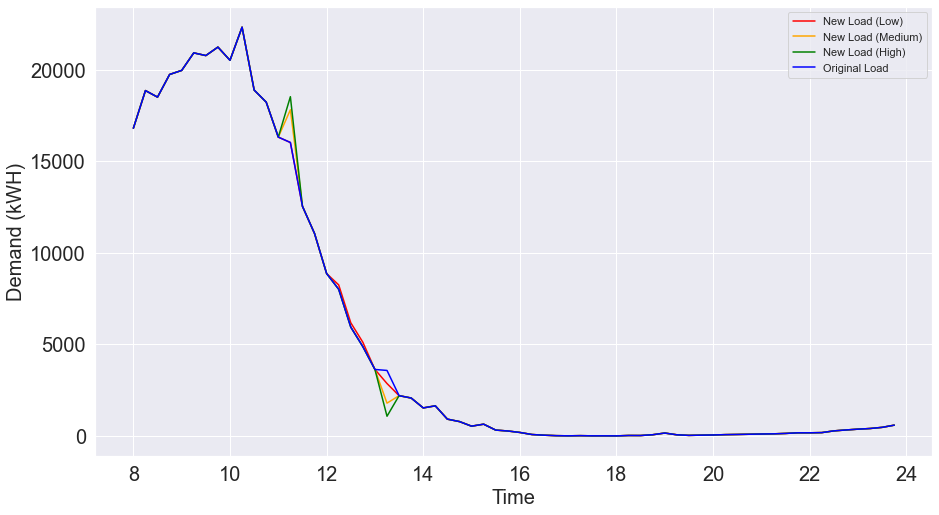

-------------------------
Date: 2018-04-21
Emissions Savings Using Low Estimates: 89.88894365550252 lb. CO2
Emissions Savings Using Med Estimates: 292.00454249061875 lb. CO2
Emissions Savings Using High Estimates: 408.8063541790808 lb. CO2


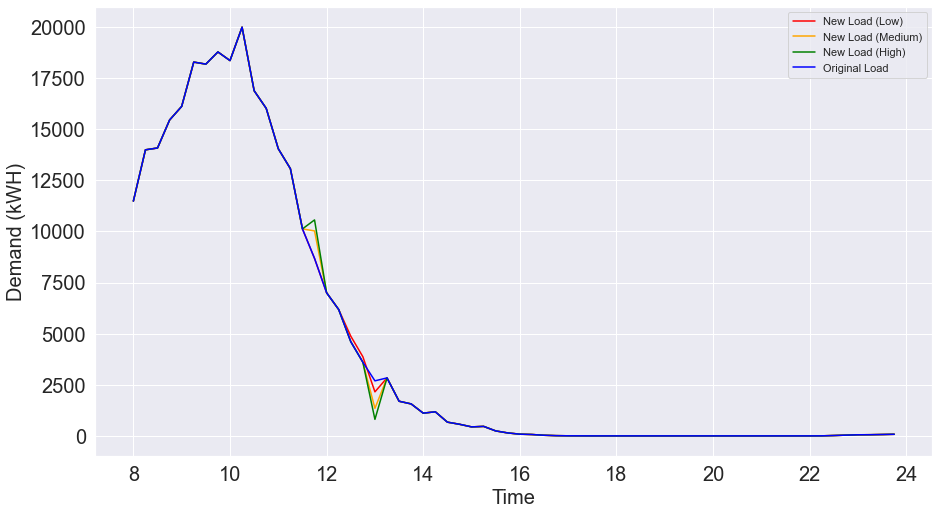

-------------------------
Date: 2018-04-22
Emissions Savings Using Low Estimates: 23.674530208490204 lb. CO2
Emissions Savings Using Med Estimates: 65.17542364267236 lb. CO2
Emissions Savings Using High Estimates: 91.24558517363023 lb. CO2


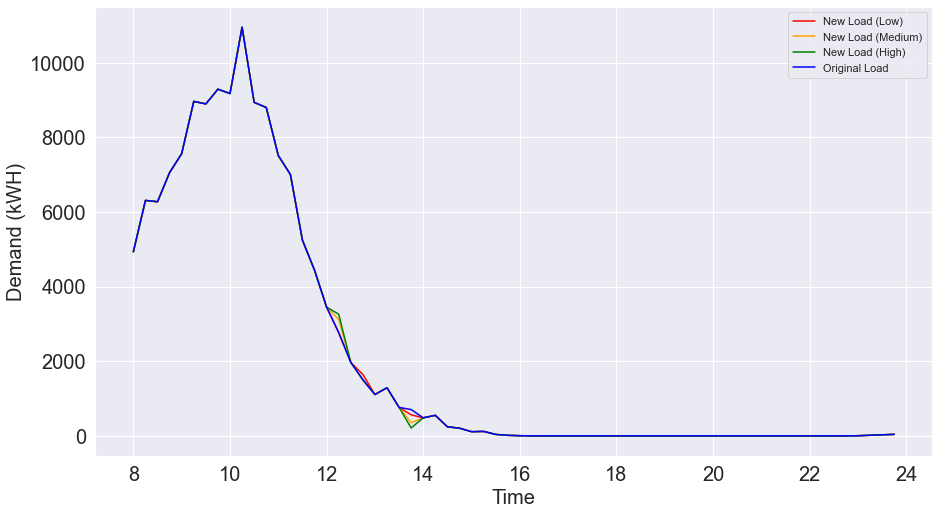

-------------------------
Date: 2018-04-23
Emissions Savings Using Low Estimates: 26.212203878168673 lb. CO2
Emissions Savings Using Med Estimates: 65.53076638970103 lb. CO2
Emissions Savings Using High Estimates: 91.7430763359052 lb. CO2


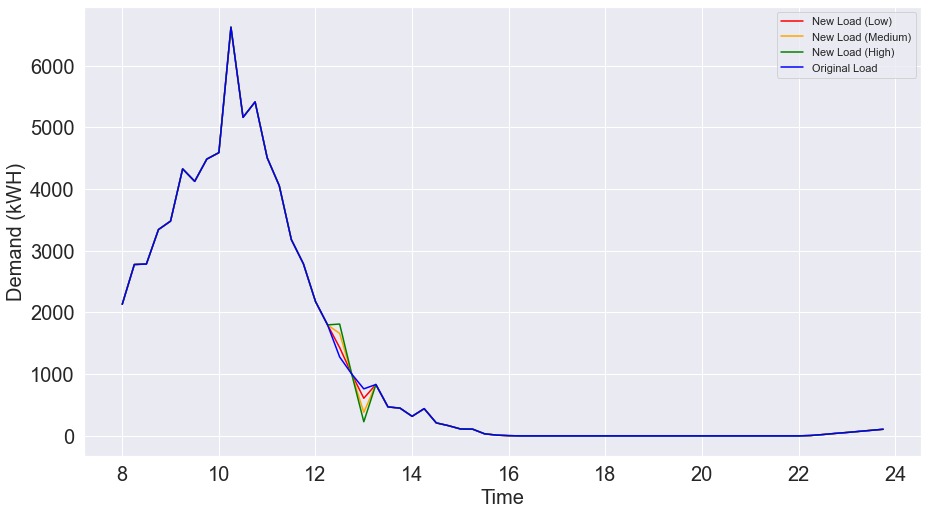

-------------------------
Date: 2018-04-24
Emissions Savings Using Low Estimates: 139.02139413113986 lb. CO2
Emissions Savings Using Med Estimates: 370.7235611502696 lb. CO2
Emissions Savings Using High Estimates: 519.0129850111456 lb. CO2


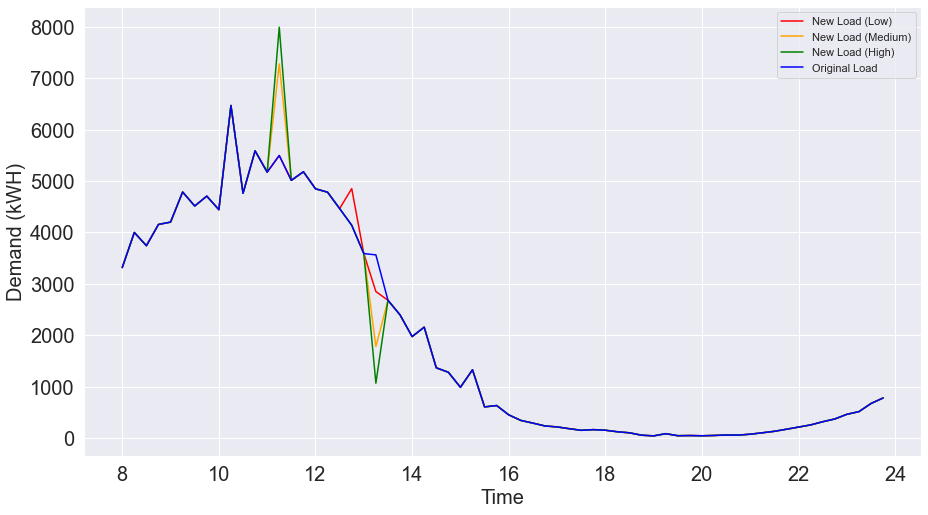

-------------------------
Date: 2018-12-02
Emissions Savings Using Low Estimates: 605.1465521806576 lb. CO2
Emissions Savings Using Med Estimates: 1512.8674973156271 lb. CO2
Emissions Savings Using High Estimates: 2118.014365825288 lb. CO2


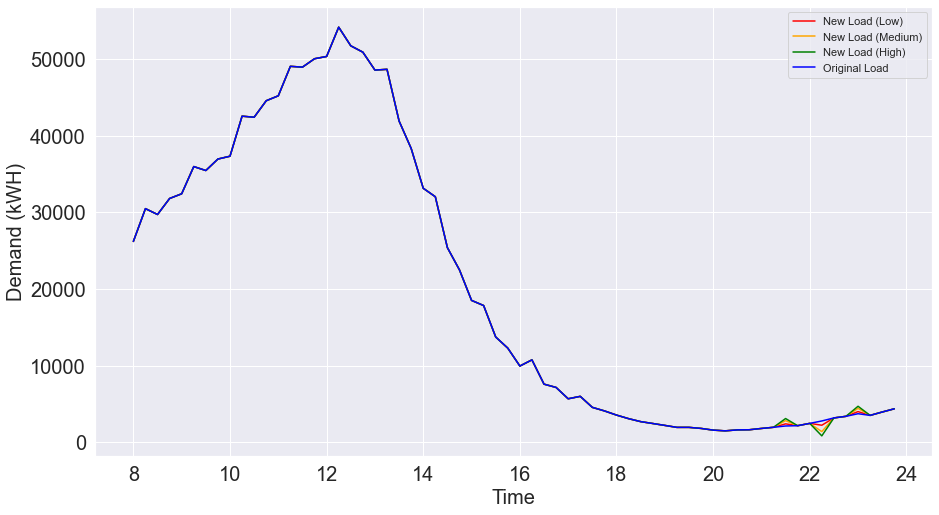

-------------------------
Date: 2018-12-03
Emissions Savings Using Low Estimates: 103.4558359832733 lb. CO2
Emissions Savings Using Med Estimates: 669.5626913360098 lb. CO2
Emissions Savings Using High Estimates: 937.3877675483427 lb. CO2


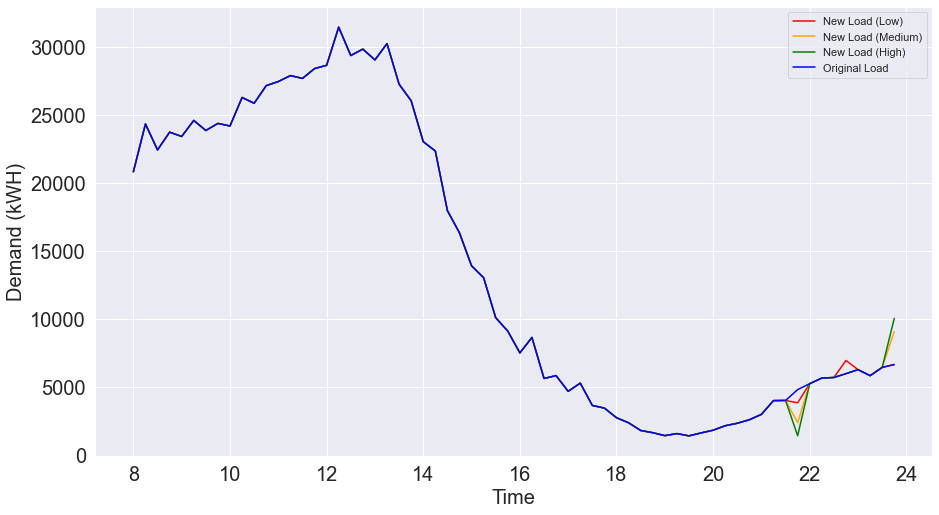

-------------------------
Date: 2018-12-04
Emissions Savings Using Low Estimates: 96.36565254041298 lb. CO2
Emissions Savings Using Med Estimates: 639.9290788112222 lb. CO2
Emissions Savings Using High Estimates: 895.9007082012357 lb. CO2


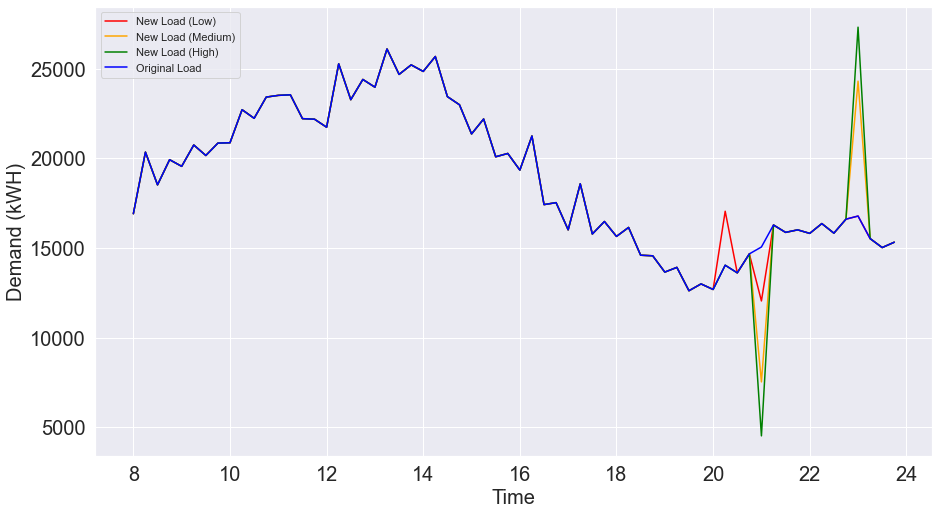

-------------------------
Date: 2018-12-06
Emissions Savings Using Low Estimates: 3.8750120960178718 lb. CO2
Emissions Savings Using Med Estimates: 10.827244643287194 lb. CO2
Emissions Savings Using High Estimates: 15.15814103933103 lb. CO2


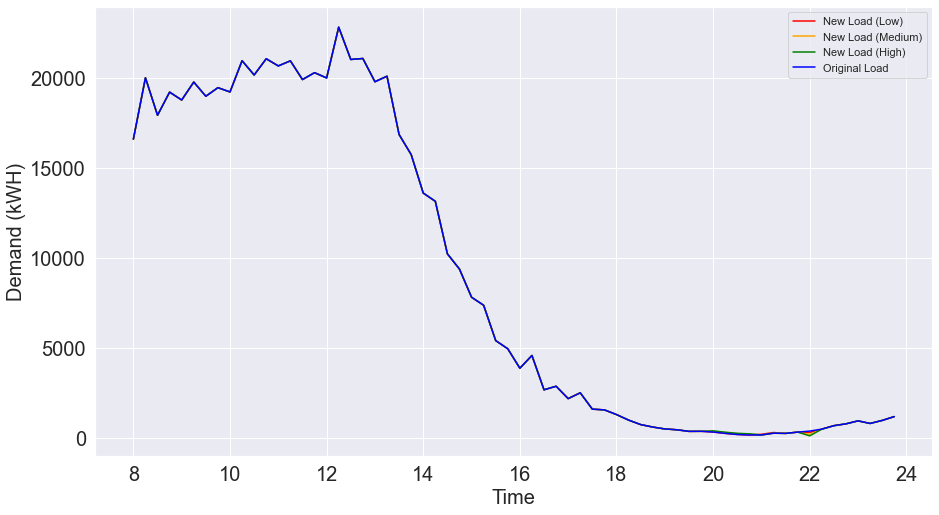

-------------------------
Date: 2018-12-07
Emissions Savings Using Low Estimates: 397.33669028914784 lb. CO2
Emissions Savings Using Med Estimates: 1119.480382905139 lb. CO2
Emissions Savings Using High Estimates: 1567.2725361228502 lb. CO2


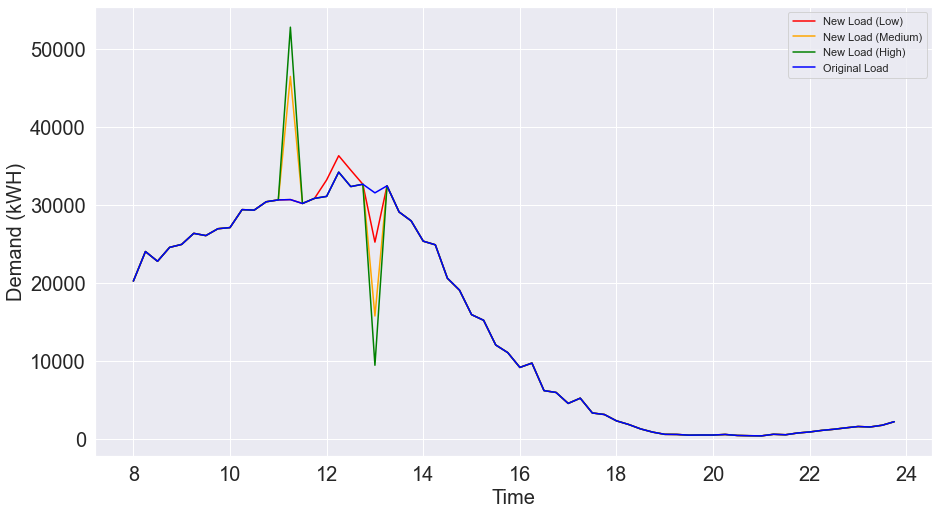

-------------------------
Date: 2018-12-08
Emissions Savings Using Low Estimates: 113.38185735562561 lb. CO2
Emissions Savings Using Med Estimates: 777.2151448981031 lb. CO2
Emissions Savings Using High Estimates: 1088.1012003869423 lb. CO2


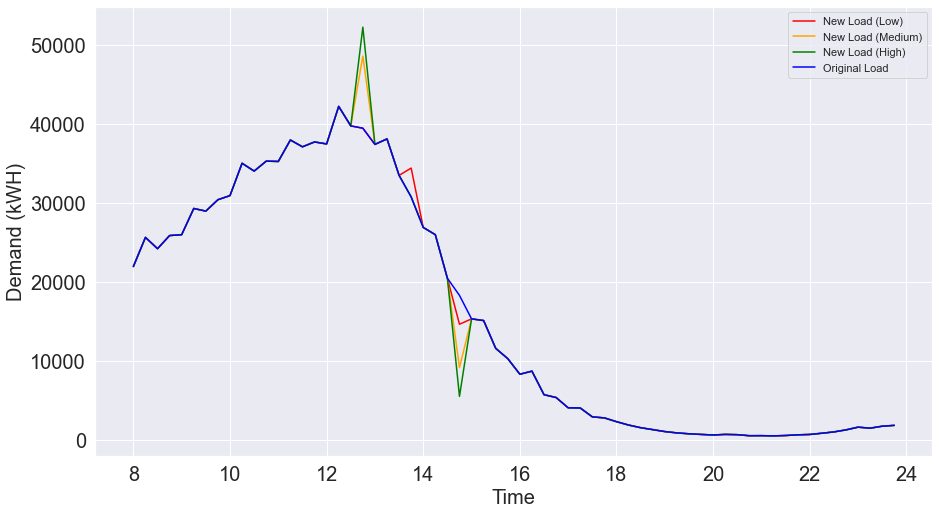

-------------------------
Date: 2018-12-10
Emissions Savings Using Low Estimates: 96.59399262476214 lb. CO2
Emissions Savings Using Med Estimates: 241.4849843889554 lb. CO2
Emissions Savings Using High Estimates: 338.0789783513439 lb. CO2


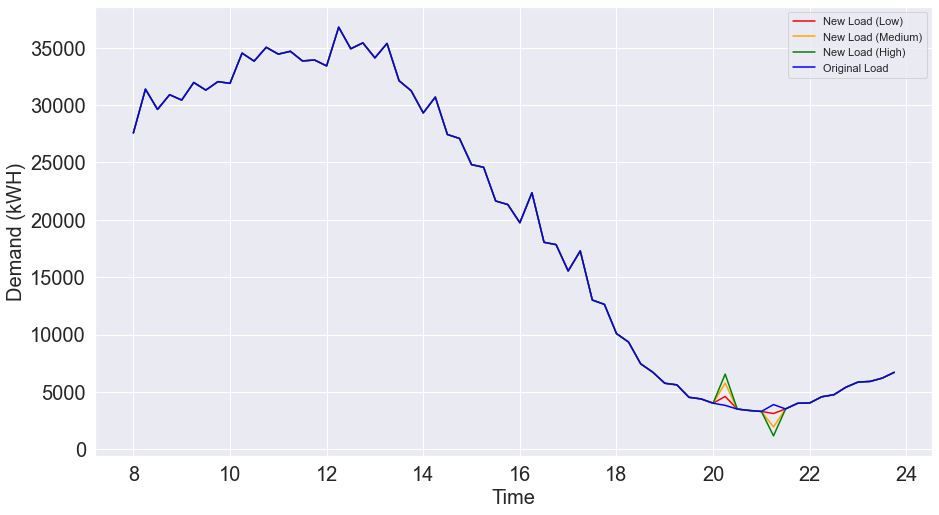

-------------------------
Date: 2018-12-11
Emissions Savings Using Low Estimates: 496.86153886749213 lb. CO2
Emissions Savings Using Med Estimates: 1242.1538507522155 lb. CO2
Emissions Savings Using High Estimates: 1739.015390666398 lb. CO2


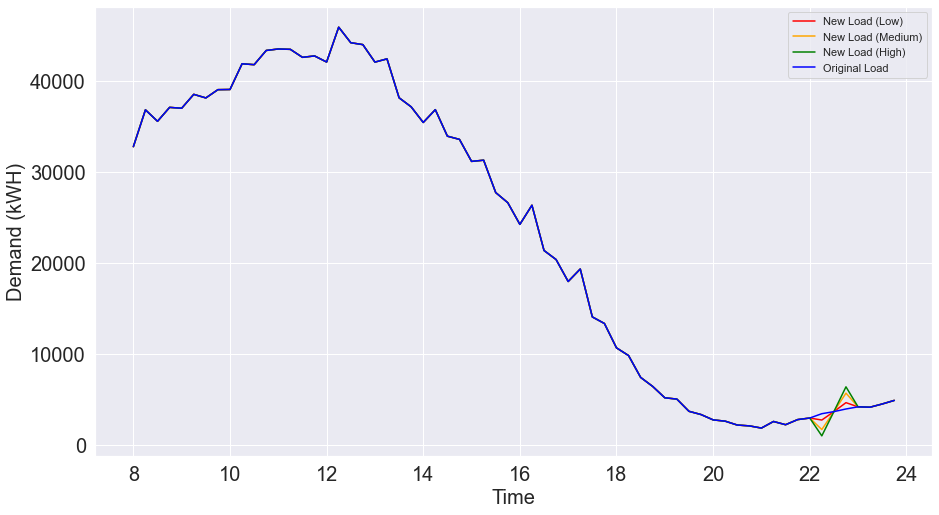

-------------------------
Date: 2018-12-12
Emissions Savings Using Low Estimates: 23.415138874160572 lb. CO2
Emissions Savings Using Med Estimates: 888.445470190347 lb. CO2
Emissions Savings Using High Estimates: 1243.8236571222621 lb. CO2


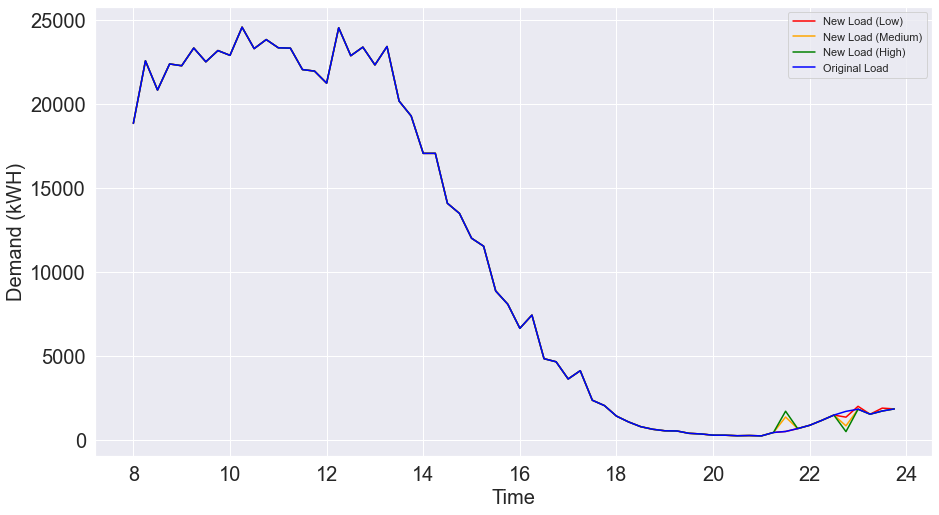

-------------------------
Date: 2018-12-13
Emissions Savings Using Low Estimates: 457.24779366997984 lb. CO2
Emissions Savings Using Med Estimates: 2357.6886962558756 lb. CO2
Emissions Savings Using High Estimates: 3300.7641743380746 lb. CO2


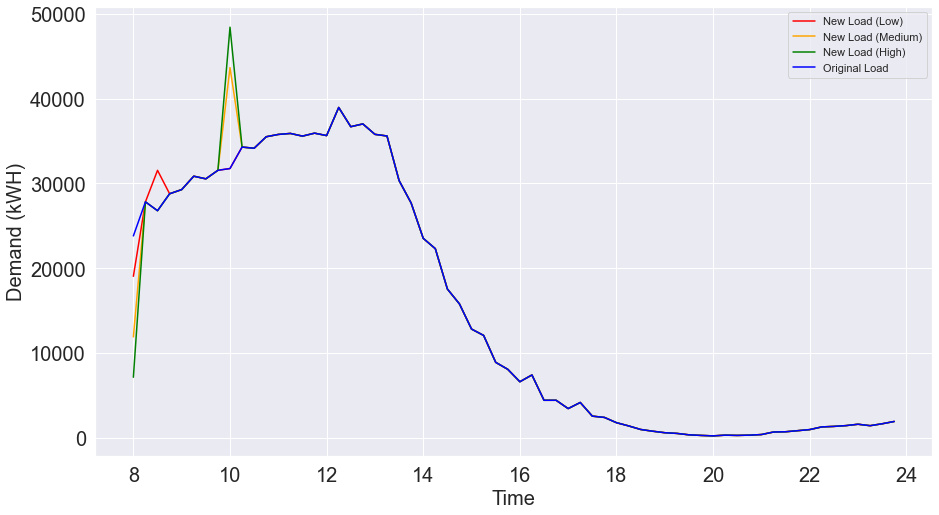

-------------------------
Date: 2018-12-14
Emissions Savings Using Low Estimates: 500.06444455256377 lb. CO2
Emissions Savings Using Med Estimates: 1250.1609405165254 lb. CO2
Emissions Savings Using High Estimates: 1750.2254023931814 lb. CO2


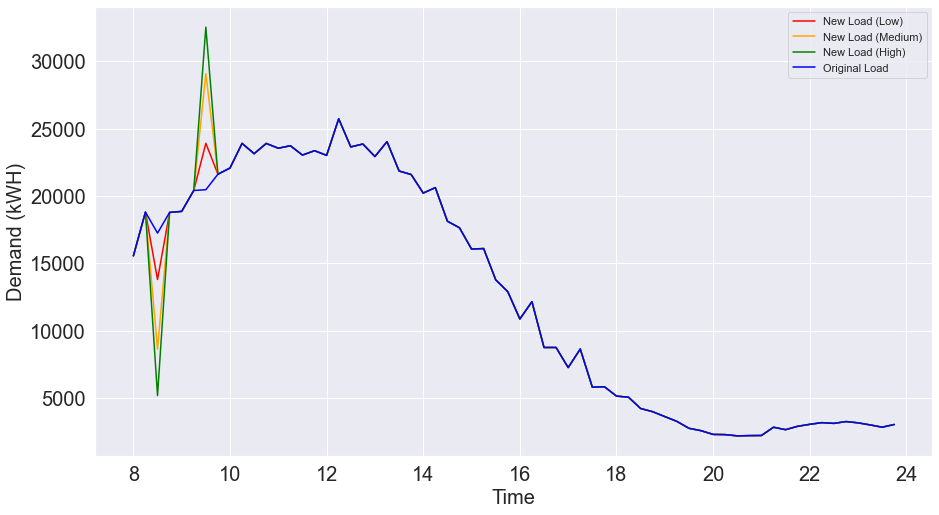

-------------------------
Date: 2018-12-15
Emissions Savings Using Low Estimates: 30.379745691585693 lb. CO2
Emissions Savings Using Med Estimates: 80.61270307314997 lb. CO2
Emissions Savings Using High Estimates: 112.85775259736057 lb. CO2


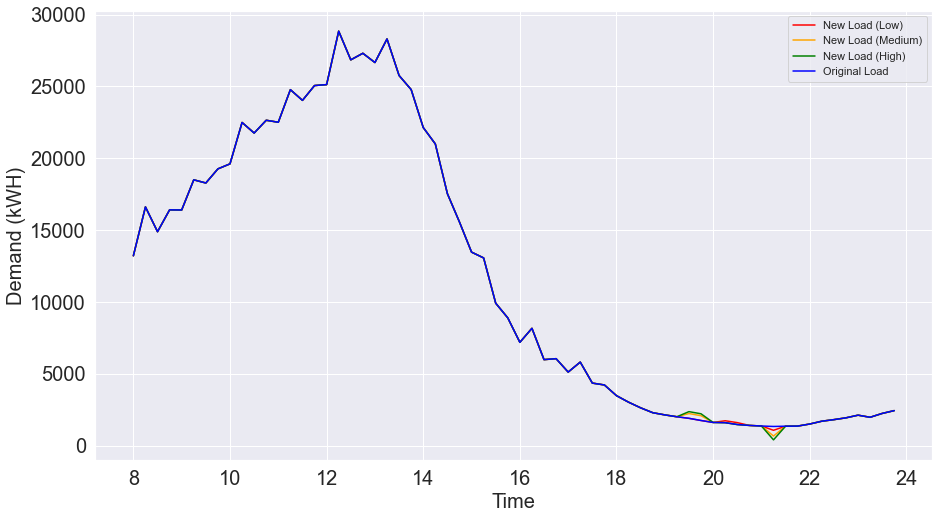

-------------------------
Date: 2018-12-16
Emissions Savings Using Low Estimates: 191.44501732276234 lb. CO2
Emissions Savings Using Med Estimates: 757.8039809653428 lb. CO2
Emissions Savings Using High Estimates: 1060.925574791 lb. CO2


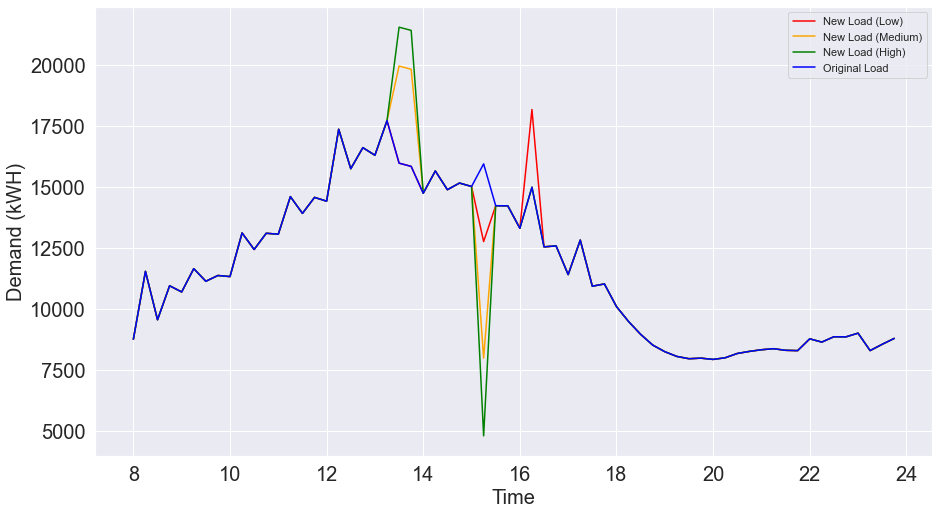

-------------------------
Date: 2018-12-17
Emissions Savings Using Low Estimates: 29.18355040073662 lb. CO2
Emissions Savings Using Med Estimates: 72.95891307176454 lb. CO2
Emissions Savings Using High Estimates: 102.14247771033502 lb. CO2


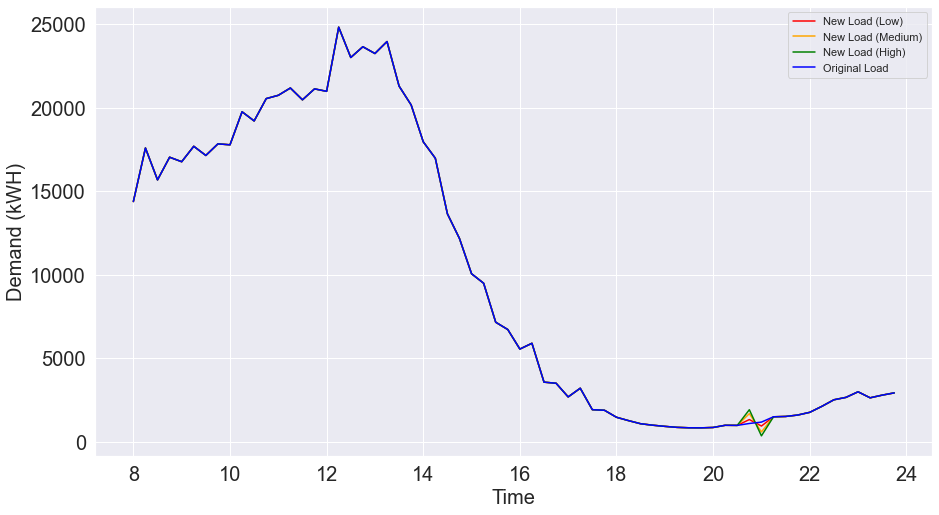

-------------------------
Date: 2018-12-18
Emissions Savings Using Low Estimates: 297.19926450707516 lb. CO2
Emissions Savings Using Med Estimates: 1088.3372362080297 lb. CO2
Emissions Savings Using High Estimates: 1523.672128779895 lb. CO2


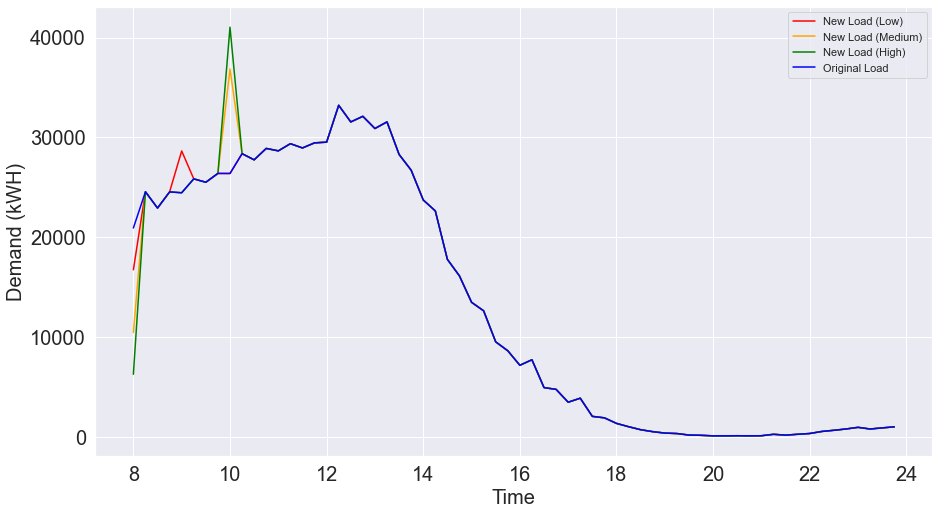

-------------------------
Date: 2018-12-19
Emissions Savings Using Low Estimates: 212.33097420520045 lb. CO2
Emissions Savings Using Med Estimates: 530.8274395738889 lb. CO2
Emissions Savings Using High Estimates: 743.1584151324694 lb. CO2


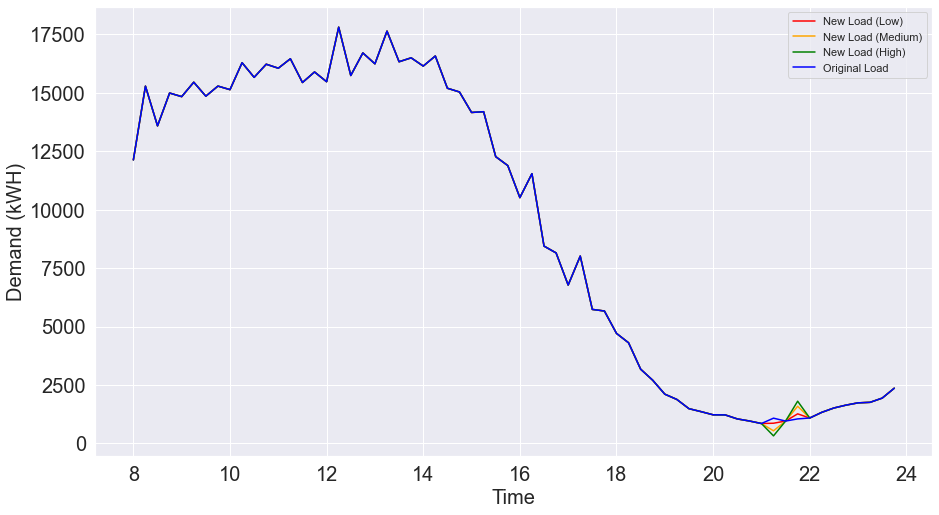

-------------------------
Date: 2018-12-20
Emissions Savings Using Low Estimates: 270.3521451510755 lb. CO2
Emissions Savings Using Med Estimates: 675.8820598813816 lb. CO2
Emissions Savings Using High Estimates: 946.2348833852162 lb. CO2


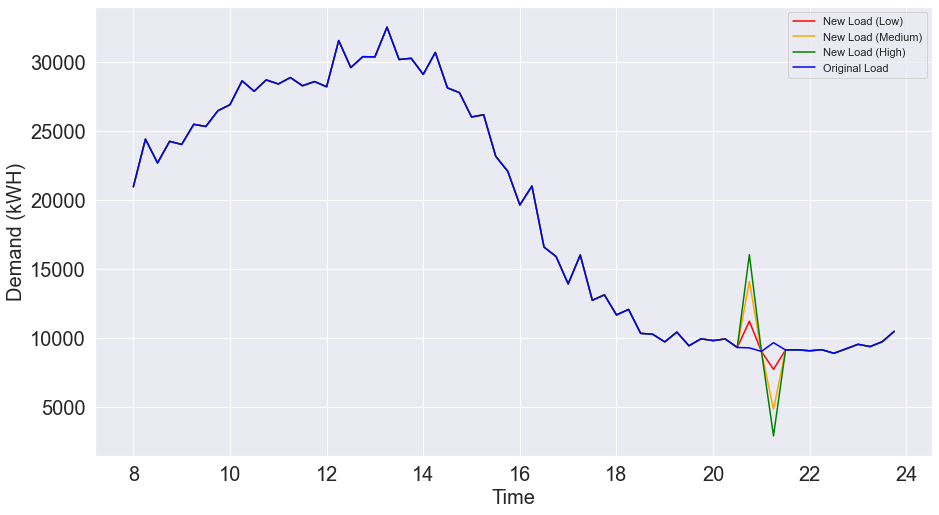

-------------------------
Date: 2018-12-21
Emissions Savings Using Low Estimates: 77.50359051869182 lb. CO2
Emissions Savings Using Med Estimates: 195.18362603683403 lb. CO2
Emissions Savings Using High Estimates: 273.2570708119855 lb. CO2


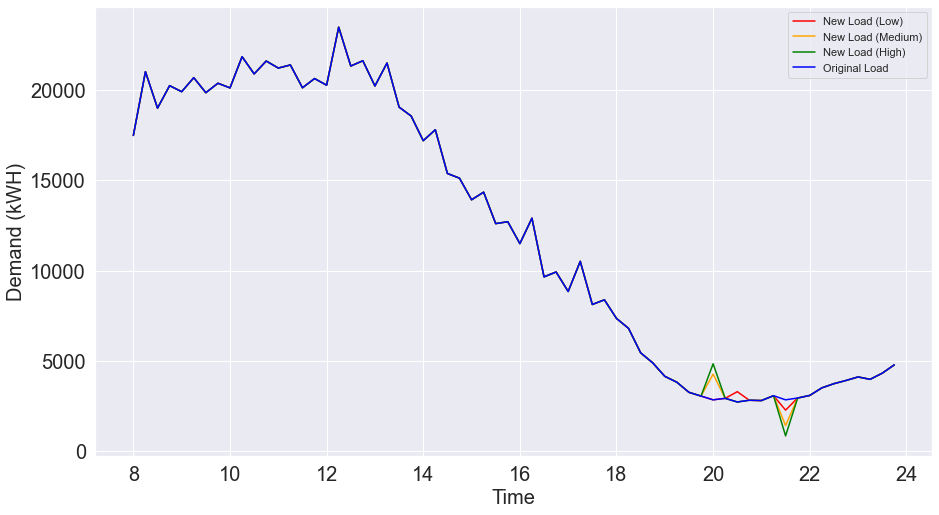

-------------------------
Date: 2018-12-23
Emissions Savings Using Low Estimates: 78.33595471355058 lb. CO2
Emissions Savings Using Med Estimates: 195.83992052473863 lb. CO2
Emissions Savings Using High Estimates: 274.1758884021504 lb. CO2


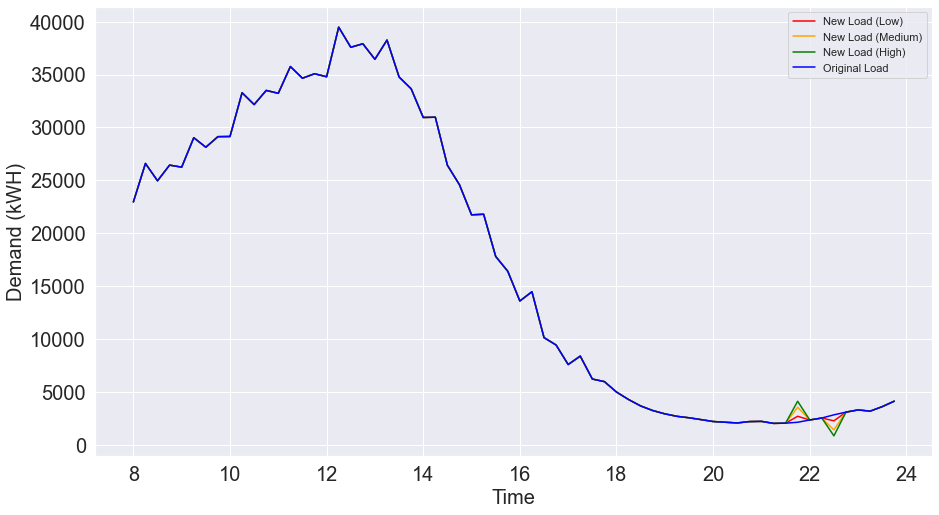

-------------------------
Date: 2018-12-24
Emissions Savings Using Low Estimates: 320.8701550193066 lb. CO2
Emissions Savings Using Med Estimates: 1079.4705232014933 lb. CO2
Emissions Savings Using High Estimates: 1511.2587348030422 lb. CO2


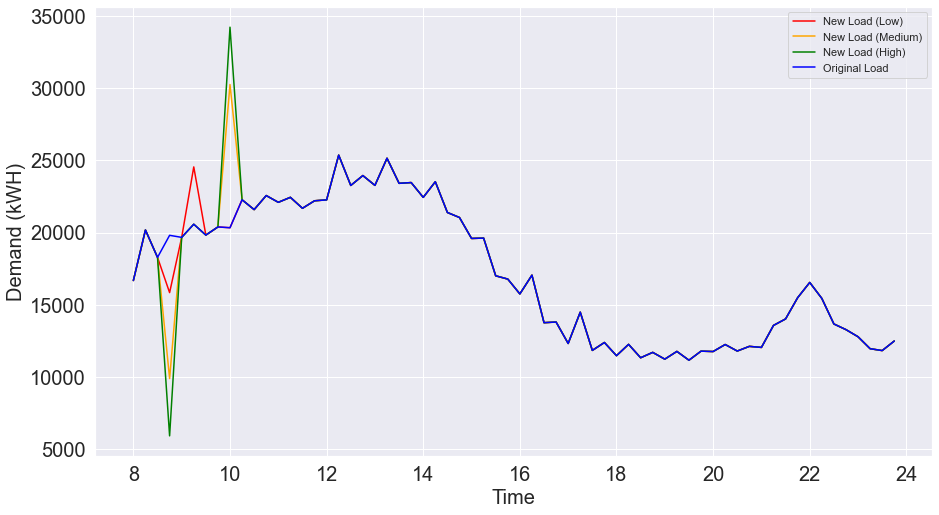

-------------------------
Date: 2018-12-25
Emissions Savings Using Low Estimates: 327.7362483609513 lb. CO2
Emissions Savings Using Med Estimates: 850.8529310628461 lb. CO2
Emissions Savings Using High Estimates: 1191.19406487155 lb. CO2


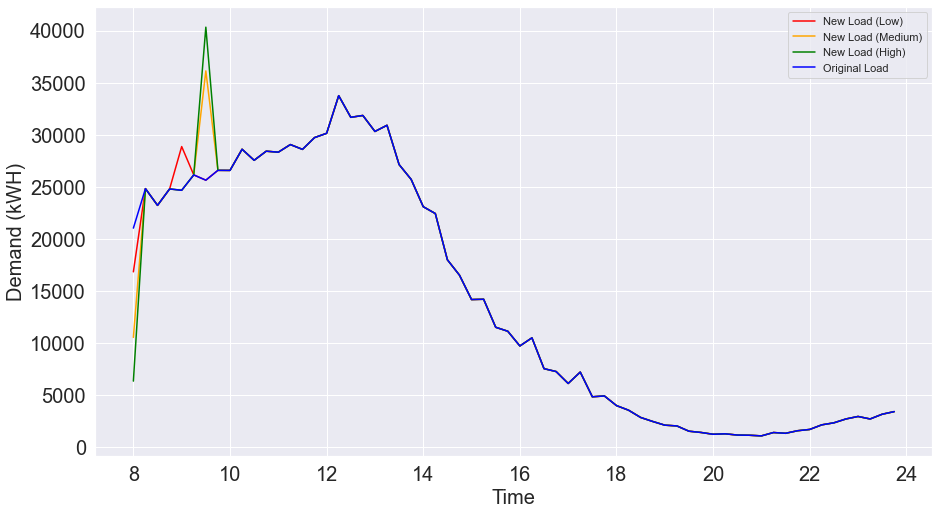

-------------------------
Date: 2018-12-26
Emissions Savings Using Low Estimates: 331.0101585140944 lb. CO2
Emissions Savings Using Med Estimates: 1655.0509254283063 lb. CO2
Emissions Savings Using High Estimates: 2317.071295041487 lb. CO2


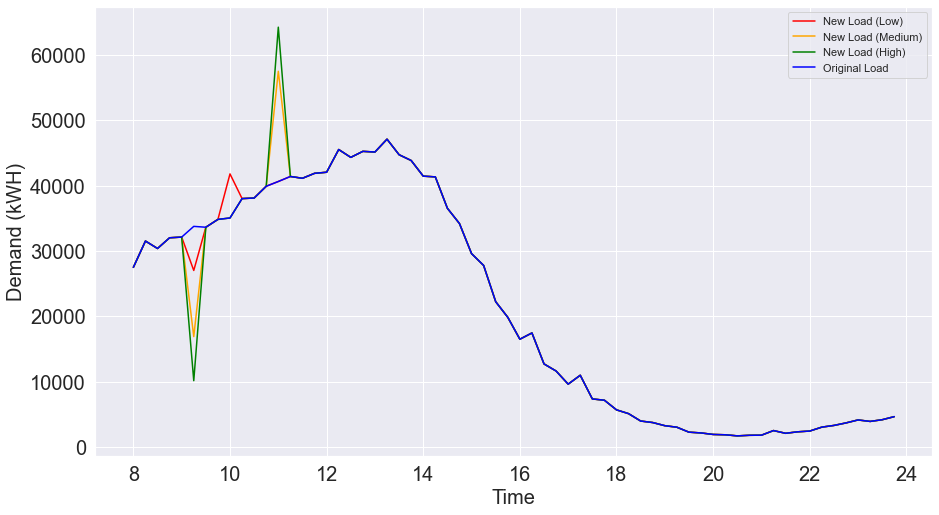

-------------------------
Total Emissions Savings Using Low Estimates: 46454.41601996936 lb. CO2
Total Emissions Savings Using Med Estimates: 135028.067239979 lb. CO2
Total Emissions Savings Using High Estimates: 189039.3010740849 lb. CO2


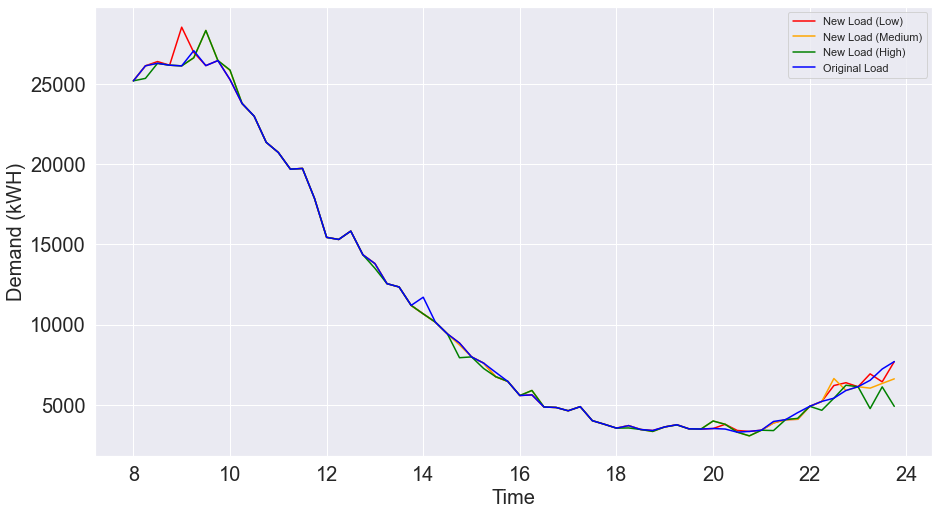

In [106]:
proportion_shiftable_low = 0.2
proportion_shiftable_med = 0.5
proportion_shiftable_high = 0.7

window_length_low = 4
window_length_med = 8
window_length_high = 8

load_savings_low_total = 0
load_savings_med_total = 0
load_savings_high_total = 0

df_original_loads = pd.DataFrame(columns = range(64))
df_loads_low = pd.DataFrame(columns = range(64))
df_loads_med = pd.DataFrame(columns = range(64))
df_loads_high = pd.DataFrame(columns = range(64))

for i in range(32, 35049, 96):
    
    if all18["Load Shift"][i]:
        emissions_time_series = list(all18["MOER"][i:i + 64]) # 64 since we are working with waking hours. 4 readings per hour * 16 waking hours = 64
        load_time_series = list(all18["heating"][i:i+ 64])
        
        new_load_low = load_shift(emissions_time_series, load_time_series, proportion_shiftable_low, window_length_low)
        new_load_med = load_shift(emissions_time_series, load_time_series, proportion_shiftable_med, window_length_med)
        new_load_high = load_shift(emissions_time_series, load_time_series, proportion_shiftable_high, window_length_high)
        
        load_savings_low = sum(emissions_time_series * (load_time_series - new_load_low)) / 1000  # Division by 1000 to cancel units. MOER is in (lb. CO2 / MWh) and load is in kwH
        load_savings_med = sum(emissions_time_series * (load_time_series - new_load_med)) / 1000
        load_savings_high = sum(emissions_time_series * (load_time_series - new_load_high)) / 1000
        
        load_savings_low_total += load_savings_low
        load_savings_med_total += load_savings_med
        load_savings_high_total += load_savings_high
        
        df_original_loads.loc[len(df_original_loads)] = load_time_series
        df_loads_low.loc[len(df_loads_low)] = new_load_low
        df_loads_med.loc[len(df_loads_med)] = new_load_med
        df_loads_high.loc[len(df_loads_high)] = new_load_high


        print("-------------------------")
        print(f"Date: {all18['date'][i].date()}")
        print(f"Emissions Savings Using Low Estimates: {load_savings_low} lb. CO2") 
        print(f"Emissions Savings Using Med Estimates: {load_savings_med} lb. CO2") 
        print(f"Emissions Savings Using High Estimates: {load_savings_high} lb. CO2") 
        
        sns.lineplot(x=np.arange(8, 24, 0.25), y=new_load_low, color='red', label = 'New Load (Low)')
        sns.lineplot(x=np.arange(8, 24, 0.25), y=new_load_med, color='orange', label = 'New Load (Medium)')
        sns.lineplot(x=np.arange(8, 24, 0.25), y=new_load_high, color='green', label = 'New Load (High)')
        sns.lineplot(x=np.arange(8, 24, 0.25), y=load_time_series, color='blue', label='Original Load')

        
        sns.set(rc={'figure.figsize':(15,8.27)})
        plt.xlabel("Time", fontsize=20)
        plt.ylabel("Demand (kWH)", fontsize=20)
        plt.xticks(fontsize=20)
        plt.yticks(fontsize=20)
        plt.legend()
        plt.show()
        plt.close()
 

print("-------------------------")
print(f"Total Emissions Savings Using Low Estimates: {load_savings_low_total} lb. CO2") 
print(f"Total Emissions Savings Using Med Estimates: {load_savings_med_total} lb. CO2") 
print(f"Total Emissions Savings Using High Estimates: {load_savings_high_total} lb. CO2")


sns.lineplot(x=np.arange(8, 24, 0.25), y=df_loads_low.median(), color='red', label='New Load (Low)')
sns.lineplot(x=np.arange(8, 24, 0.25), y=df_loads_med.median(), color='orange', label='New Load (Medium)')
sns.lineplot(x=np.arange(8, 24, 0.25), y=df_loads_high.median(), color='green', label='New Load (High)')
sns.lineplot(x=np.arange(8, 24, 0.25), y=df_original_loads.median(), color='blue', label='Original Load')
plt.xlabel("Time", fontsize=20)
plt.ylabel("Demand (kWH)", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend()
plt.show()

# Heating Fans and Pumps

-------------------------
Date: 2018-01-01
Emissions Savings Using Low Estimates: 171.9702466614423 lb. CO2
Emissions Savings Using Med Estimates: 525.4649120119154 lb. CO2
Emissions Savings Using High Estimates: 735.6508761973854 lb. CO2


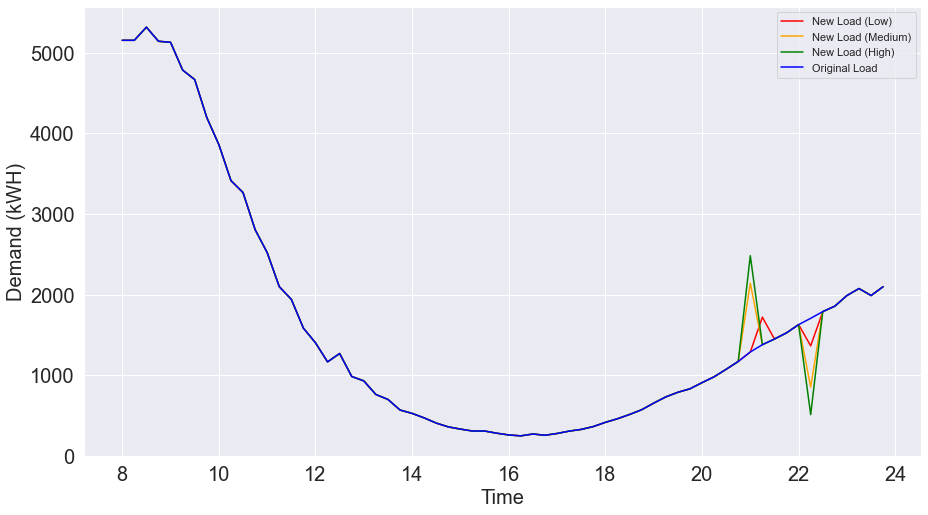

-------------------------
Date: 2018-01-02
Emissions Savings Using Low Estimates: 30.849909003645692 lb. CO2
Emissions Savings Using Med Estimates: 171.66482484368322 lb. CO2
Emissions Savings Using High Estimates: 240.33074824480218 lb. CO2


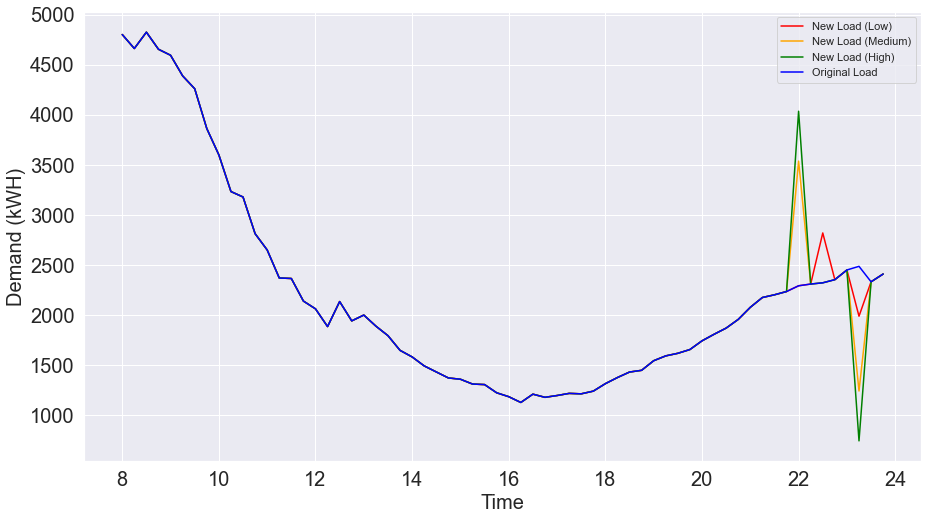

-------------------------
Date: 2018-01-04
Emissions Savings Using Low Estimates: 59.30311176086044 lb. CO2
Emissions Savings Using Med Estimates: 148.25777088784093 lb. CO2
Emissions Savings Using High Estimates: 207.56087837346595 lb. CO2


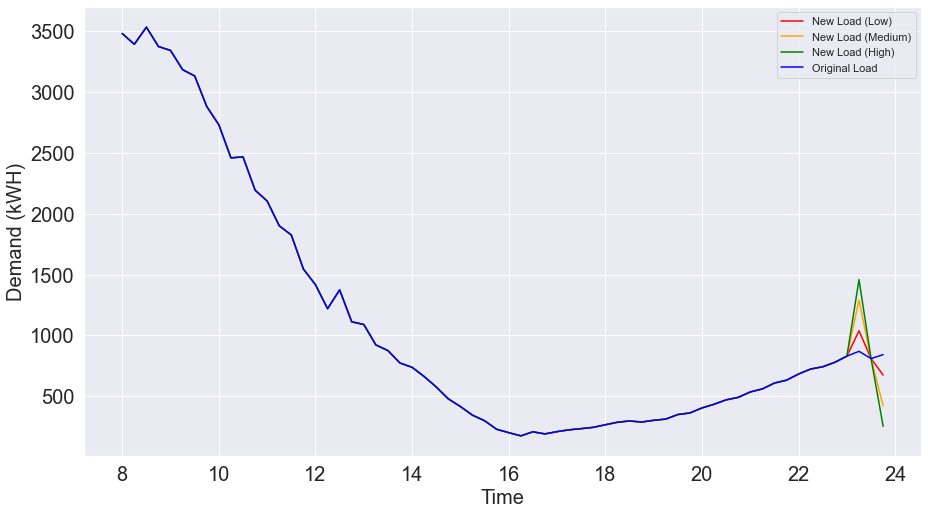

-------------------------
Date: 2018-01-05
Emissions Savings Using Low Estimates: 544.8695191390085 lb. CO2
Emissions Savings Using Med Estimates: 1362.1743137547128 lb. CO2
Emissions Savings Using High Estimates: 1907.0440042640726 lb. CO2


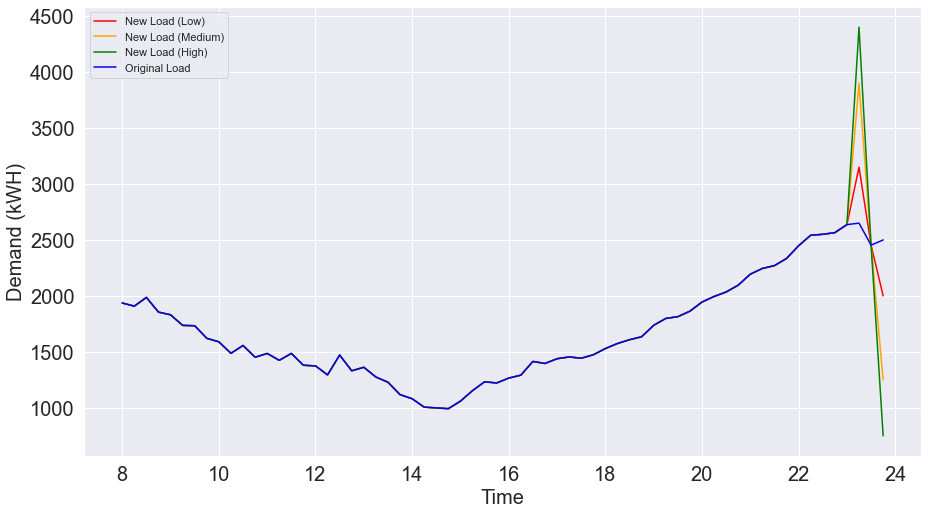

-------------------------
Date: 2018-01-08
Emissions Savings Using Low Estimates: 16.733767496123967 lb. CO2
Emissions Savings Using Med Estimates: 123.68437986459362 lb. CO2
Emissions Savings Using High Estimates: 173.15813427562662 lb. CO2


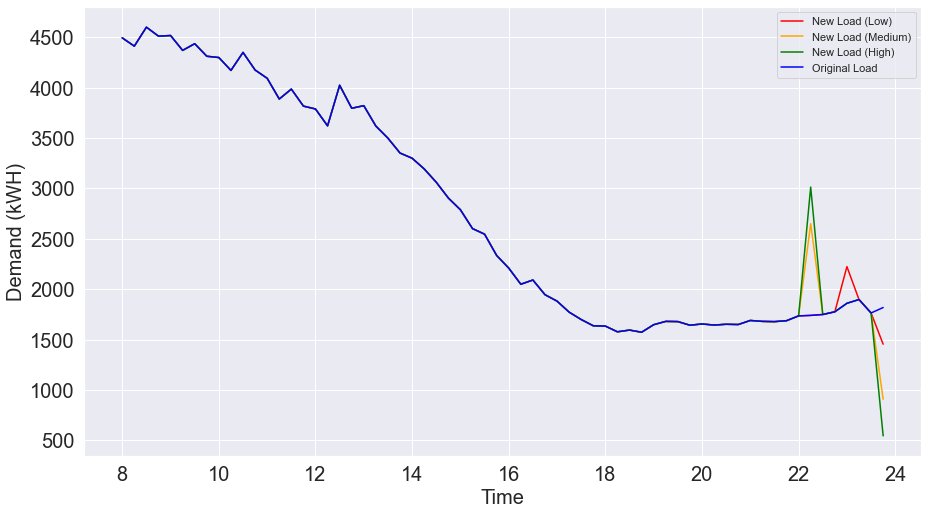

-------------------------
Date: 2018-01-09
Emissions Savings Using Low Estimates: 38.20579076625337 lb. CO2
Emissions Savings Using Med Estimates: 192.5451164073837 lb. CO2
Emissions Savings Using High Estimates: 269.5631629171746 lb. CO2


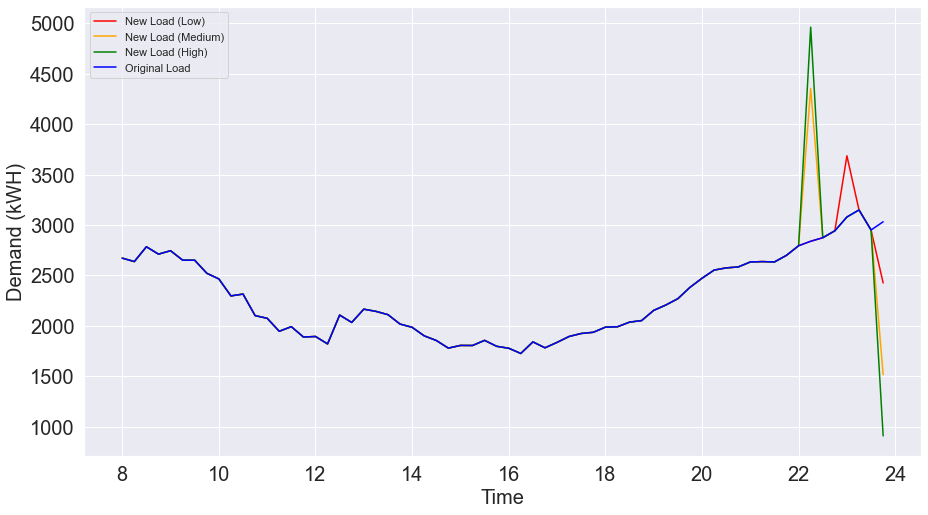

-------------------------
Date: 2018-01-14
Emissions Savings Using Low Estimates: 398.5956324066552 lb. CO2
Emissions Savings Using Med Estimates: 996.4891296635896 lb. CO2
Emissions Savings Using High Estimates: 1395.08489526867 lb. CO2


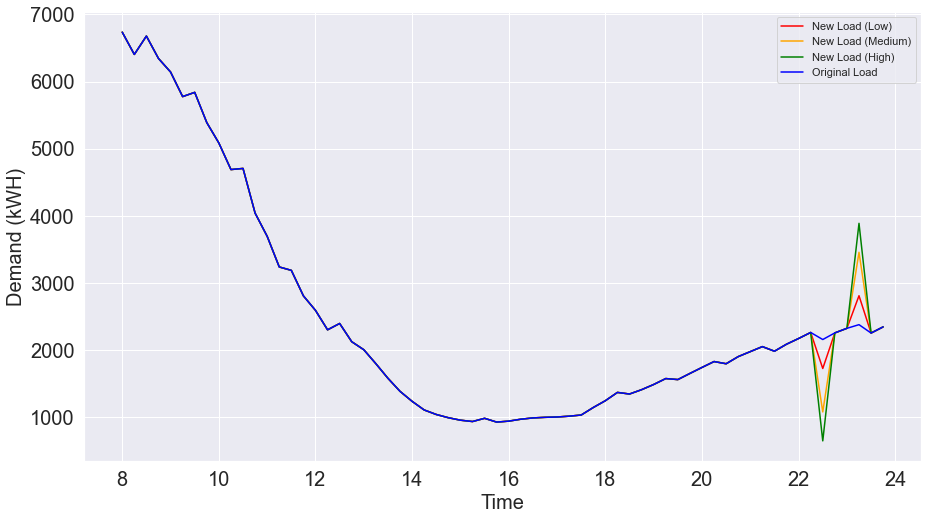

-------------------------
Date: 2018-01-15
Emissions Savings Using Low Estimates: 57.50790071915873 lb. CO2
Emissions Savings Using Med Estimates: 160.12680309311662 lb. CO2
Emissions Savings Using High Estimates: 224.1775235095187 lb. CO2


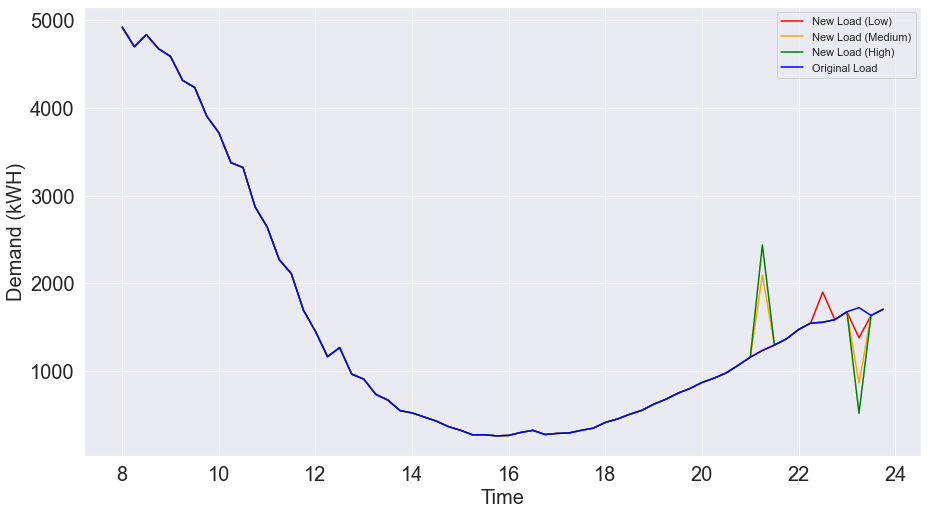

-------------------------
Date: 2018-01-16
Emissions Savings Using Low Estimates: 11.592732481672021 lb. CO2
Emissions Savings Using Med Estimates: 46.99749839694507 lb. CO2
Emissions Savings Using High Estimates: 65.79651268896926 lb. CO2


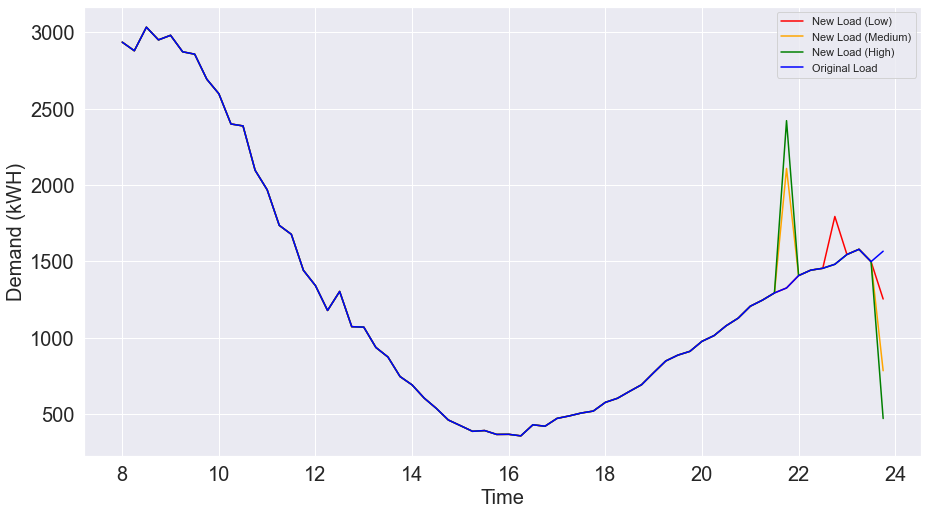

-------------------------
Date: 2018-01-17
Emissions Savings Using Low Estimates: 107.57783343205767 lb. CO2
Emissions Savings Using Med Estimates: 315.28302462373 lb. CO2
Emissions Savings Using High Estimates: 441.39623094491657 lb. CO2


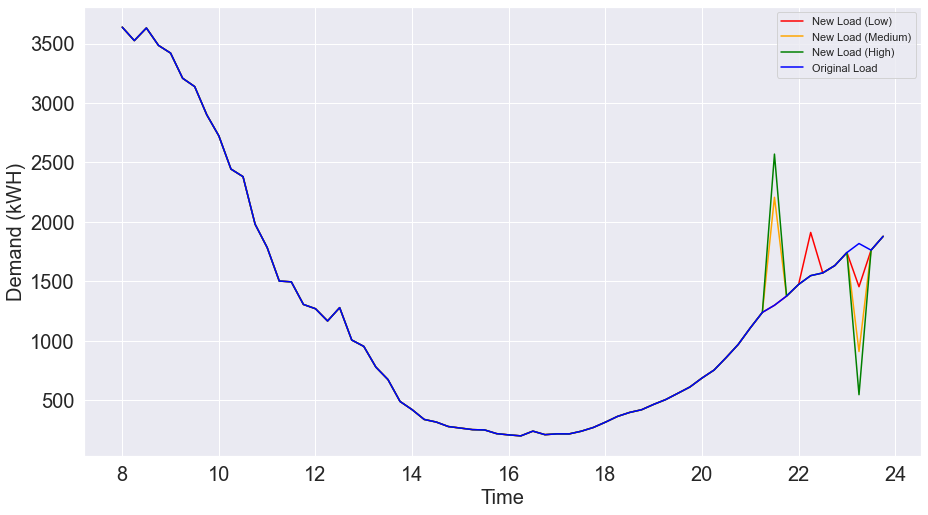

-------------------------
Date: 2018-01-18
Emissions Savings Using Low Estimates: 650.1989947901775 lb. CO2
Emissions Savings Using Med Estimates: 1625.4976413019692 lb. CO2
Emissions Savings Using High Estimates: 2275.6966975608566 lb. CO2


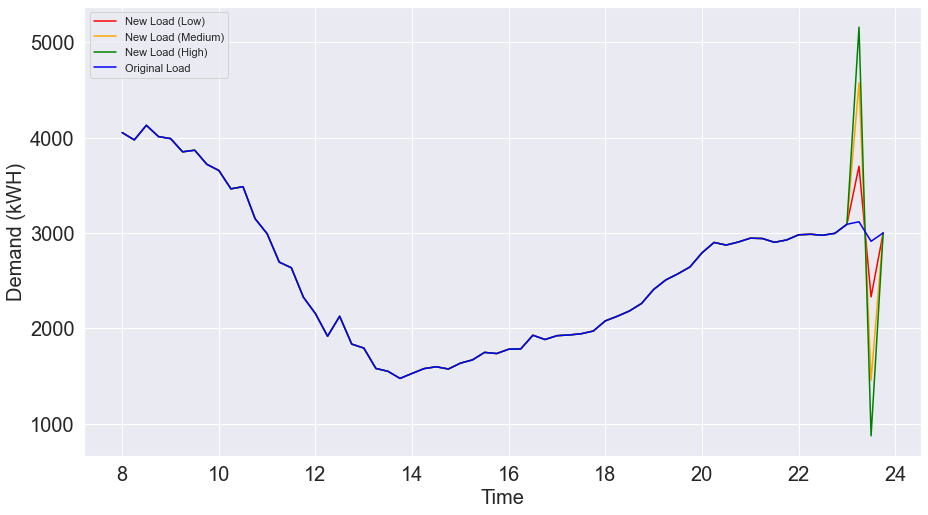

-------------------------
Date: 2018-01-19
Emissions Savings Using Low Estimates: 95.04623141595948 lb. CO2
Emissions Savings Using Med Estimates: 276.87384748719234 lb. CO2
Emissions Savings Using High Estimates: 387.6233970395569 lb. CO2


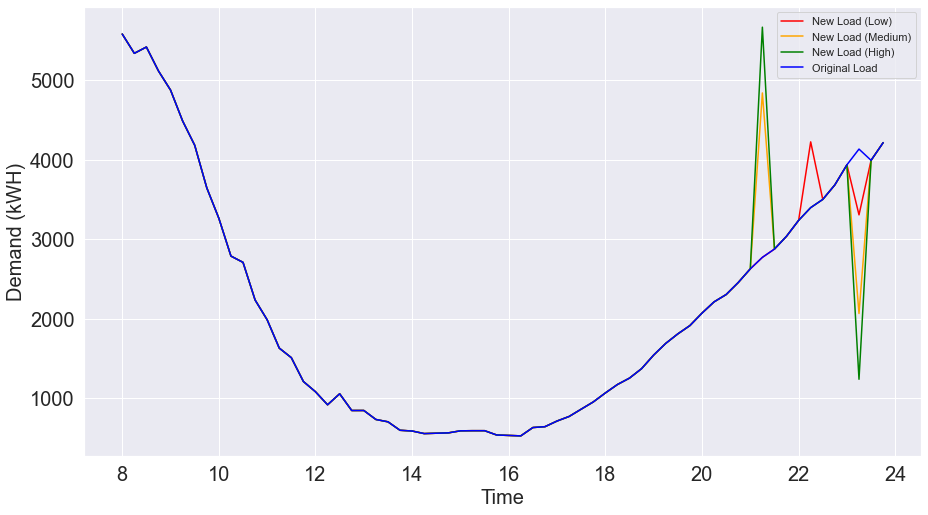

-------------------------
Date: 2018-01-21
Emissions Savings Using Low Estimates: 474.15808115912677 lb. CO2
Emissions Savings Using Med Estimates: 1185.395221874396 lb. CO2
Emissions Savings Using High Estimates: 1659.553311517994 lb. CO2


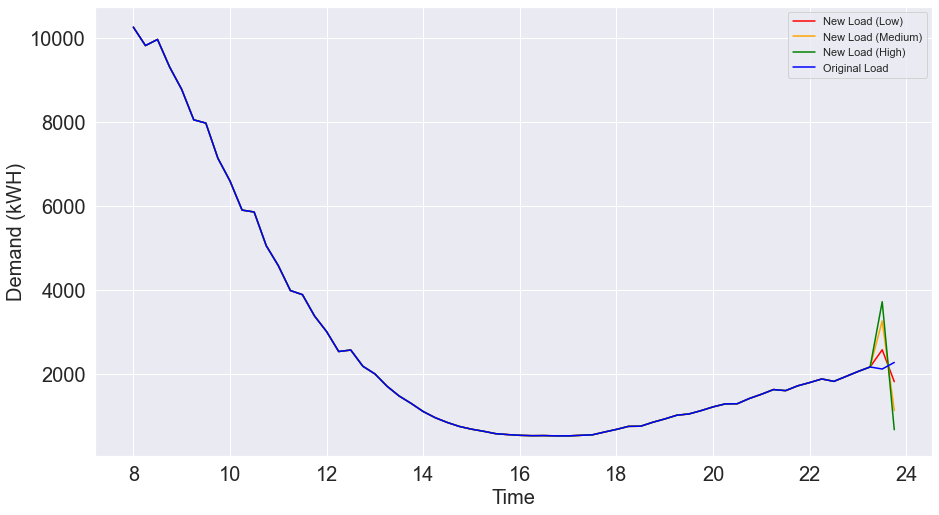

-------------------------
Date: 2018-01-23
Emissions Savings Using Low Estimates: 4.9159753317735975 lb. CO2
Emissions Savings Using Med Estimates: 13.378916383232646 lb. CO2
Emissions Savings Using High Estimates: 18.730485159887664 lb. CO2


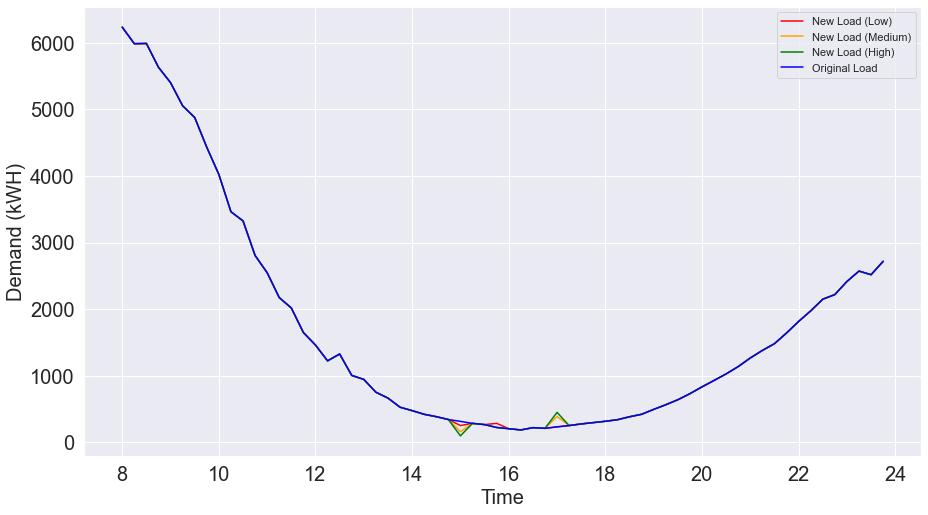

-------------------------
Date: 2018-01-25
Emissions Savings Using Low Estimates: 776.4888539682897 lb. CO2
Emissions Savings Using Med Estimates: 1943.0468544314156 lb. CO2
Emissions Savings Using High Estimates: 2720.2655971376444 lb. CO2


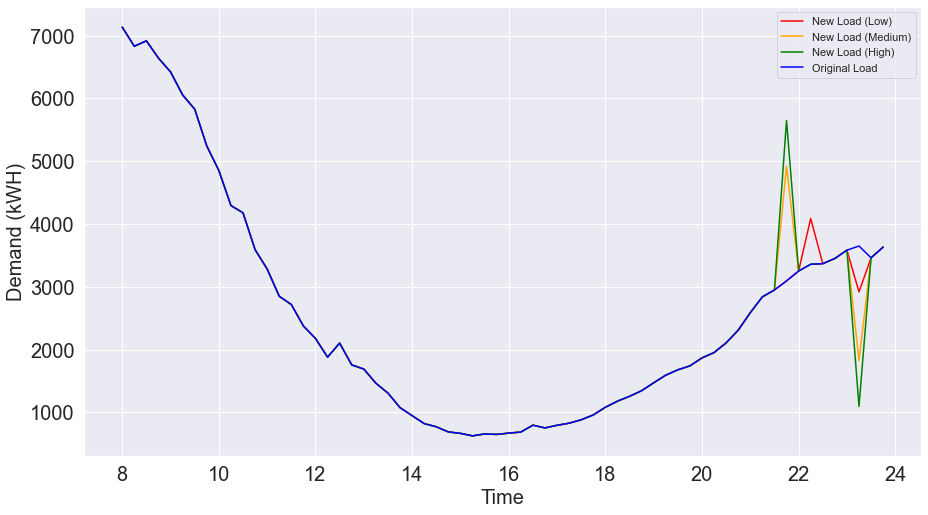

-------------------------
Date: 2018-01-26
Emissions Savings Using Low Estimates: 102.31366591793305 lb. CO2
Emissions Savings Using Med Estimates: 303.9758516283458 lb. CO2
Emissions Savings Using High Estimates: 425.5661766061233 lb. CO2


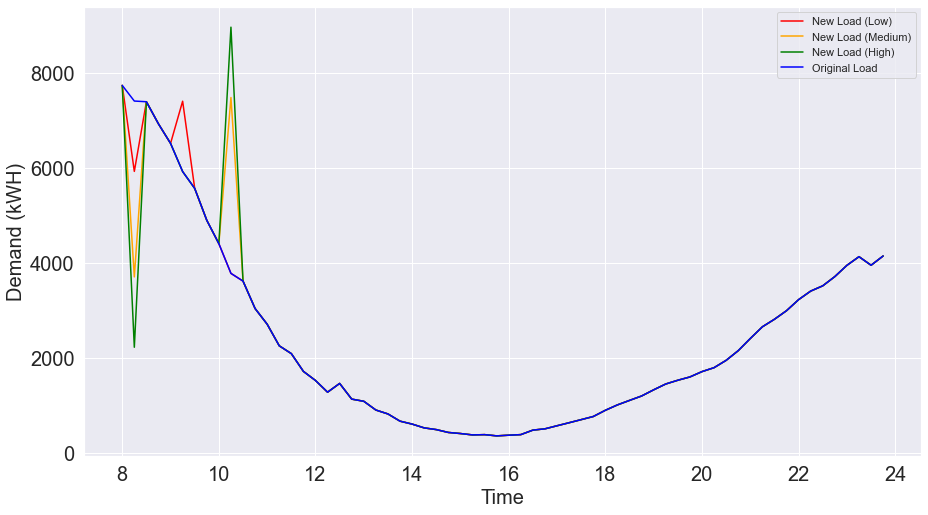

-------------------------
Date: 2018-01-29
Emissions Savings Using Low Estimates: 191.73985970063754 lb. CO2
Emissions Savings Using Med Estimates: 479.3496094568984 lb. CO2
Emissions Savings Using High Estimates: 671.0895362917668 lb. CO2


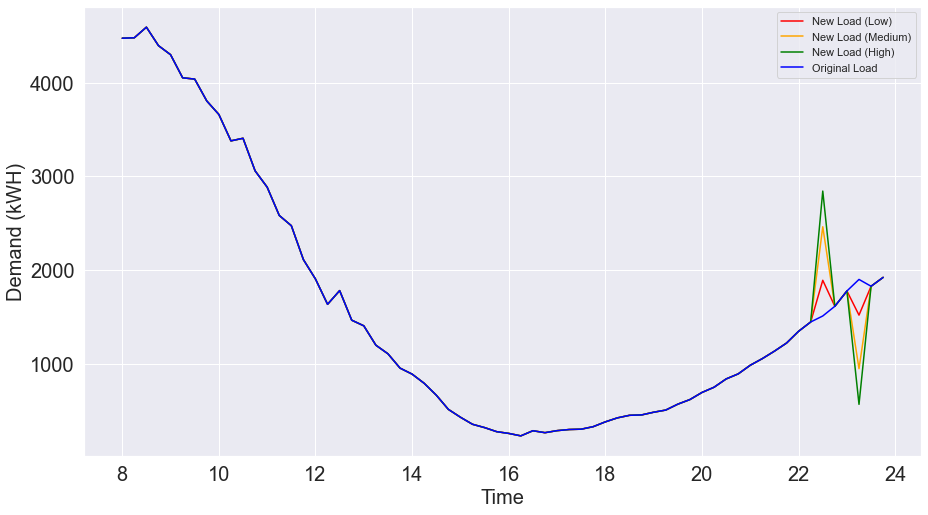

-------------------------
Date: 2018-02-01
Emissions Savings Using Low Estimates: 2.621406983108464 lb. CO2
Emissions Savings Using Med Estimates: 6.553517659924591 lb. CO2
Emissions Savings Using High Estimates: 9.17492483497708 lb. CO2


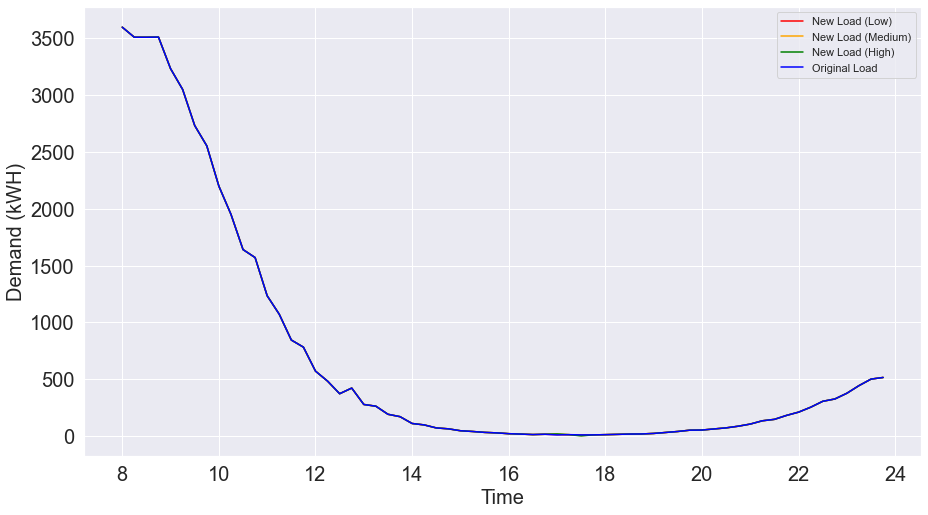

-------------------------
Date: 2018-02-05
Emissions Savings Using Low Estimates: 0.3260054509538412 lb. CO2
Emissions Savings Using Med Estimates: 1.1985486762532065 lb. CO2
Emissions Savings Using High Estimates: 1.6779679520280328 lb. CO2


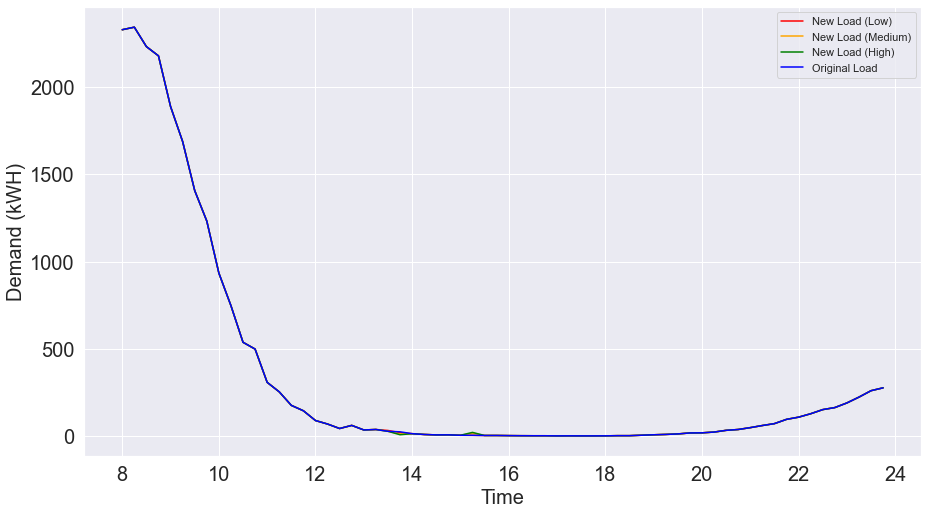

-------------------------
Date: 2018-02-09
Emissions Savings Using Low Estimates: 0.1976299705658827 lb. CO2
Emissions Savings Using Med Estimates: 0.49395101942927494 lb. CO2
Emissions Savings Using High Estimates: 0.6915690056818435 lb. CO2


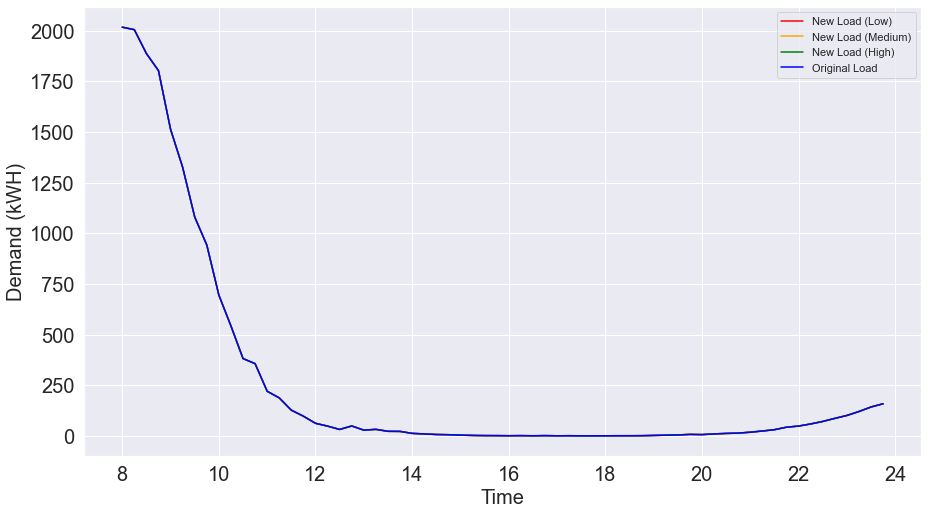

-------------------------
Date: 2018-02-12
Emissions Savings Using Low Estimates: 37.06192418095339 lb. CO2
Emissions Savings Using Med Estimates: 196.89148787523203 lb. CO2
Emissions Savings Using High Estimates: 275.6480827043856 lb. CO2


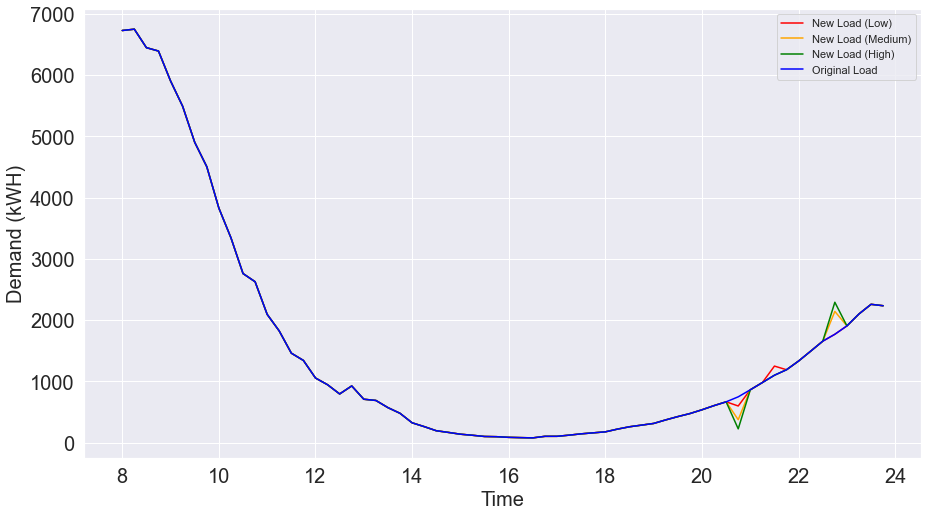

-------------------------
Date: 2018-02-13
Emissions Savings Using Low Estimates: 223.34449227097107 lb. CO2
Emissions Savings Using Med Estimates: 558.3612471232906 lb. CO2
Emissions Savings Using High Estimates: 781.7057420277605 lb. CO2


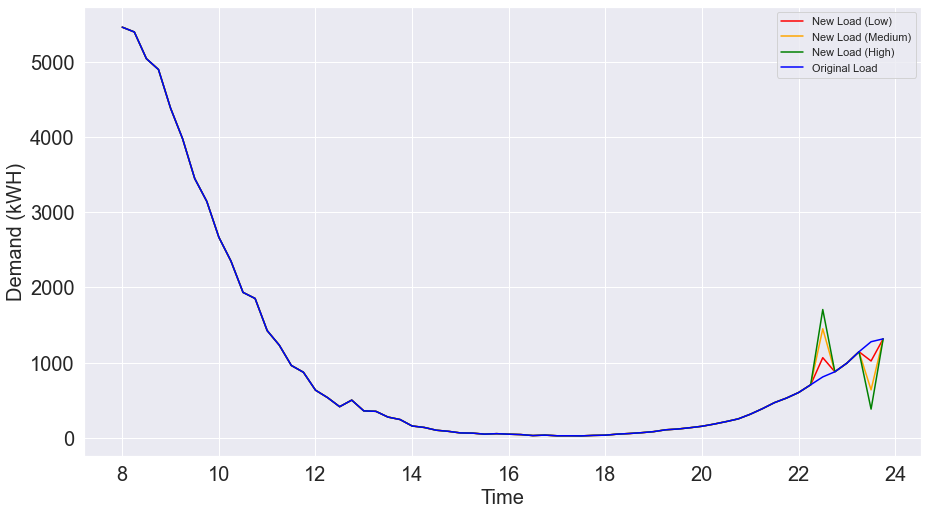

-------------------------
Date: 2018-02-14
Emissions Savings Using Low Estimates: 3.6175866928385143 lb. CO2
Emissions Savings Using Med Estimates: 15.237269274662088 lb. CO2
Emissions Savings Using High Estimates: 21.332149271231565 lb. CO2


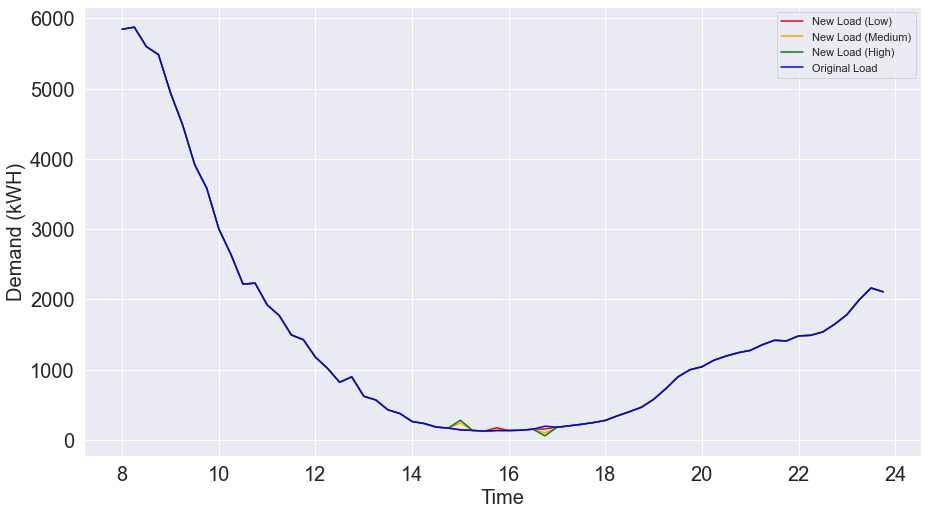

-------------------------
Date: 2018-02-19
Emissions Savings Using Low Estimates: 624.9706924011523 lb. CO2
Emissions Savings Using Med Estimates: 2239.248798267666 lb. CO2
Emissions Savings Using High Estimates: 3134.94840191747 lb. CO2


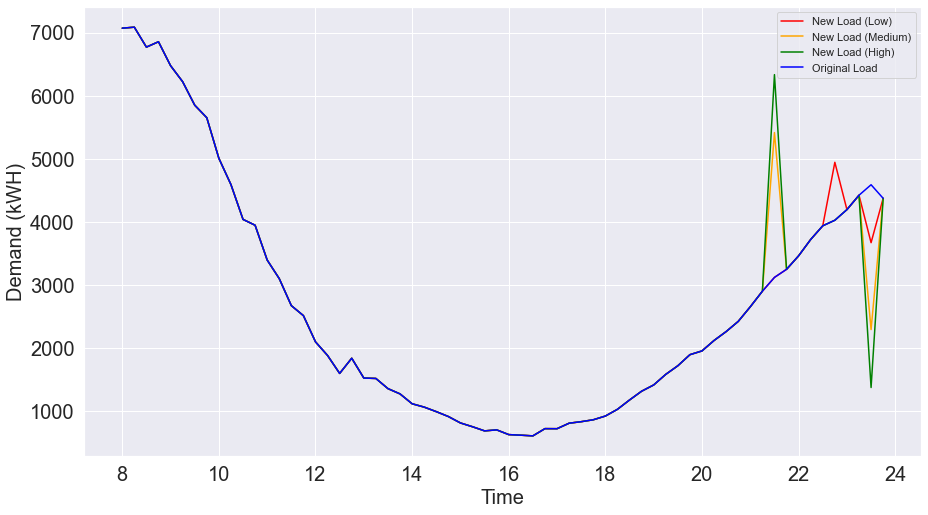

-------------------------
Date: 2018-02-21
Emissions Savings Using Low Estimates: 14.769529782577855 lb. CO2
Emissions Savings Using Med Estimates: 130.900725606234 lb. CO2
Emissions Savings Using High Estimates: 183.26101009035514 lb. CO2


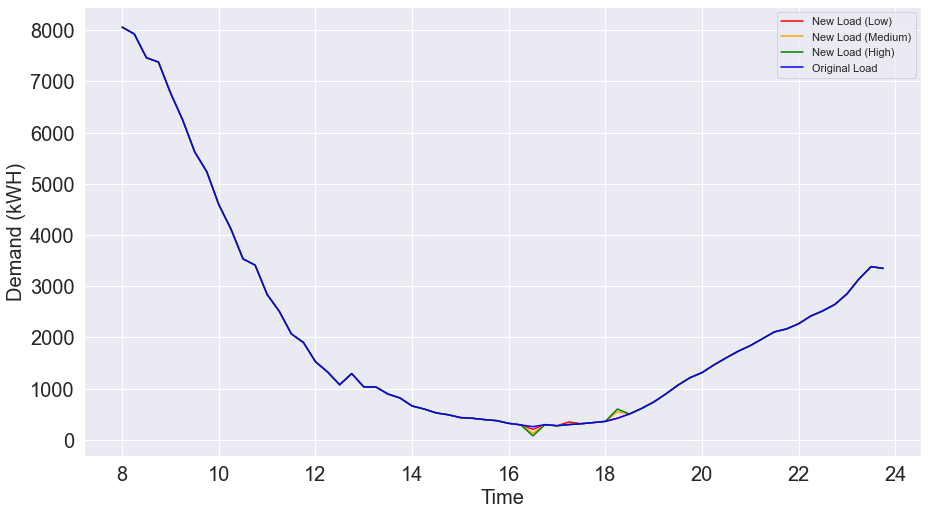

-------------------------
Date: 2018-02-26
Emissions Savings Using Low Estimates: 265.48980920945377 lb. CO2
Emissions Savings Using Med Estimates: 729.2010175367176 lb. CO2
Emissions Savings Using High Estimates: 1020.8814245651839 lb. CO2


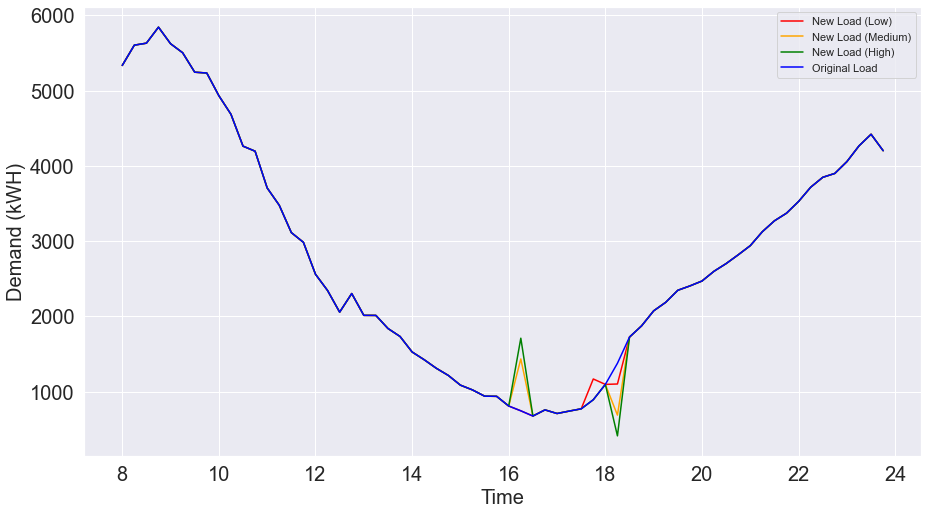

-------------------------
Date: 2018-02-27
Emissions Savings Using Low Estimates: 16.629547093473292 lb. CO2
Emissions Savings Using Med Estimates: 62.9782247040532 lb. CO2
Emissions Savings Using High Estimates: 88.16945042699312 lb. CO2


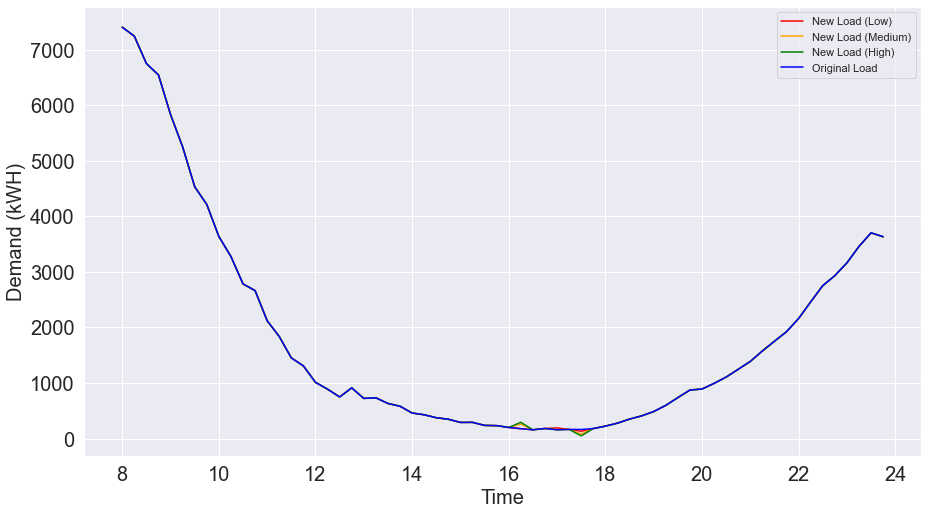

-------------------------
Date: 2018-02-28
Emissions Savings Using Low Estimates: 270.9399143242267 lb. CO2
Emissions Savings Using Med Estimates: 815.3812495309872 lb. CO2
Emissions Savings Using High Estimates: 1141.5337494528512 lb. CO2


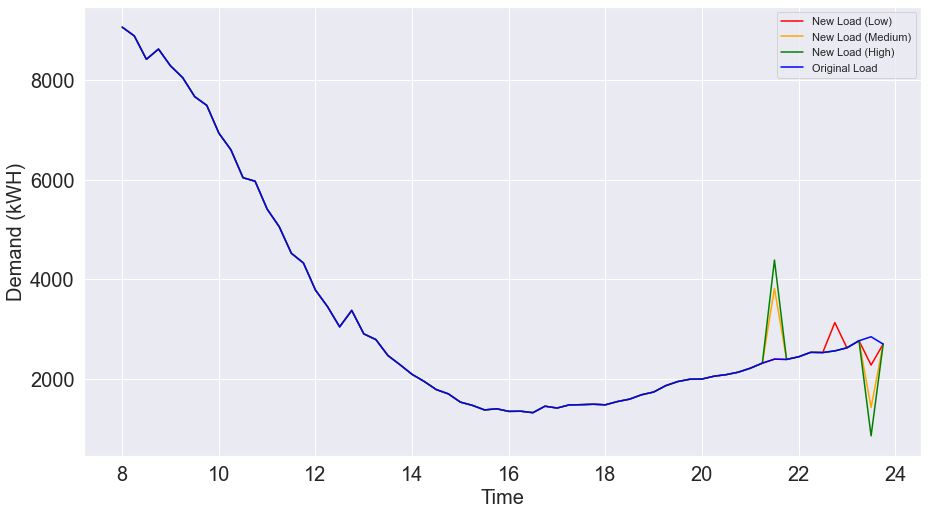

-------------------------
Date: 2018-03-01
Emissions Savings Using Low Estimates: 92.90250804730425 lb. CO2
Emissions Savings Using Med Estimates: 247.17653410081562 lb. CO2
Emissions Savings Using High Estimates: 346.0471490338993 lb. CO2


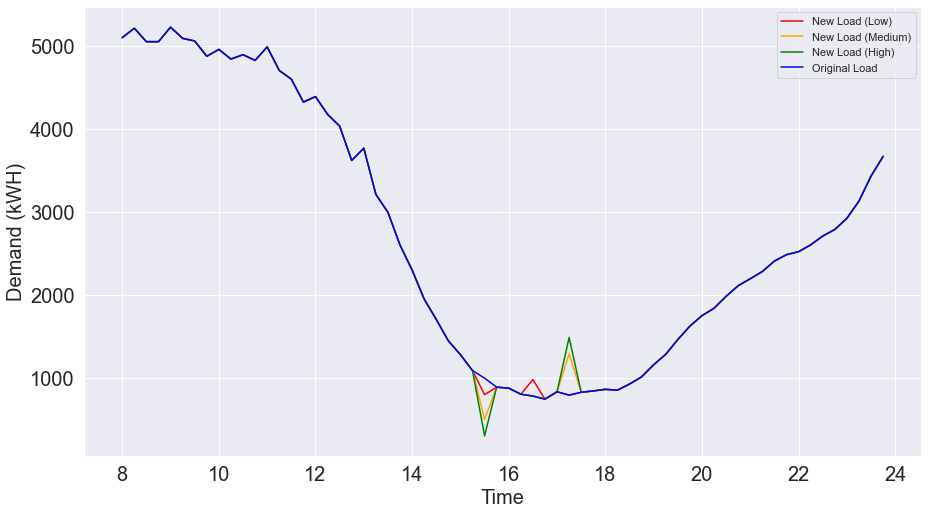

-------------------------
Date: 2018-03-11
Emissions Savings Using Low Estimates: 2.071063960194515 lb. CO2
Emissions Savings Using Med Estimates: 5.744557717446049 lb. CO2
Emissions Savings Using High Estimates: 8.042351029635567 lb. CO2


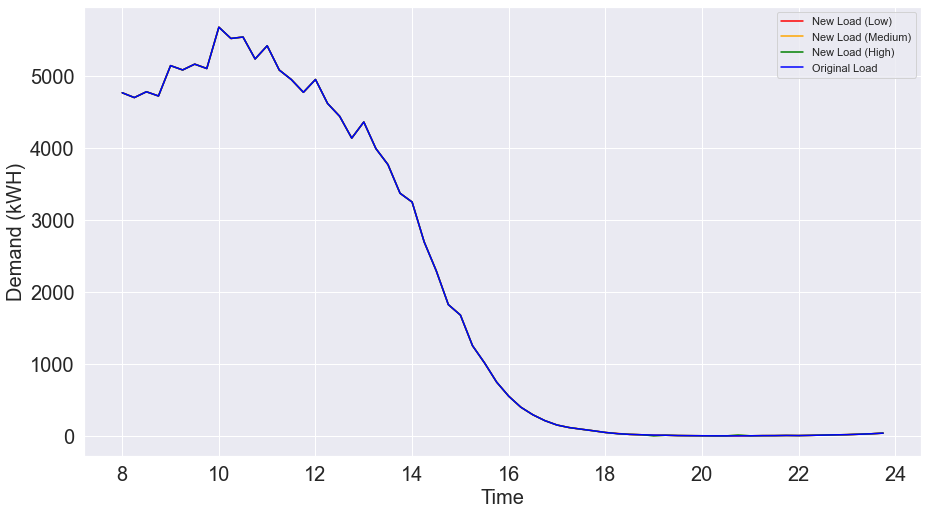

-------------------------
Date: 2018-03-12
Emissions Savings Using Low Estimates: 70.54632106997937 lb. CO2
Emissions Savings Using Med Estimates: 176.36571175420482 lb. CO2
Emissions Savings Using High Estimates: 246.91199522162265 lb. CO2


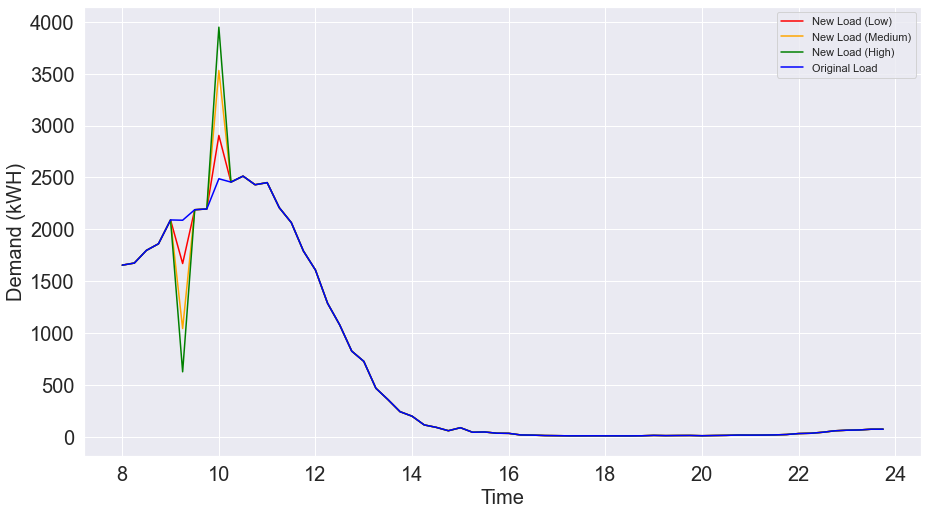

-------------------------
Date: 2018-03-15
Emissions Savings Using Low Estimates: 142.69060750420806 lb. CO2
Emissions Savings Using Med Estimates: 503.89540010310225 lb. CO2
Emissions Savings Using High Estimates: 705.4535566067199 lb. CO2


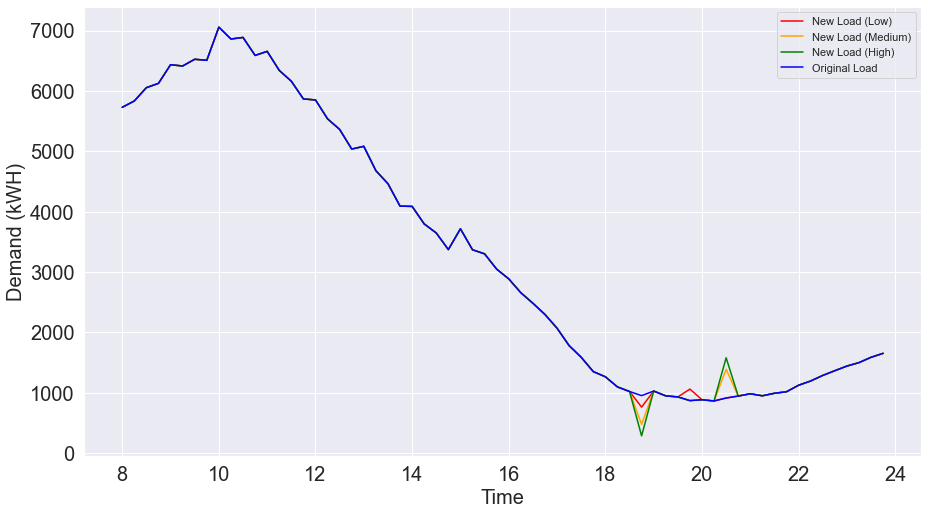

-------------------------
Date: 2018-03-20
Emissions Savings Using Low Estimates: 173.2783030469179 lb. CO2
Emissions Savings Using Med Estimates: 433.19586620129775 lb. CO2
Emissions Savings Using High Estimates: 606.4742105957624 lb. CO2


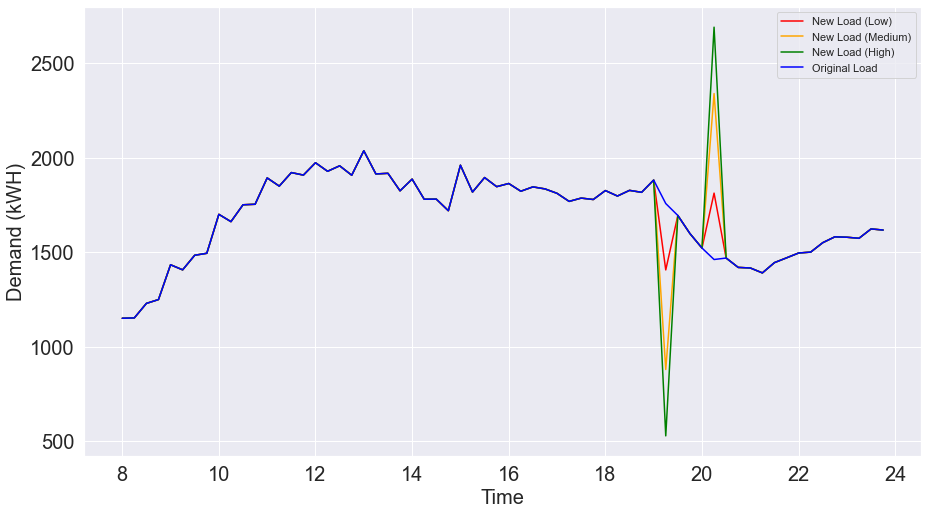

-------------------------
Date: 2018-03-23
Emissions Savings Using Low Estimates: 48.85309733492309 lb. CO2
Emissions Savings Using Med Estimates: 172.959909275294 lb. CO2
Emissions Savings Using High Estimates: 242.1438728420244 lb. CO2


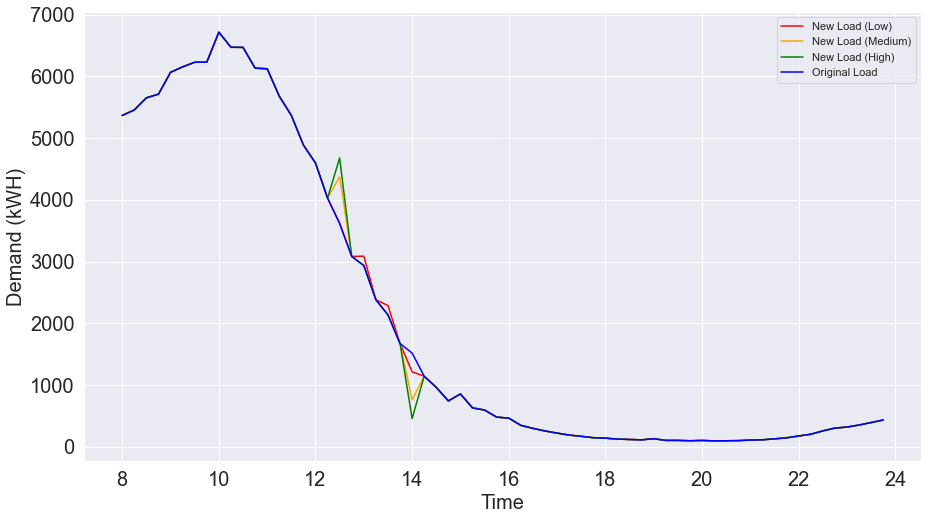

-------------------------
Date: 2018-04-19
Emissions Savings Using Low Estimates: 42.430021038864325 lb. CO2
Emissions Savings Using Med Estimates: 124.17034791082419 lb. CO2
Emissions Savings Using High Estimates: 173.83833494573494 lb. CO2


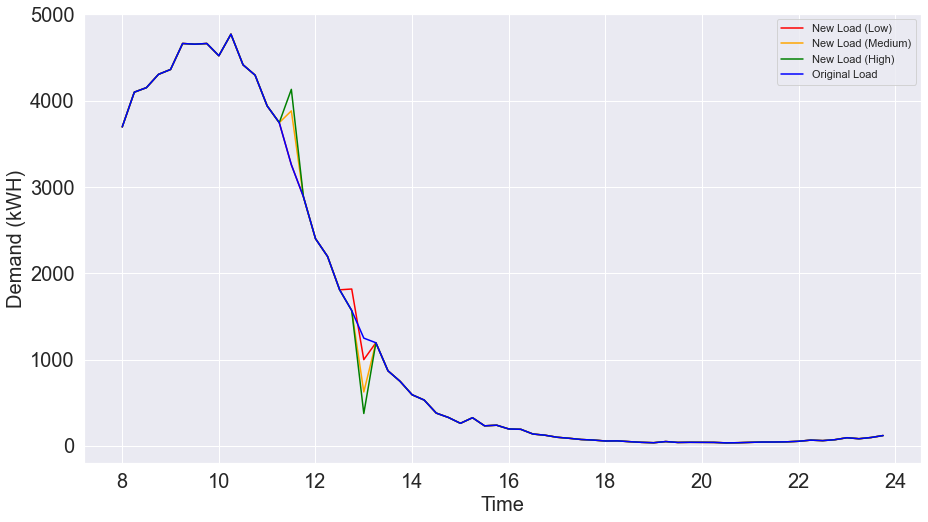

-------------------------
Date: 2018-04-20
Emissions Savings Using Low Estimates: 19.907331936704647 lb. CO2
Emissions Savings Using Med Estimates: 57.721003664232136 lb. CO2
Emissions Savings Using High Estimates: 80.80940458564294 lb. CO2


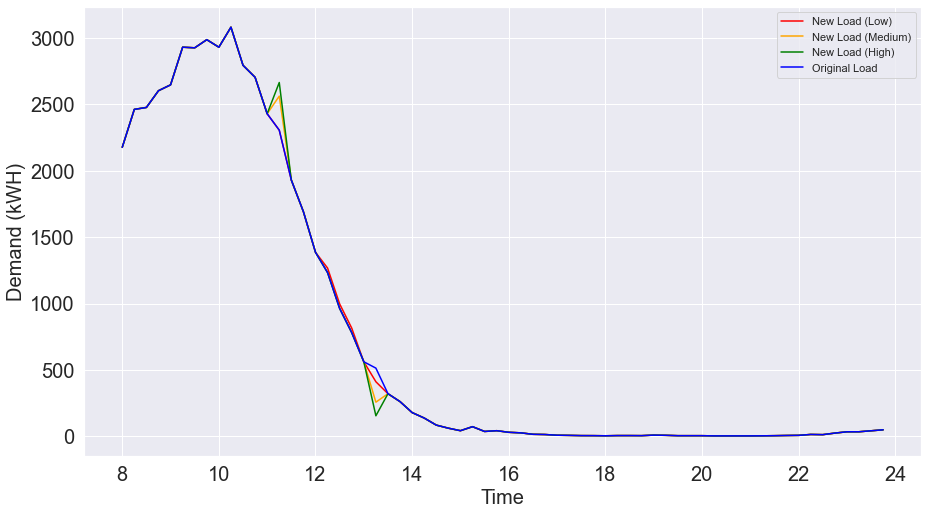

-------------------------
Date: 2018-04-21
Emissions Savings Using Low Estimates: 13.683497126113096 lb. CO2
Emissions Savings Using Med Estimates: 44.450887461838384 lb. CO2
Emissions Savings Using High Estimates: 62.231250648961776 lb. CO2


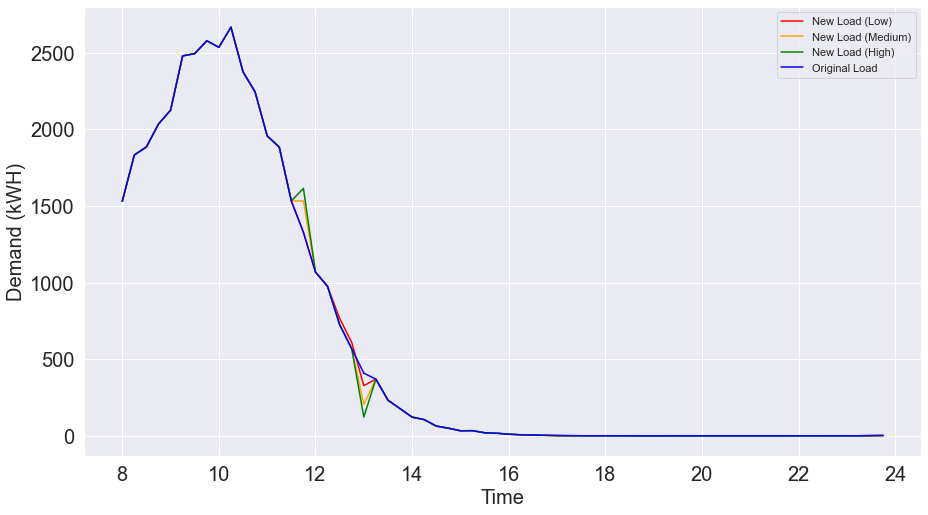

-------------------------
Date: 2018-04-22
Emissions Savings Using Low Estimates: 2.31050991816134 lb. CO2
Emissions Savings Using Med Estimates: 6.3607807793633295 lb. CO2
Emissions Savings Using High Estimates: 8.905092904393218 lb. CO2


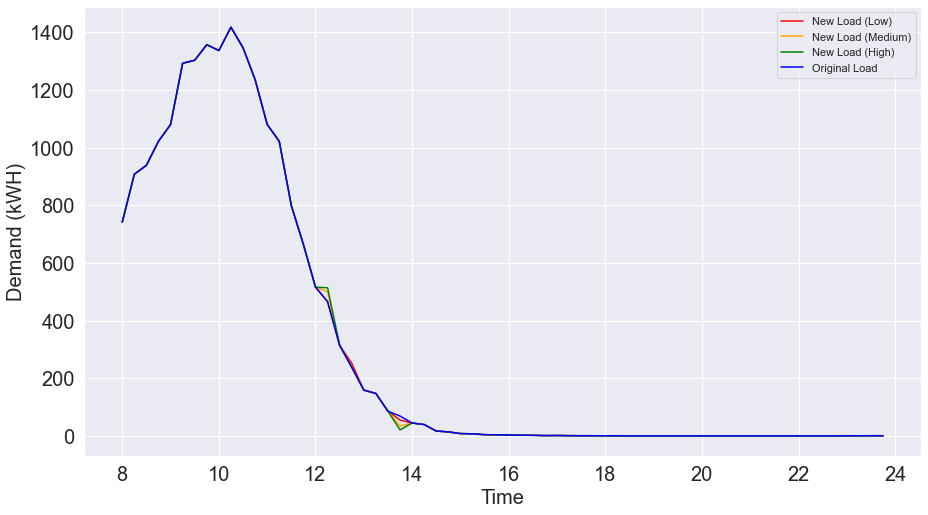

-------------------------
Date: 2018-04-23
Emissions Savings Using Low Estimates: 3.0318665294670235 lb. CO2
Emissions Savings Using Med Estimates: 7.579668322730689 lb. CO2
Emissions Savings Using High Estimates: 10.61153445303949 lb. CO2


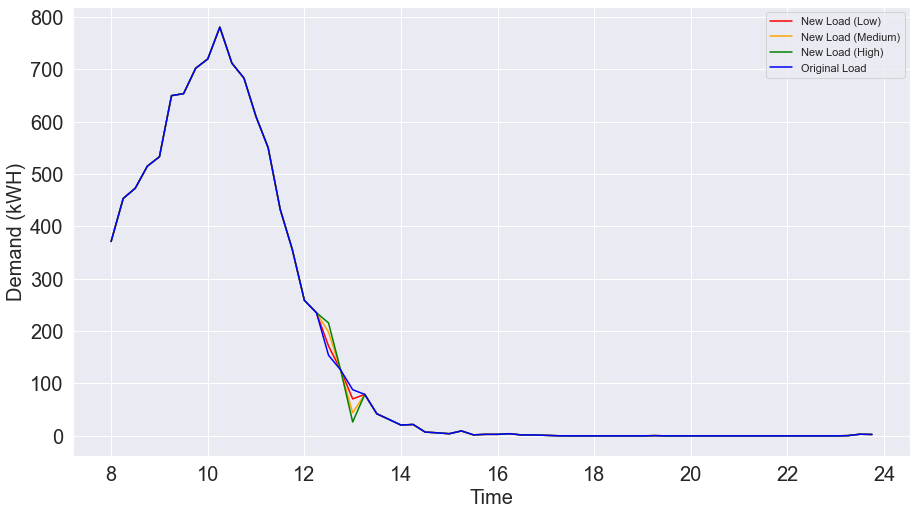

-------------------------
Date: 2018-04-24
Emissions Savings Using Low Estimates: 20.54820569262832 lb. CO2
Emissions Savings Using Med Estimates: 54.795195377652114 lb. CO2
Emissions Savings Using High Estimates: 76.71324606596832 lb. CO2


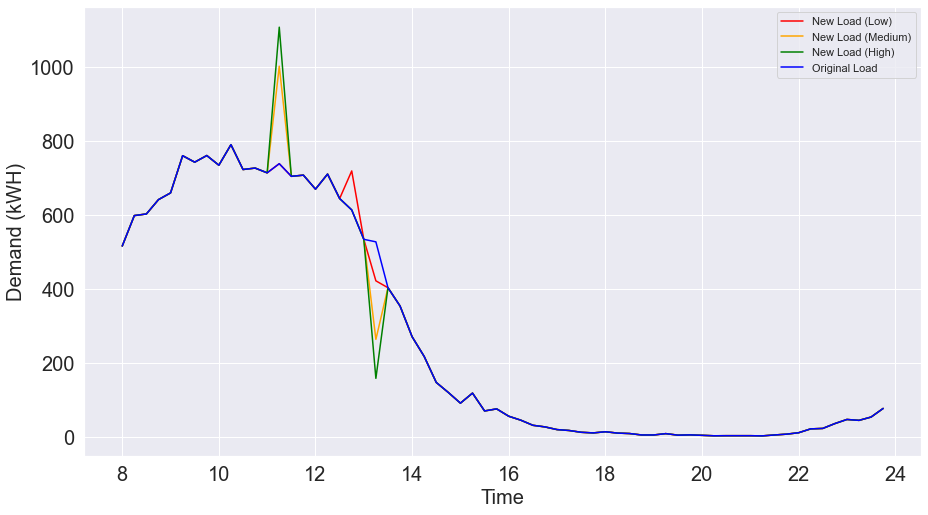

-------------------------
Date: 2018-12-02
Emissions Savings Using Low Estimates: 70.93009790263092 lb. CO2
Emissions Savings Using Med Estimates: 177.32519552766968 lb. CO2
Emissions Savings Using High Estimates: 248.25525241986574 lb. CO2


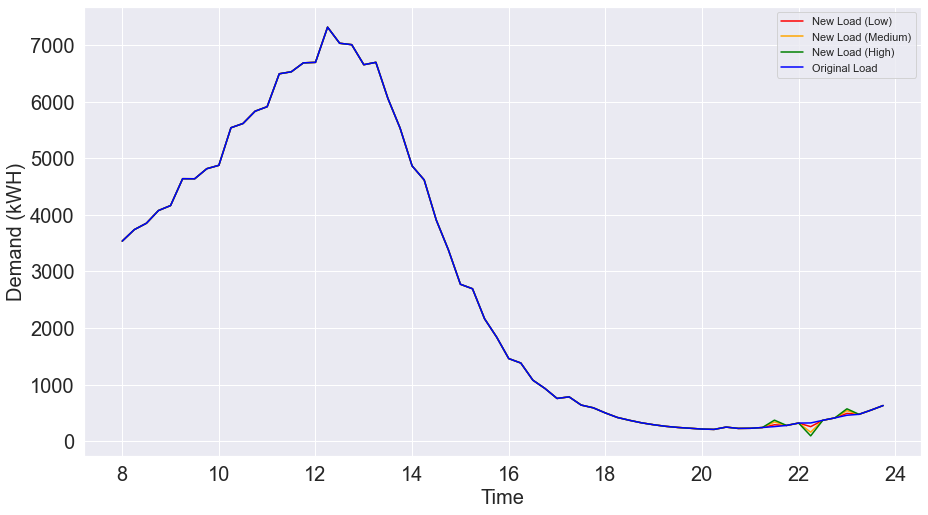

-------------------------
Date: 2018-12-03
Emissions Savings Using Low Estimates: 13.746717900878117 lb. CO2
Emissions Savings Using Med Estimates: 88.96873849354355 lb. CO2
Emissions Savings Using High Estimates: 124.55623358028772 lb. CO2


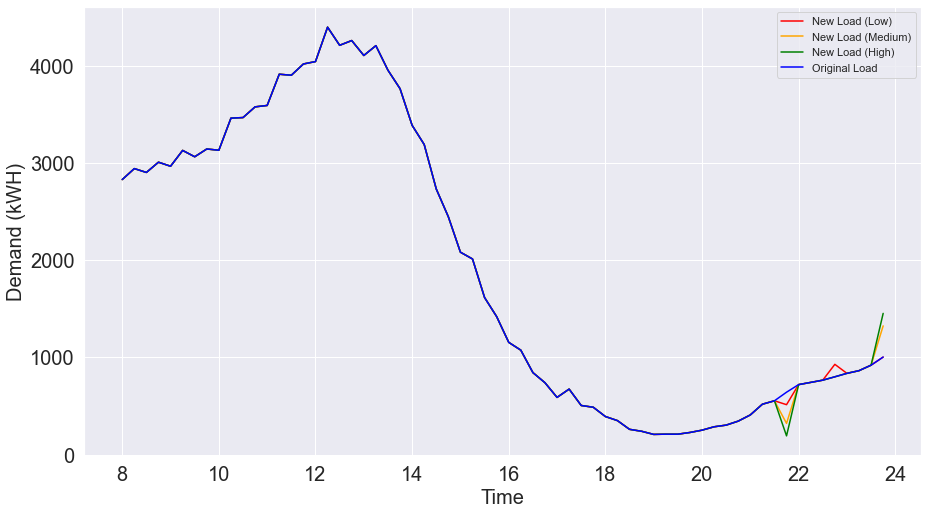

-------------------------
Date: 2018-12-04
Emissions Savings Using Low Estimates: 12.954966726254606 lb. CO2
Emissions Savings Using Med Estimates: 86.02912873911882 lb. CO2
Emissions Savings Using High Estimates: 120.4407780812481 lb. CO2


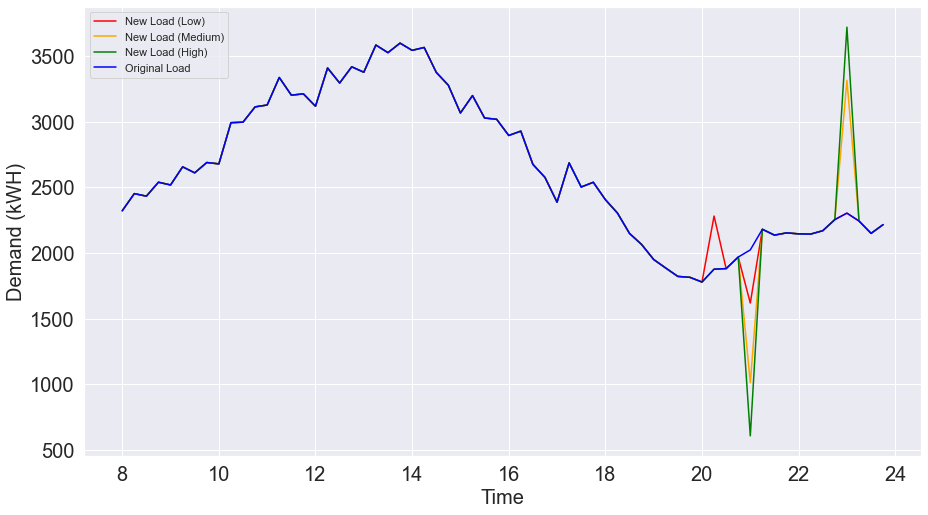

-------------------------
Date: 2018-12-06
Emissions Savings Using Low Estimates: 0.3852746849687859 lb. CO2
Emissions Savings Using Med Estimates: 1.0765121019982495 lb. CO2
Emissions Savings Using High Estimates: 1.5071199385462484 lb. CO2


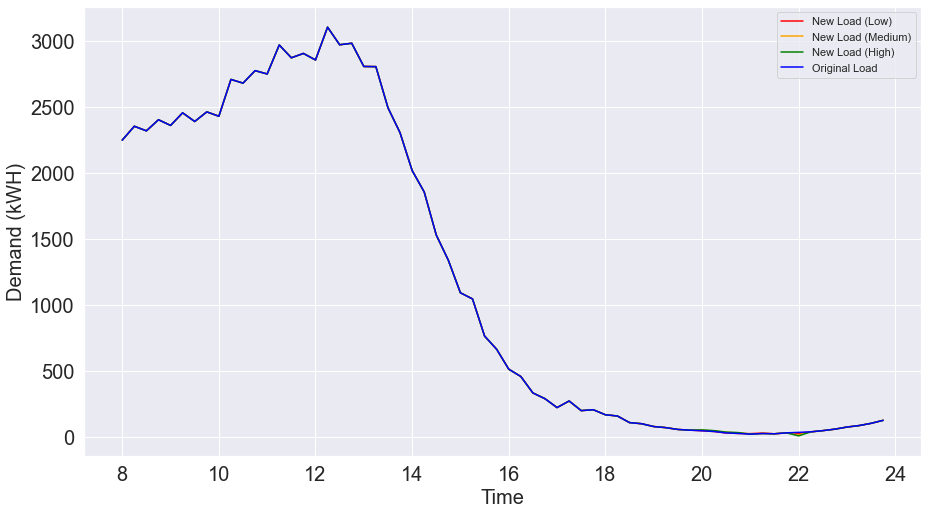

-------------------------
Date: 2018-12-07
Emissions Savings Using Low Estimates: 56.794637407884835 lb. CO2
Emissions Savings Using Med Estimates: 160.01663732114068 lb. CO2
Emissions Savings Using High Estimates: 224.02329225282497 lb. CO2


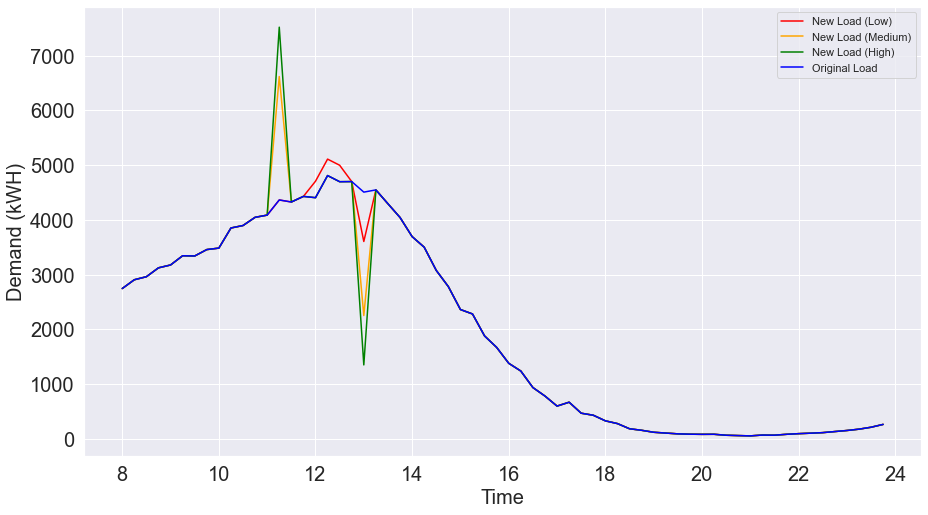

-------------------------
Date: 2018-12-08
Emissions Savings Using Low Estimates: 16.915653932424018 lb. CO2
Emissions Savings Using Med Estimates: 115.9540455120497 lb. CO2
Emissions Savings Using High Estimates: 162.33565586752044 lb. CO2


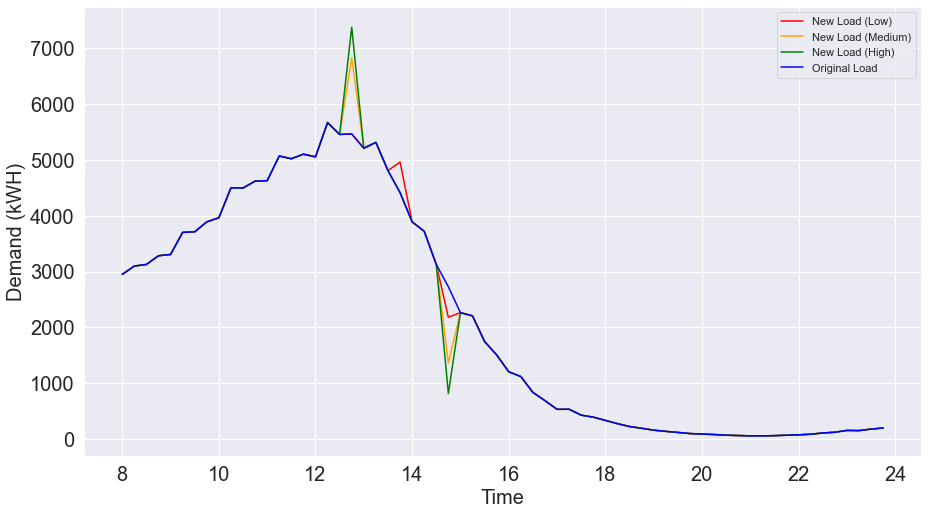

-------------------------
Date: 2018-12-10
Emissions Savings Using Low Estimates: 11.967625731315145 lb. CO2
Emissions Savings Using Med Estimates: 29.919157882856435 lb. CO2
Emissions Savings Using High Estimates: 41.88682086850065 lb. CO2


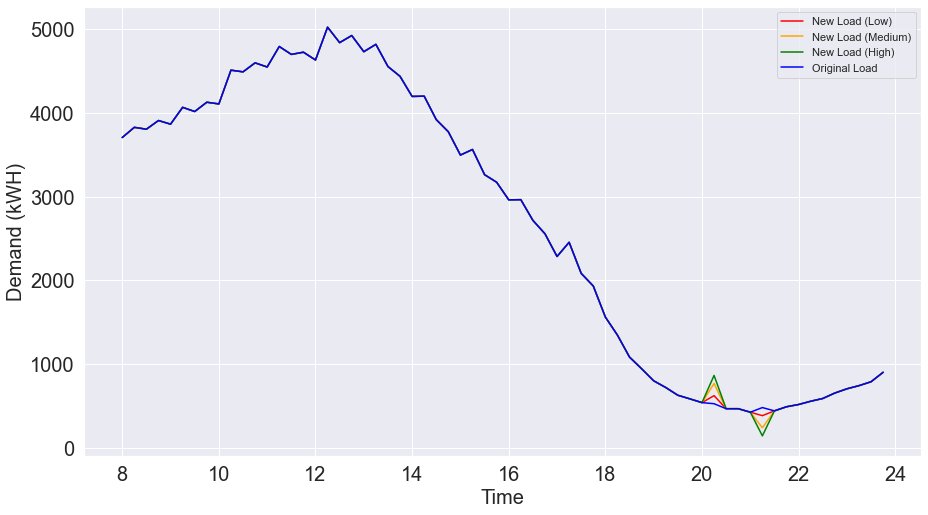

-------------------------
Date: 2018-12-11
Emissions Savings Using Low Estimates: 54.042615404839026 lb. CO2
Emissions Savings Using Med Estimates: 135.1069221641746 lb. CO2
Emissions Savings Using High Estimates: 189.14969141793466 lb. CO2


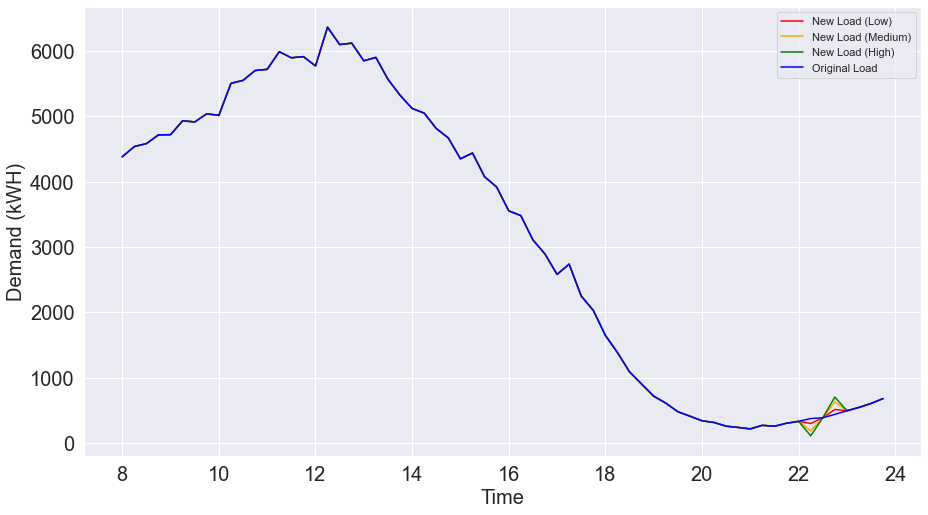

-------------------------
Date: 2018-12-12
Emissions Savings Using Low Estimates: 1.7782076661292596 lb. CO2
Emissions Savings Using Med Estimates: 67.46738328207219 lb. CO2
Emissions Savings Using High Estimates: 94.45433700496238 lb. CO2


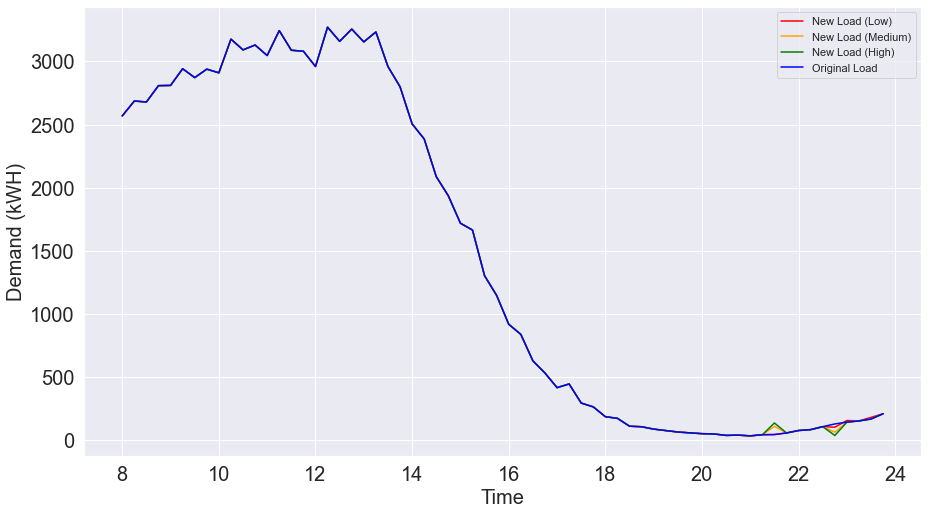

-------------------------
Date: 2018-12-13
Emissions Savings Using Low Estimates: 61.472593949477435 lb. CO2
Emissions Savings Using Med Estimates: 316.9681350575741 lb. CO2
Emissions Savings Using High Estimates: 443.7553875537007 lb. CO2


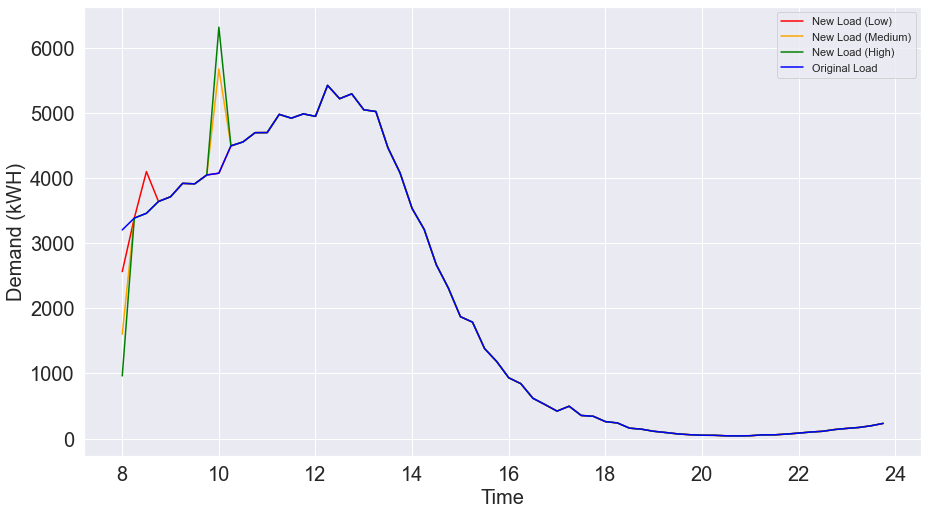

-------------------------
Date: 2018-12-14
Emissions Savings Using Low Estimates: 64.37584776341288 lb. CO2
Emissions Savings Using Med Estimates: 160.93963954397523 lb. CO2
Emissions Savings Using High Estimates: 225.31549532594252 lb. CO2


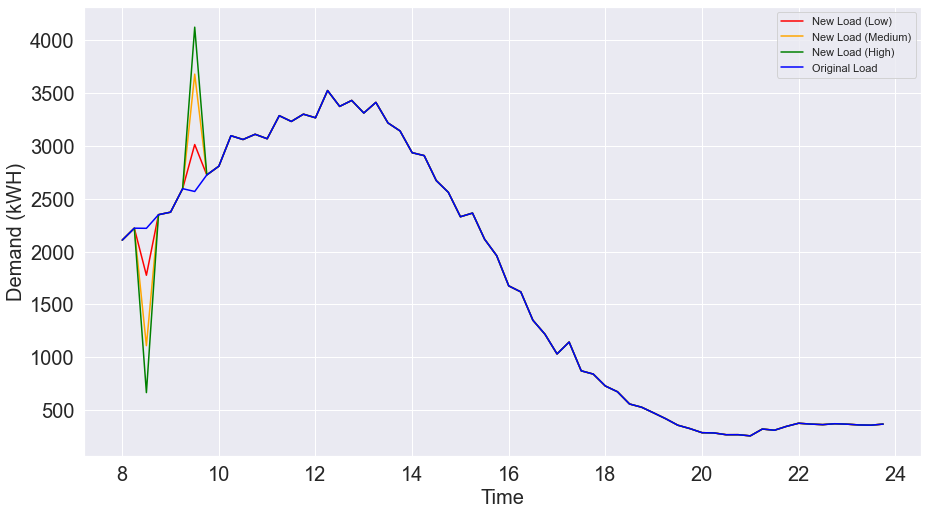

-------------------------
Date: 2018-12-15
Emissions Savings Using Low Estimates: 2.7878832753394427 lb. CO2
Emissions Savings Using Med Estimates: 7.397703720972252 lb. CO2
Emissions Savings Using High Estimates: 10.356784067932372 lb. CO2


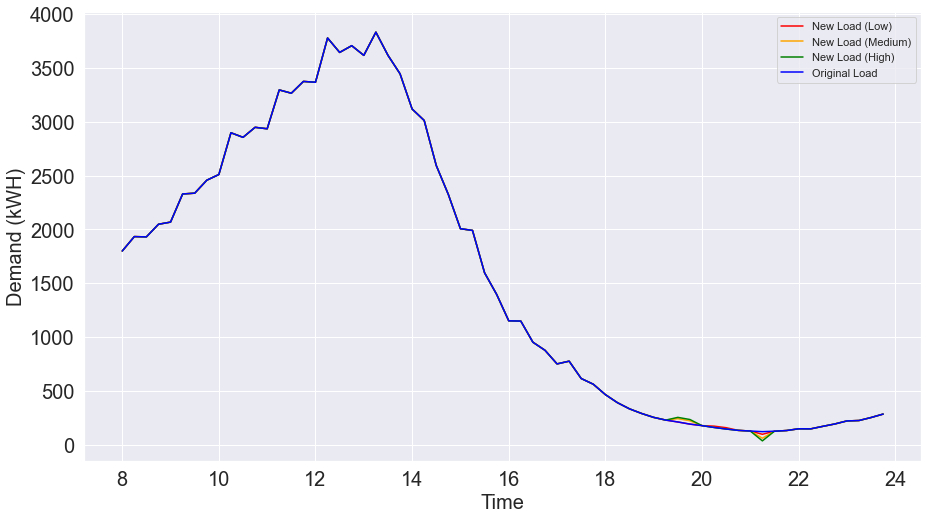

-------------------------
Date: 2018-12-16
Emissions Savings Using Low Estimates: 27.640695865784426 lb. CO2
Emissions Savings Using Med Estimates: 109.41111649314072 lb. CO2
Emissions Savings Using High Estimates: 153.17556455022316 lb. CO2


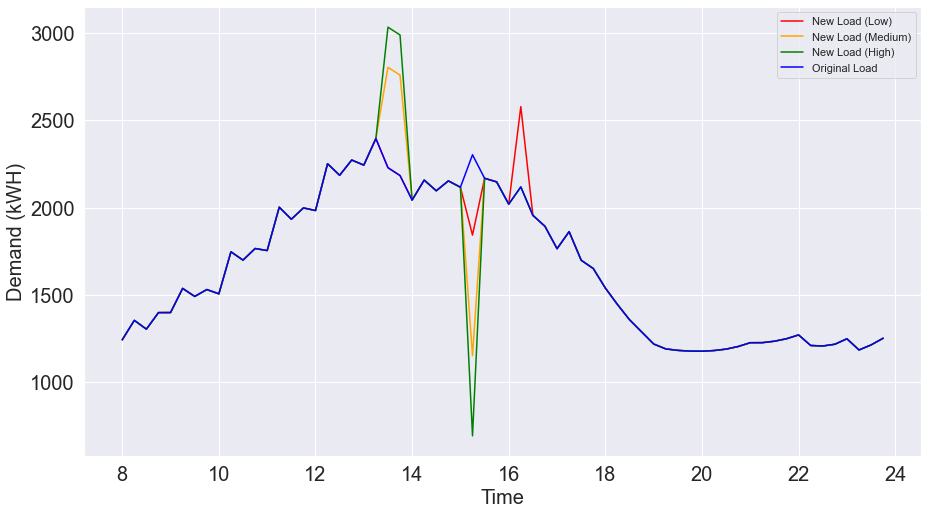

-------------------------
Date: 2018-12-17
Emissions Savings Using Low Estimates: 2.924359231094405 lb. CO2
Emissions Savings Using Med Estimates: 7.3108981931450705 lb. CO2
Emissions Savings Using High Estimates: 10.235244986750033 lb. CO2


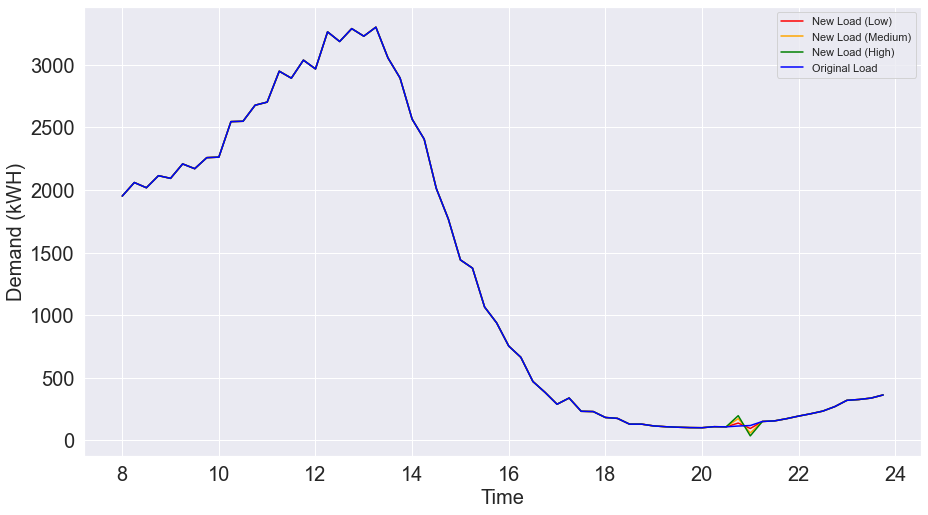

-------------------------
Date: 2018-12-18
Emissions Savings Using Low Estimates: 39.904439592990016 lb. CO2
Emissions Savings Using Med Estimates: 146.12896102913152 lb. CO2
Emissions Savings Using High Estimates: 204.58054455662423 lb. CO2


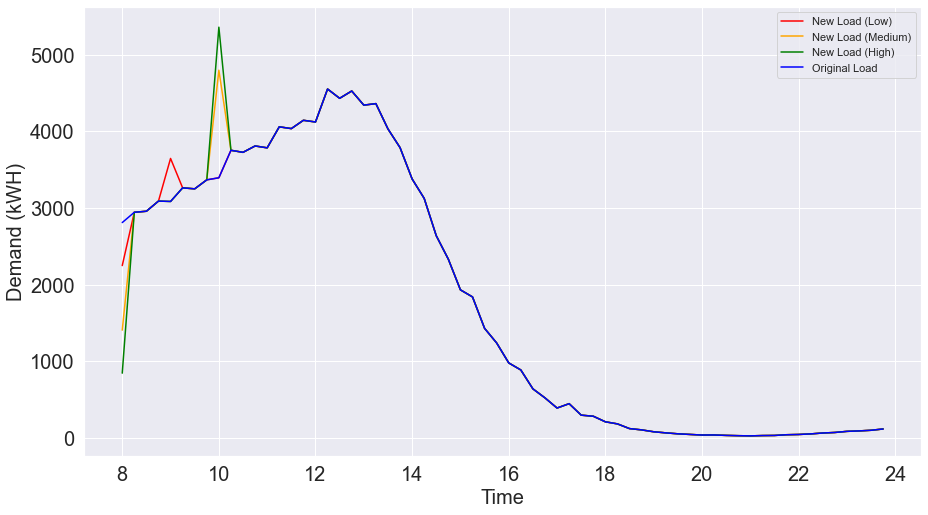

-------------------------
Date: 2018-12-19
Emissions Savings Using Low Estimates: 19.87776057550171 lb. CO2
Emissions Savings Using Med Estimates: 49.69448363152099 lb. CO2
Emissions Savings Using High Estimates: 69.57227707980371 lb. CO2


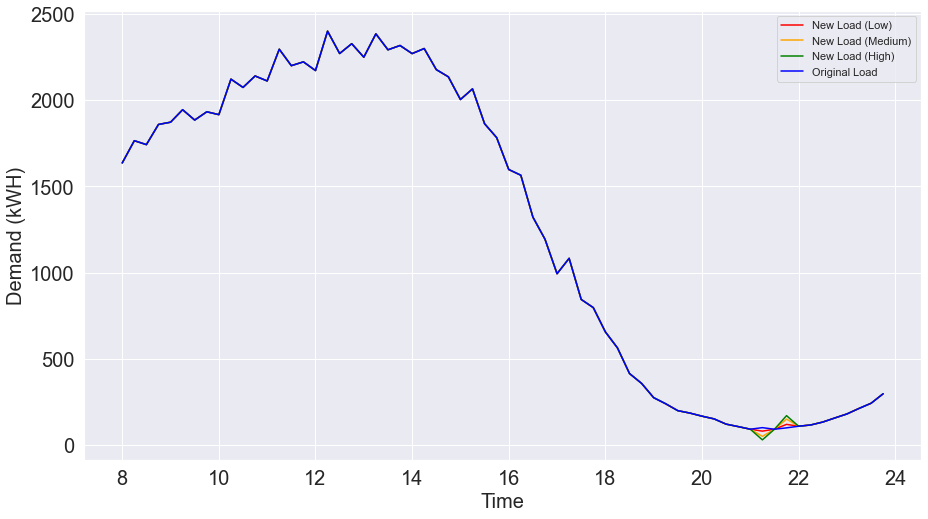

-------------------------
Date: 2018-12-20
Emissions Savings Using Low Estimates: 34.9220702054048 lb. CO2
Emissions Savings Using Med Estimates: 87.30517556702179 lb. CO2
Emissions Savings Using High Estimates: 122.22724580251408 lb. CO2


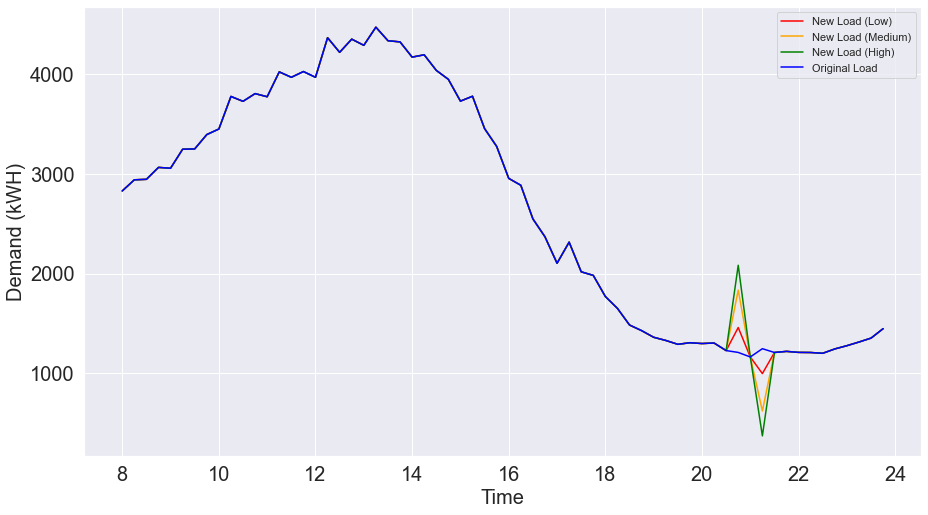

-------------------------
Date: 2018-12-21
Emissions Savings Using Low Estimates: 10.353084677503961 lb. CO2
Emissions Savings Using Med Estimates: 26.073132293669268 lb. CO2
Emissions Savings Using High Estimates: 36.502385501503085 lb. CO2


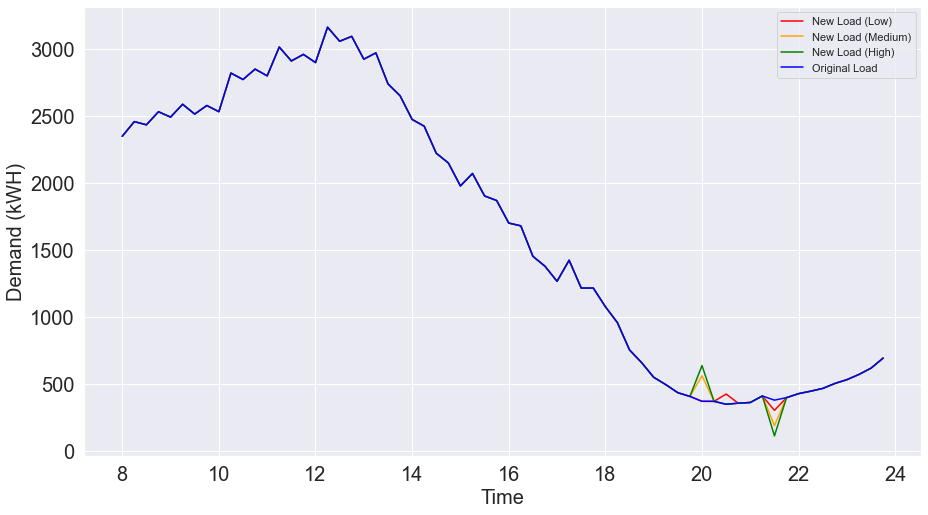

-------------------------
Date: 2018-12-23
Emissions Savings Using Low Estimates: 8.714391376313397 lb. CO2
Emissions Savings Using Med Estimates: 21.785982609069066 lb. CO2
Emissions Savings Using High Estimates: 30.50037195125339 lb. CO2


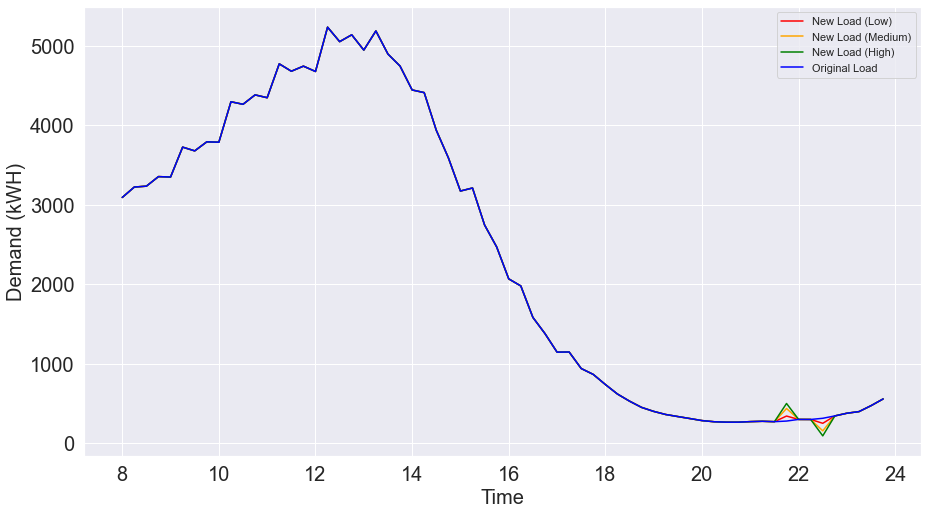

-------------------------
Date: 2018-12-24
Emissions Savings Using Low Estimates: 40.19800558471246 lb. CO2
Emissions Savings Using Med Estimates: 135.23402022593464 lb. CO2
Emissions Savings Using High Estimates: 189.32763211964917 lb. CO2


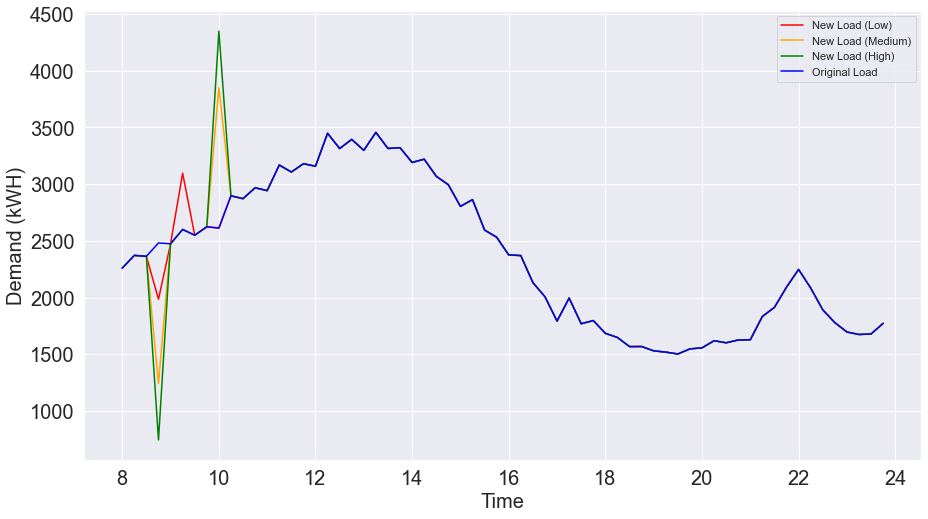

-------------------------
Date: 2018-12-25
Emissions Savings Using Low Estimates: 44.13327594067326 lb. CO2
Emissions Savings Using Med Estimates: 114.57674573168897 lb. CO2
Emissions Savings Using High Estimates: 160.40743977287636 lb. CO2


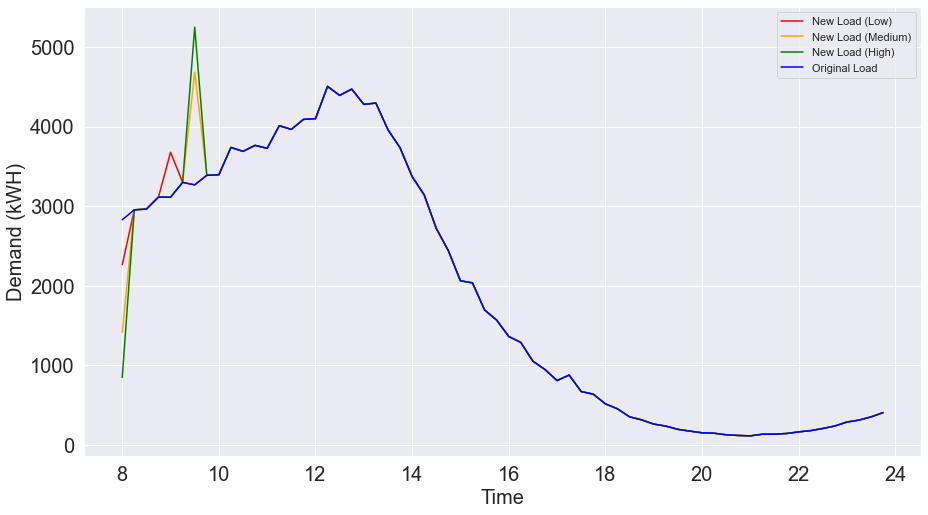

-------------------------
Date: 2018-12-26
Emissions Savings Using Low Estimates: 42.58851830675011 lb. CO2
Emissions Savings Using Med Estimates: 212.9426019056572 lb. CO2
Emissions Savings Using High Estimates: 298.11964239549053 lb. CO2


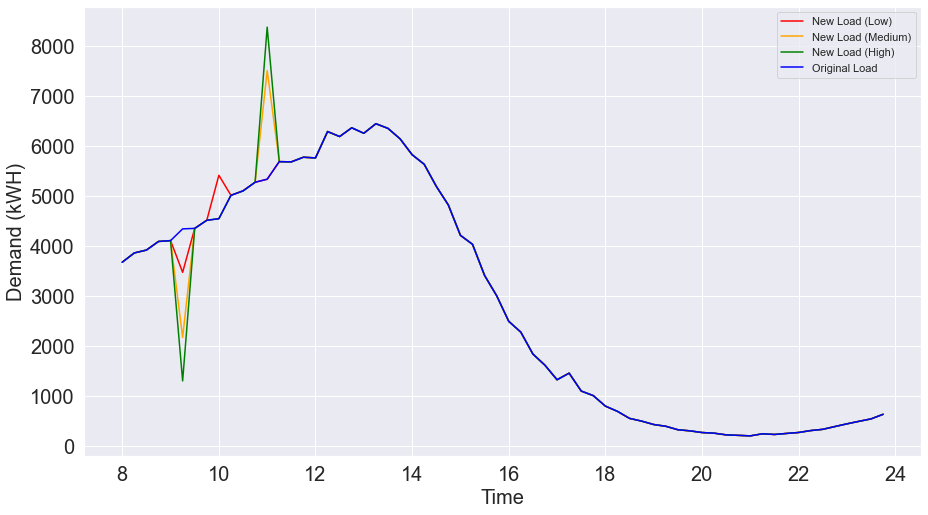

-------------------------
Total Emissions Savings Using Low Estimates: 6463.698701418799 lb. CO2
Total Emissions Savings Using Med Estimates: 18718.69993308133 lb. CO2
Total Emissions Savings Using High Estimates: 26206.179836276704 lb. CO2


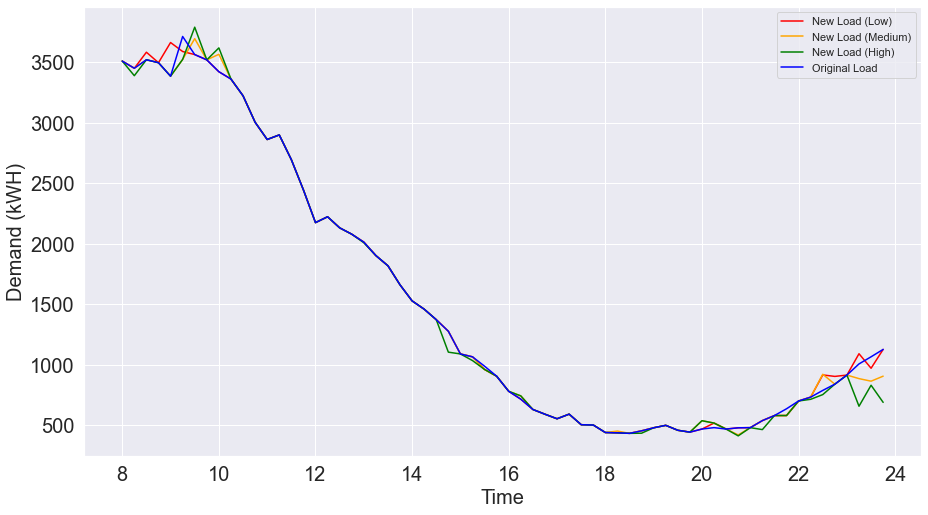

In [107]:
proportion_shiftable_low = 0.2
proportion_shiftable_med = 0.5
proportion_shiftable_high = 0.7

window_length_low = 4
window_length_med = 8
window_length_high = 8

load_savings_low_total = 0
load_savings_med_total = 0
load_savings_high_total = 0

df_original_loads = pd.DataFrame(columns = range(64))
df_loads_low = pd.DataFrame(columns = range(64))
df_loads_med = pd.DataFrame(columns = range(64))
df_loads_high = pd.DataFrame(columns = range(64))

for i in range(32, 35049, 96):
    
    if all18["Load Shift"][i]:
        emissions_time_series = list(all18["MOER"][i:i + 64]) # 64 since we are working with waking hours. 4 readings per hour * 16 waking hours = 64
        load_time_series = list(all18["heating_fans_pumps"][i:i+ 64])
        
        new_load_low = load_shift(emissions_time_series, load_time_series, proportion_shiftable_low, window_length_low)
        new_load_med = load_shift(emissions_time_series, load_time_series, proportion_shiftable_med, window_length_med)
        new_load_high = load_shift(emissions_time_series, load_time_series, proportion_shiftable_high, window_length_high)
        
        load_savings_low = sum(emissions_time_series * (load_time_series - new_load_low)) / 1000  # Division by 1000 to cancel units. MOER is in (lb. CO2 / MWh) and load is in kwH
        load_savings_med = sum(emissions_time_series * (load_time_series - new_load_med)) / 1000
        load_savings_high = sum(emissions_time_series * (load_time_series - new_load_high)) / 1000
        
        load_savings_low_total += load_savings_low
        load_savings_med_total += load_savings_med
        load_savings_high_total += load_savings_high
        
        df_original_loads.loc[len(df_original_loads)] = load_time_series
        df_loads_low.loc[len(df_loads_low)] = new_load_low
        df_loads_med.loc[len(df_loads_med)] = new_load_med
        df_loads_high.loc[len(df_loads_high)] = new_load_high


        print("-------------------------")
        print(f"Date: {all18['date'][i].date()}")
        print(f"Emissions Savings Using Low Estimates: {load_savings_low} lb. CO2") 
        print(f"Emissions Savings Using Med Estimates: {load_savings_med} lb. CO2") 
        print(f"Emissions Savings Using High Estimates: {load_savings_high} lb. CO2") 
        
        sns.lineplot(x=np.arange(8, 24, 0.25), y=new_load_low, color='red', label = 'New Load (Low)')
        sns.lineplot(x=np.arange(8, 24, 0.25), y=new_load_med, color='orange', label = 'New Load (Medium)')
        sns.lineplot(x=np.arange(8, 24, 0.25), y=new_load_high, color='green', label = 'New Load (High)')
        sns.lineplot(x=np.arange(8, 24, 0.25), y=load_time_series, color='blue', label='Original Load')

        
        sns.set(rc={'figure.figsize':(15,8.27)})
        plt.xlabel("Time", fontsize=20)
        plt.ylabel("Demand (kWH)", fontsize=20)
        plt.xticks(fontsize=20)
        plt.yticks(fontsize=20)
        plt.legend()
        plt.show()
        plt.close()
 

print("-------------------------")
print(f"Total Emissions Savings Using Low Estimates: {load_savings_low_total} lb. CO2") 
print(f"Total Emissions Savings Using Med Estimates: {load_savings_med_total} lb. CO2") 
print(f"Total Emissions Savings Using High Estimates: {load_savings_high_total} lb. CO2")


sns.lineplot(x=np.arange(8, 24, 0.25), y=df_loads_low.median(), color='red', label='New Load (Low)')
sns.lineplot(x=np.arange(8, 24, 0.25), y=df_loads_med.median(), color='orange', label='New Load (Medium)')
sns.lineplot(x=np.arange(8, 24, 0.25), y=df_loads_high.median(), color='green', label='New Load (High)')
sns.lineplot(x=np.arange(8, 24, 0.25), y=df_original_loads.median(), color='blue', label='Original Load')
plt.xlabel("Time", fontsize=20)
plt.ylabel("Demand (kWH)", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend()
plt.show()

# Cooling

-------------------------
Date: 2018-01-01
Emissions Savings Using Low Estimates: 43.12682374710137 lb. CO2
Emissions Savings Using Med Estimates: 131.77639933746482 lb. CO2
Emissions Savings Using High Estimates: 184.48695819693575 lb. CO2


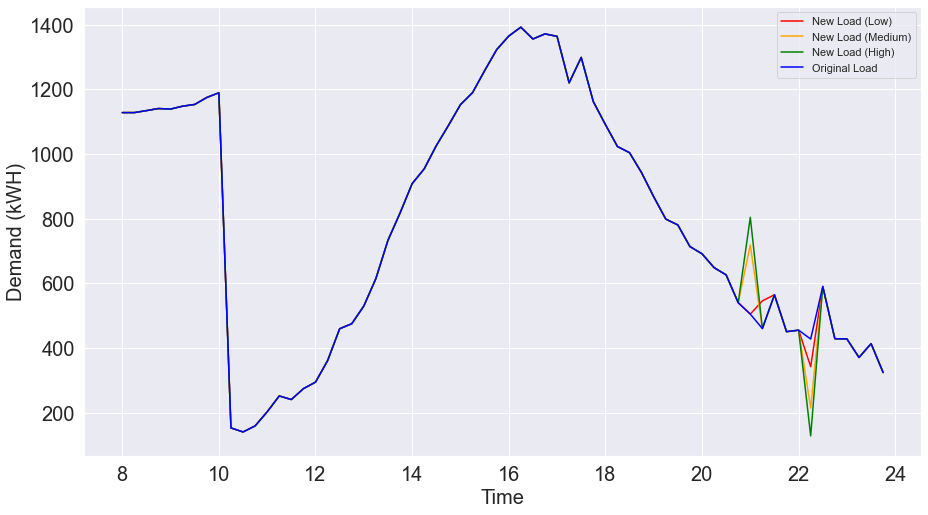

-------------------------
Date: 2018-01-02
Emissions Savings Using Low Estimates: 3.269624400128506 lb. CO2
Emissions Savings Using Med Estimates: 18.19396461502117 lb. CO2
Emissions Savings Using High Estimates: 25.471552518323193 lb. CO2


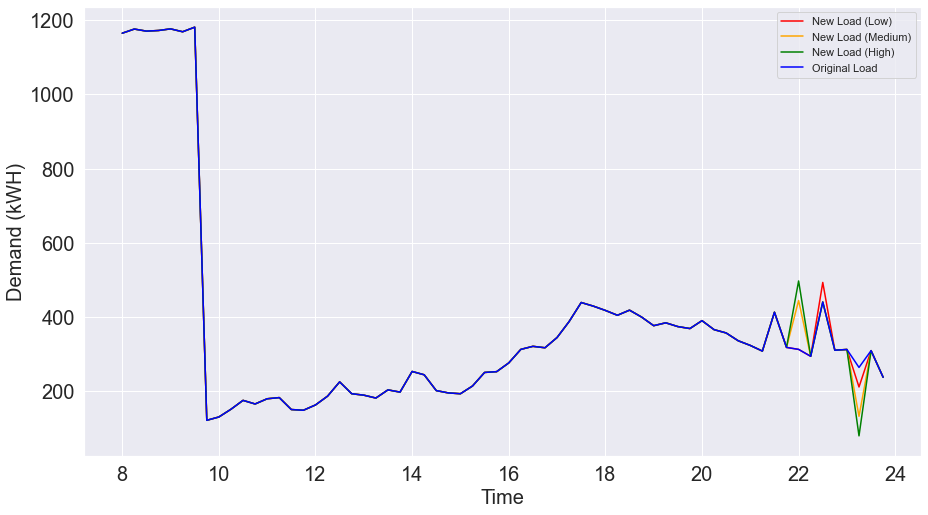

-------------------------
Date: 2018-01-04
Emissions Savings Using Low Estimates: 51.17216011359559 lb. CO2
Emissions Savings Using Med Estimates: 127.9303908007221 lb. CO2
Emissions Savings Using High Estimates: 179.1025459854823 lb. CO2


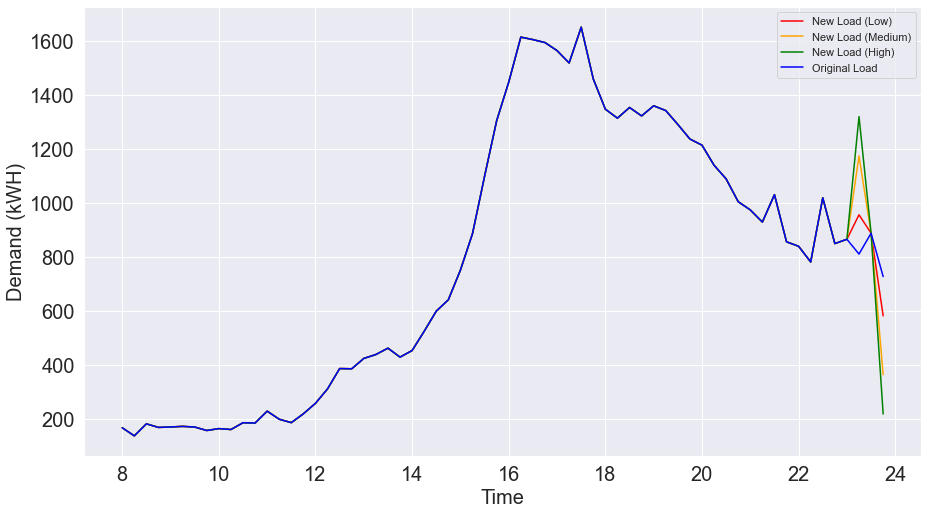

-------------------------
Date: 2018-01-05
Emissions Savings Using Low Estimates: 76.67827872802272 lb. CO2
Emissions Savings Using Med Estimates: 191.69584821654985 lb. CO2
Emissions Savings Using High Estimates: 268.3741874467131 lb. CO2


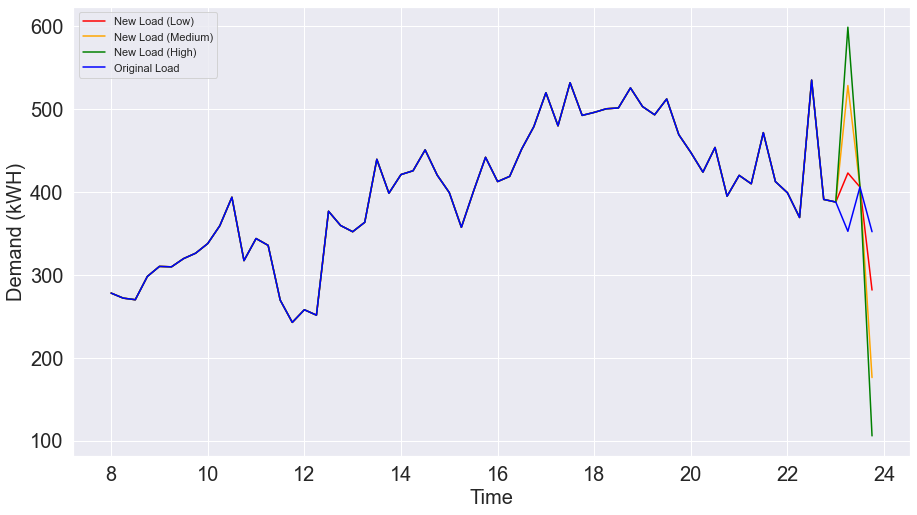

-------------------------
Date: 2018-01-08
Emissions Savings Using Low Estimates: 4.207942418247956 lb. CO2
Emissions Savings Using Med Estimates: 31.102212599191873 lb. CO2
Emissions Savings Using High Estimates: 43.54309765470354 lb. CO2


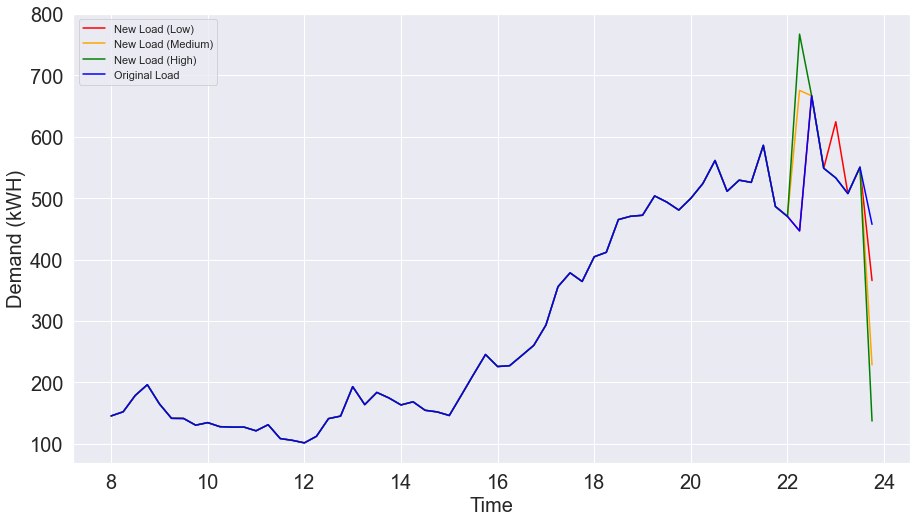

-------------------------
Date: 2018-01-09
Emissions Savings Using Low Estimates: 3.087453060844382 lb. CO2
Emissions Savings Using Med Estimates: 15.559813598448018 lb. CO2
Emissions Savings Using High Estimates: 21.783739411021728 lb. CO2


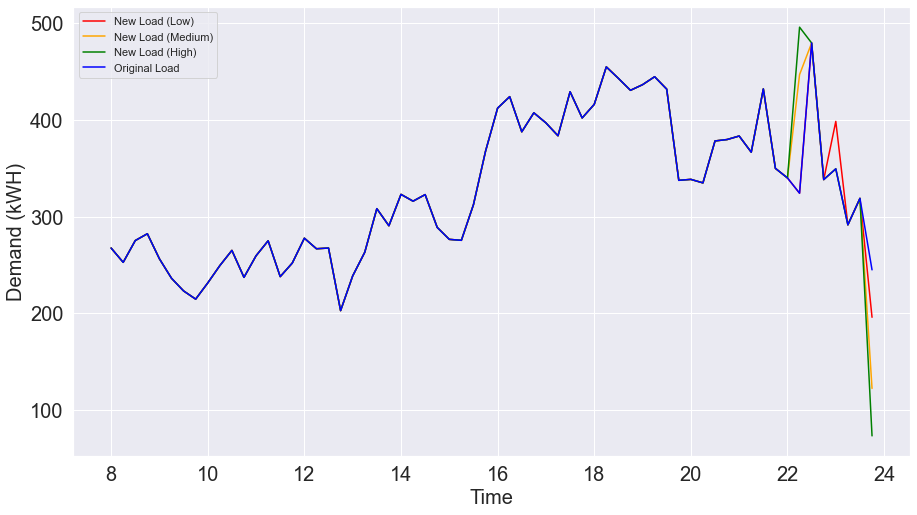

-------------------------
Date: 2018-01-14
Emissions Savings Using Low Estimates: 104.12348683963009 lb. CO2
Emissions Savings Using Med Estimates: 260.30873402250137 lb. CO2
Emissions Savings Using High Estimates: 364.4322571552723 lb. CO2


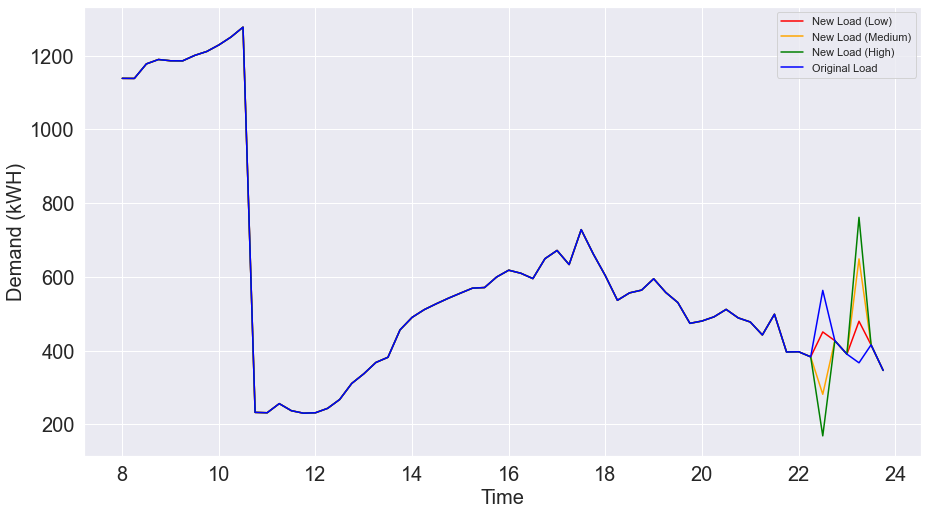

-------------------------
Date: 2018-01-15
Emissions Savings Using Low Estimates: 17.573430956076983 lb. CO2
Emissions Savings Using Med Estimates: 48.93196873997451 lb. CO2
Emissions Savings Using High Estimates: 68.50473945283913 lb. CO2


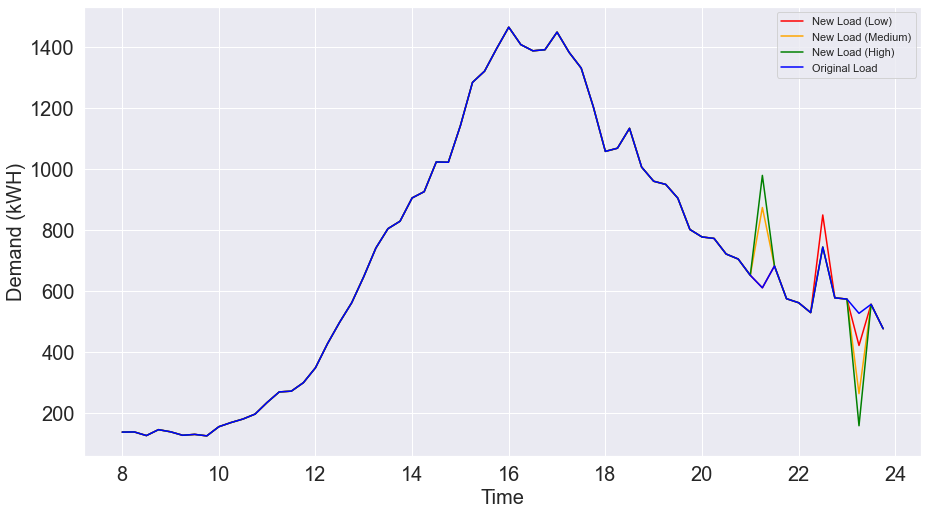

-------------------------
Date: 2018-01-16
Emissions Savings Using Low Estimates: 3.7770259214265387 lb. CO2
Emissions Savings Using Med Estimates: 15.312320628844493 lb. CO2
Emissions Savings Using High Estimates: 21.43724967888108 lb. CO2


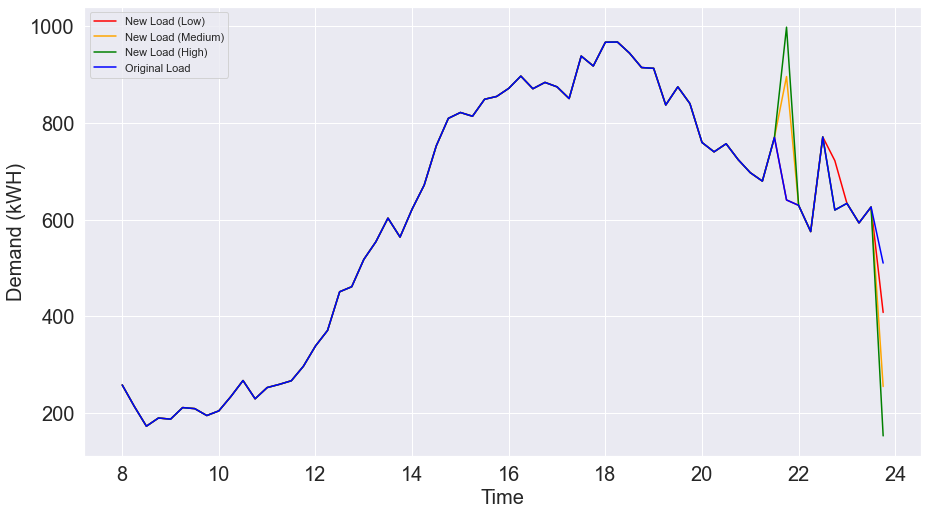

-------------------------
Date: 2018-01-17
Emissions Savings Using Low Estimates: 34.53097433403368 lb. CO2
Emissions Savings Using Med Estimates: 101.20143738226679 lb. CO2
Emissions Savings Using High Estimates: 141.68200312754473 lb. CO2


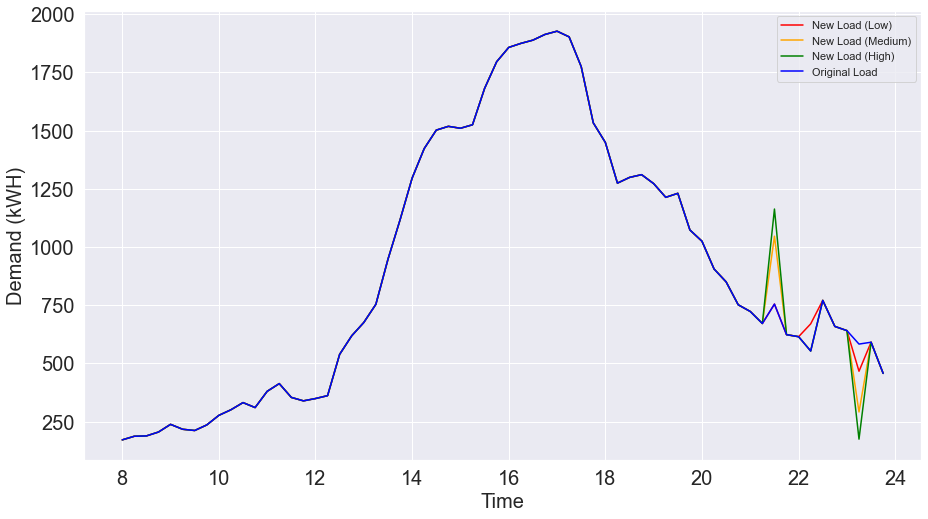

-------------------------
Date: 2018-01-18
Emissions Savings Using Low Estimates: 70.90525792321017 lb. CO2
Emissions Savings Using Med Estimates: 177.26313245809106 lb. CO2
Emissions Savings Using High Estimates: 248.16840392375786 lb. CO2


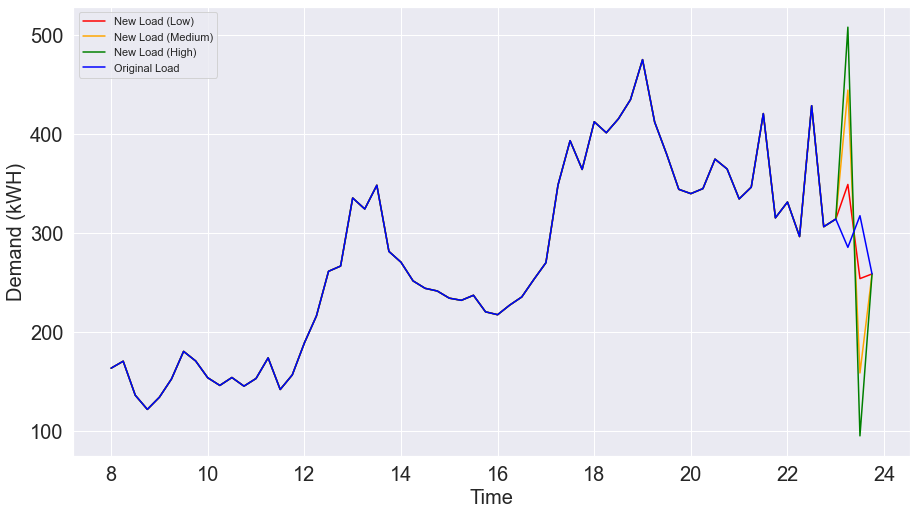

-------------------------
Date: 2018-01-19
Emissions Savings Using Low Estimates: 29.409912996699767 lb. CO2
Emissions Savings Using Med Estimates: 85.67247214545185 lb. CO2
Emissions Savings Using High Estimates: 119.9413790219943 lb. CO2


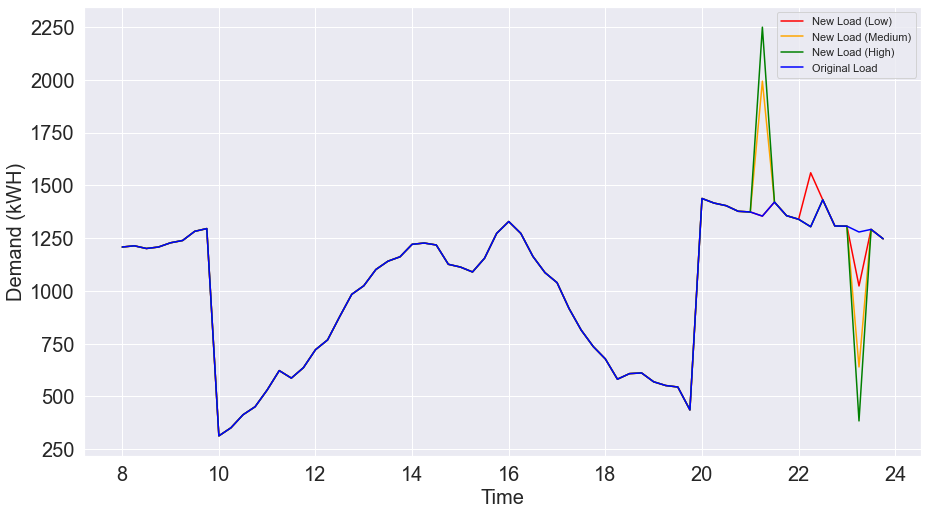

-------------------------
Date: 2018-01-21
Emissions Savings Using Low Estimates: 62.621809717668874 lb. CO2
Emissions Savings Using Med Estimates: 156.5545248755477 lb. CO2
Emissions Savings Using High Estimates: 219.17633542277585 lb. CO2


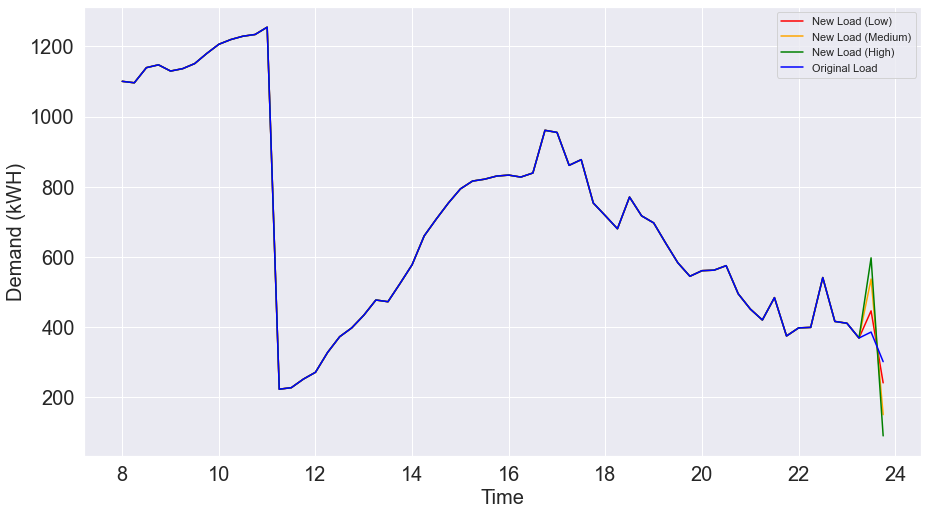

-------------------------
Date: 2018-01-23
Emissions Savings Using Low Estimates: 31.795116842744168 lb. CO2
Emissions Savings Using Med Estimates: 86.53108333391873 lb. CO2
Emissions Savings Using High Estimates: 121.14351694062724 lb. CO2


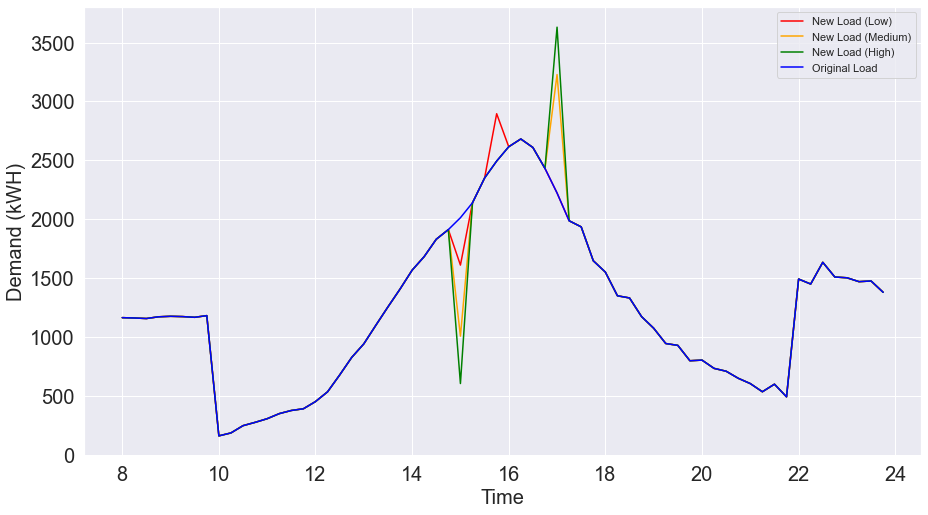

-------------------------
Date: 2018-01-25
Emissions Savings Using Low Estimates: 276.74334050699673 lb. CO2
Emissions Savings Using Med Estimates: 692.5085968622996 lb. CO2
Emissions Savings Using High Estimates: 969.512040563966 lb. CO2


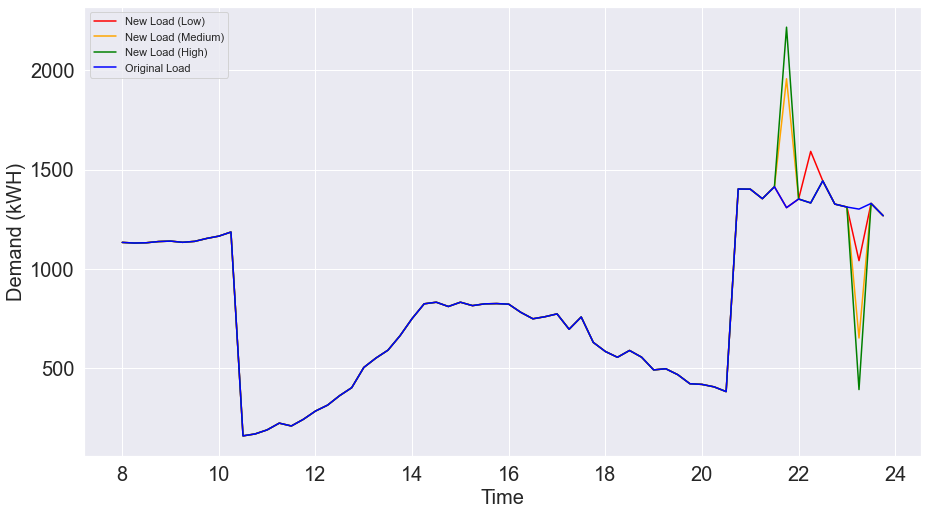

-------------------------
Date: 2018-01-26
Emissions Savings Using Low Estimates: 15.547530101351946 lb. CO2
Emissions Savings Using Med Estimates: 46.192033115583165 lb. CO2
Emissions Savings Using High Estimates: 64.66884943198647 lb. CO2


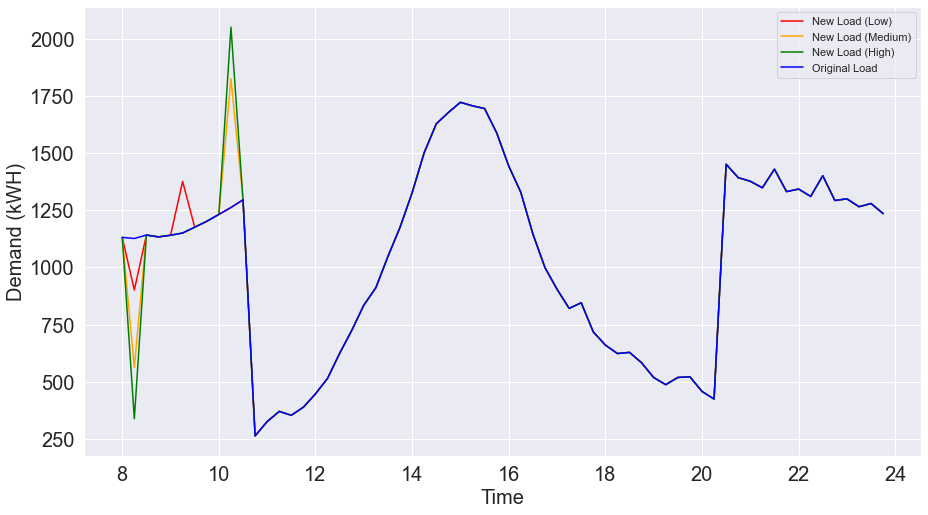

-------------------------
Date: 2018-01-29
Emissions Savings Using Low Estimates: 41.93088662931951 lb. CO2
Emissions Savings Using Med Estimates: 104.82721086624956 lb. CO2
Emissions Savings Using High Estimates: 146.7580926753128 lb. CO2


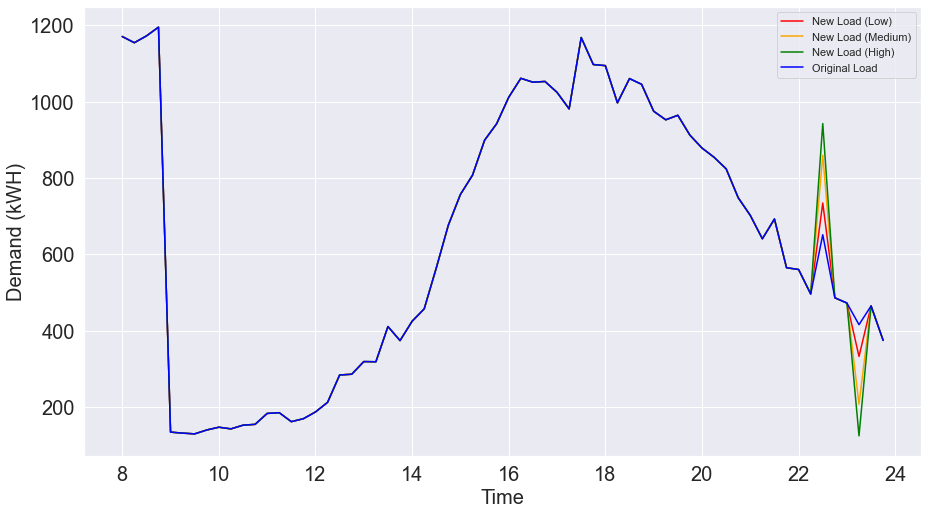

-------------------------
Date: 2018-02-01
Emissions Savings Using Low Estimates: 1459.1155593098863 lb. CO2
Emissions Savings Using Med Estimates: 3647.788925322989 lb. CO2
Emissions Savings Using High Estimates: 5106.904495331224 lb. CO2


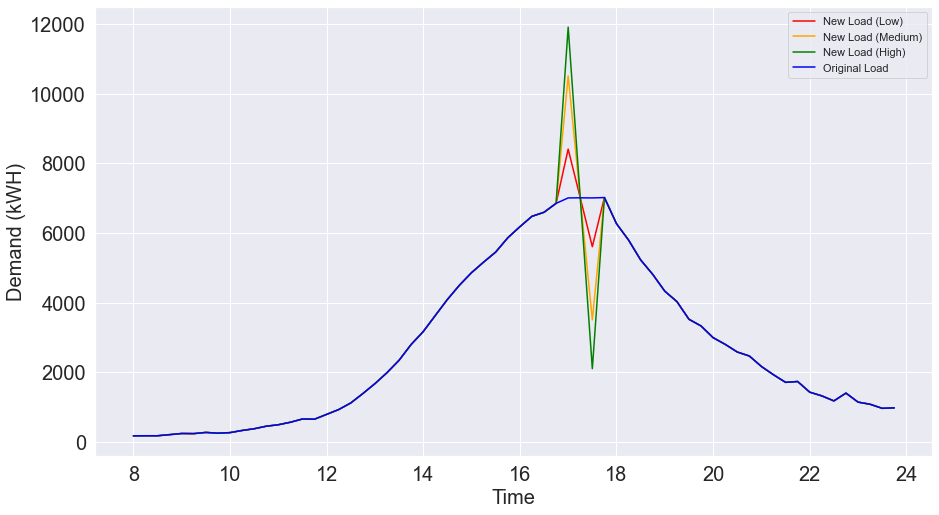

-------------------------
Date: 2018-02-05
Emissions Savings Using Low Estimates: 97.0737473663796 lb. CO2
Emissions Savings Using Med Estimates: 356.88899271881166 lb. CO2
Emissions Savings Using High Estimates: 499.644589058898 lb. CO2


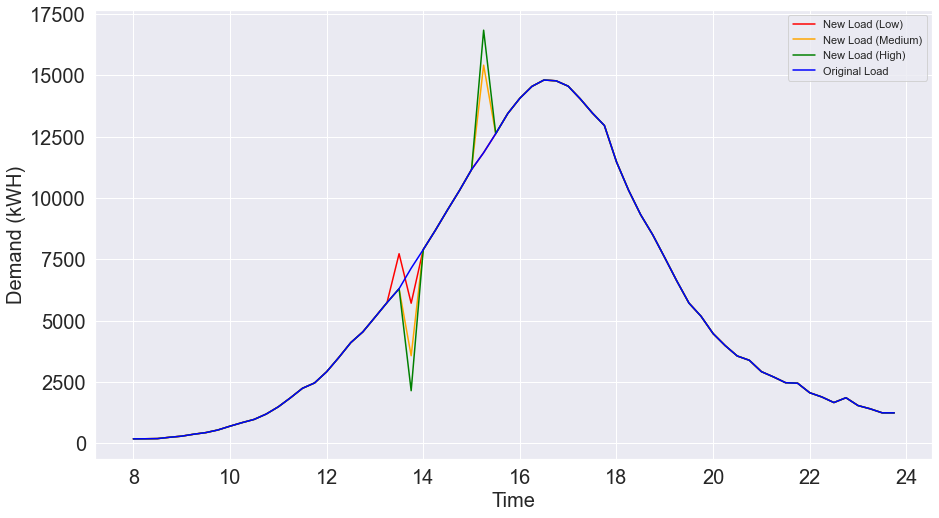

-------------------------
Date: 2018-02-09
Emissions Savings Using Low Estimates: 3367.880178442668 lb. CO2
Emissions Savings Using Med Estimates: 8419.701509073086 lb. CO2
Emissions Savings Using High Estimates: 11787.582103112289 lb. CO2


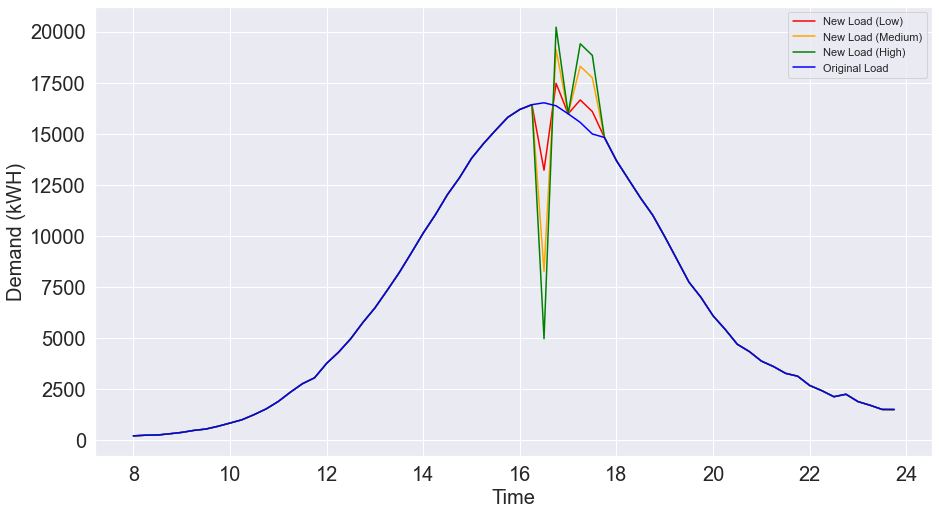

-------------------------
Date: 2018-02-12
Emissions Savings Using Low Estimates: 36.737662358737666 lb. CO2
Emissions Savings Using Med Estimates: 195.16884683284704 lb. CO2
Emissions Savings Using High Estimates: 273.2363853029096 lb. CO2


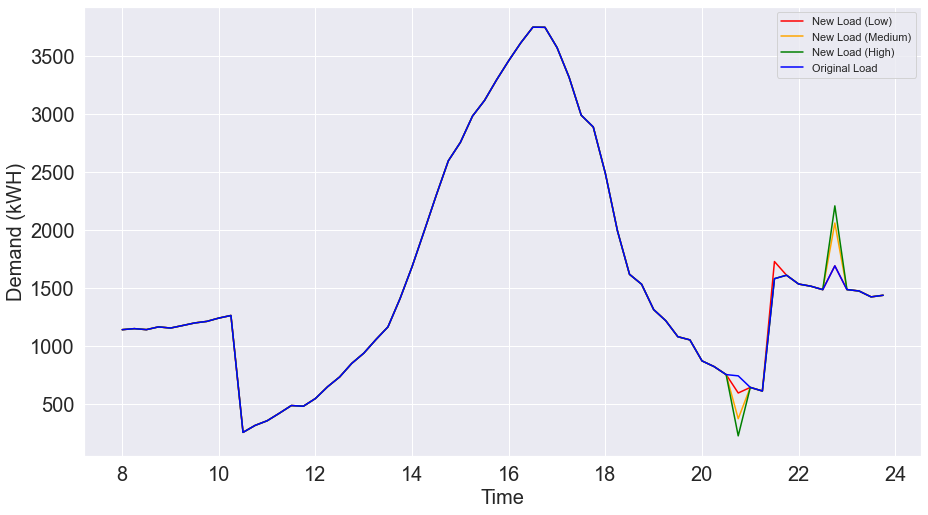

-------------------------
Date: 2018-02-13
Emissions Savings Using Low Estimates: 274.96352939079696 lb. CO2
Emissions Savings Using Med Estimates: 687.4089613509026 lb. CO2
Emissions Savings Using High Estimates: 962.3725414988893 lb. CO2


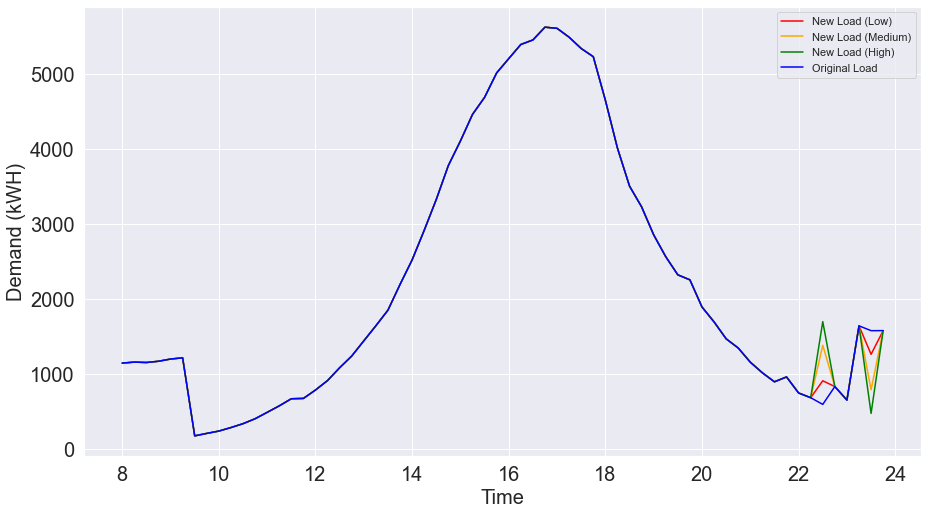

-------------------------
Date: 2018-02-14
Emissions Savings Using Low Estimates: 50.74025644906701 lb. CO2
Emissions Savings Using Med Estimates: 213.7163300570335 lb. CO2
Emissions Savings Using High Estimates: 299.20286231491053 lb. CO2


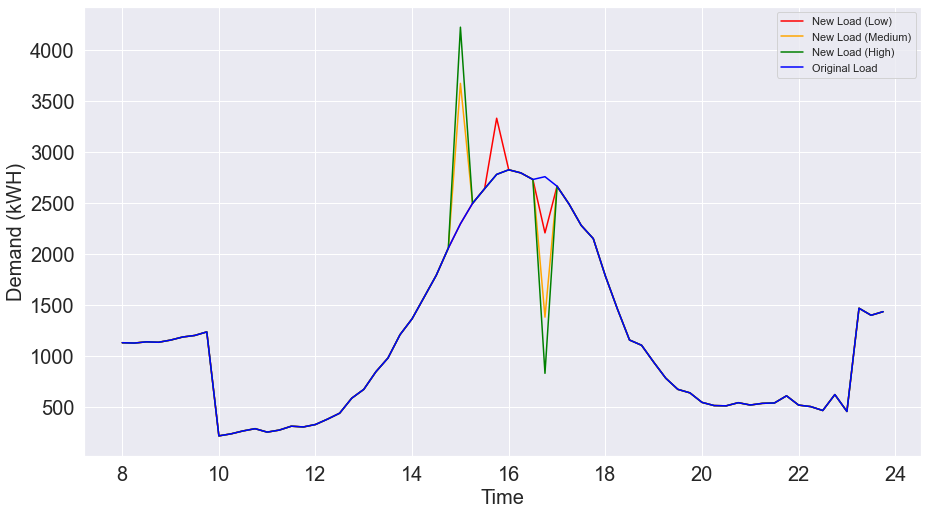

-------------------------
Date: 2018-02-19
Emissions Savings Using Low Estimates: 168.05712712692372 lb. CO2
Emissions Savings Using Med Estimates: 602.1430203250077 lb. CO2
Emissions Savings Using High Estimates: 843.0002217752655 lb. CO2


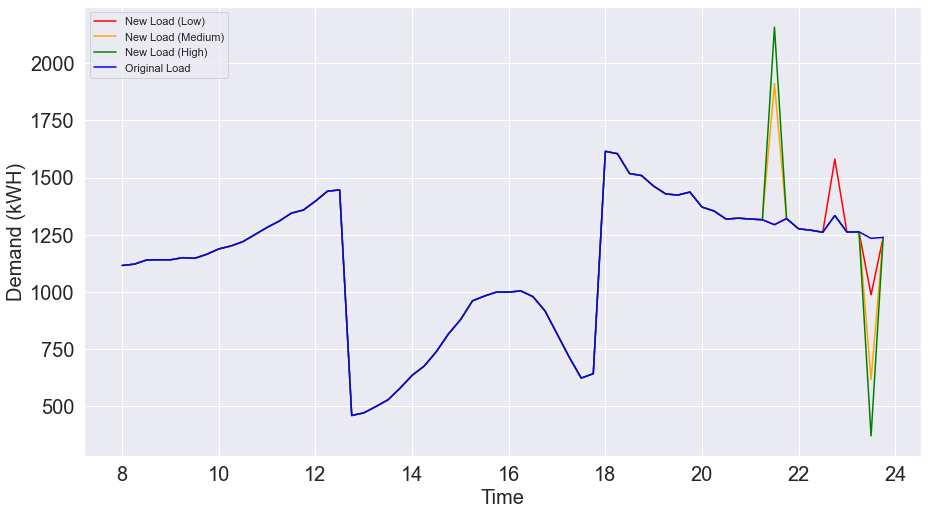

-------------------------
Date: 2018-02-21
Emissions Savings Using Low Estimates: 110.91832825988186 lb. CO2
Emissions Savings Using Med Estimates: 983.053482427253 lb. CO2
Emissions Savings Using High Estimates: 1376.2748752843447 lb. CO2


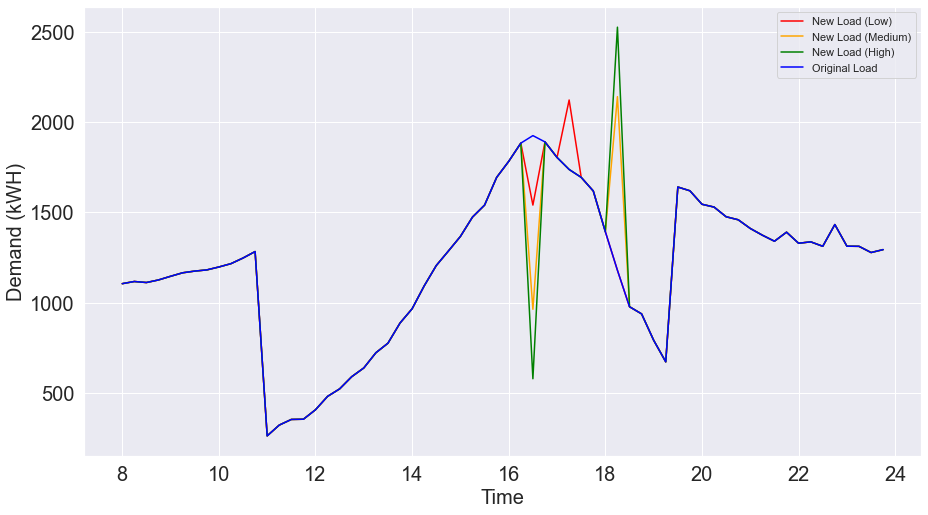

-------------------------
Date: 2018-02-26
Emissions Savings Using Low Estimates: 306.99443794666286 lb. CO2
Emissions Savings Using Med Estimates: 843.198717274432 lb. CO2
Emissions Savings Using High Estimates: 1180.4782042204786 lb. CO2


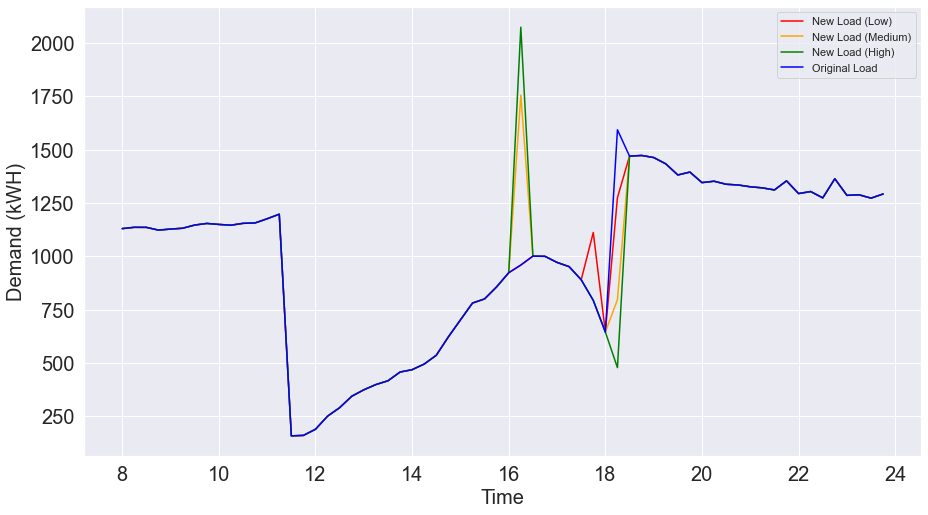

-------------------------
Date: 2018-02-27
Emissions Savings Using Low Estimates: 263.82303953889675 lb. CO2
Emissions Savings Using Med Estimates: 999.1318282903864 lb. CO2
Emissions Savings Using High Estimates: 1398.7845595749752 lb. CO2


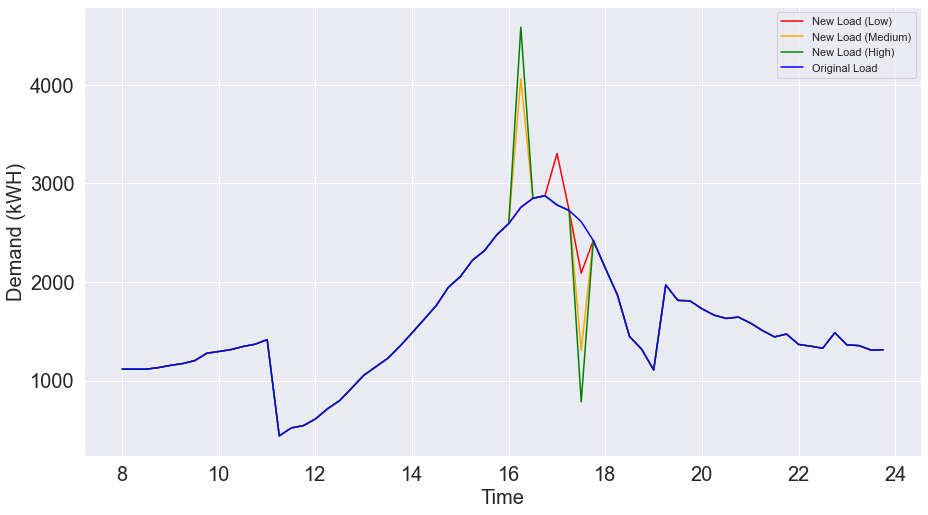

-------------------------
Date: 2018-02-28
Emissions Savings Using Low Estimates: 22.843396019979608 lb. CO2
Emissions Savings Using Med Estimates: 68.74619881518576 lb. CO2
Emissions Savings Using High Estimates: 96.24467651164655 lb. CO2


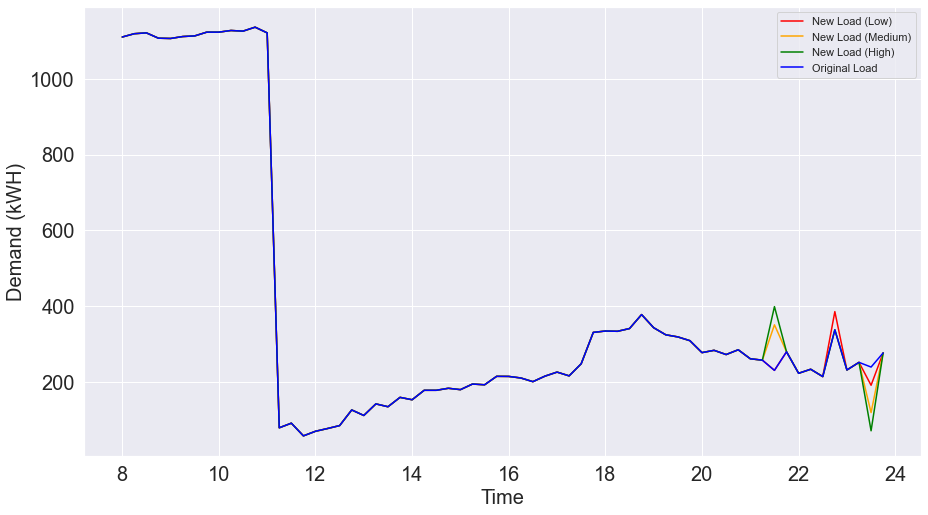

-------------------------
Date: 2018-03-01
Emissions Savings Using Low Estimates: 35.84478520815093 lb. CO2
Emissions Savings Using Med Estimates: 95.36873793249147 lb. CO2
Emissions Savings Using High Estimates: 133.51624577455553 lb. CO2


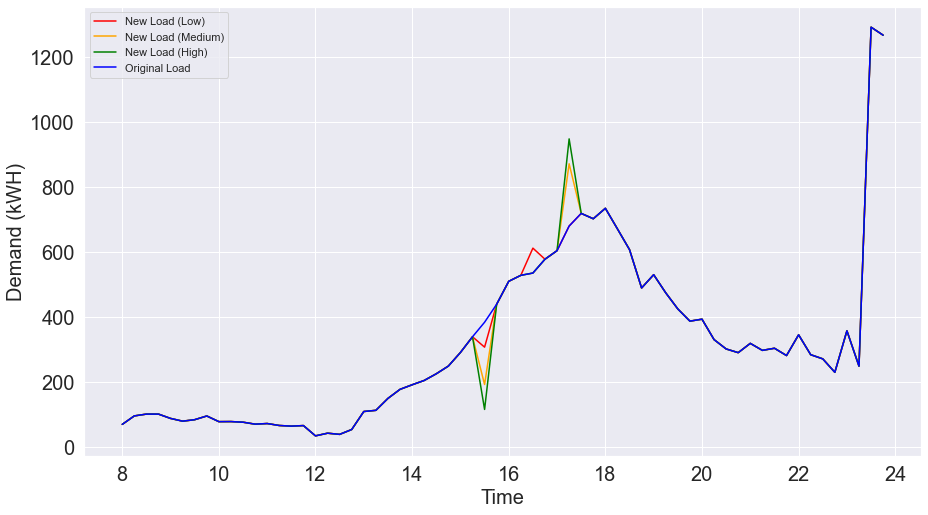

-------------------------
Date: 2018-03-11
Emissions Savings Using Low Estimates: 936.8464200530224 lb. CO2
Emissions Savings Using Med Estimates: 2598.3962510861443 lb. CO2
Emissions Savings Using High Estimates: 3637.7547496893976 lb. CO2


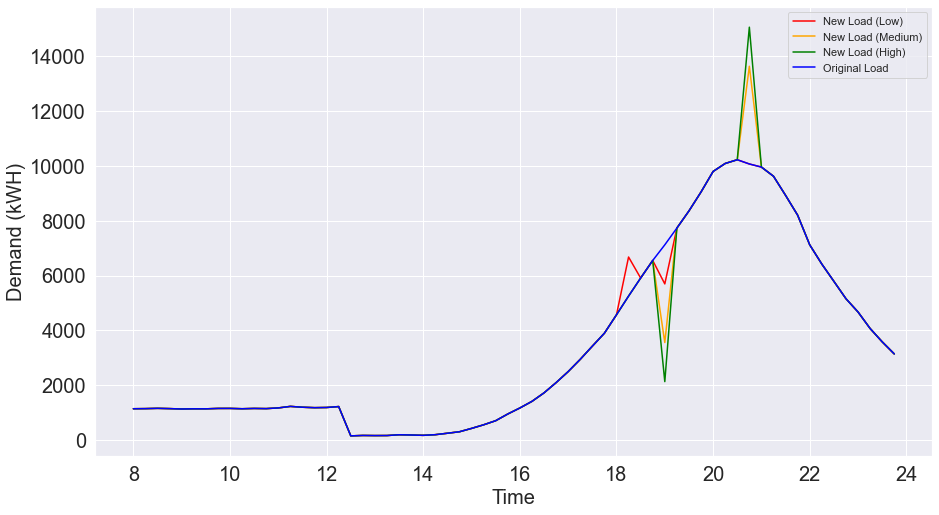

-------------------------
Date: 2018-03-12
Emissions Savings Using Low Estimates: 8.75667713936708 lb. CO2
Emissions Savings Using Med Estimates: 21.89219760375159 lb. CO2
Emissions Savings Using High Estimates: 30.648971236025705 lb. CO2


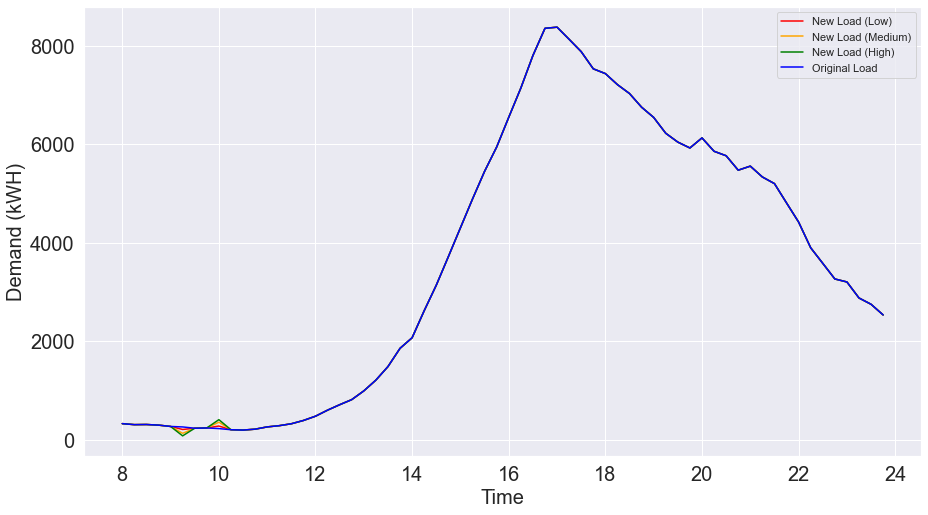

-------------------------
Date: 2018-03-15
Emissions Savings Using Low Estimates: 71.05533004845954 lb. CO2
Emissions Savings Using Med Estimates: 250.92300660484295 lb. CO2
Emissions Savings Using High Estimates: 351.2922050768917 lb. CO2


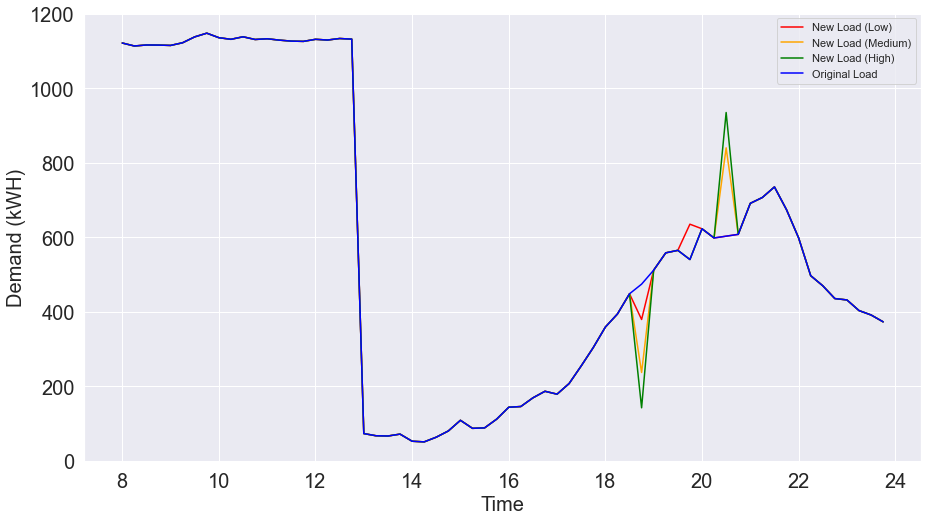

-------------------------
Date: 2018-03-20
Emissions Savings Using Low Estimates: 23.778615865798745 lb. CO2
Emissions Savings Using Med Estimates: 59.44654841568776 lb. CO2
Emissions Savings Using High Estimates: 83.22516523917034 lb. CO2


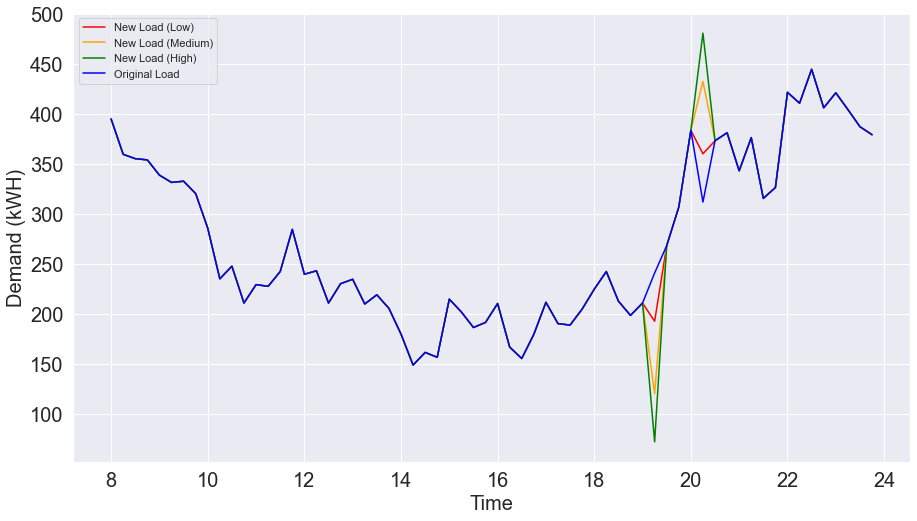

-------------------------
Date: 2018-03-23
Emissions Savings Using Low Estimates: 14.408149032921376 lb. CO2
Emissions Savings Using Med Estimates: 51.010201380181094 lb. CO2
Emissions Savings Using High Estimates: 71.41428085184492 lb. CO2


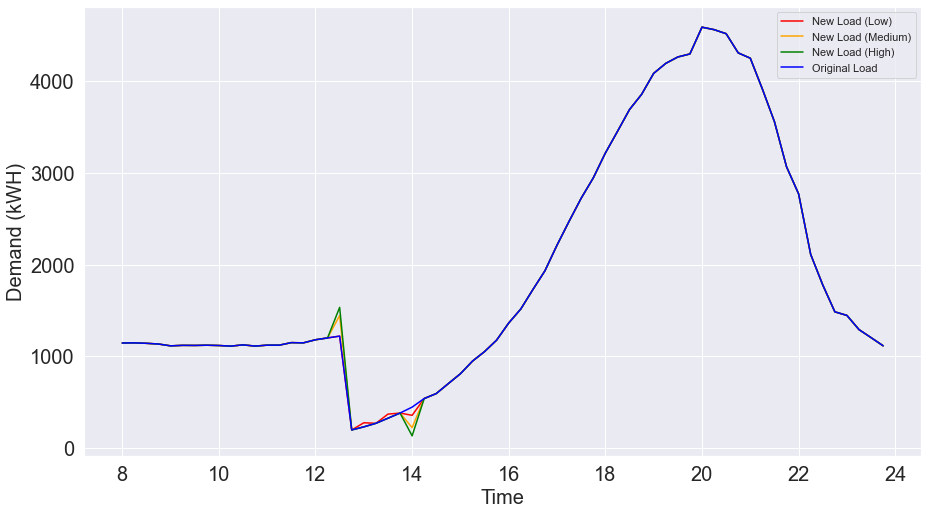

-------------------------
Date: 2018-04-19
Emissions Savings Using Low Estimates: 19.50262843725773 lb. CO2
Emissions Savings Using Med Estimates: 57.07386031441476 lb. CO2
Emissions Savings Using High Estimates: 79.90339799282567 lb. CO2


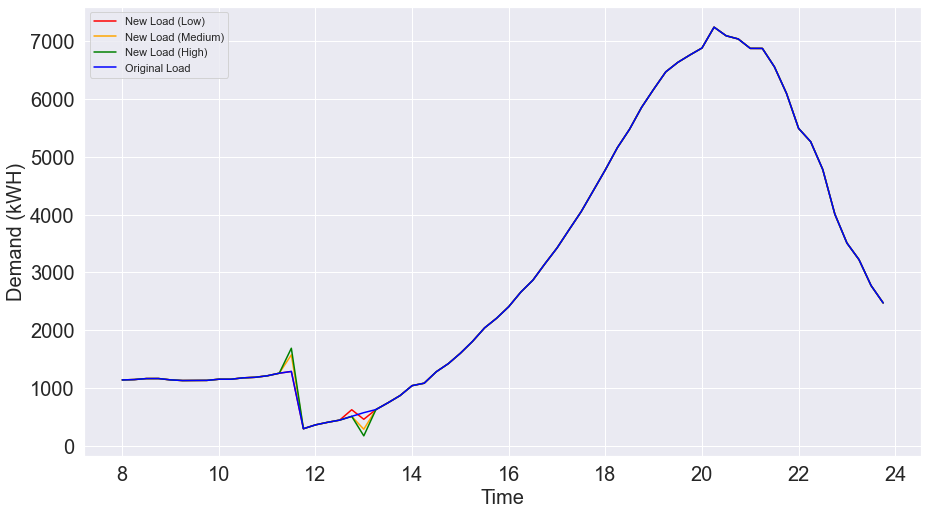

-------------------------
Date: 2018-04-20
Emissions Savings Using Low Estimates: 52.9765667143721 lb. CO2
Emissions Savings Using Med Estimates: 153.60487672682078 lb. CO2
Emissions Savings Using High Estimates: 215.04647706889708 lb. CO2


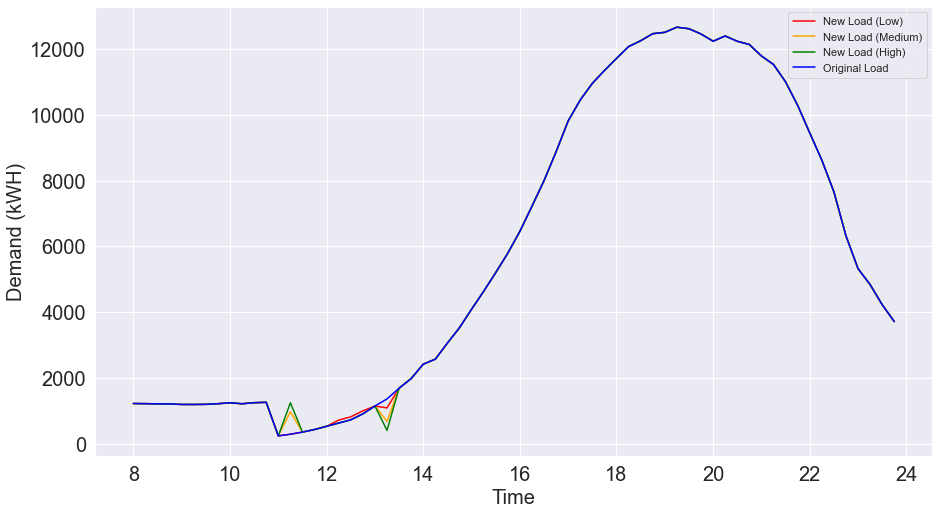

-------------------------
Date: 2018-04-21
Emissions Savings Using Low Estimates: 61.268425222203625 lb. CO2
Emissions Savings Using Med Estimates: 199.03071708739526 lb. CO2
Emissions Savings Using High Estimates: 278.6430037021615 lb. CO2


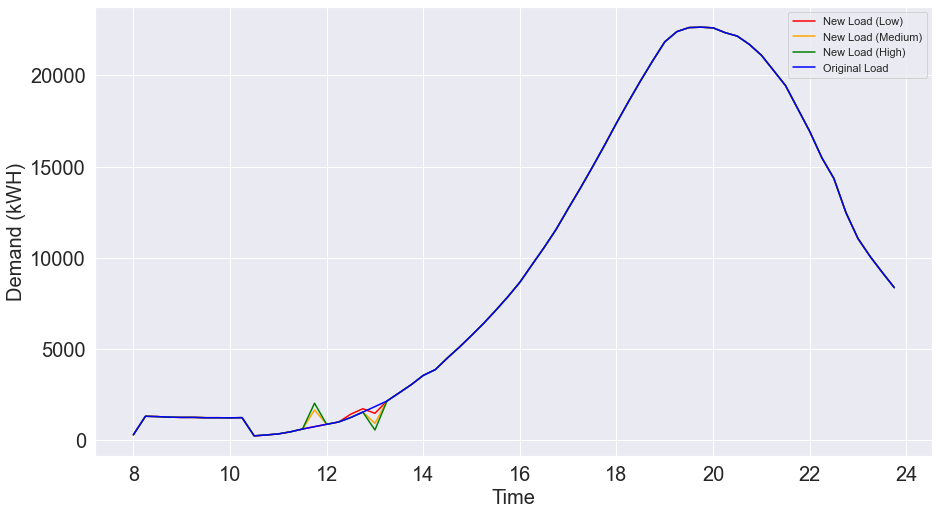

-------------------------
Date: 2018-04-22
Emissions Savings Using Low Estimates: 151.0943295748633 lb. CO2
Emissions Savings Using Med Estimates: 415.9592734728238 lb. CO2
Emissions Savings Using High Estimates: 582.3429828447364 lb. CO2


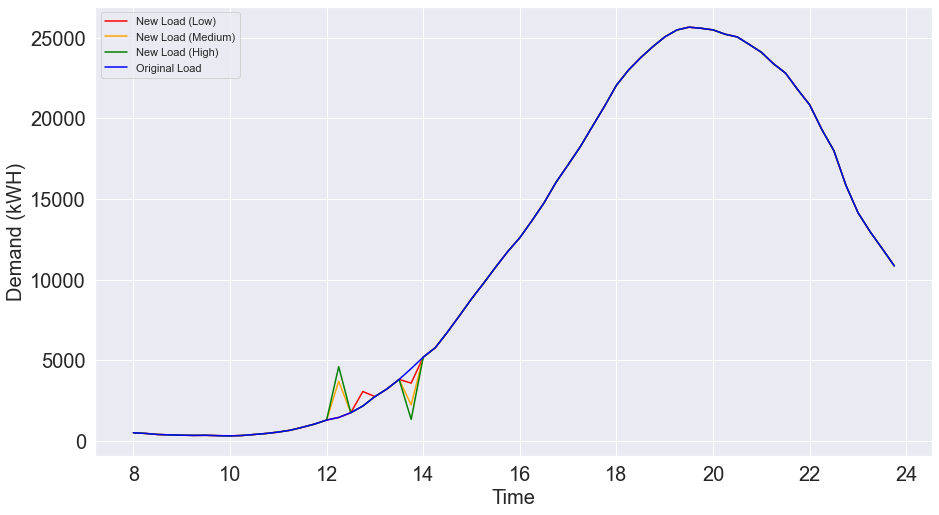

-------------------------
Date: 2018-04-23
Emissions Savings Using Low Estimates: 95.26107564557911 lb. CO2
Emissions Savings Using Med Estimates: 238.15552580452032 lb. CO2
Emissions Savings Using High Estimates: 333.4177352613239 lb. CO2


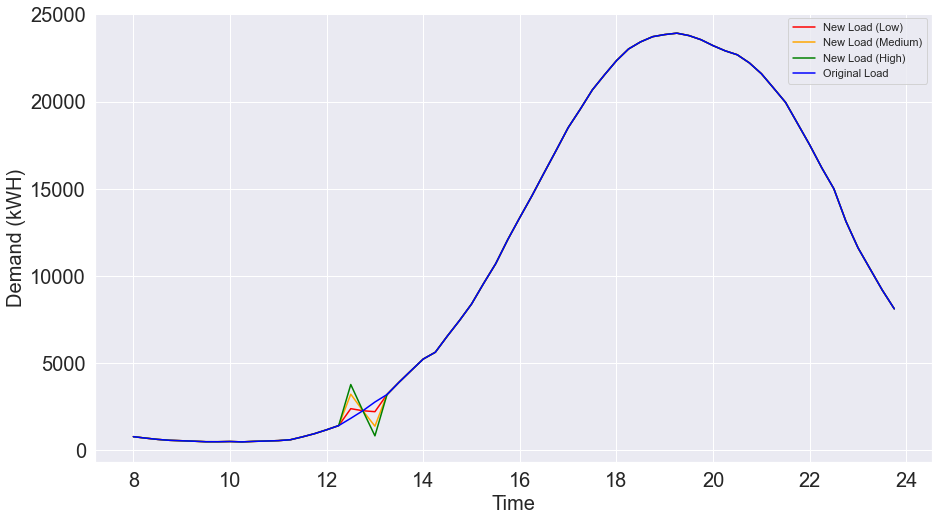

-------------------------
Date: 2018-04-24
Emissions Savings Using Low Estimates: 24.552015112930686 lb. CO2
Emissions Savings Using Med Estimates: 65.47217511629295 lb. CO2
Emissions Savings Using High Estimates: 91.66104251213235 lb. CO2


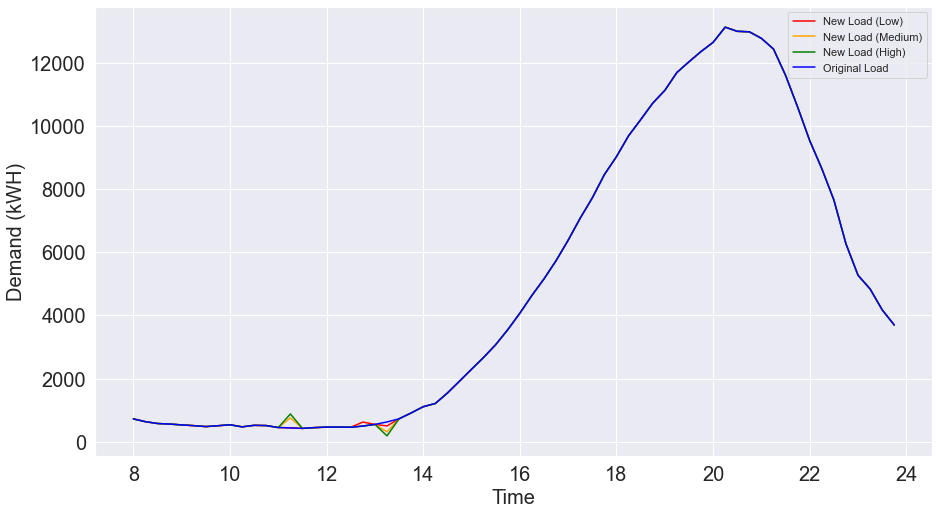

-------------------------
Date: 2018-12-02
Emissions Savings Using Low Estimates: 392.3040951507973 lb. CO2
Emissions Savings Using Med Estimates: 980.7602571158706 lb. CO2
Emissions Savings Using High Estimates: 1373.0643599146745 lb. CO2


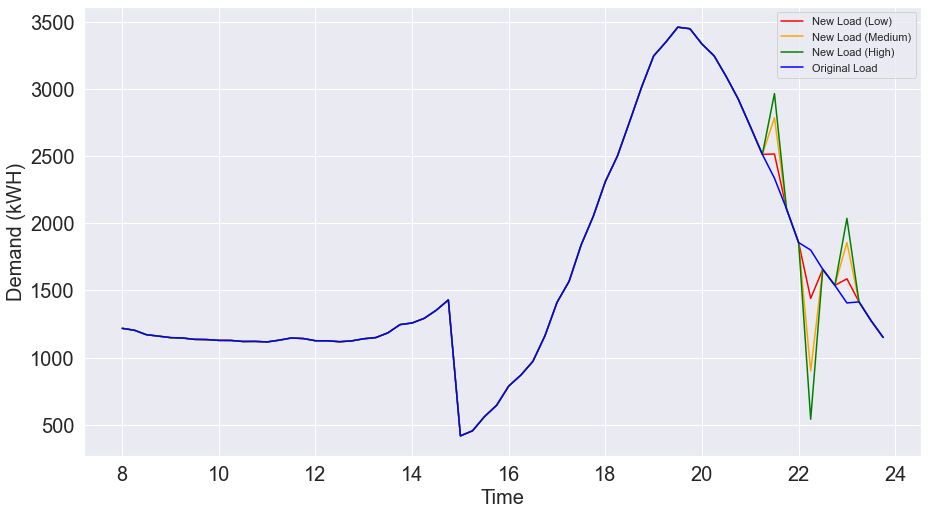

-------------------------
Date: 2018-12-03
Emissions Savings Using Low Estimates: 19.166750894141142 lb. CO2
Emissions Savings Using Med Estimates: 124.04649937549308 lb. CO2
Emissions Savings Using High Estimates: 173.66509880814334 lb. CO2


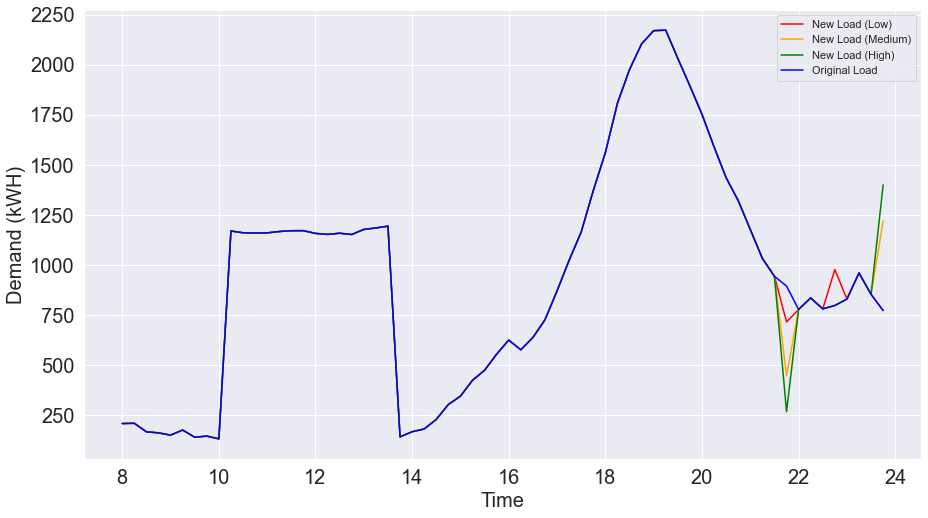

-------------------------
Date: 2018-12-04
Emissions Savings Using Low Estimates: 1.1932215432188158 lb. CO2
Emissions Savings Using Med Estimates: 7.923736898219324 lb. CO2
Emissions Savings Using High Estimates: 11.093231357589646 lb. CO2


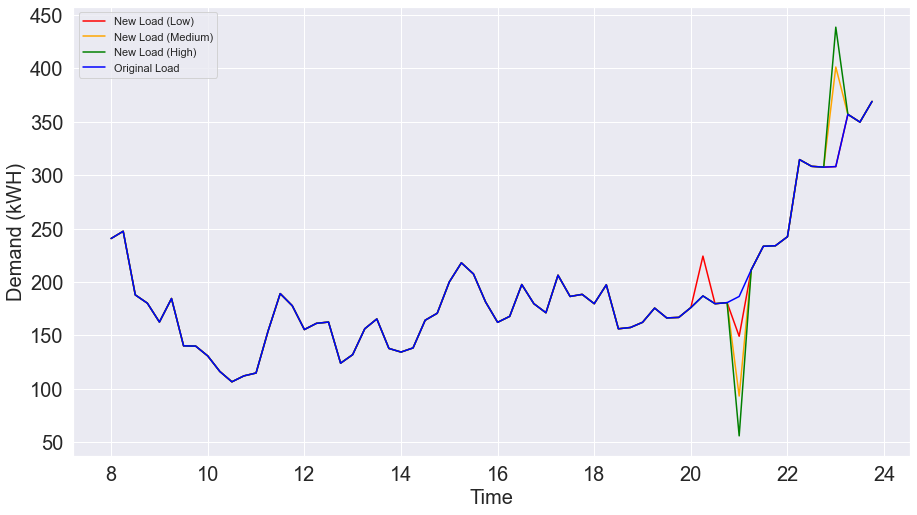

-------------------------
Date: 2018-12-06
Emissions Savings Using Low Estimates: 43.5290594076162 lb. CO2
Emissions Savings Using Med Estimates: 121.6254331921282 lb. CO2
Emissions Savings Using High Estimates: 170.27560646356395 lb. CO2


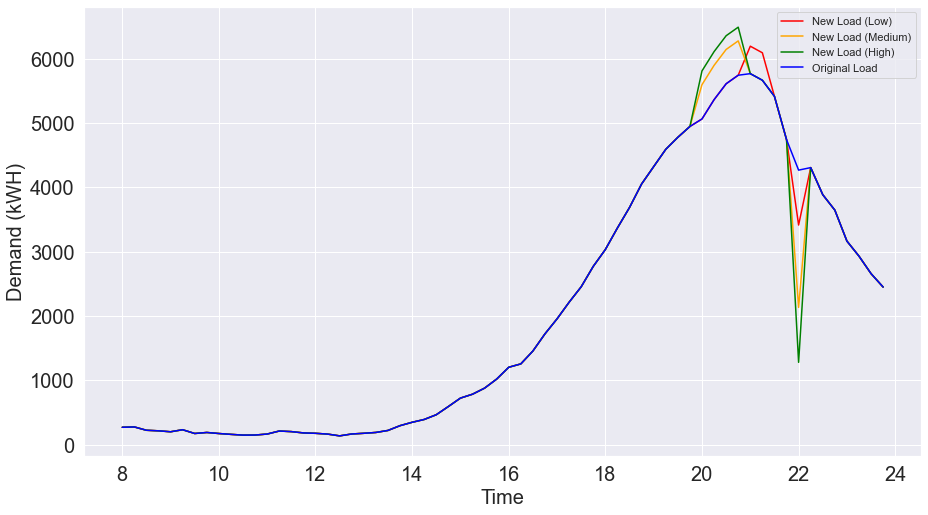

-------------------------
Date: 2018-12-07
Emissions Savings Using Low Estimates: 15.226795209628323 lb. CO2
Emissions Savings Using Med Estimates: 42.90089368012862 lb. CO2
Emissions Savings Using High Estimates: 60.06125115604625 lb. CO2


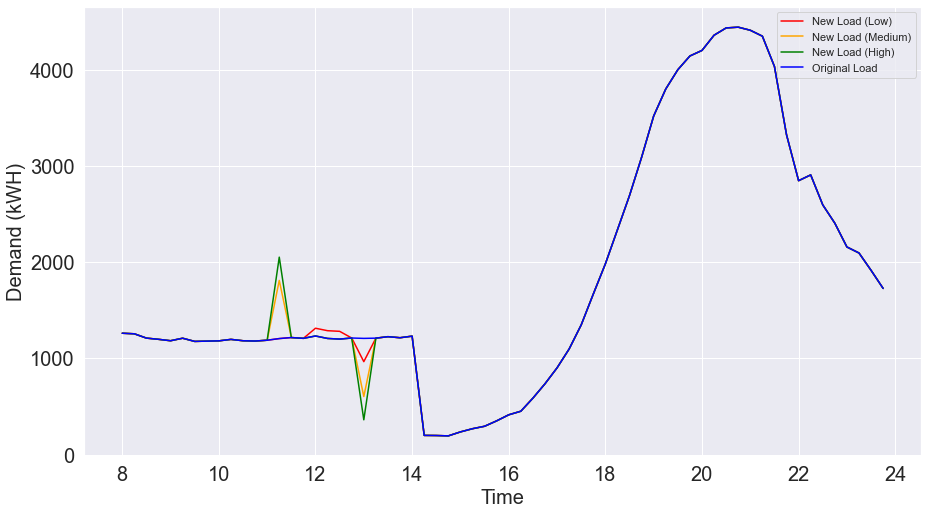

-------------------------
Date: 2018-12-08
Emissions Savings Using Low Estimates: 2.6328288857600173 lb. CO2
Emissions Savings Using Med Estimates: 18.04956469300383 lb. CO2
Emissions Savings Using High Estimates: 25.26951334201104 lb. CO2


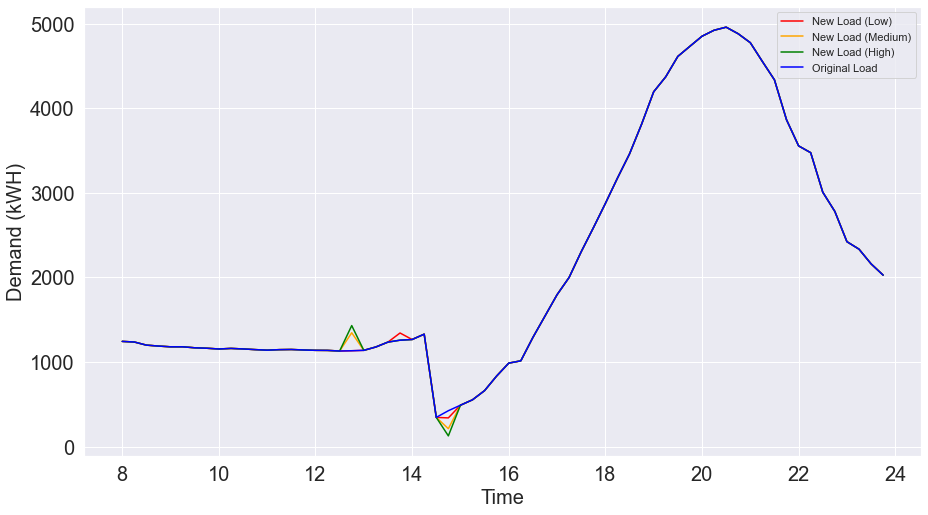

-------------------------
Date: 2018-12-10
Emissions Savings Using Low Estimates: 30.46858740438189 lb. CO2
Emissions Savings Using Med Estimates: 76.1715035681331 lb. CO2
Emissions Savings Using High Estimates: 106.64010512919997 lb. CO2


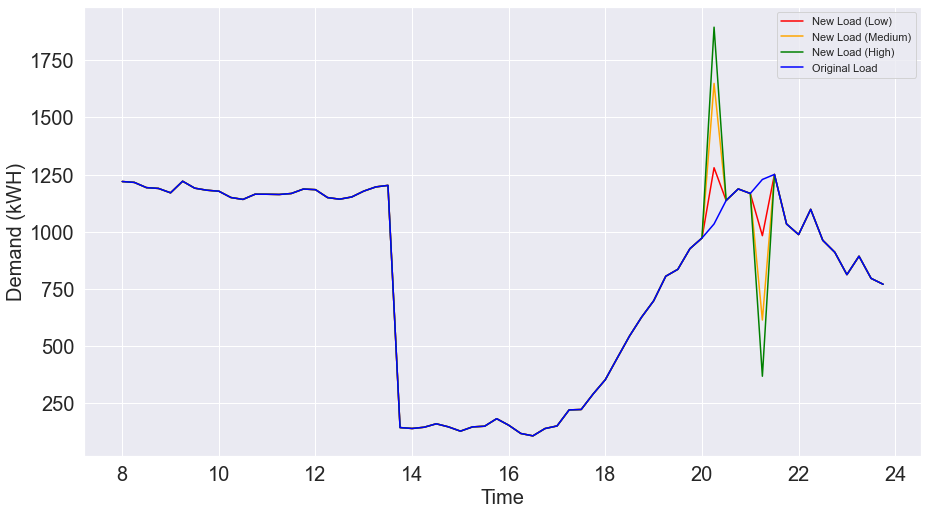

-------------------------
Date: 2018-12-11
Emissions Savings Using Low Estimates: 201.64902500766252 lb. CO2
Emissions Savings Using Med Estimates: 504.1225652037725 lb. CO2
Emissions Savings Using High Estimates: 705.7715909490564 lb. CO2


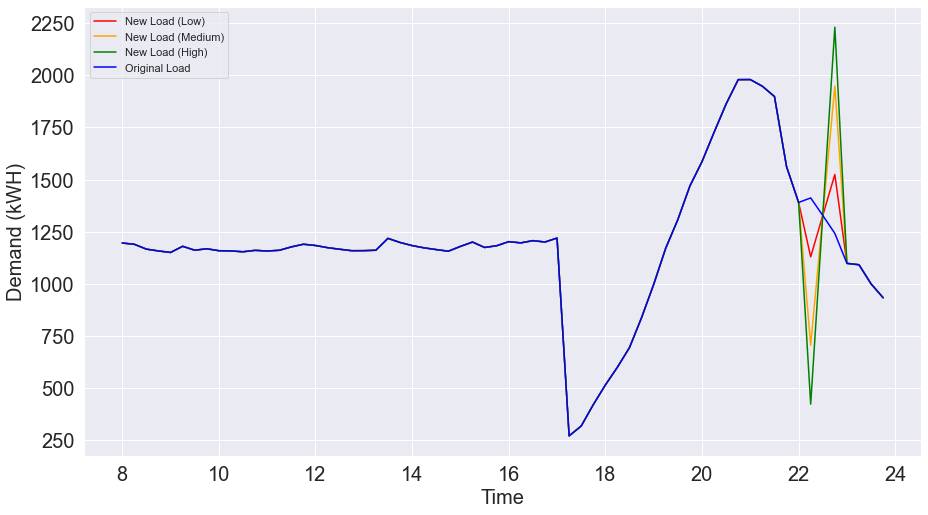

-------------------------
Date: 2018-12-12
Emissions Savings Using Low Estimates: 35.62343467386854 lb. CO2
Emissions Savings Using Med Estimates: 1351.5965521443034 lb. CO2
Emissions Savings Using High Estimates: 1892.2352677276144 lb. CO2


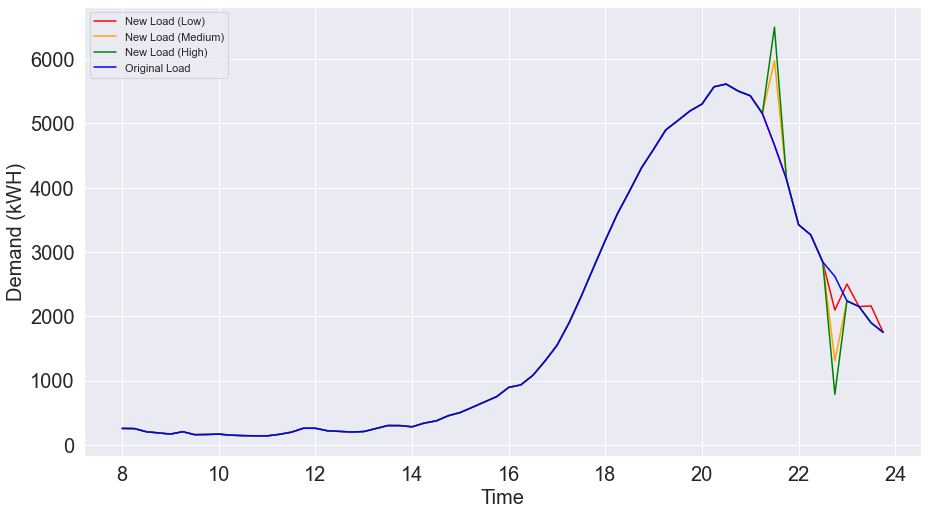

-------------------------
Date: 2018-12-13
Emissions Savings Using Low Estimates: 23.699641967567377 lb. CO2
Emissions Savings Using Med Estimates: 122.20391428922402 lb. CO2
Emissions Savings Using High Estimates: 171.08543004244814 lb. CO2


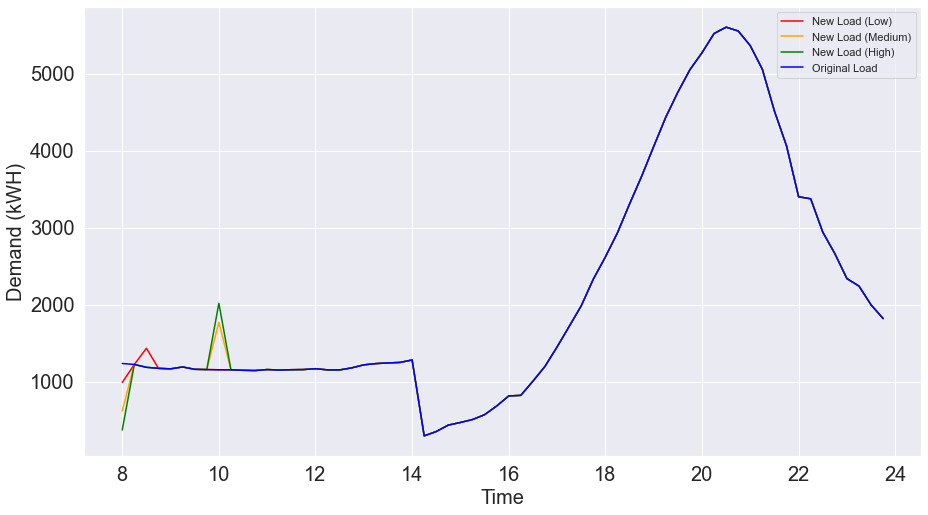

-------------------------
Date: 2018-12-14
Emissions Savings Using Low Estimates: 7.471192853520753 lb. CO2
Emissions Savings Using Med Estimates: 18.677974556328042 lb. CO2
Emissions Savings Using High Estimates: 26.14917048984336 lb. CO2


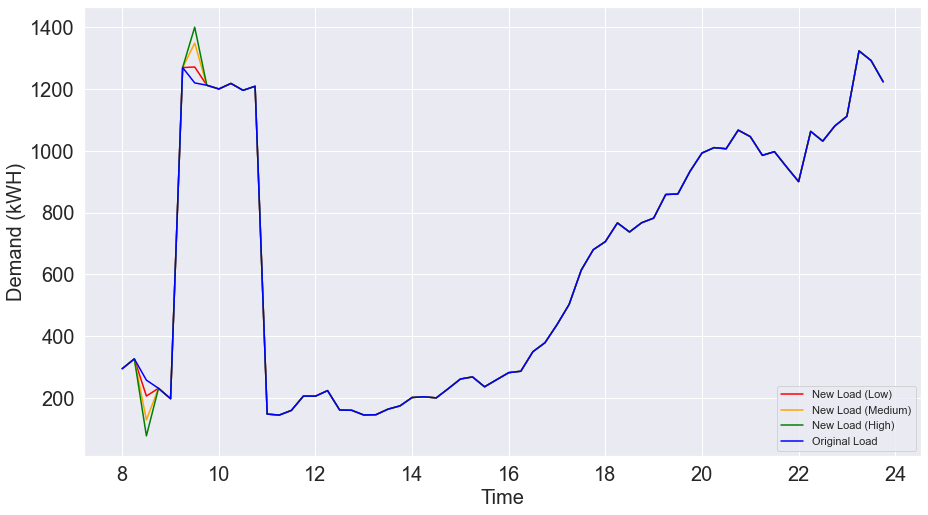

-------------------------
Date: 2018-12-15
Emissions Savings Using Low Estimates: 44.31375174778654 lb. CO2
Emissions Savings Using Med Estimates: 117.58692512235069 lb. CO2
Emissions Savings Using High Estimates: 164.62169484124124 lb. CO2


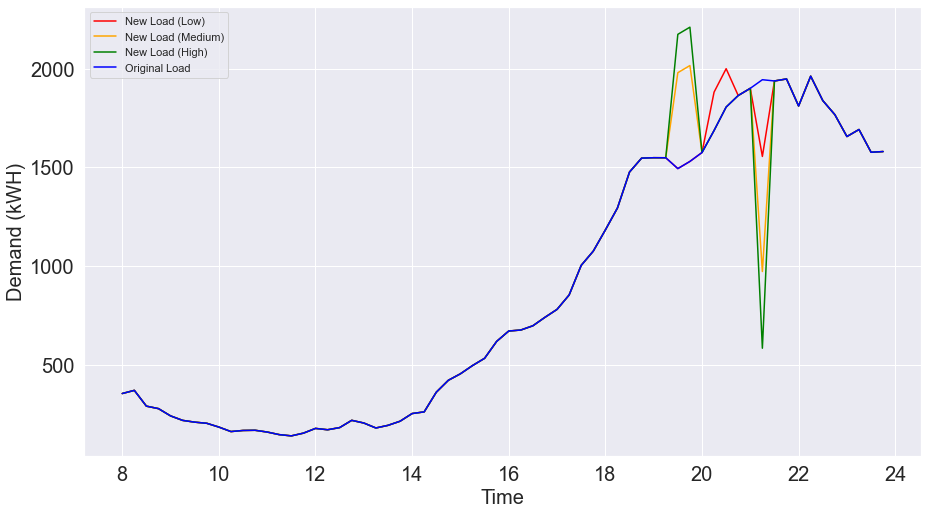

-------------------------
Date: 2018-12-16
Emissions Savings Using Low Estimates: 4.059068505528329 lb. CO2
Emissions Savings Using Med Estimates: 16.06720714985149 lb. CO2
Emissions Savings Using High Estimates: 22.49408812772484 lb. CO2


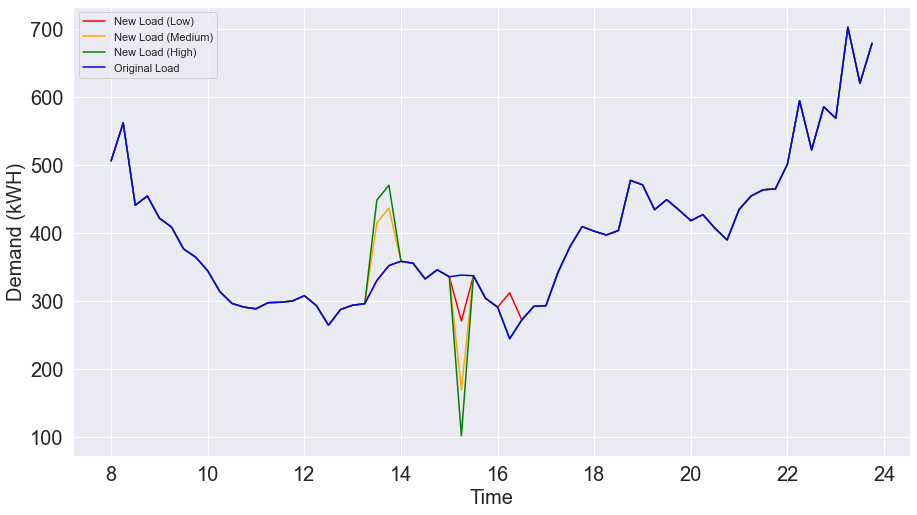

-------------------------
Date: 2018-12-17
Emissions Savings Using Low Estimates: 59.772255325740915 lb. CO2
Emissions Savings Using Med Estimates: 149.43066074688423 lb. CO2
Emissions Savings Using High Estimates: 209.20292467195614 lb. CO2


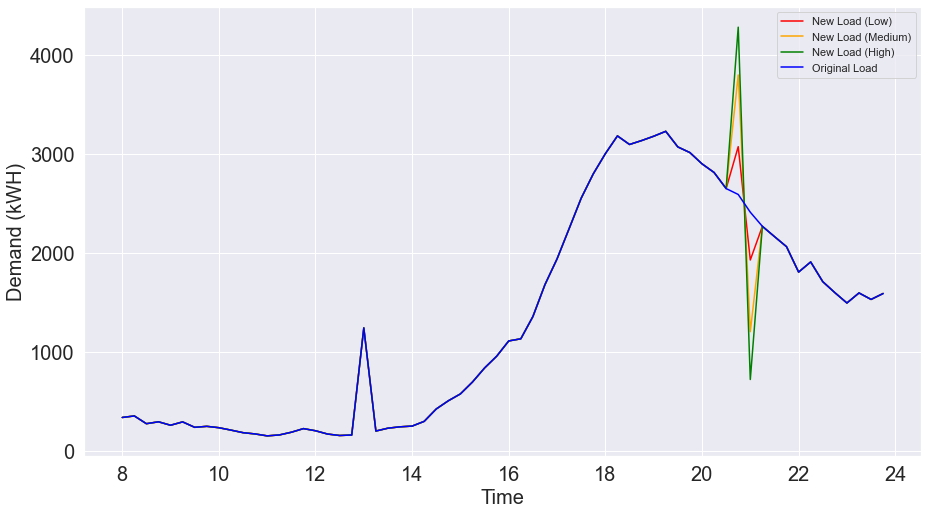

-------------------------
Date: 2018-12-18
Emissions Savings Using Low Estimates: 18.136819730658278 lb. CO2
Emissions Savings Using Med Estimates: 66.4165305708466 lb. CO2
Emissions Savings Using High Estimates: 92.98314365896287 lb. CO2


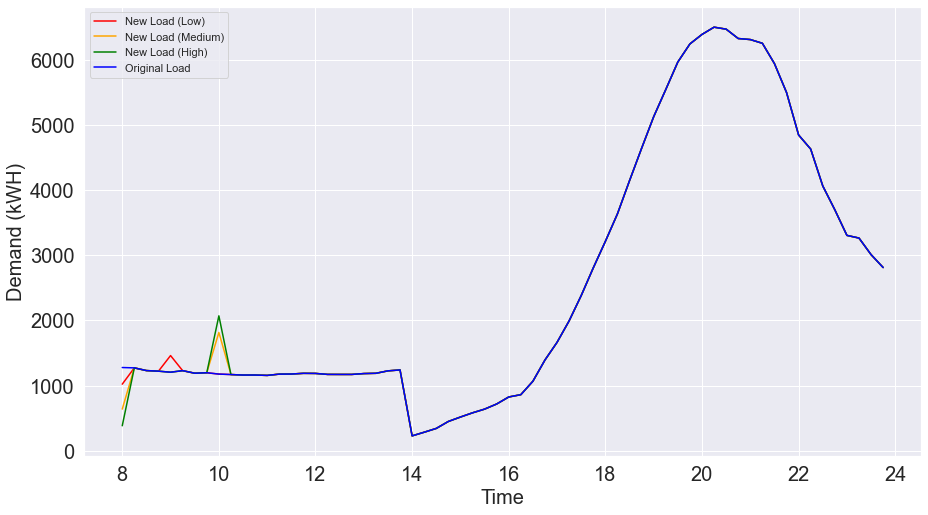

-------------------------
Date: 2018-12-19
Emissions Savings Using Low Estimates: 631.3814823418429 lb. CO2
Emissions Savings Using Med Estimates: 1578.4537664836894 lb. CO2
Emissions Savings Using High Estimates: 2209.835273073832 lb. CO2


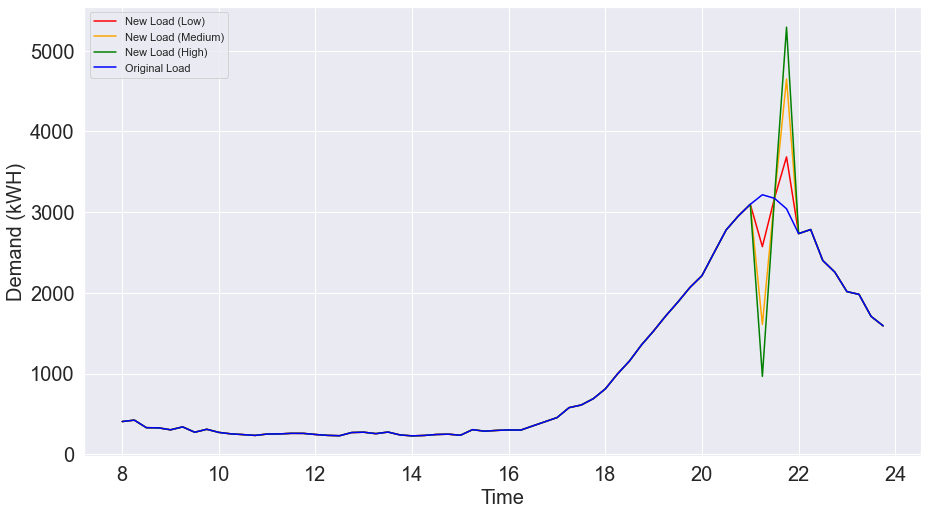

-------------------------
Date: 2018-12-20
Emissions Savings Using Low Estimates: 10.359332904465363 lb. CO2
Emissions Savings Using Med Estimates: 25.89833198601792 lb. CO2
Emissions Savings Using High Estimates: 36.25766486818051 lb. CO2


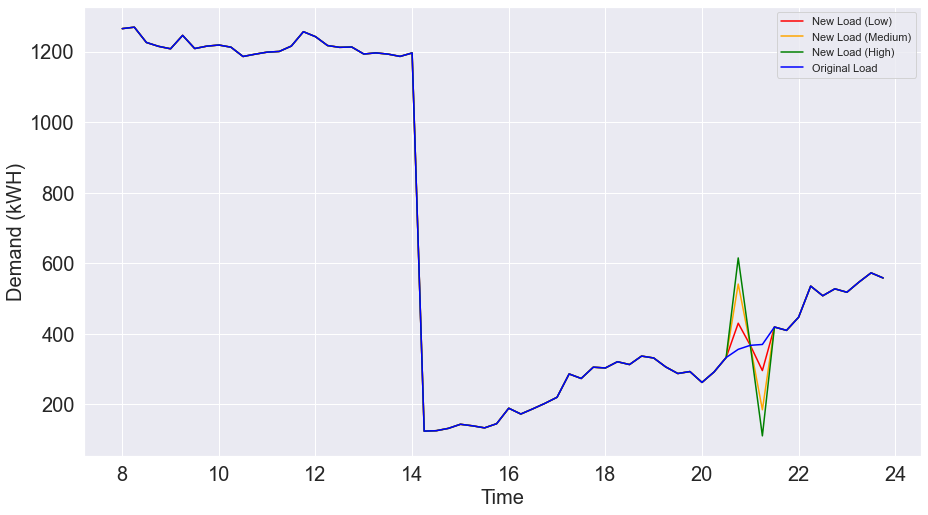

-------------------------
Date: 2018-12-21
Emissions Savings Using Low Estimates: 33.397418253719565 lb. CO2
Emissions Savings Using Med Estimates: 84.10747537483647 lb. CO2
Emissions Savings Using High Estimates: 117.75046553110278 lb. CO2


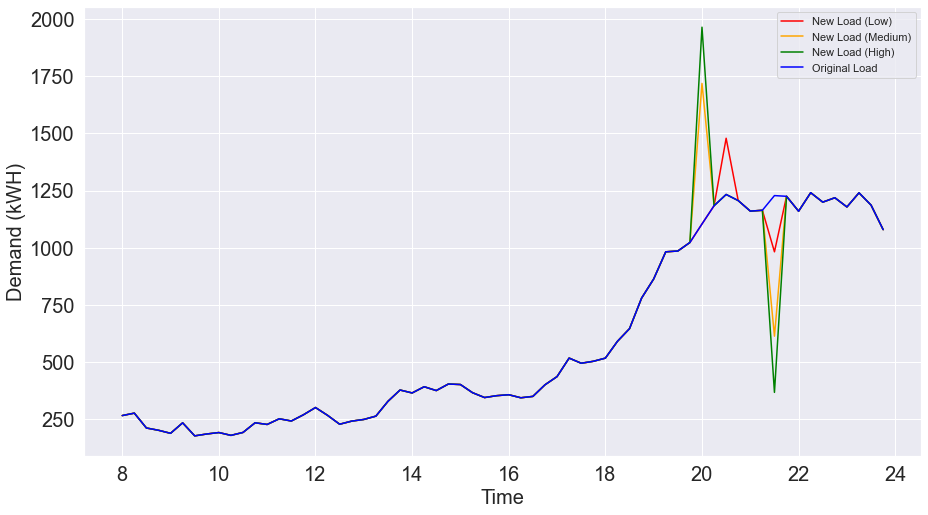

-------------------------
Date: 2018-12-23
Emissions Savings Using Low Estimates: 39.32168816119151 lb. CO2
Emissions Savings Using Med Estimates: 98.30422169552034 lb. CO2
Emissions Savings Using High Estimates: 137.62591034463455 lb. CO2


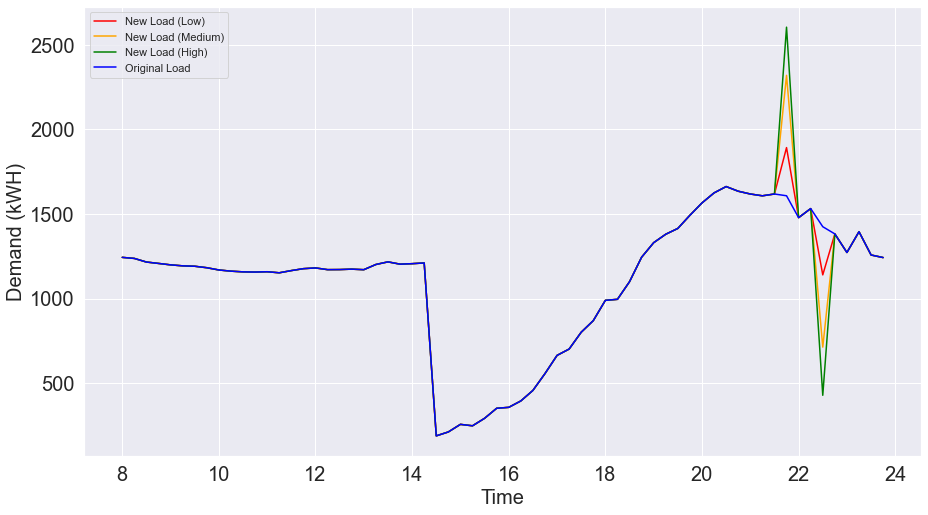

-------------------------
Date: 2018-12-24
Emissions Savings Using Low Estimates: 3.0674095950058633 lb. CO2
Emissions Savings Using Med Estimates: 10.319381487239268 lb. CO2
Emissions Savings Using High Estimates: 14.447134119842662 lb. CO2


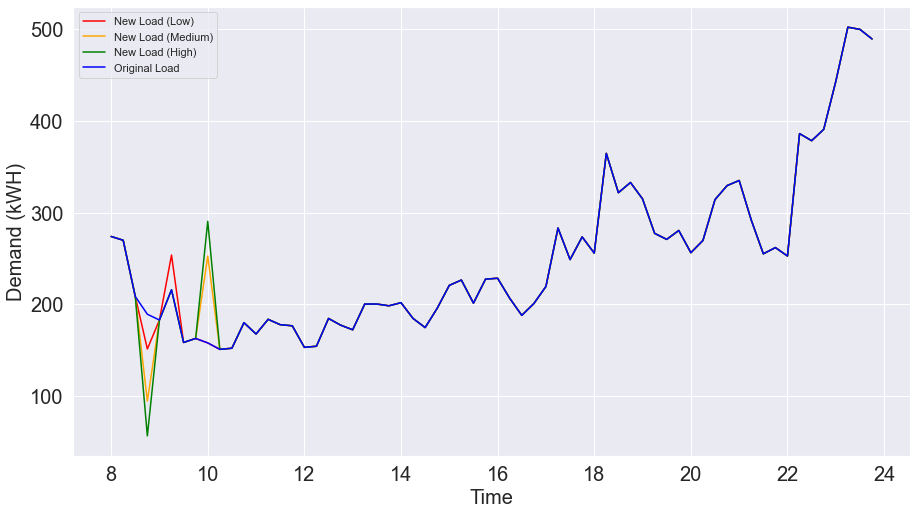

-------------------------
Date: 2018-12-25
Emissions Savings Using Low Estimates: 3.2257615189672877 lb. CO2
Emissions Savings Using Med Estimates: 8.374565011017173 lb. CO2
Emissions Savings Using High Estimates: 11.724380114894378 lb. CO2


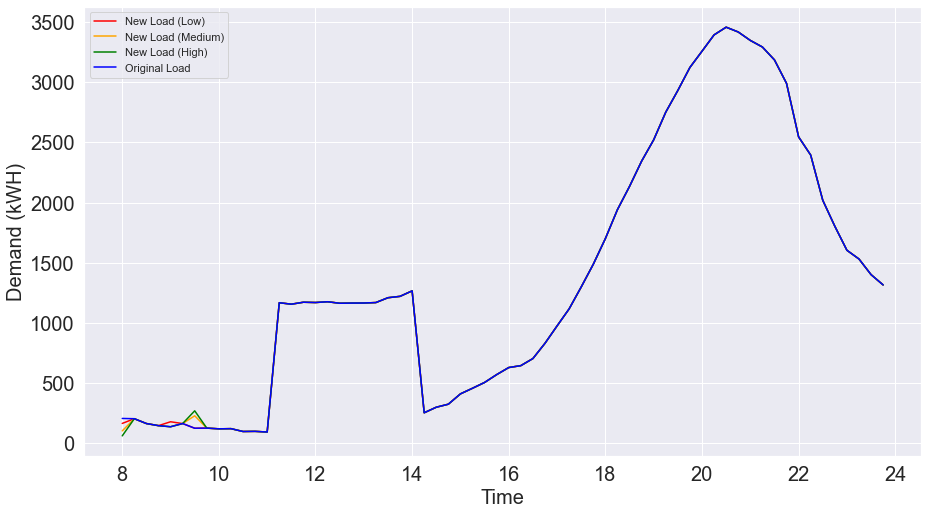

-------------------------
Date: 2018-12-26
Emissions Savings Using Low Estimates: 11.612892901601743 lb. CO2
Emissions Savings Using Med Estimates: 58.06446437447299 lb. CO2
Emissions Savings Using High Estimates: 81.29024242117467 lb. CO2


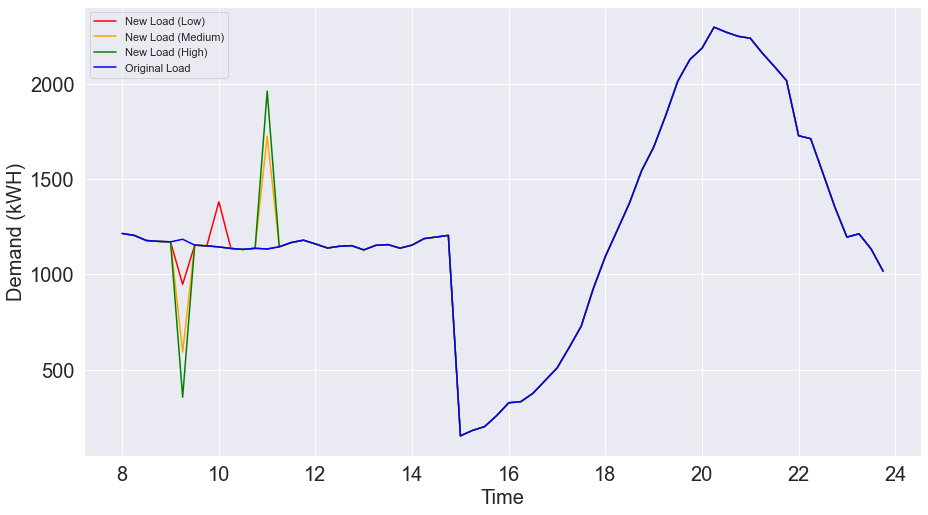

-------------------------
Total Emissions Savings Using Low Estimates: 10156.60584948658 lb. CO2
Total Emissions Savings Using Med Estimates: 29095.944752350773 lb. CO2
Total Emissions Savings Using High Estimates: 40734.32226699765 lb. CO2


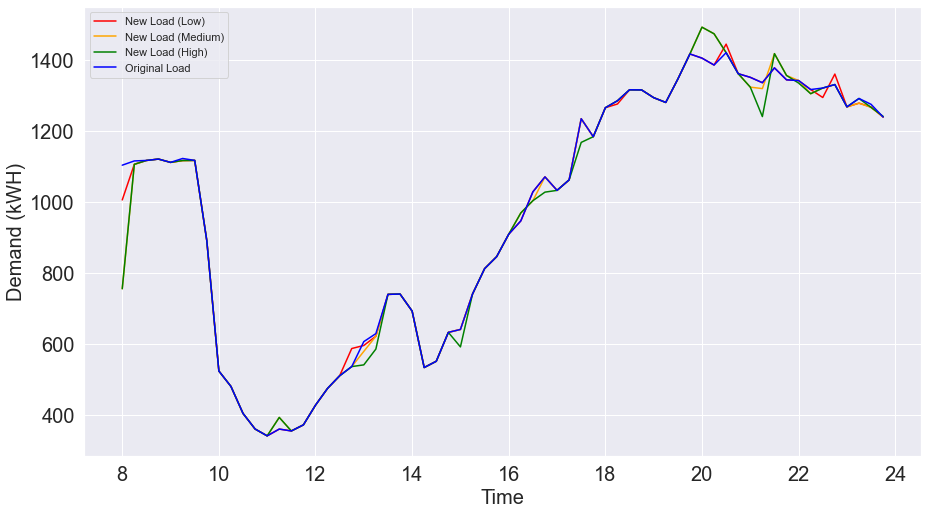

In [108]:
proportion_shiftable_low = 0.2
proportion_shiftable_med = 0.5
proportion_shiftable_high = 0.7

window_length_low = 4
window_length_med = 8
window_length_high = 8

load_savings_low_total = 0
load_savings_med_total = 0
load_savings_high_total = 0

df_original_loads = pd.DataFrame(columns = range(64))
df_loads_low = pd.DataFrame(columns = range(64))
df_loads_med = pd.DataFrame(columns = range(64))
df_loads_high = pd.DataFrame(columns = range(64))

for i in range(32, 35049, 96):
    
    if all18["Load Shift"][i]:
        emissions_time_series = list(all18["MOER"][i:i + 64]) # 64 since we are working with waking hours. 4 readings per hour * 16 waking hours = 64
        load_time_series = list(all18["cooling"][i:i+ 64])
        
        new_load_low = load_shift(emissions_time_series, load_time_series, proportion_shiftable_low, window_length_low)
        new_load_med = load_shift(emissions_time_series, load_time_series, proportion_shiftable_med, window_length_med)
        new_load_high = load_shift(emissions_time_series, load_time_series, proportion_shiftable_high, window_length_high)
        
        load_savings_low = sum(emissions_time_series * (load_time_series - new_load_low)) / 1000  # Division by 1000 to cancel units. MOER is in (lb. CO2 / MWh) and load is in kwH
        load_savings_med = sum(emissions_time_series * (load_time_series - new_load_med)) / 1000
        load_savings_high = sum(emissions_time_series * (load_time_series - new_load_high)) / 1000
        
        load_savings_low_total += load_savings_low
        load_savings_med_total += load_savings_med
        load_savings_high_total += load_savings_high
        
        df_original_loads.loc[len(df_original_loads)] = load_time_series
        df_loads_low.loc[len(df_loads_low)] = new_load_low
        df_loads_med.loc[len(df_loads_med)] = new_load_med
        df_loads_high.loc[len(df_loads_high)] = new_load_high


        print("-------------------------")
        print(f"Date: {all18['date'][i].date()}")
        print(f"Emissions Savings Using Low Estimates: {load_savings_low} lb. CO2") 
        print(f"Emissions Savings Using Med Estimates: {load_savings_med} lb. CO2") 
        print(f"Emissions Savings Using High Estimates: {load_savings_high} lb. CO2") 
        
        sns.lineplot(x=np.arange(8, 24, 0.25), y=new_load_low, color='red', label = 'New Load (Low)')
        sns.lineplot(x=np.arange(8, 24, 0.25), y=new_load_med, color='orange', label = 'New Load (Medium)')
        sns.lineplot(x=np.arange(8, 24, 0.25), y=new_load_high, color='green', label = 'New Load (High)')
        sns.lineplot(x=np.arange(8, 24, 0.25), y=load_time_series, color='blue', label='Original Load')

        
        sns.set(rc={'figure.figsize':(15,8.27)})
        plt.xlabel("Time", fontsize=20)
        plt.ylabel("Demand (kWH)", fontsize=20)
        plt.xticks(fontsize=20)
        plt.yticks(fontsize=20)
        plt.legend()
        plt.show()
        plt.close()
 

print("-------------------------")
print(f"Total Emissions Savings Using Low Estimates: {load_savings_low_total} lb. CO2") 
print(f"Total Emissions Savings Using Med Estimates: {load_savings_med_total} lb. CO2") 
print(f"Total Emissions Savings Using High Estimates: {load_savings_high_total} lb. CO2")


sns.lineplot(x=np.arange(8, 24, 0.25), y=df_loads_low.median(), color='red', label='New Load (Low)')
sns.lineplot(x=np.arange(8, 24, 0.25), y=df_loads_med.median(), color='orange', label='New Load (Medium)')
sns.lineplot(x=np.arange(8, 24, 0.25), y=df_loads_high.median(), color='green', label='New Load (High)')
sns.lineplot(x=np.arange(8, 24, 0.25), y=df_original_loads.median(), color='blue', label='Original Load')
plt.xlabel("Time", fontsize=20)
plt.ylabel("Demand (kWH)", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend()
plt.show()